In [1]:
from pandas import Series
from pandas import DataFrame
from pandas import concat
import pandas as pd
import os
import matplotlib.pyplot as plt
from pandas.plotting import scatter_matrix
from pandas.plotting import autocorrelation_plot
import numpy as np
import seaborn as sns


In [2]:
PATH = "D:\\COLLEGE\\THESIS\\Feature Engineering\\FeatureEngineering_TimeSeries\\For Correlation\\"
rolling_traffic_filename = "Expanding and Rolling\\eng_mmda_Vicente Cruz_2015_seasonWet.csv"
rolling_weather_filename = "Expanding and Rolling\\eng_wwo_Vicente Cruz_2015_seasonWet.csv"
expanding_merged_filename = "Expanding and Rolling\\ENGINEER_normalized_mmda_wwo_Vicente Cruz_2015_seasonWet.csv"
for_results = "Expanding and Rolling Result\\"
columns_included = []
WINDOWS = [2,3,4,8,12,16,24,48,96]

In [3]:
rolling_traffic = pd.read_csv(PATH + rolling_traffic_filename , skipinitialspace = True, encoding = "ISO-8859-1")
rolling_weather = pd.read_csv(PATH + rolling_weather_filename , skipinitialspace = True, encoding = "ISO-8859-1")
expanding_merged = pd.read_csv(PATH + expanding_merged_filename , skipinitialspace = True, encoding = "ISO-8859-1")
FEATURES = expanding_merged.columns[1:15]

## All Expanding and Rolling
#### Merging 

In [4]:
merged_dataset = pd.DataFrame(expanding_merged[FEATURES[0]])
temp  =  FEATURES.tolist()
for n in range(1,len(FEATURES)):
    merged_dataset = pd.concat([merged_dataset, expanding_merged[FEATURES[n]]], axis = 1)
print("OG Done")

FEATURES = rolling_traffic.columns
for n in range(1,len(FEATURES)):
    if ("mean") in FEATURES[n]:
        merged_dataset = pd.concat([merged_dataset, rolling_traffic[FEATURES[n]]], axis = 1)
        temp.append(rolling_traffic.columns[n])
print("Rolling T Done")

FEATURES = rolling_weather.columns
for n in range(1,len(FEATURES)):
    if ("mean") in FEATURES[n]:
        merged_dataset = pd.concat([merged_dataset, rolling_weather[FEATURES[n]]], axis = 1)
        temp.append(rolling_weather.columns[n])
        
print("Rolling W Done")
        
FEATURES = expanding_merged.columns
for n in range(1,len(FEATURES)):
    if "Mean" in FEATURES[n]:
        merged_dataset = pd.concat([merged_dataset, expanding_merged[FEATURES[n]]], axis = 1)
        temp.append(expanding_merged.columns[n])
print("Expanding Done")

OG Done
Rolling T Done
Rolling W Done
Expanding Done


#### Correlation of all features (merged_dataset)

In [5]:
corr_all = merged_dataset.corr(method='spearman')
corr_all.to_csv(PATH + "Expanding and Rolling Result\\Correlated_merged_full.csv", encoding='utf-8', index=False)
print('DONE')

DONE


### Functions
##### Feature Label Addition

In [18]:
def add_features_to_side():
    FEATURES = pd.DataFrame(temp)
    merge = pd.read_csv(PATH + "Expanding and Rolling Result\\Correlated_merged_full.csv" , skipinitialspace = True, encoding = "ISO-8859-1")
    merge = pd.concat([FEATURES,merge], axis =1)
    return merge

In [19]:
def get_features_to_list(data):
    features = data.columns.values
    return features

In [20]:
dataset = add_features_to_side()
merge = dataset

##### Dataset for Single Window

In [7]:
def isWindow(w, n):
    if ("="+ str(w)) in n:
        if n.endswith(str(w),10):
            return True
        else:
            return False
    elif " "+str(w)+" " in n:
        return True
    else:
        return False


In [8]:
# def removeRolling(dataset,toRemove):
#     for n in range(0, len(toRemove)):
#         if "_Rmean" not in features[n]:
#             merge = merge.drop([features[n]], axis = 1)
#     return dataset

In [9]:
def get_corrdataset_from_window(w):
    data = merged_dataset
    Features = data.columns
    window = str(w)
    for n in range(0,len(data.columns)):
        if "="+window in Features[n] and Features[n].endswith(window,10):
            continue
        elif " "+window+" " in Features[n]:
            continue
        else:
            data = data.drop([Features[n]], axis=1)
    correlation = data.corr(method='spearman')
    correlation.to_csv(PATH + for_results + "Correlated_SingWindow_" + str(w) + ".csv", encoding='utf-8', index=False)
    return correlation

In [10]:
def getHeatMap(data,title,length, width, xlabels, ylabels):
    # plot it
    fig = plt.figure()
    ax = fig.add_subplot(111)
    cax = ax.matshow(data, vmin=-1, vmax=1)
    fig.colorbar(cax)
    ticks = np.arange(0,len(ylabels),1)
    ax.set_yticks(ticks)
    ticks = np.arange(0,len(xlabels),1)
    ax.set_xticks(ticks)
    ax.set_yticklabels(ylabels)
    ax.set_xticklabels(xlabels)
    ax.xaxis.set_ticks_position('bottom')
    plt.title(title)
    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
    plt.rcParams["figure.figsize"] = length,width
    plt.show()


In [ ]:
# def getHeatMap(data,title,length, width):

## Per Window to All


#### Per Single Window

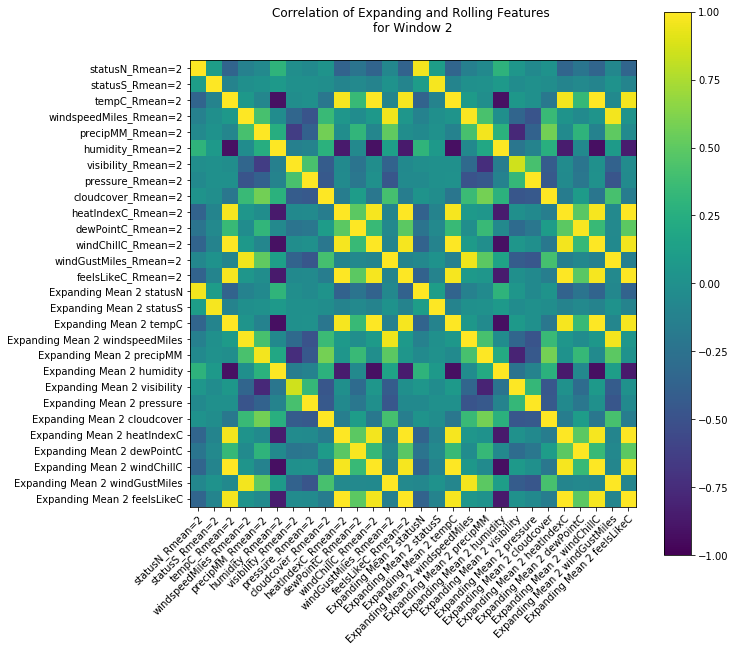

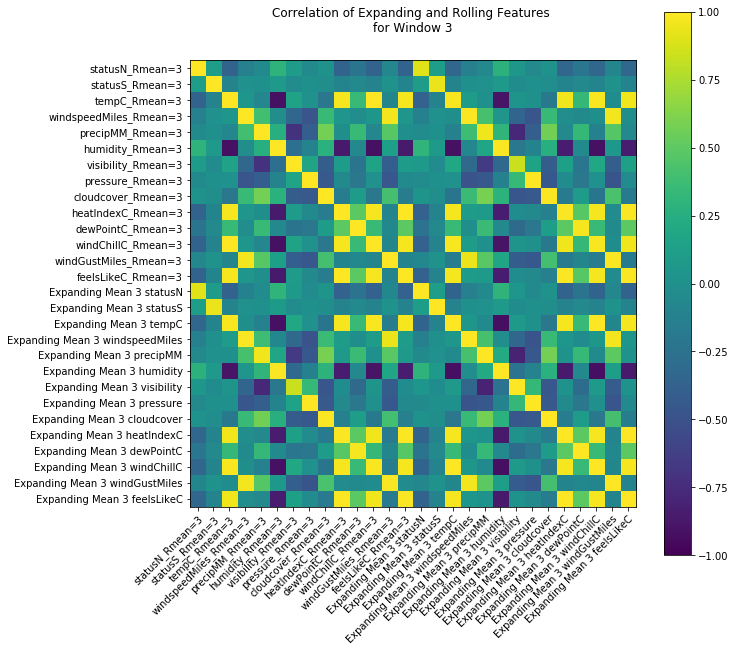

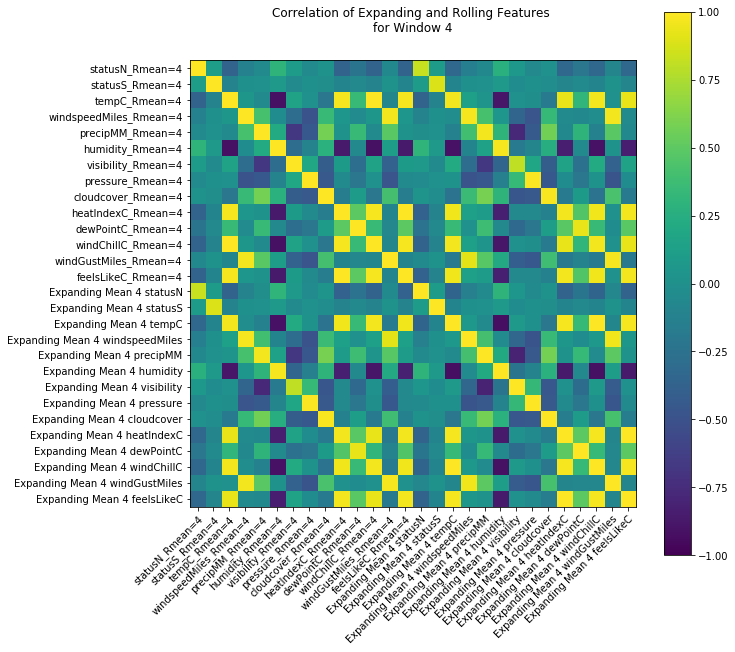

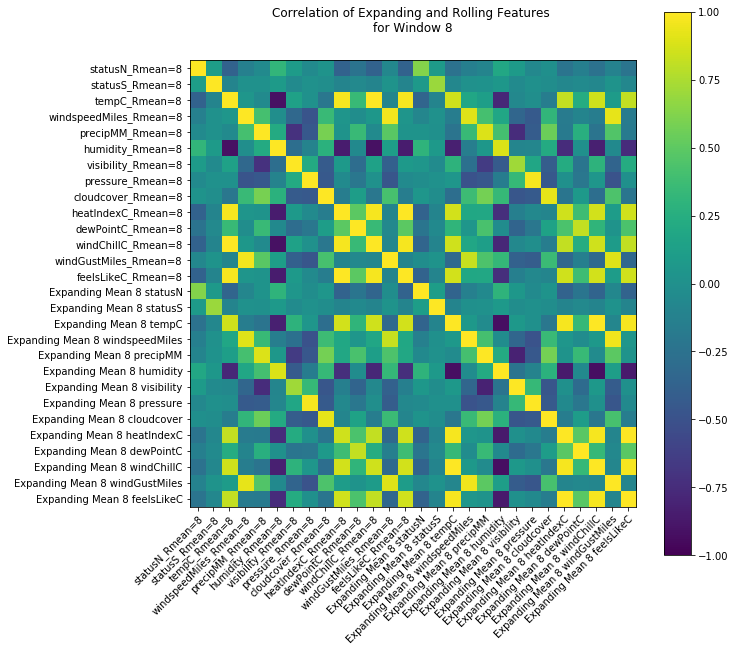

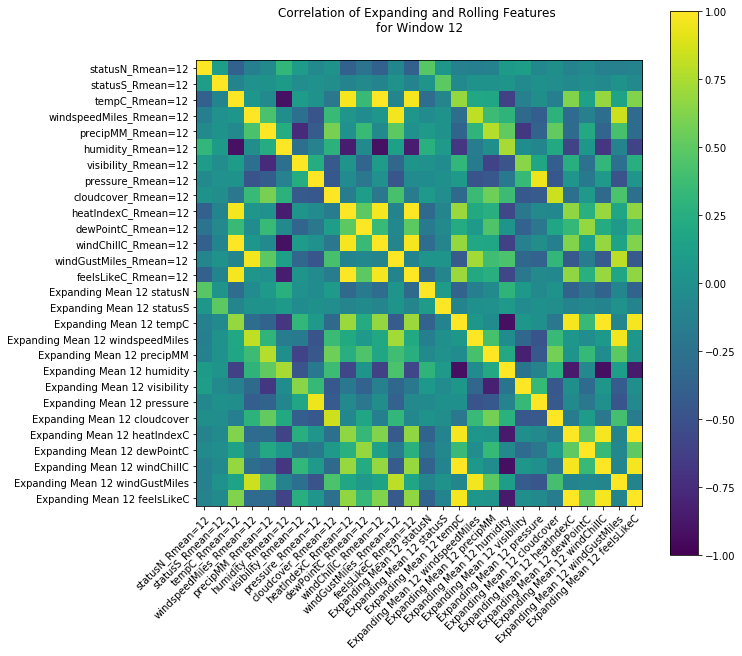

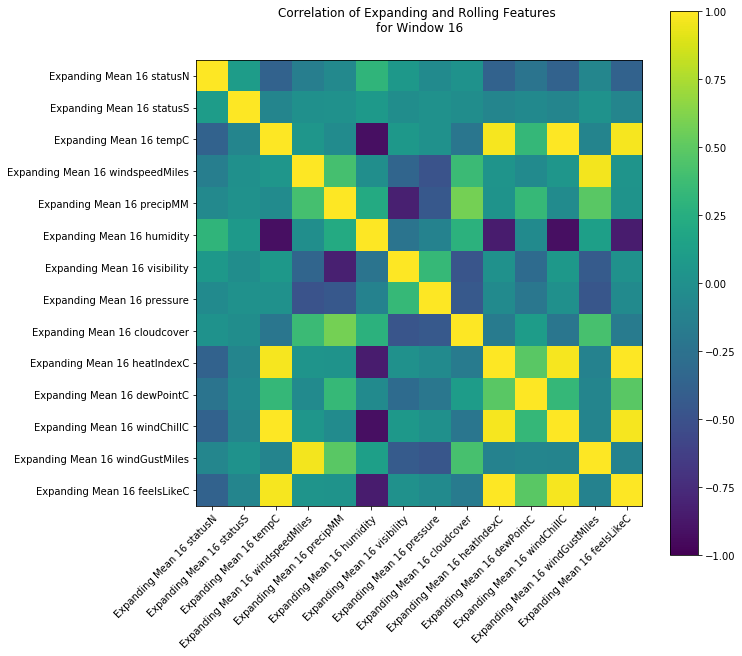

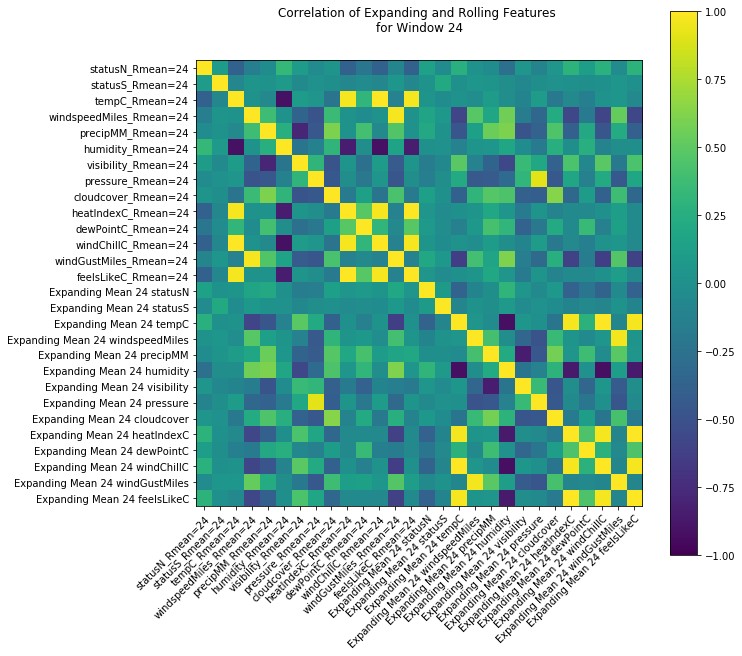

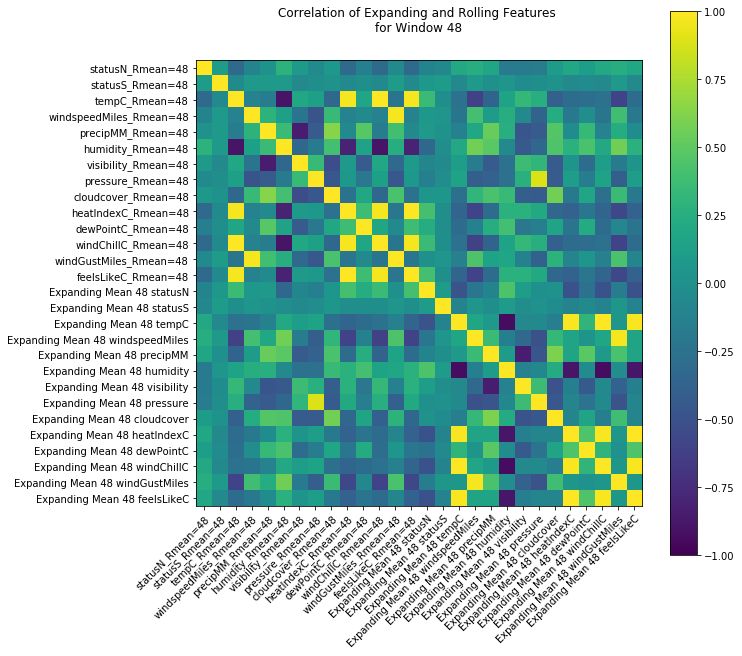

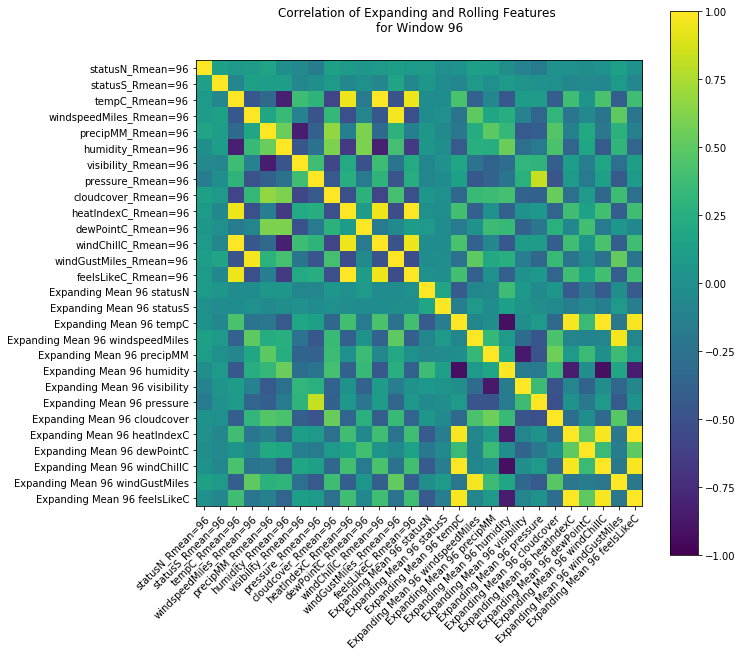

In [27]:
# WINDOWS = []
for w in WINDOWS:
    cor = get_corrdataset_from_window(w)
    getHeatMap(cor, "Correlation of Expanding and Rolling Features \nfor Window " + str(w), 10,10, cor.columns, cor.columns)

In [13]:
for w in WINDOWS:
    cor = get_corrdataset_from_window(w)
    print(cor.head())
#     plt.bar(COL, cor[1])
#     plt.title(ROAD + " "  + STAT + "Window " + str(EM))
#     plt.xticks(rotation='vertical')
#     plt.rcParams["figure.figsize"] = 5,5
#     plt.yticks(np.arange(-0.3, 1, 0.1))
#     plt.show()
#     getHeatMap(cor, "Correlation of Expanding and Rolling Features \nfor Window " + str(w), 10,10, cor.columns, cor.columns)

                        statusN_Rmean=2  statusS_Rmean=2  tempC_Rmean=2  \
statusN_Rmean=2                1.000000         0.110577      -0.358190   
statusS_Rmean=2                0.110577         1.000000      -0.102417   
tempC_Rmean=2                 -0.358190        -0.102417       1.000000   
windspeedMiles_Rmean=2        -0.119625        -0.000122       0.066173   
precipMM_Rmean=2              -0.059114         0.016189      -0.079628   

                        windspeedMiles_Rmean=2  precipMM_Rmean=2  \
statusN_Rmean=2                      -0.119625         -0.059114   
statusS_Rmean=2                      -0.000122          0.016189   
tempC_Rmean=2                         0.066173         -0.079628   
windspeedMiles_Rmean=2                1.000000          0.421718   
precipMM_Rmean=2                      0.421718          1.000000   

                        humidity_Rmean=2  visibility_Rmean=2  \
statusN_Rmean=2                 0.300788           -0.008633   
statusS_Rmea

                        statusN_Rmean=4  statusS_Rmean=4  tempC_Rmean=4  \
statusN_Rmean=4                1.000000         0.111997      -0.363682   
statusS_Rmean=4                0.111997         1.000000      -0.101612   
tempC_Rmean=4                 -0.363682        -0.101612       1.000000   
windspeedMiles_Rmean=4        -0.120038         0.004834       0.060219   
precipMM_Rmean=4              -0.039898         0.012453      -0.041642   

                        windspeedMiles_Rmean=4  precipMM_Rmean=4  \
statusN_Rmean=4                      -0.120038         -0.039898   
statusS_Rmean=4                       0.004834          0.012453   
tempC_Rmean=4                         0.060219         -0.041642   
windspeedMiles_Rmean=4                1.000000          0.414101   
precipMM_Rmean=4                      0.414101          1.000000   

                        humidity_Rmean=4  visibility_Rmean=4  \
statusN_Rmean=4                 0.304275            0.094912   
statusS_Rmea

                         statusN_Rmean=12  statusS_Rmean=12  tempC_Rmean=12  \
statusN_Rmean=12                 1.000000          0.115780       -0.378654   
statusS_Rmean=12                 0.115780          1.000000       -0.096368   
tempC_Rmean=12                  -0.378654         -0.096368        1.000000   
windspeedMiles_Rmean=12         -0.137493          0.014447        0.052383   
precipMM_Rmean=12               -0.054124          0.021558       -0.051942   

                         windspeedMiles_Rmean=12  precipMM_Rmean=12  \
statusN_Rmean=12                       -0.137493          -0.054124   
statusS_Rmean=12                        0.014447           0.021558   
tempC_Rmean=12                          0.052383          -0.051942   
windspeedMiles_Rmean=12                 1.000000           0.422206   
precipMM_Rmean=12                       0.422206           1.000000   

                         humidity_Rmean=12  visibility_Rmean=12  \
statusN_Rmean=12               

                         statusN_Rmean=24  statusS_Rmean=24  tempC_Rmean=24  \
statusN_Rmean=24                 1.000000          0.101400       -0.377605   
statusS_Rmean=24                 0.101400          1.000000       -0.074097   
tempC_Rmean=24                  -0.377605         -0.074097        1.000000   
windspeedMiles_Rmean=24         -0.142006          0.035041        0.024334   
precipMM_Rmean=24               -0.028397          0.025328       -0.057063   

                         windspeedMiles_Rmean=24  precipMM_Rmean=24  \
statusN_Rmean=24                       -0.142006          -0.028397   
statusS_Rmean=24                        0.035041           0.025328   
tempC_Rmean=24                          0.024334          -0.057063   
windspeedMiles_Rmean=24                 1.000000           0.376391   
precipMM_Rmean=24                       0.376391           1.000000   

                         humidity_Rmean=24  visibility_Rmean=24  \
statusN_Rmean=24               

                         statusN_Rmean=96  statusS_Rmean=96  tempC_Rmean=96  \
statusN_Rmean=96                 1.000000          0.126367        0.071530   
statusS_Rmean=96                 0.126367          1.000000       -0.077440   
tempC_Rmean=96                   0.071530         -0.077440        1.000000   
windspeedMiles_Rmean=96          0.106403          0.138602       -0.450695   
precipMM_Rmean=96                0.171692          0.116617       -0.306163   

                         windspeedMiles_Rmean=96  precipMM_Rmean=96  \
statusN_Rmean=96                        0.106403           0.171692   
statusS_Rmean=96                        0.138602           0.116617   
tempC_Rmean=96                         -0.450695          -0.306163   
windspeedMiles_Rmean=96                 1.000000           0.175600   
precipMM_Rmean=96                       0.175600           1.000000   

                         humidity_Rmean=96  visibility_Rmean=96  \
statusN_Rmean=96               

#### Rolling Only - All

In [35]:
# WINDOWS = [2]
for x in WINDOWS:
    merge = corr_all
    features = merge.columns.values.tolist()
    for n in range(0, len(merge.columns.values)):
        if "_Rmean" not in features[n]:
            merge = merge.drop([features[n]], axis = 1)
        else:
            if (isWindow(x,features[n]) is False):
                merge = merge.drop([features[n]], axis=1)             
#     getHeatMap(merge, "Correlation of Rolling Features to all other Features", 100,20, merge.columns, corr_all.columns)
    merge.to_csv(PATH + "Expanding and Rolling Result\\Correlated_Rolling_Window_" + str(x) + ".csv", encoding='utf-8',index=False)
    print("DONE Window " + str(x) )

print("DONE ALL")

DONE Window 2
DONE Window 3
DONE Window 4
DONE Window 8
DONE Window 12
DONE Window 16
DONE Window 24
DONE Window 48
DONE Window 96
DONE ALL


#### Rolling Only - Expanding

#### Expanding Only - All

In [85]:
Features = merge.columns.values.tolist()
windows = [2,3,4, 8, 12, 16, 24, 48, 96]
print(windows)
merge.head()
for x in windows:
    merge = mergeLoad
    print("GENERATING Window " + str(x) )
    Features = merge.columns.values.tolist()
    for n in range(1, len(merge.columns.values)):
        if "Expanding" not in Features[n]:
            merge = merge.drop([Features[n]], axis = 1)
        else:
            if ("="+ str(x)) in Features[n]:
                if Features[n].endswith(str(x),10):
                    continue
                else:
    #                 print(merge.columns.values.tolist())
                    merge = merge.drop([Features[n]], axis=1)
            elif " "+str(x)+" " in Features[n]:
                continue
            else:
                merge = merge.drop([Features[n]], axis = 1)
            
            
    
    merge.to_csv(PATH + "Expanding and Rolling Result\\Correlated_Expanding_Window_" + str(x) + ".csv", encoding='utf-8',index=False)
    print("DONE Window " + str(x) )
print("DONE ALL")



[2, 3, 4, 8, 12, 16, 24, 48, 96]
GENERATING Window 2
DONE Window 2
GENERATING Window 3
DONE Window 3
GENERATING Window 4
DONE Window 4
GENERATING Window 8
DONE Window 8
GENERATING Window 12
DONE Window 12
GENERATING Window 16
DONE Window 16
GENERATING Window 24
DONE Window 24
GENERATING Window 48
DONE Window 48
GENERATING Window 96
DONE Window 96
DONE ALL


#### Expanding Only - Rolling

In [37]:
merged_dataset.columns

Index(['statusN', 'statusS', 'tempC', 'windspeedMiles', 'precipMM', 'humidity',
       'visibility', 'pressure', 'cloudcover', 'heatIndexC',
       ...
       'Expanding Mean 96 windGustMiles', 'Expanding Mean 2 feelsLikeC',
       'Expanding Mean 3 feelsLikeC', 'Expanding Mean 4 feelsLikeC',
       'Expanding Mean 8 feelsLikeC', 'Expanding Mean 12 feelsLikeC',
       'Expanding Mean 16 feelsLikeC', 'Expanding Mean 24 feelsLikeC',
       'Expanding Mean 48 feelsLikeC', 'Expanding Mean 96 feelsLikeC'],
      dtype='object', length=266)

#### Per Variable - All

In [31]:
merge = mergeLoad
variable = "tempC"
windows = [2,3,4, 8, 12, 16, 24, 48, 96]
Features = merge.columns.values.tolist()
col = merge['0'].tolist()
forRemoval = []
for n in range(1, len(Features)):
    if variable not in Features[n]:
        merge = merge.drop([Features[n]], axis = 1)
        forRemoval.append(n)
        col.remove(Features[n])
    else:
        print(n)
        
print(forRemoval)

Features = merge.columns.values.tolist()

for n in range(1, len(Features)):
    merge[Features[n]] = merge[Features[n]].tolist()
    for x in reversed(forRemoval):
        print(type(merge[Features[n]]))
        print(Features[n])
        print(x)
        merge[Features[n]].drop(merge[Features[n]].index[x-1])

merge.to_csv(PATH + "Expanding and Rolling Result\\Correlated_ExpandingRolling_Window_" + variable + ".csv", encoding='utf-8',index=False)

print("DONE ALL")



3
33
45
57
69
81
93
105
117
129
159
160
161
162
163
164
165
166
167
[1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 2

tempC_Rmean=2
147
<class 'pandas.core.series.Series'>
tempC_Rmean=2
146
<class 'pandas.core.series.Series'>
tempC_Rmean=2
145
<class 'pandas.core.series.Series'>
tempC_Rmean=2
144
<class 'pandas.core.series.Series'>
tempC_Rmean=2
143
<class 'pandas.core.series.Series'>
tempC_Rmean=2
142
<class 'pandas.core.series.Series'>
tempC_Rmean=2
141
<class 'pandas.core.series.Series'>
tempC_Rmean=2
140
<class 'pandas.core.series.Series'>
tempC_Rmean=2
139
<class 'pandas.core.series.Series'>
tempC_Rmean=2
138
<class 'pandas.core.series.Series'>
tempC_Rmean=2
137
<class 'pandas.core.series.Series'>
tempC_Rmean=2
136
<class 'pandas.core.series.Series'>
tempC_Rmean=2
135
<class 'pandas.core.series.Series'>
tempC_Rmean=2
134
<class 'pandas.core.series.Series'>
tempC_Rmean=2
133
<class 'pandas.core.series.Series'>
tempC_Rmean=2
132
<class 'pandas.core.series.Series'>
tempC_Rmean=2
131
<class 'pandas.core.series.Series'>
tempC_Rmean=2
130
<class 'pandas.core.series.Series'>
tempC_Rmean=2
128
<class 'pa

<class 'pandas.core.series.Series'>
tempC_Rmean=3
47
<class 'pandas.core.series.Series'>
tempC_Rmean=3
46
<class 'pandas.core.series.Series'>
tempC_Rmean=3
44
<class 'pandas.core.series.Series'>
tempC_Rmean=3
43
<class 'pandas.core.series.Series'>
tempC_Rmean=3
42
<class 'pandas.core.series.Series'>
tempC_Rmean=3
41
<class 'pandas.core.series.Series'>
tempC_Rmean=3
40
<class 'pandas.core.series.Series'>
tempC_Rmean=3
39
<class 'pandas.core.series.Series'>
tempC_Rmean=3
38
<class 'pandas.core.series.Series'>
tempC_Rmean=3
37
<class 'pandas.core.series.Series'>
tempC_Rmean=3
36
<class 'pandas.core.series.Series'>
tempC_Rmean=3
35
<class 'pandas.core.series.Series'>
tempC_Rmean=3
34
<class 'pandas.core.series.Series'>
tempC_Rmean=3
32
<class 'pandas.core.series.Series'>
tempC_Rmean=3
31
<class 'pandas.core.series.Series'>
tempC_Rmean=3
30
<class 'pandas.core.series.Series'>
tempC_Rmean=3
29
<class 'pandas.core.series.Series'>
tempC_Rmean=3
28
<class 'pandas.core.series.Series'>
tempC_Rmea

tempC_Rmean=8
171
<class 'pandas.core.series.Series'>
tempC_Rmean=8
170
<class 'pandas.core.series.Series'>
tempC_Rmean=8
169
<class 'pandas.core.series.Series'>
tempC_Rmean=8
168
<class 'pandas.core.series.Series'>
tempC_Rmean=8
158
<class 'pandas.core.series.Series'>
tempC_Rmean=8
157
<class 'pandas.core.series.Series'>
tempC_Rmean=8
156
<class 'pandas.core.series.Series'>
tempC_Rmean=8
155
<class 'pandas.core.series.Series'>
tempC_Rmean=8
154
<class 'pandas.core.series.Series'>
tempC_Rmean=8
153
<class 'pandas.core.series.Series'>
tempC_Rmean=8
152
<class 'pandas.core.series.Series'>
tempC_Rmean=8
151
<class 'pandas.core.series.Series'>
tempC_Rmean=8
150
<class 'pandas.core.series.Series'>
tempC_Rmean=8
149
<class 'pandas.core.series.Series'>
tempC_Rmean=8
148
<class 'pandas.core.series.Series'>
tempC_Rmean=8
147
<class 'pandas.core.series.Series'>
tempC_Rmean=8
146
<class 'pandas.core.series.Series'>
tempC_Rmean=8
145
<class 'pandas.core.series.Series'>
tempC_Rmean=8
144
<class 'pa

<class 'pandas.core.series.Series'>
tempC_Rmean=24
156
<class 'pandas.core.series.Series'>
tempC_Rmean=24
155
<class 'pandas.core.series.Series'>
tempC_Rmean=24
154
<class 'pandas.core.series.Series'>
tempC_Rmean=24
153
<class 'pandas.core.series.Series'>
tempC_Rmean=24
152
<class 'pandas.core.series.Series'>
tempC_Rmean=24
151
<class 'pandas.core.series.Series'>
tempC_Rmean=24
150
<class 'pandas.core.series.Series'>
tempC_Rmean=24
149
<class 'pandas.core.series.Series'>
tempC_Rmean=24
148
<class 'pandas.core.series.Series'>
tempC_Rmean=24
147
<class 'pandas.core.series.Series'>
tempC_Rmean=24
146
<class 'pandas.core.series.Series'>
tempC_Rmean=24
145
<class 'pandas.core.series.Series'>
tempC_Rmean=24
144
<class 'pandas.core.series.Series'>
tempC_Rmean=24
143
<class 'pandas.core.series.Series'>
tempC_Rmean=24
142
<class 'pandas.core.series.Series'>
tempC_Rmean=24
141
<class 'pandas.core.series.Series'>
tempC_Rmean=24
140
<class 'pandas.core.series.Series'>
tempC_Rmean=24
139
<class 'pa

<class 'pandas.core.series.Series'>
tempC_Rmean=32
4
<class 'pandas.core.series.Series'>
tempC_Rmean=32
2
<class 'pandas.core.series.Series'>
tempC_Rmean=32
1
<class 'pandas.core.series.Series'>
tempC_Rmean=48
248
<class 'pandas.core.series.Series'>
tempC_Rmean=48
247
<class 'pandas.core.series.Series'>
tempC_Rmean=48
246
<class 'pandas.core.series.Series'>
tempC_Rmean=48
245
<class 'pandas.core.series.Series'>
tempC_Rmean=48
244
<class 'pandas.core.series.Series'>
tempC_Rmean=48
243
<class 'pandas.core.series.Series'>
tempC_Rmean=48
242
<class 'pandas.core.series.Series'>
tempC_Rmean=48
241
<class 'pandas.core.series.Series'>
tempC_Rmean=48
240
<class 'pandas.core.series.Series'>
tempC_Rmean=48
239
<class 'pandas.core.series.Series'>
tempC_Rmean=48
238
<class 'pandas.core.series.Series'>
tempC_Rmean=48
237
<class 'pandas.core.series.Series'>
tempC_Rmean=48
236
<class 'pandas.core.series.Series'>
tempC_Rmean=48
235
<class 'pandas.core.series.Series'>
tempC_Rmean=48
234
<class 'pandas.c

228
<class 'pandas.core.series.Series'>
Expanding Mean 2 tempC
227
<class 'pandas.core.series.Series'>
Expanding Mean 2 tempC
226
<class 'pandas.core.series.Series'>
Expanding Mean 2 tempC
225
<class 'pandas.core.series.Series'>
Expanding Mean 2 tempC
224
<class 'pandas.core.series.Series'>
Expanding Mean 2 tempC
223
<class 'pandas.core.series.Series'>
Expanding Mean 2 tempC
222
<class 'pandas.core.series.Series'>
Expanding Mean 2 tempC
221
<class 'pandas.core.series.Series'>
Expanding Mean 2 tempC
220
<class 'pandas.core.series.Series'>
Expanding Mean 2 tempC
219
<class 'pandas.core.series.Series'>
Expanding Mean 2 tempC
218
<class 'pandas.core.series.Series'>
Expanding Mean 2 tempC
217
<class 'pandas.core.series.Series'>
Expanding Mean 2 tempC
216
<class 'pandas.core.series.Series'>
Expanding Mean 2 tempC
215
<class 'pandas.core.series.Series'>
Expanding Mean 2 tempC
214
<class 'pandas.core.series.Series'>
Expanding Mean 2 tempC
213
<class 'pandas.core.series.Series'>
Expanding Mean 

Expanding Mean 3 tempC
88
<class 'pandas.core.series.Series'>
Expanding Mean 3 tempC
87
<class 'pandas.core.series.Series'>
Expanding Mean 3 tempC
86
<class 'pandas.core.series.Series'>
Expanding Mean 3 tempC
85
<class 'pandas.core.series.Series'>
Expanding Mean 3 tempC
84
<class 'pandas.core.series.Series'>
Expanding Mean 3 tempC
83
<class 'pandas.core.series.Series'>
Expanding Mean 3 tempC
82
<class 'pandas.core.series.Series'>
Expanding Mean 3 tempC
80
<class 'pandas.core.series.Series'>
Expanding Mean 3 tempC
79
<class 'pandas.core.series.Series'>
Expanding Mean 3 tempC
78
<class 'pandas.core.series.Series'>
Expanding Mean 3 tempC
77
<class 'pandas.core.series.Series'>
Expanding Mean 3 tempC
76
<class 'pandas.core.series.Series'>
Expanding Mean 3 tempC
75
<class 'pandas.core.series.Series'>
Expanding Mean 3 tempC
74
<class 'pandas.core.series.Series'>
Expanding Mean 3 tempC
73
<class 'pandas.core.series.Series'>
Expanding Mean 3 tempC
72
<class 'pandas.core.series.Series'>
Expandin

209
<class 'pandas.core.series.Series'>
Expanding Mean 8 tempC
208
<class 'pandas.core.series.Series'>
Expanding Mean 8 tempC
207
<class 'pandas.core.series.Series'>
Expanding Mean 8 tempC
206
<class 'pandas.core.series.Series'>
Expanding Mean 8 tempC
205
<class 'pandas.core.series.Series'>
Expanding Mean 8 tempC
204
<class 'pandas.core.series.Series'>
Expanding Mean 8 tempC
203
<class 'pandas.core.series.Series'>
Expanding Mean 8 tempC
202
<class 'pandas.core.series.Series'>
Expanding Mean 8 tempC
201
<class 'pandas.core.series.Series'>
Expanding Mean 8 tempC
200
<class 'pandas.core.series.Series'>
Expanding Mean 8 tempC
199
<class 'pandas.core.series.Series'>
Expanding Mean 8 tempC
198
<class 'pandas.core.series.Series'>
Expanding Mean 8 tempC
197
<class 'pandas.core.series.Series'>
Expanding Mean 8 tempC
196
<class 'pandas.core.series.Series'>
Expanding Mean 8 tempC
195
<class 'pandas.core.series.Series'>
Expanding Mean 8 tempC
194
<class 'pandas.core.series.Series'>
Expanding Mean 

Expanding Mean 16 tempC
193
<class 'pandas.core.series.Series'>
Expanding Mean 16 tempC
192
<class 'pandas.core.series.Series'>
Expanding Mean 16 tempC
191
<class 'pandas.core.series.Series'>
Expanding Mean 16 tempC
190
<class 'pandas.core.series.Series'>
Expanding Mean 16 tempC
189
<class 'pandas.core.series.Series'>
Expanding Mean 16 tempC
188
<class 'pandas.core.series.Series'>
Expanding Mean 16 tempC
187
<class 'pandas.core.series.Series'>
Expanding Mean 16 tempC
186
<class 'pandas.core.series.Series'>
Expanding Mean 16 tempC
185
<class 'pandas.core.series.Series'>
Expanding Mean 16 tempC
184
<class 'pandas.core.series.Series'>
Expanding Mean 16 tempC
183
<class 'pandas.core.series.Series'>
Expanding Mean 16 tempC
182
<class 'pandas.core.series.Series'>
Expanding Mean 16 tempC
181
<class 'pandas.core.series.Series'>
Expanding Mean 16 tempC
180
<class 'pandas.core.series.Series'>
Expanding Mean 16 tempC
179
<class 'pandas.core.series.Series'>
Expanding Mean 16 tempC
178
<class 'pand

212
<class 'pandas.core.series.Series'>
Expanding Mean 48 tempC
211
<class 'pandas.core.series.Series'>
Expanding Mean 48 tempC
210
<class 'pandas.core.series.Series'>
Expanding Mean 48 tempC
209
<class 'pandas.core.series.Series'>
Expanding Mean 48 tempC
208
<class 'pandas.core.series.Series'>
Expanding Mean 48 tempC
207
<class 'pandas.core.series.Series'>
Expanding Mean 48 tempC
206
<class 'pandas.core.series.Series'>
Expanding Mean 48 tempC
205
<class 'pandas.core.series.Series'>
Expanding Mean 48 tempC
204
<class 'pandas.core.series.Series'>
Expanding Mean 48 tempC
203
<class 'pandas.core.series.Series'>
Expanding Mean 48 tempC
202
<class 'pandas.core.series.Series'>
Expanding Mean 48 tempC
201
<class 'pandas.core.series.Series'>
Expanding Mean 48 tempC
200
<class 'pandas.core.series.Series'>
Expanding Mean 48 tempC
199
<class 'pandas.core.series.Series'>
Expanding Mean 48 tempC
198
<class 'pandas.core.series.Series'>
Expanding Mean 48 tempC
197
<class 'pandas.core.series.Series'>


#### Per Variable - Rolling and Expanding

dt
Rolling W Done
Expanding Done


C:\Users\nicol\Anaconda3\lib\site-packages\matplotlib\axes\_base.py:2918: UserWarning: Attempting to set identical left==right results
in singular transformations; automatically expanding.
left=-0.5, right=-0.5
  'left=%s, right=%s') % (left, right))
C:\Users\nicol\Anaconda3\lib\site-packages\matplotlib\axes\_base.py:3239: UserWarning: Attempting to set identical bottom==top results
in singular transformations; automatically expanding.
bottom=-0.5, top=-0.5
  'bottom=%s, top=%s') % (bottom, top))


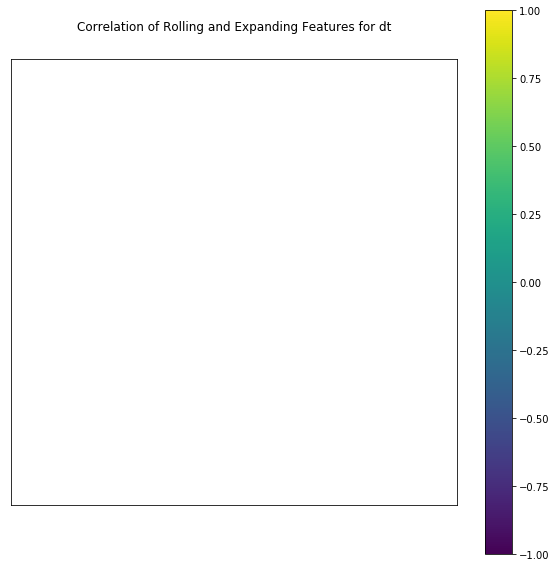

statusN
Rolling W Done
Expanding Done


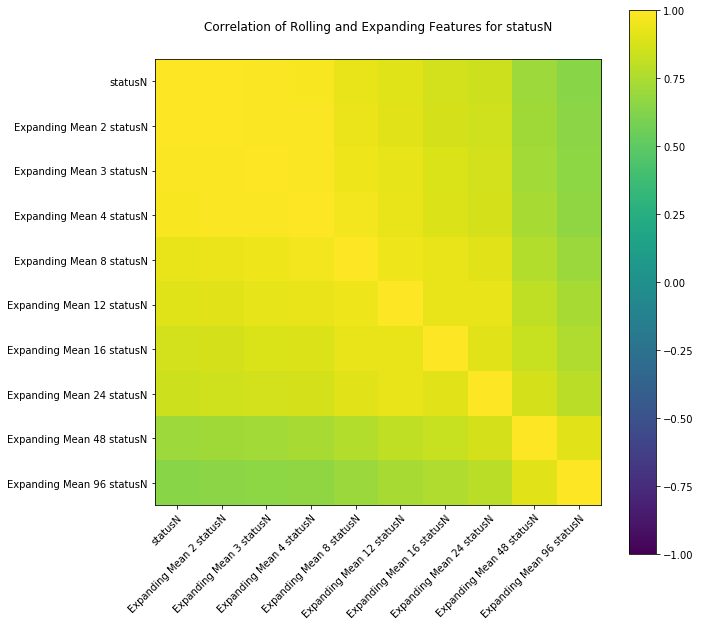

statusS
Rolling W Done
Expanding Done


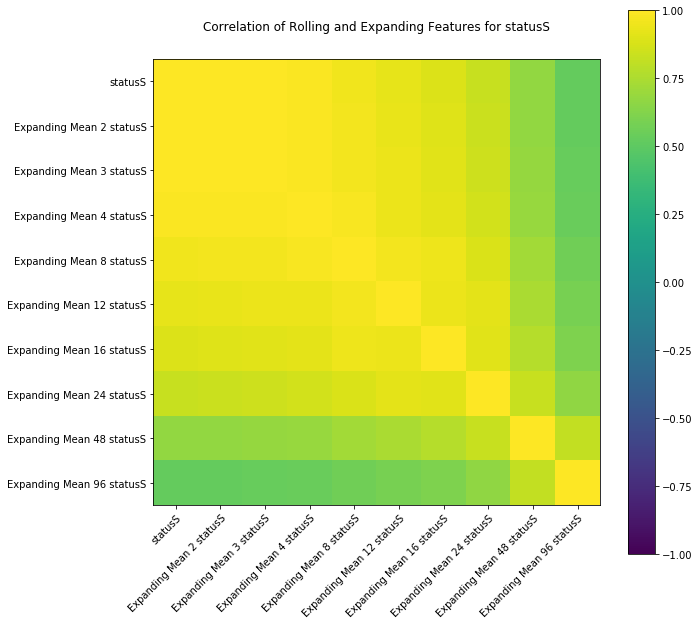

tempC
Rolling W Done
Expanding Done


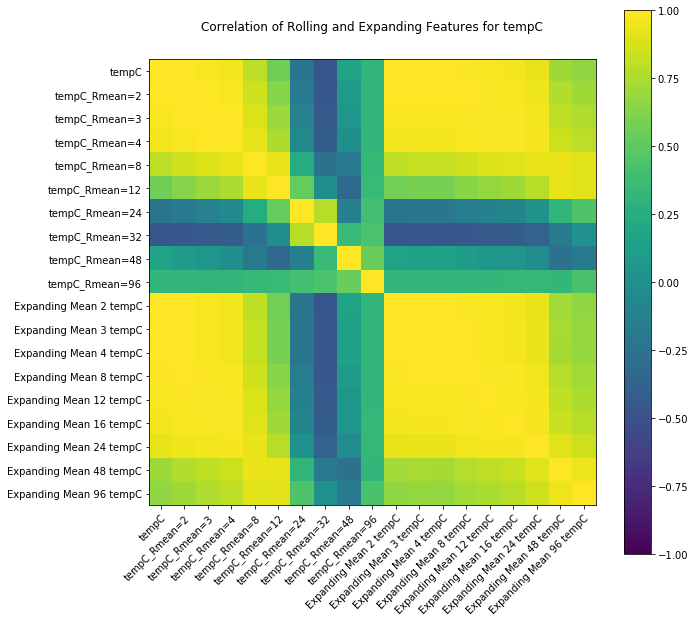

windspeedMiles
Rolling W Done
Expanding Done


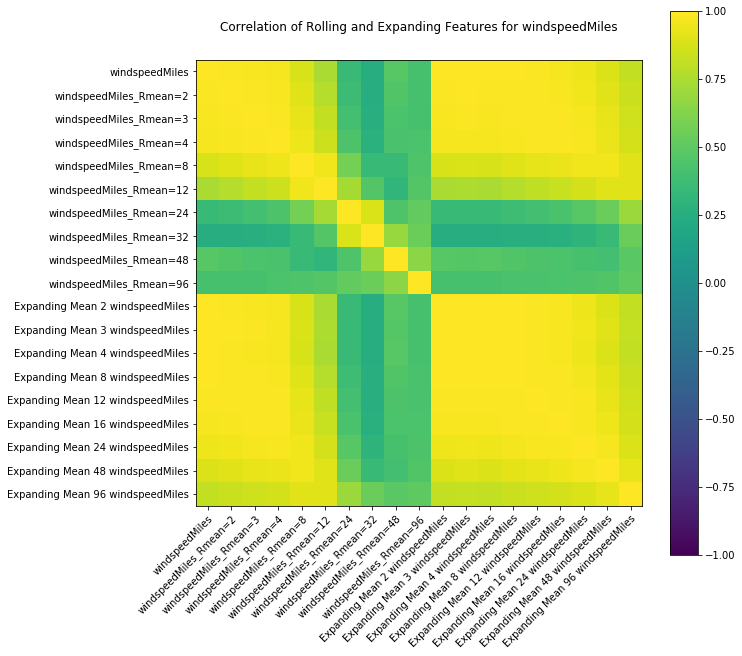

precipMM
Rolling W Done
Expanding Done


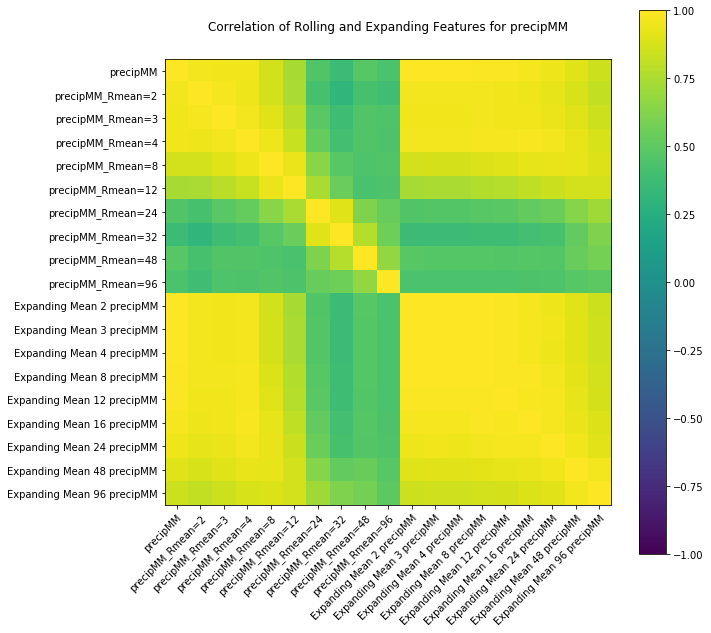

humidity
Rolling W Done
Expanding Done


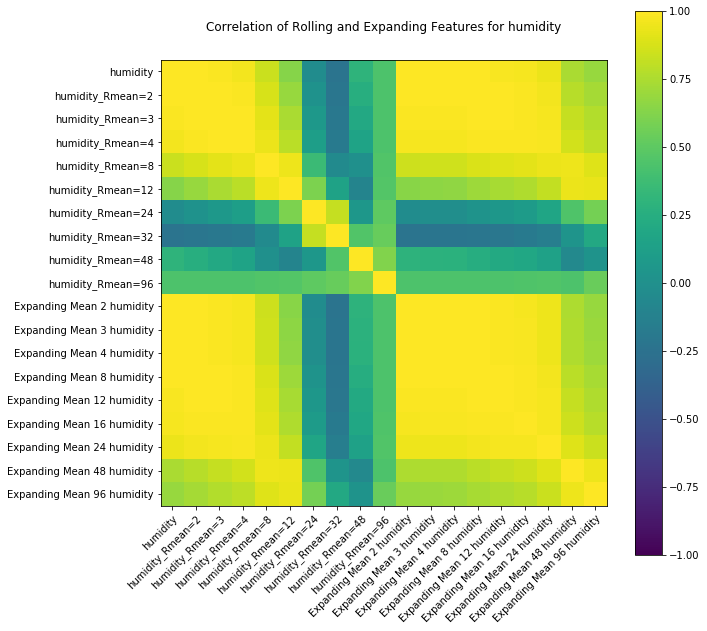

visibility
Rolling W Done
Expanding Done


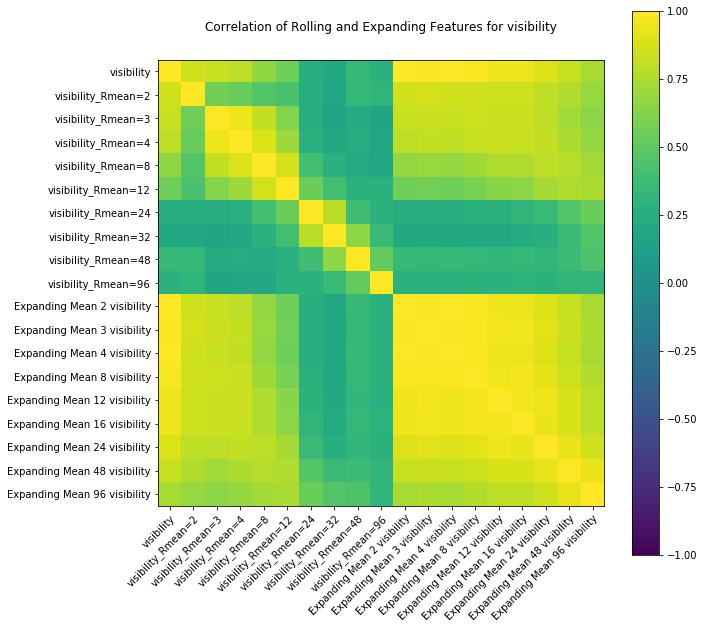

pressure
Rolling W Done
Expanding Done


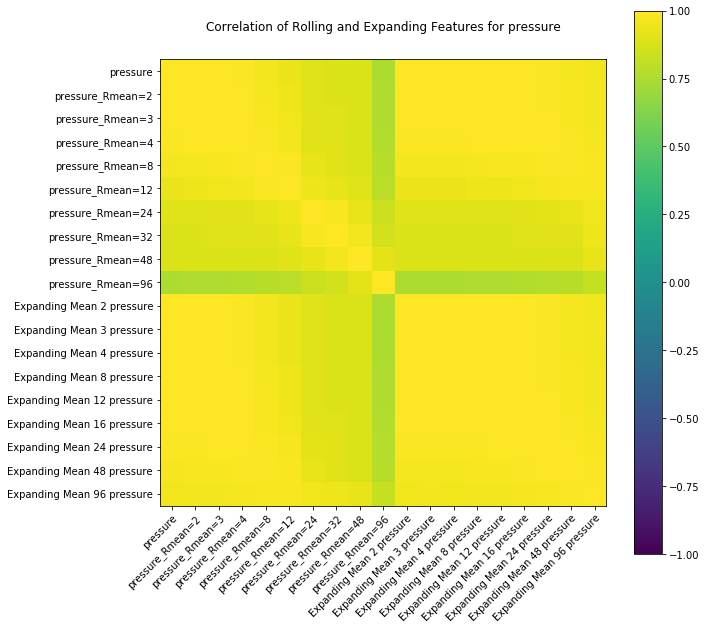

cloudcover
Rolling W Done
Expanding Done


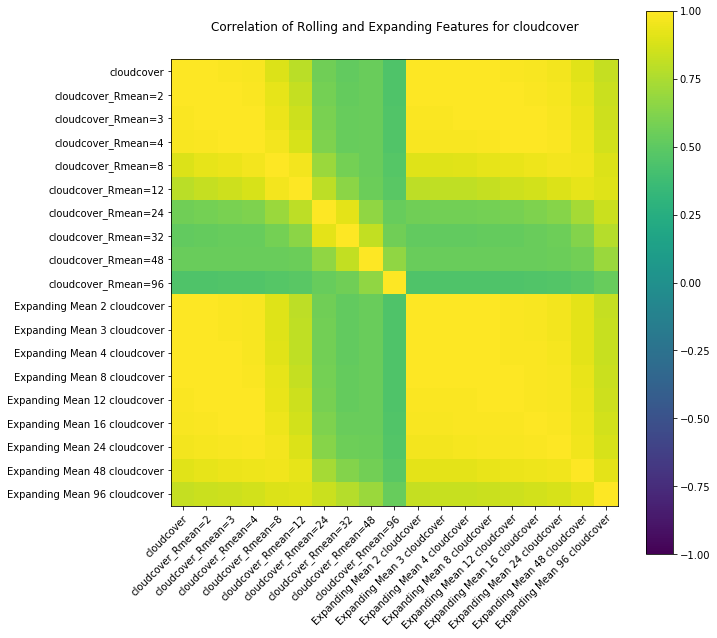

heatIndexC
Rolling W Done
Expanding Done


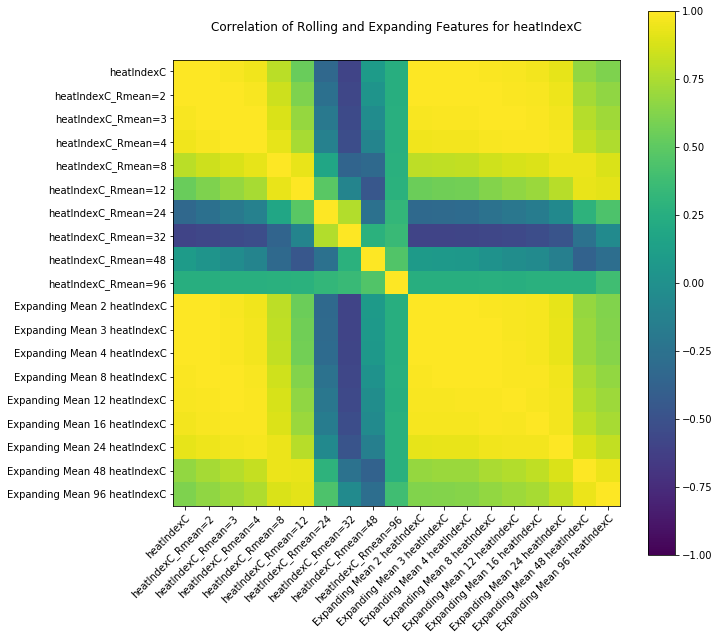

dewPointC
Rolling W Done
Expanding Done


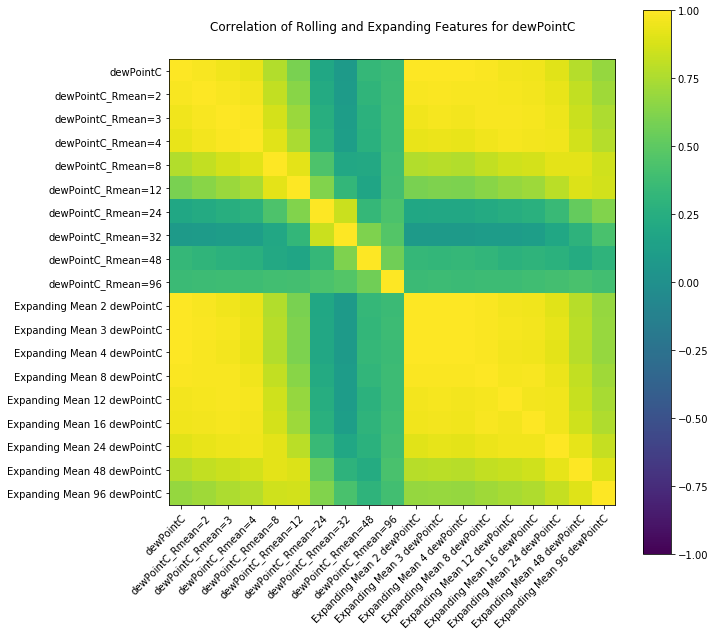

windChillC
Rolling W Done
Expanding Done


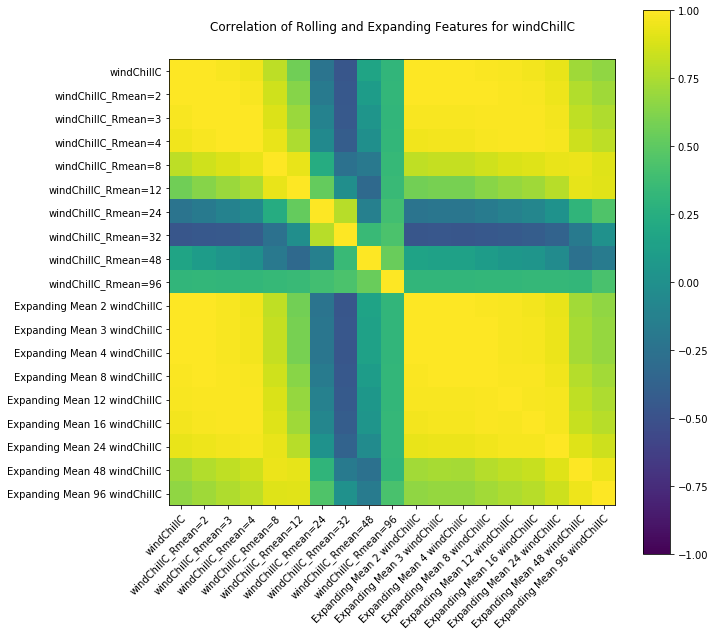

windGustMiles
Rolling W Done
Expanding Done


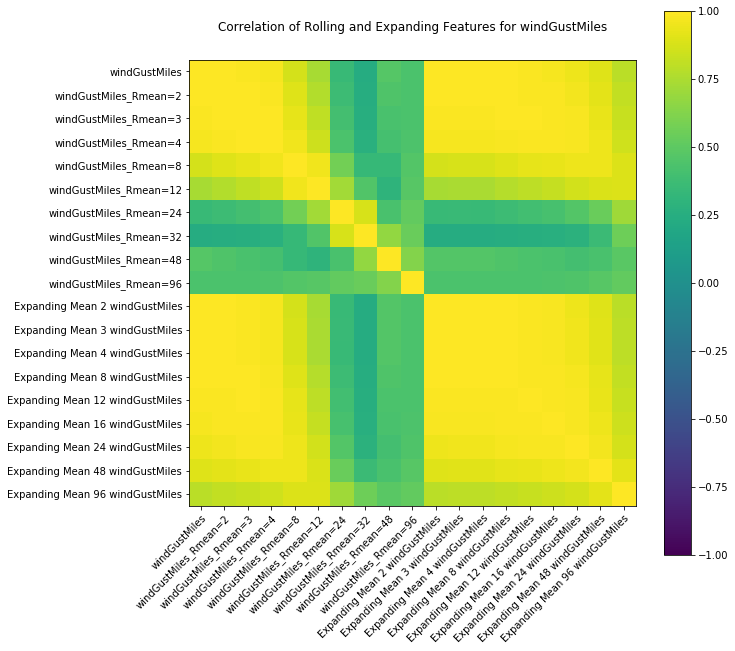

feelsLikeC
Rolling W Done
Expanding Done


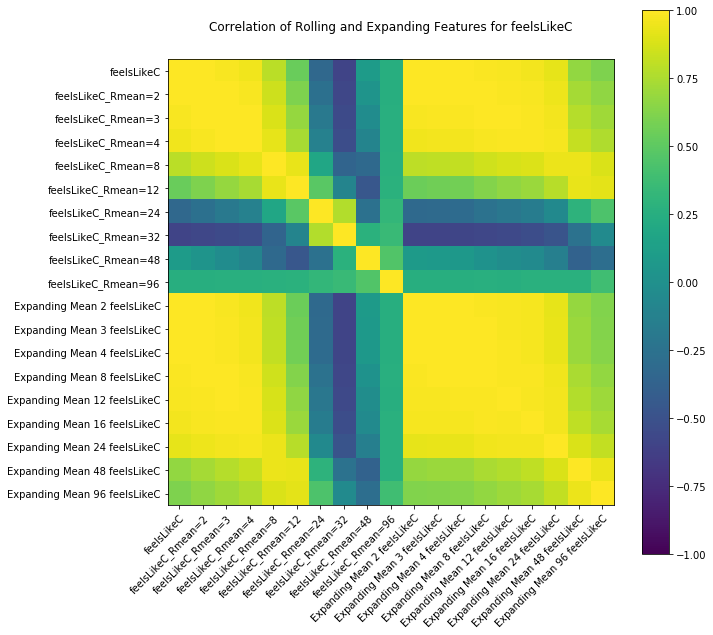

Expanding Min 2 statusN
Rolling W Done
Expanding Done


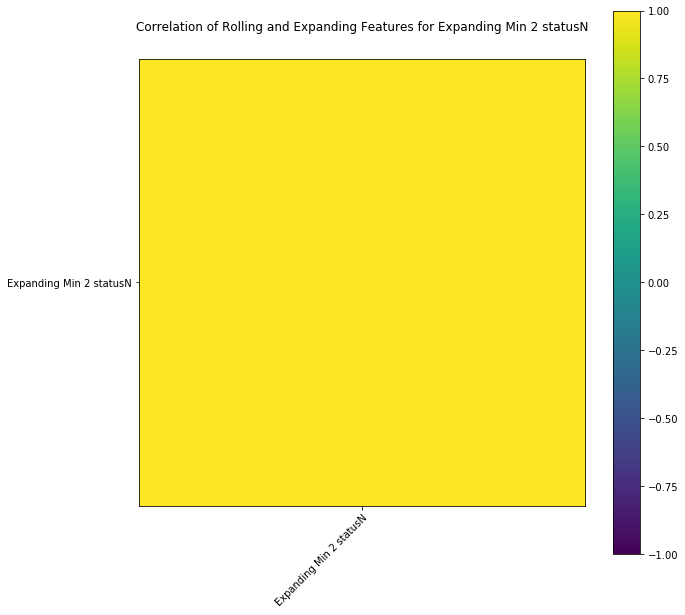

Expanding Max 2 statusN
Rolling W Done
Expanding Done


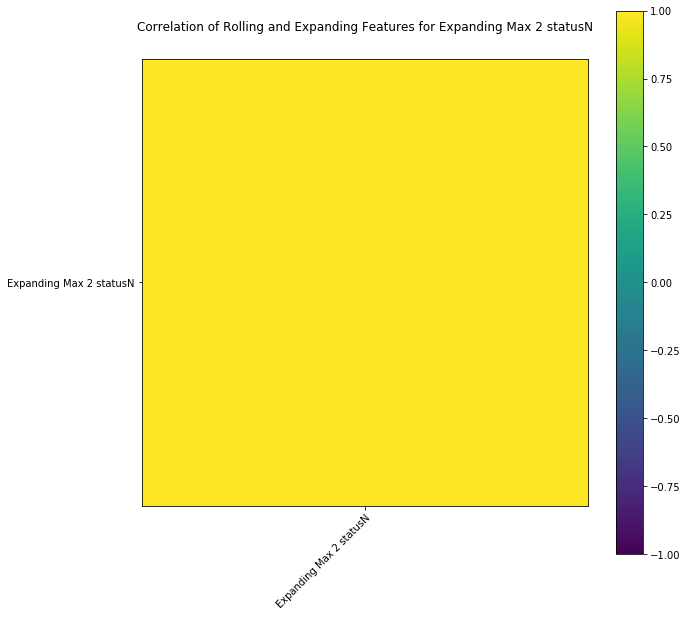

Expanding Sum 2 statusN
Rolling W Done
Expanding Done


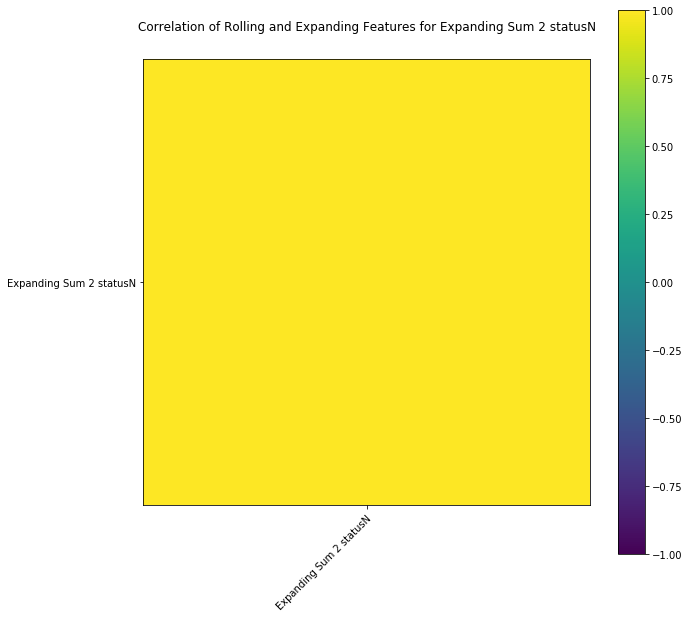

Expanding Mean 2 statusN
Rolling W Done
Expanding Done


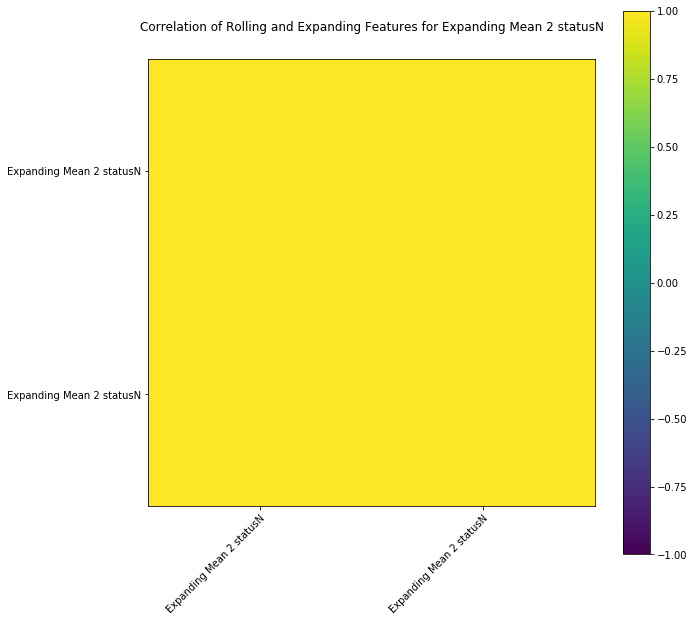

Expanding Min 3 statusN
Rolling W Done
Expanding Done


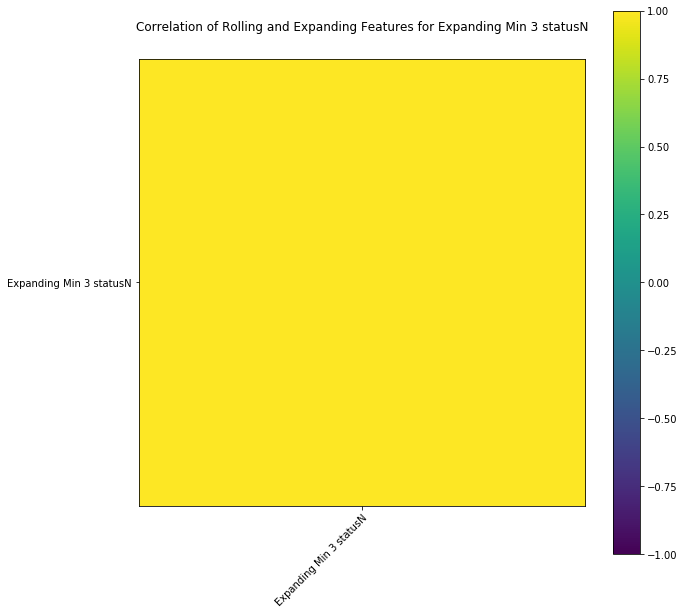

Expanding Max 3 statusN
Rolling W Done
Expanding Done


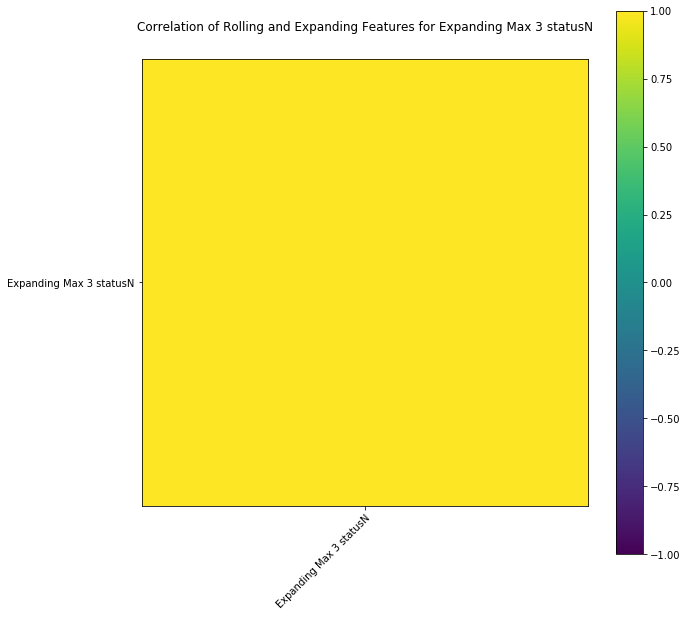

Expanding Sum 3 statusN
Rolling W Done
Expanding Done


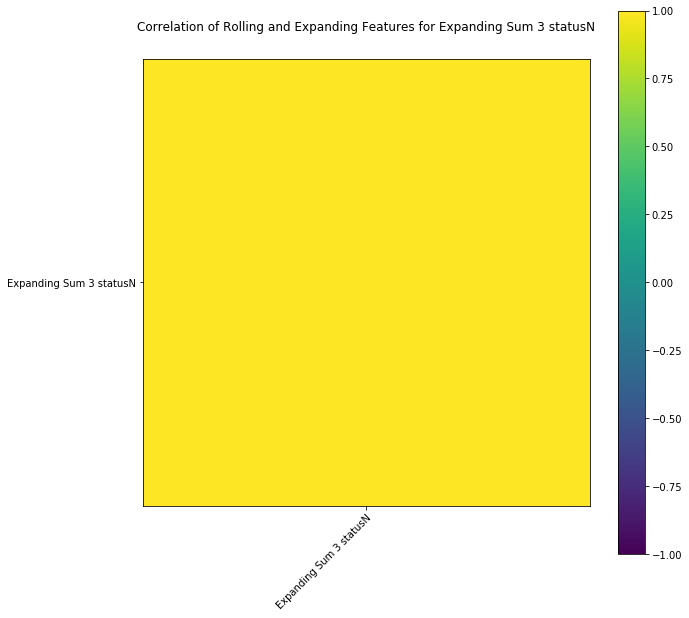

Expanding Mean 3 statusN
Rolling W Done
Expanding Done


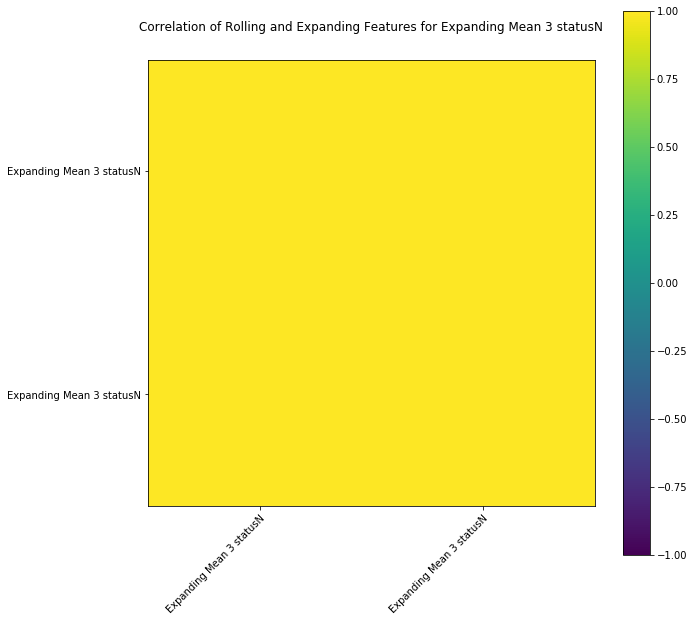

Expanding Min 4 statusN
Rolling W Done
Expanding Done


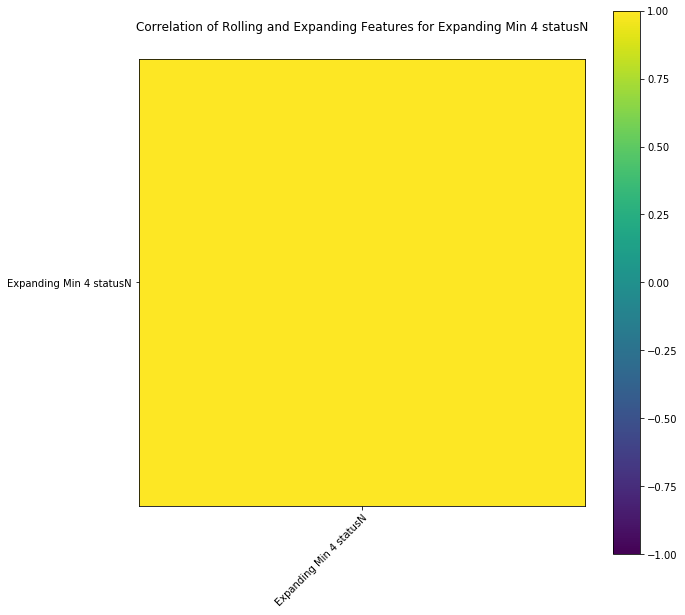

Expanding Max 4 statusN
Rolling W Done
Expanding Done


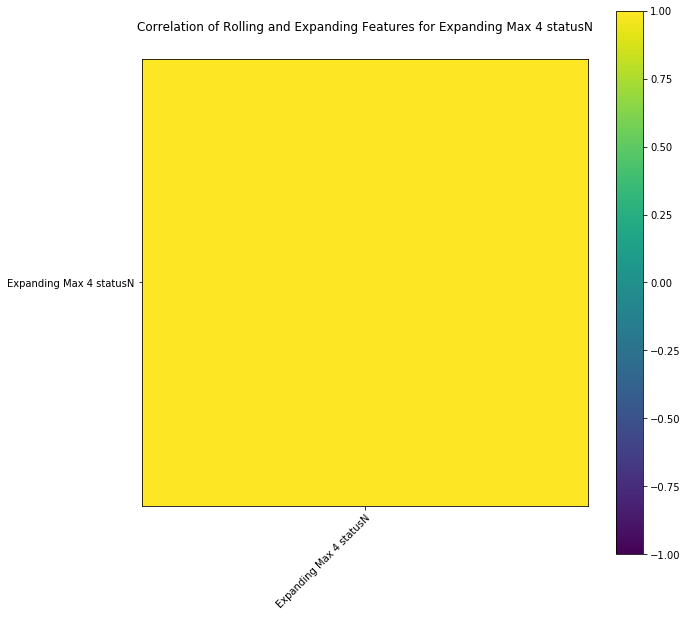

Expanding Sum 4 statusN
Rolling W Done
Expanding Done


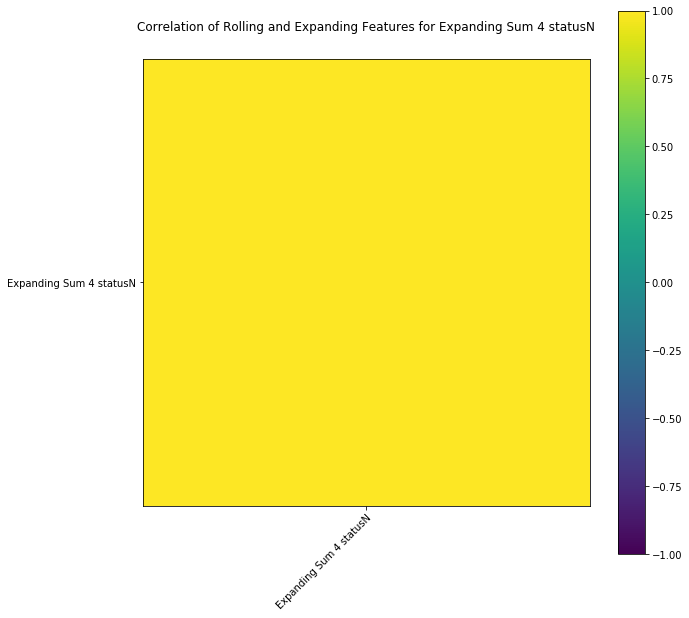

Expanding Mean 4 statusN
Rolling W Done
Expanding Done


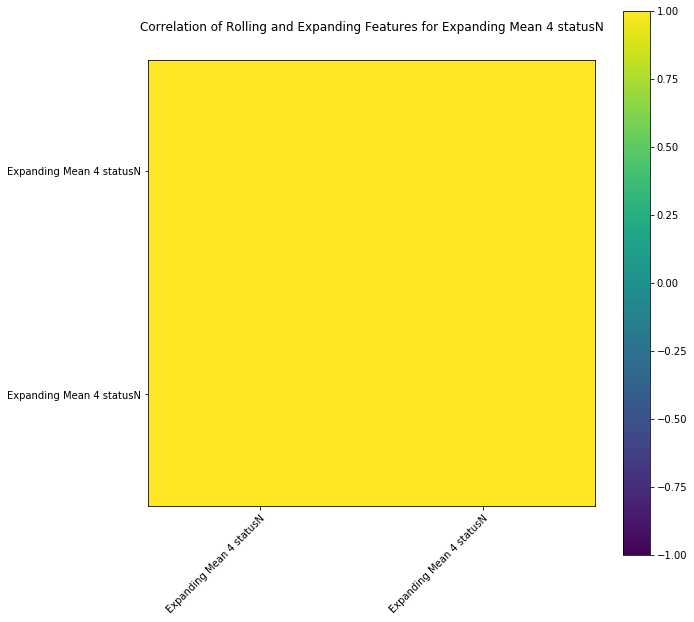

Expanding Min 8 statusN
Rolling W Done
Expanding Done


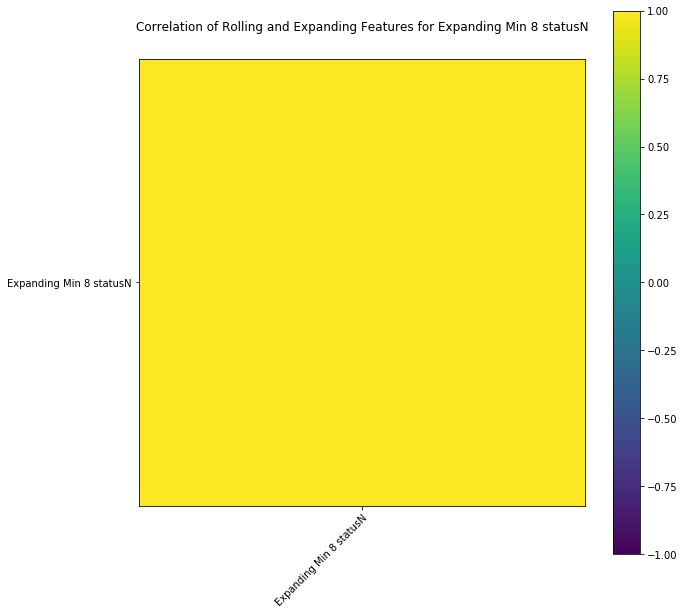

Expanding Max 8 statusN
Rolling W Done
Expanding Done


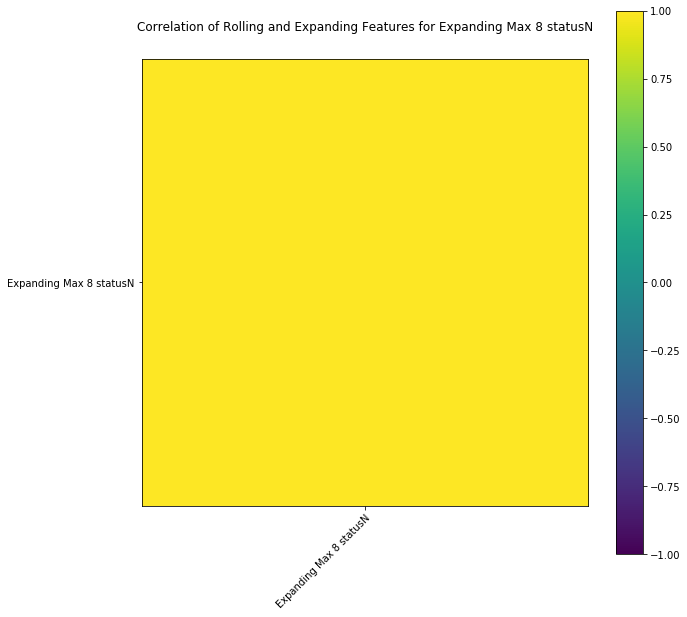

Expanding Sum 8 statusN
Rolling W Done
Expanding Done


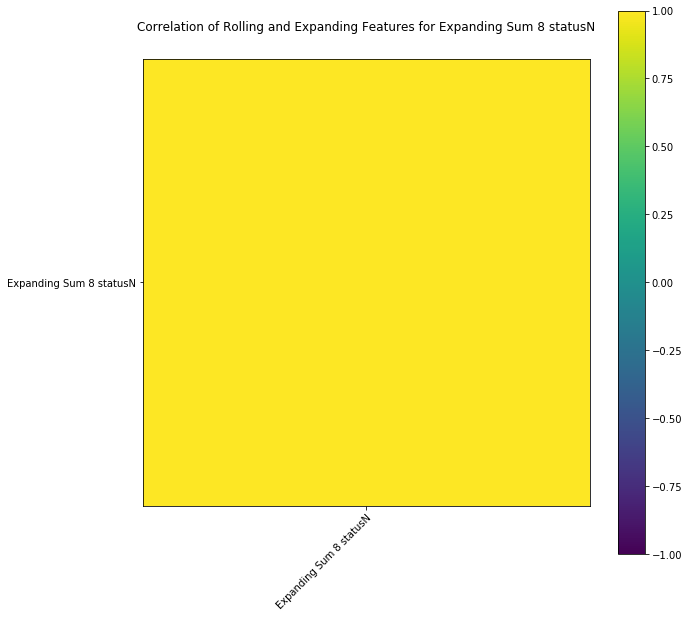

Expanding Mean 8 statusN
Rolling W Done
Expanding Done


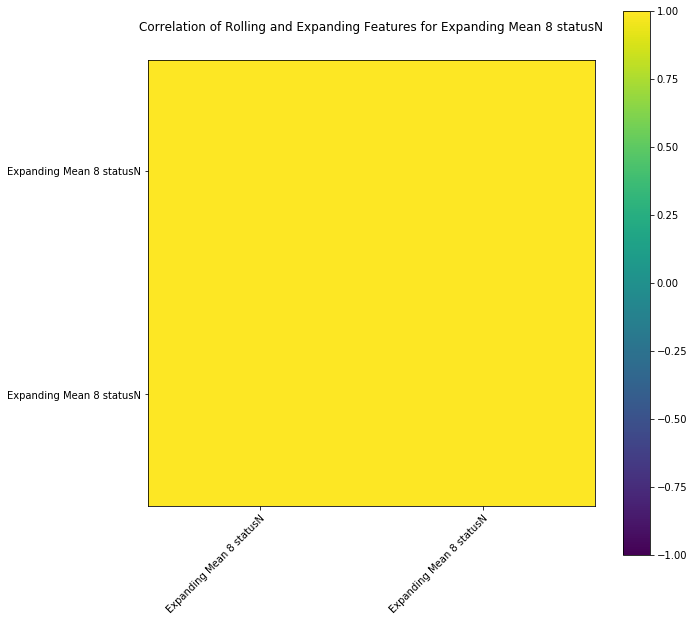

Expanding Min 12 statusN
Rolling W Done
Expanding Done


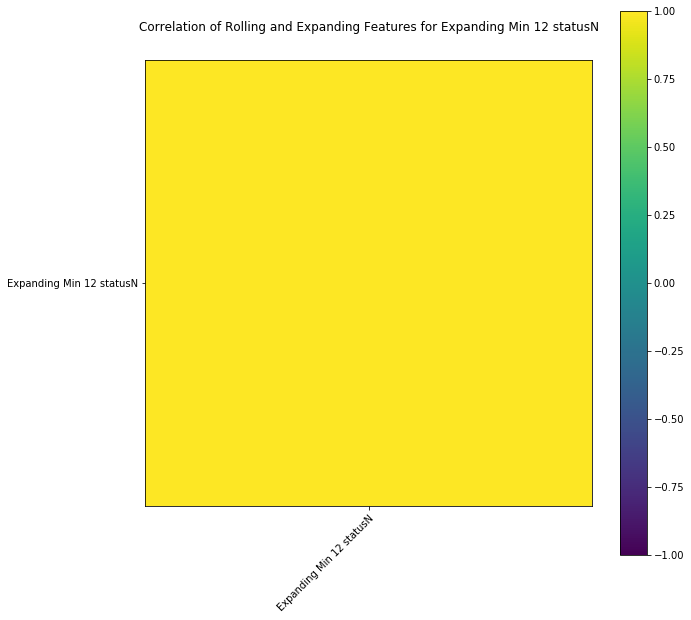

Expanding Max 12 statusN
Rolling W Done
Expanding Done


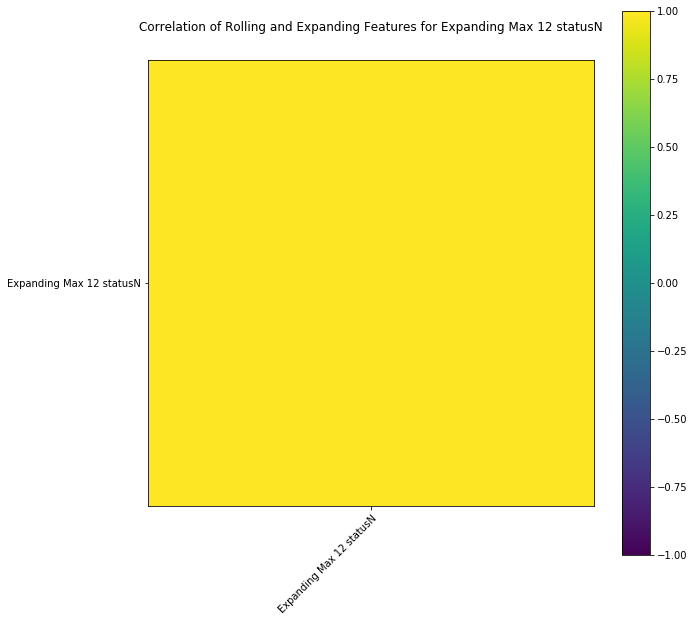

Expanding Sum 12 statusN
Rolling W Done
Expanding Done


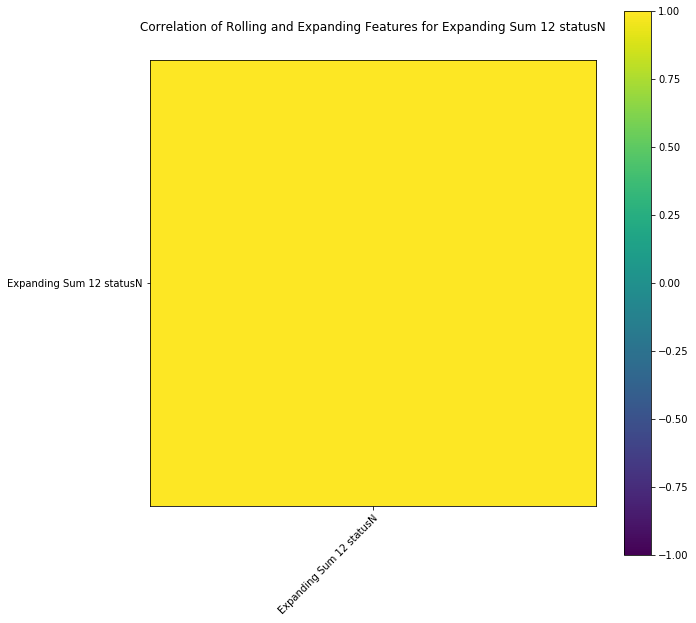

Expanding Mean 12 statusN
Rolling W Done
Expanding Done


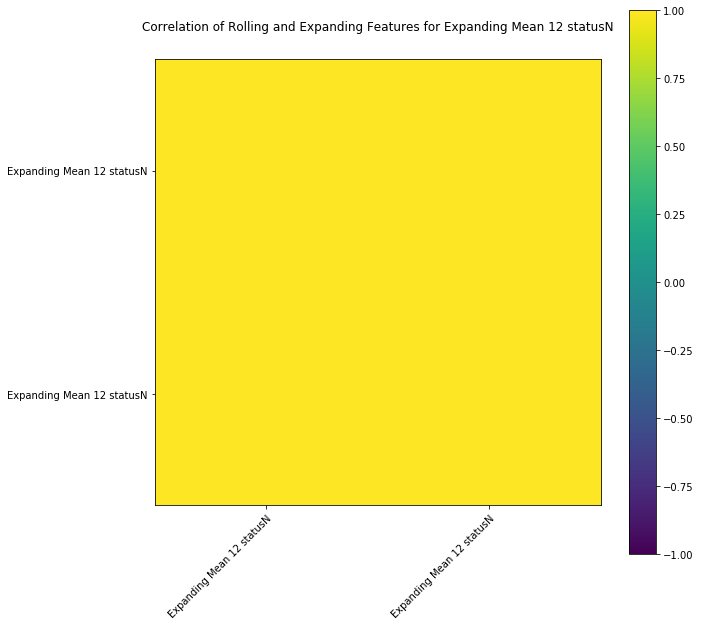

Expanding Min 16 statusN
Rolling W Done
Expanding Done


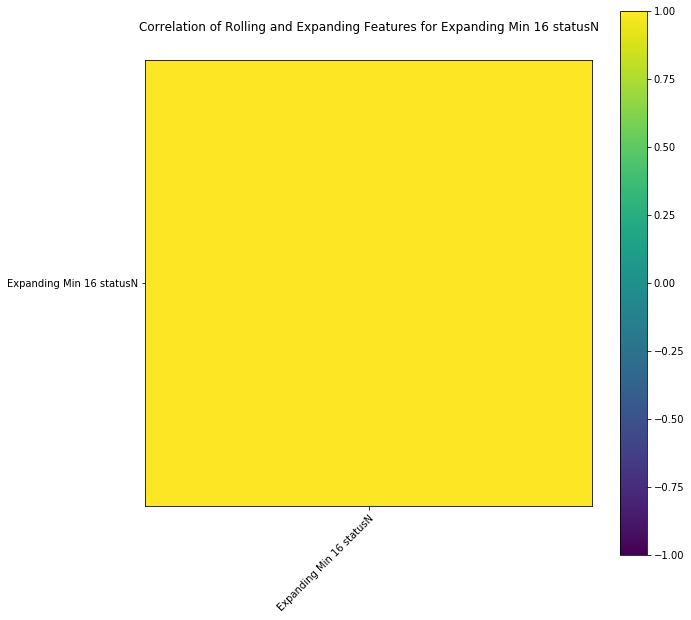

Expanding Max 16 statusN
Rolling W Done
Expanding Done


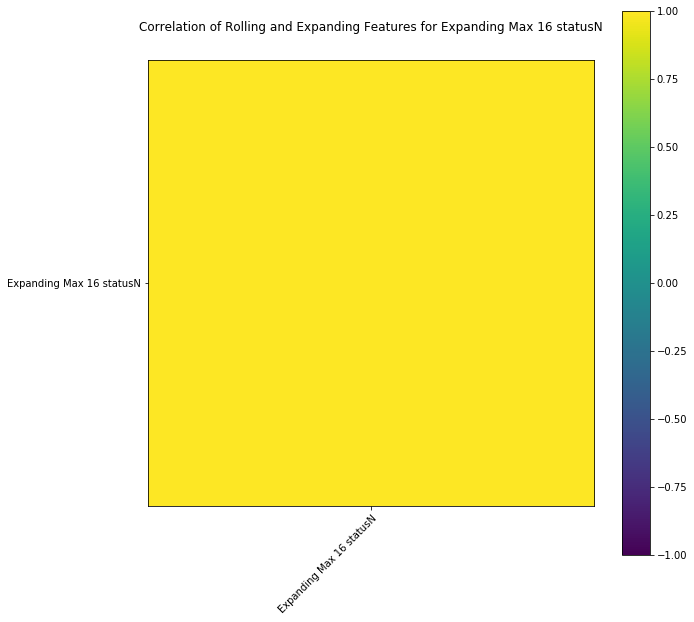

Expanding Sum 16 statusN
Rolling W Done
Expanding Done


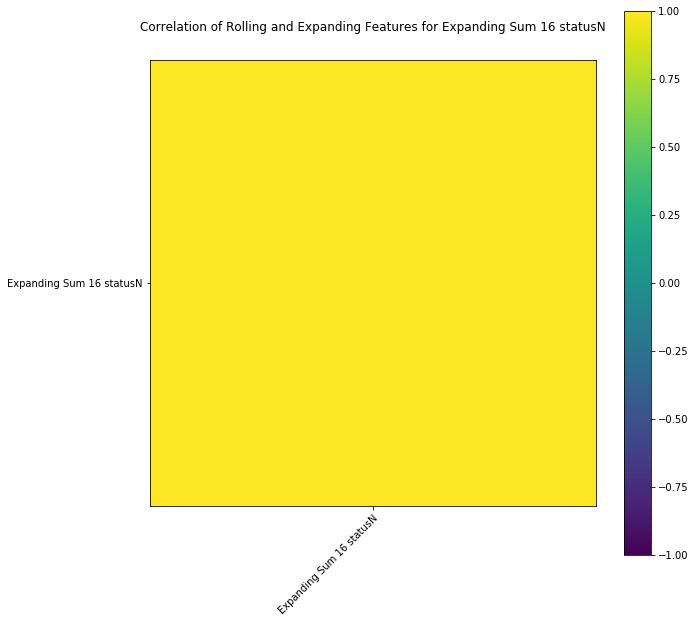

Expanding Mean 16 statusN
Rolling W Done
Expanding Done


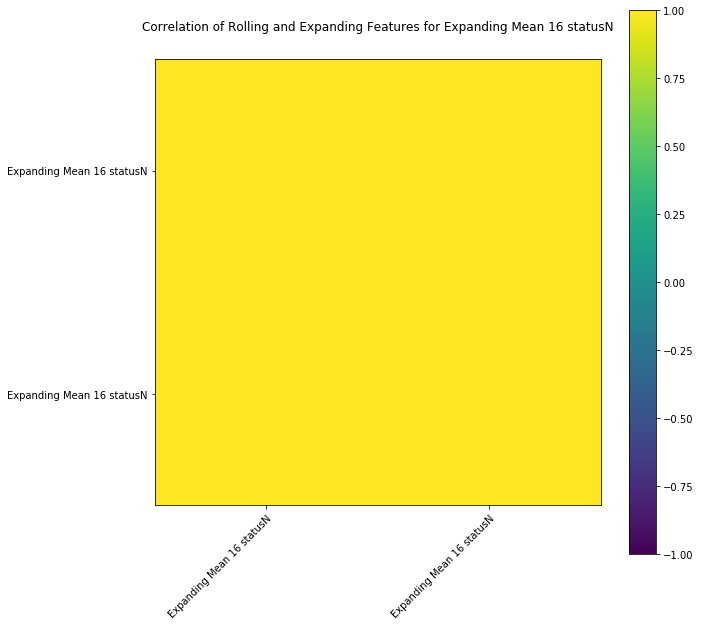

Expanding Min 24 statusN
Rolling W Done
Expanding Done


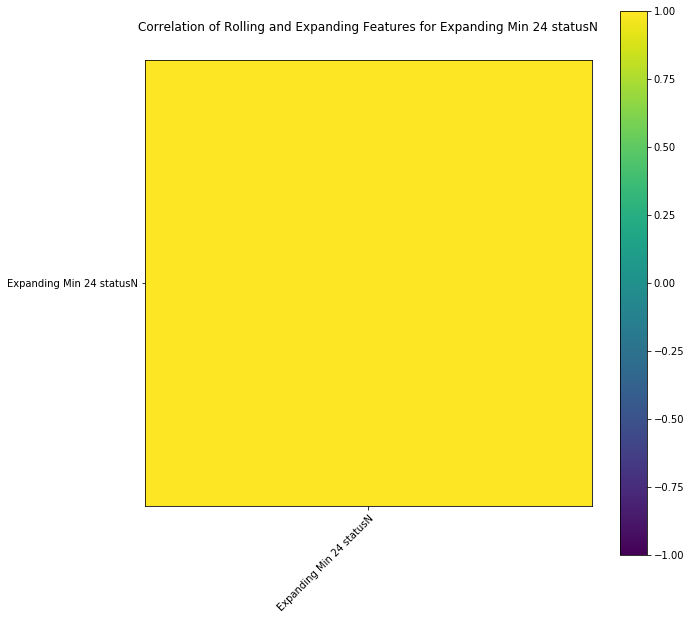

Expanding Max 24 statusN
Rolling W Done
Expanding Done


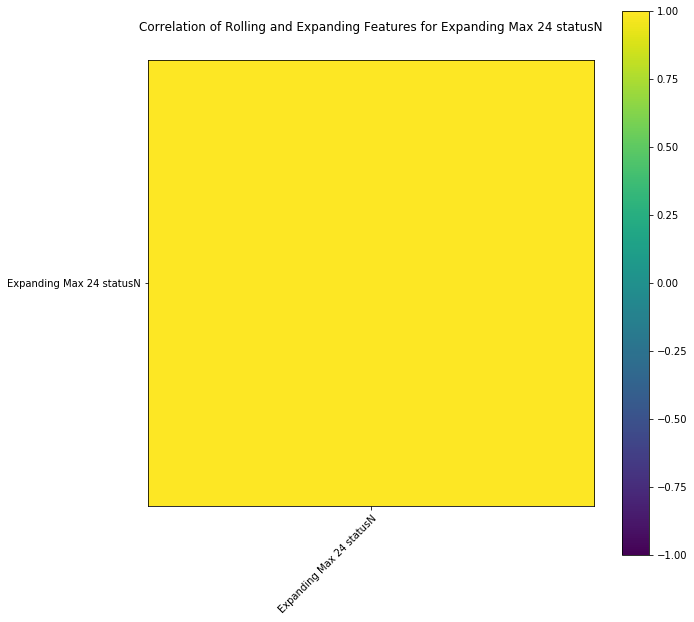

Expanding Sum 24 statusN
Rolling W Done
Expanding Done


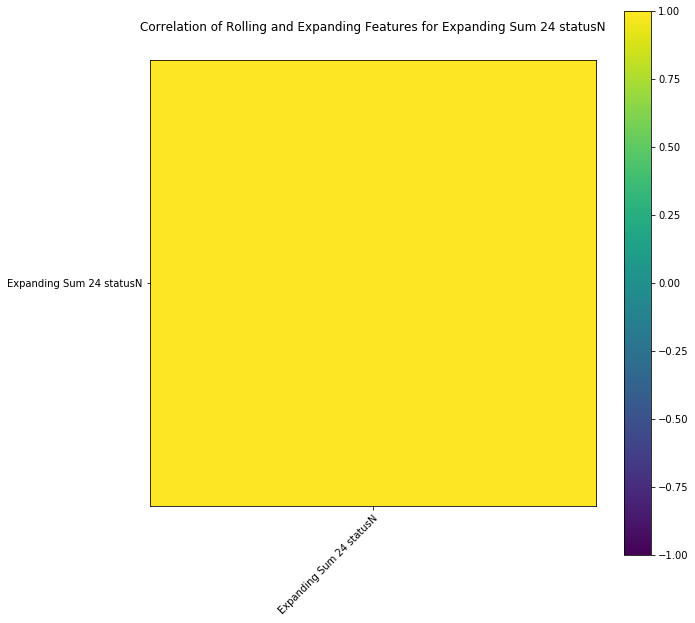

Expanding Mean 24 statusN
Rolling W Done
Expanding Done


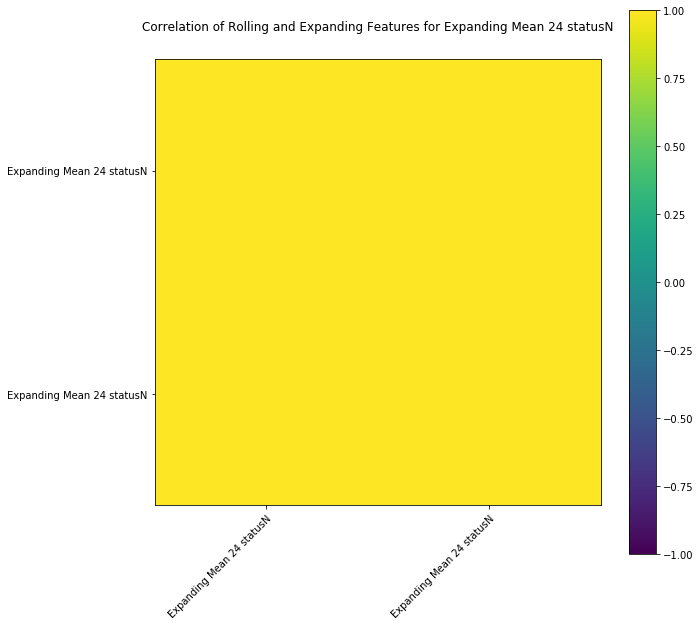

Expanding Min 48 statusN
Rolling W Done
Expanding Done


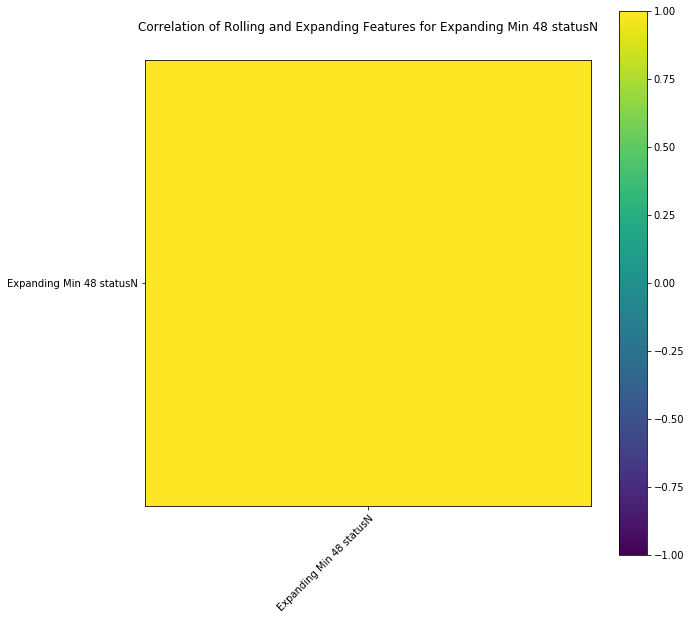

Expanding Max 48 statusN
Rolling W Done
Expanding Done


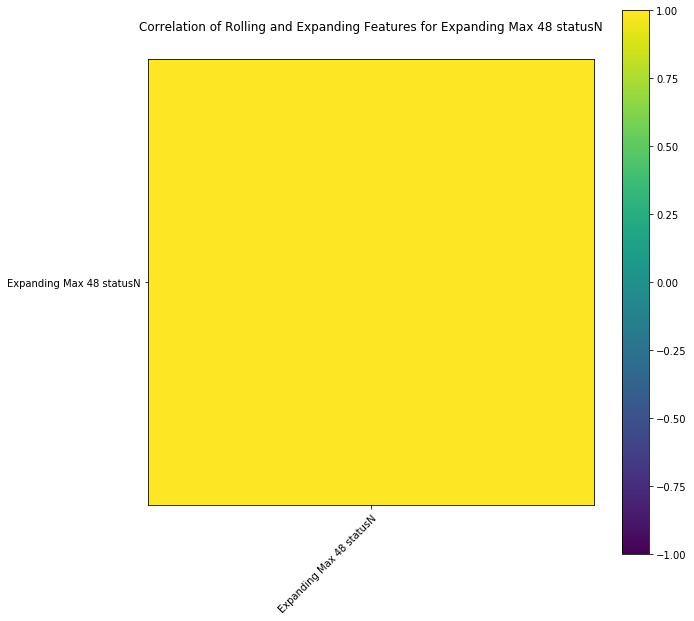

Expanding Sum 48 statusN
Rolling W Done
Expanding Done


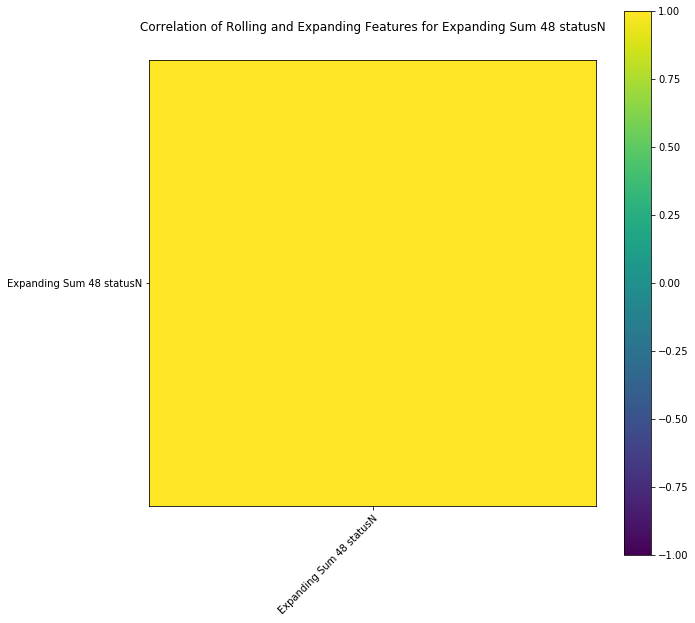

Expanding Mean 48 statusN
Rolling W Done
Expanding Done


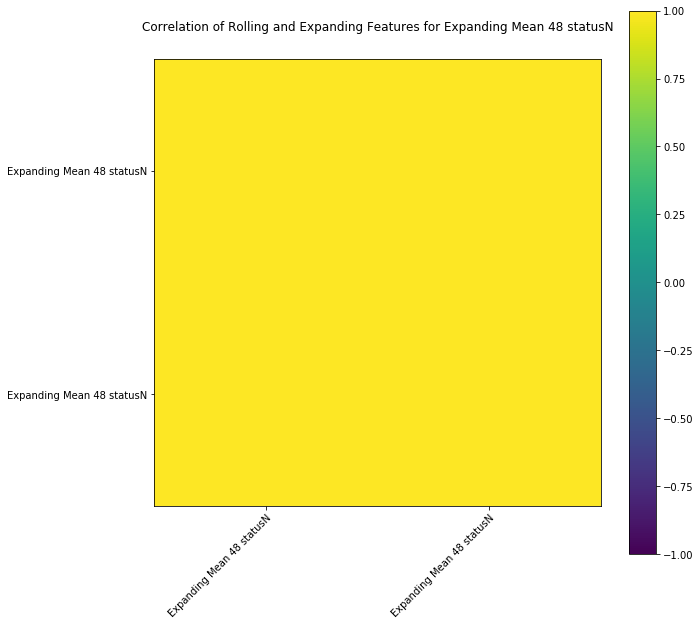

Expanding Min 96 statusN
Rolling W Done
Expanding Done


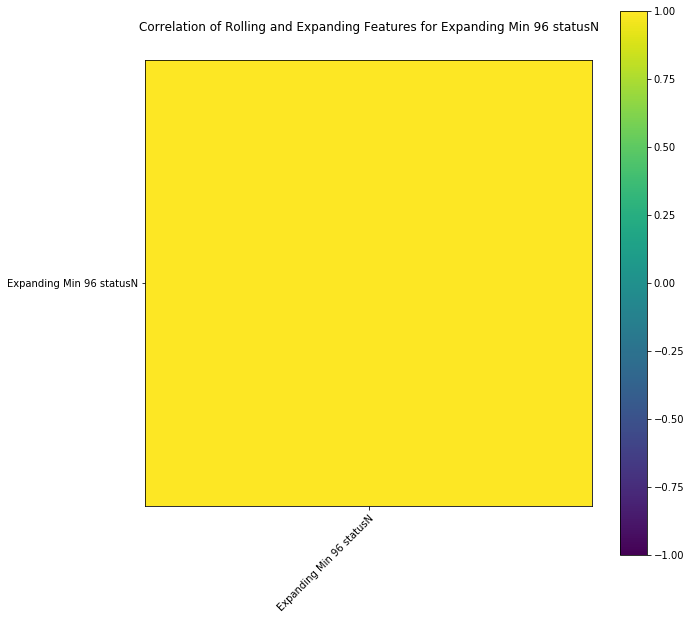

Expanding Max 96 statusN
Rolling W Done
Expanding Done


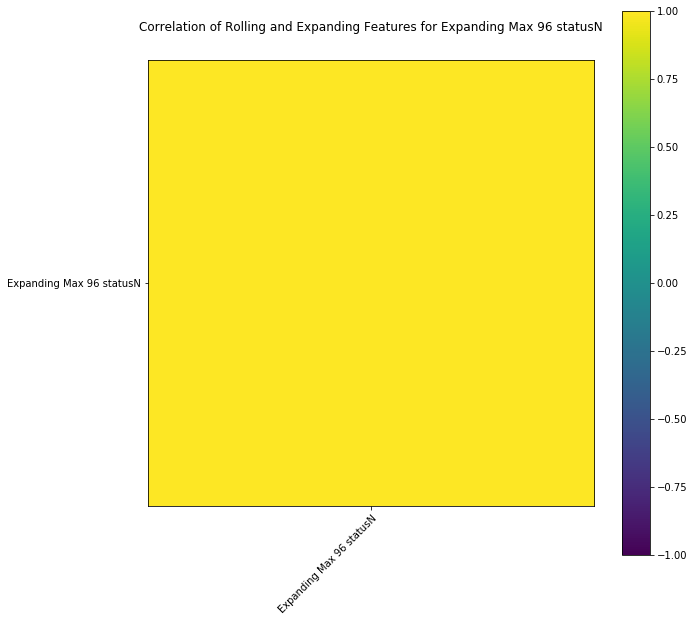

Expanding Sum 96 statusN
Rolling W Done
Expanding Done


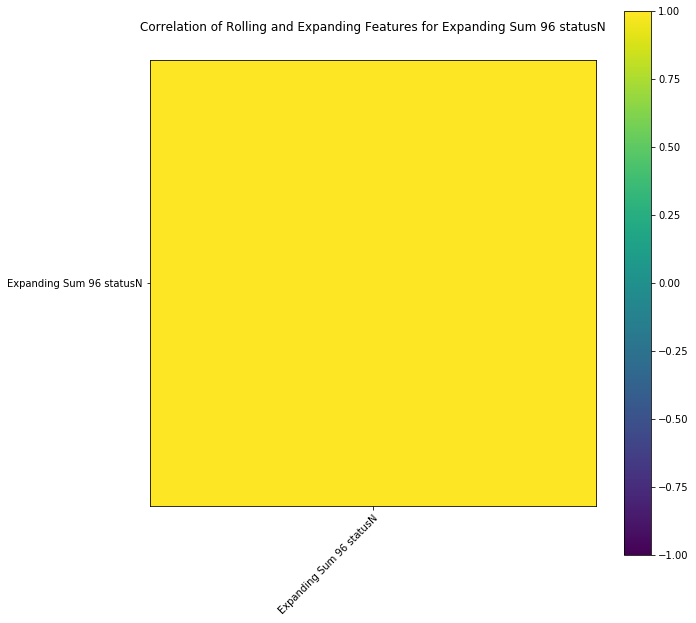

Expanding Mean 96 statusN
Rolling W Done
Expanding Done


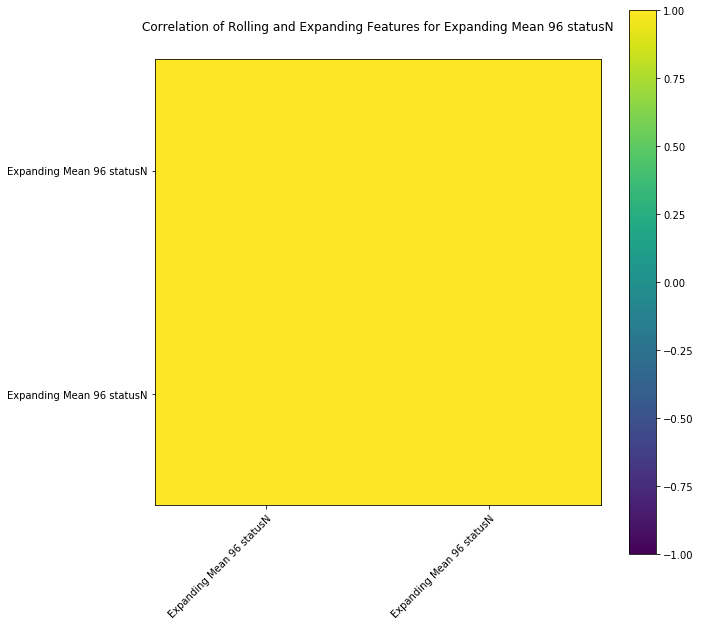

Expanding Min 2 statusS
Rolling W Done
Expanding Done


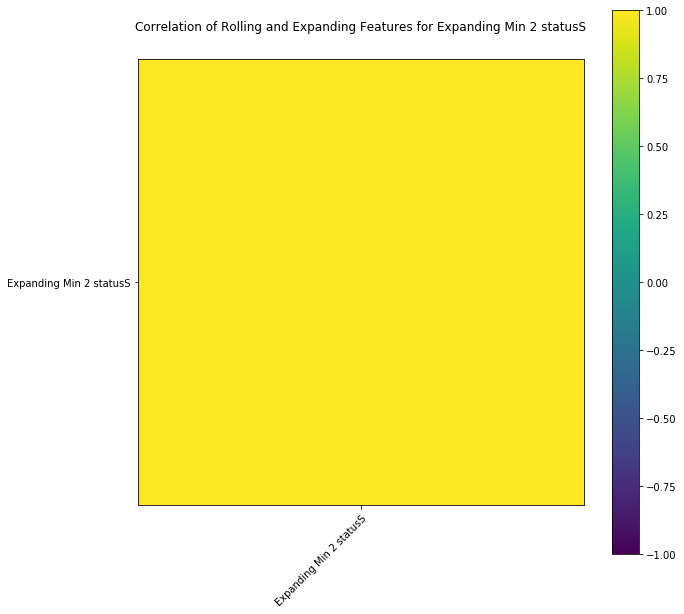

Expanding Max 2 statusS
Rolling W Done
Expanding Done


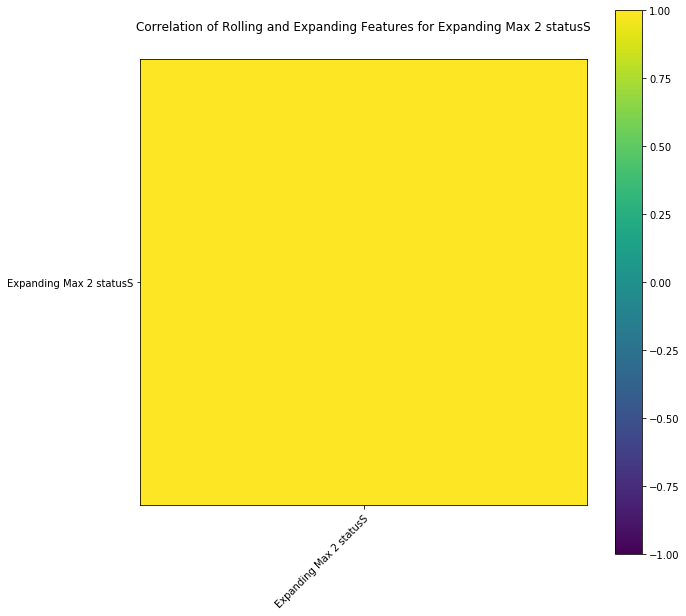

Expanding Sum 2 statusS
Rolling W Done
Expanding Done


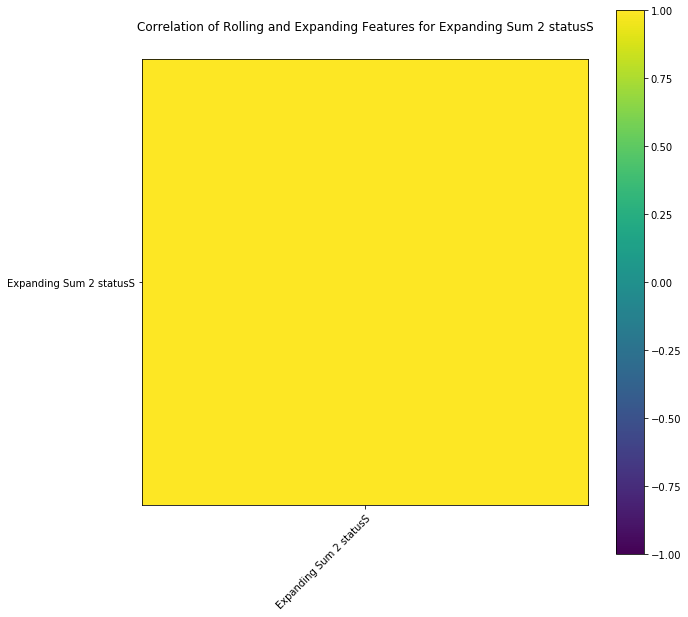

Expanding Mean 2 statusS
Rolling W Done
Expanding Done


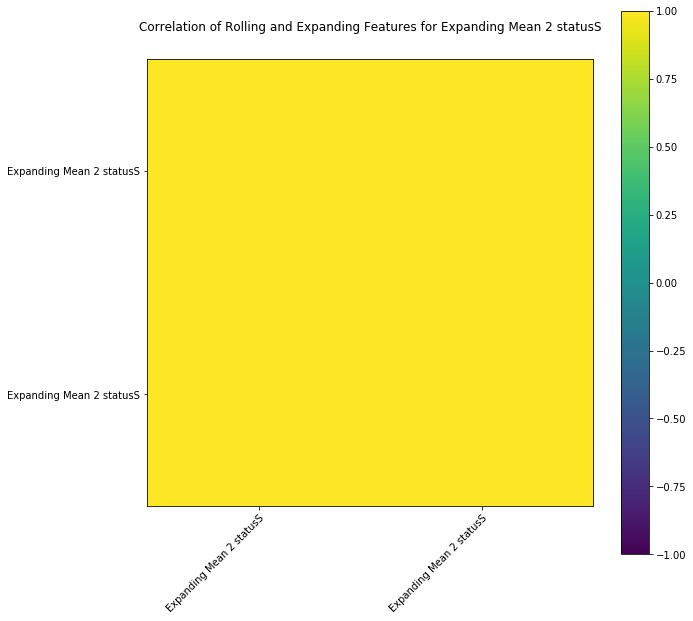

Expanding Min 3 statusS
Rolling W Done
Expanding Done


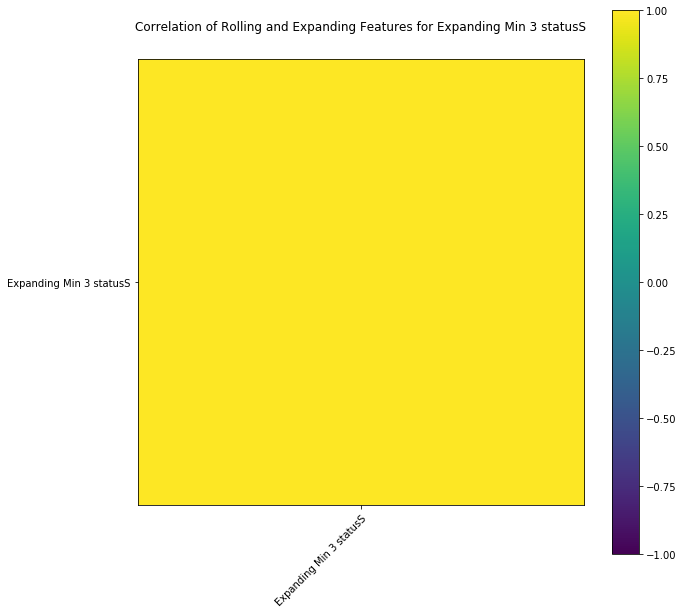

Expanding Max 3 statusS
Rolling W Done
Expanding Done


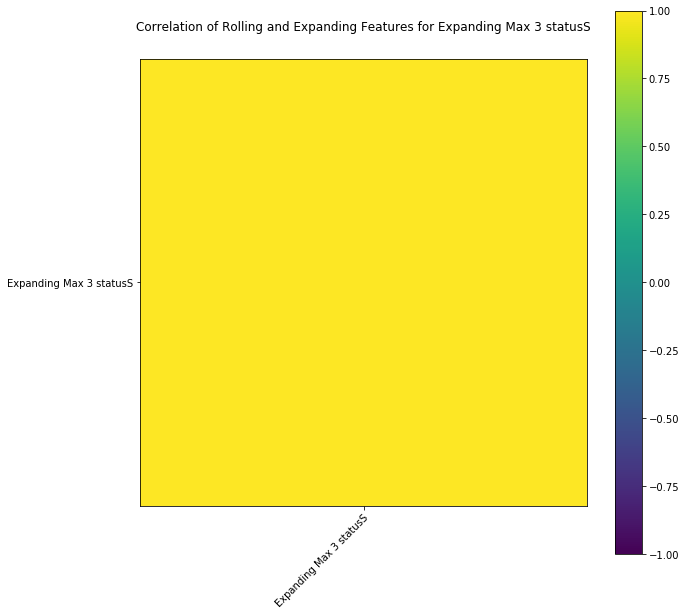

Expanding Sum 3 statusS
Rolling W Done
Expanding Done


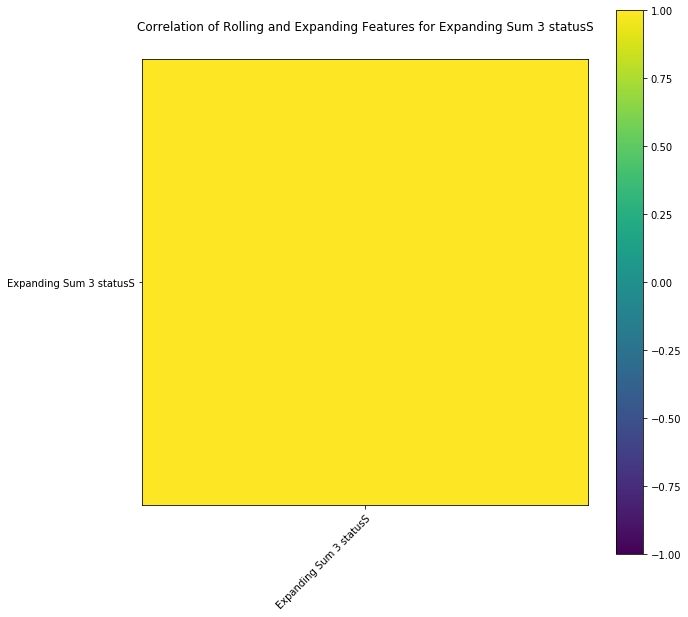

Expanding Mean 3 statusS
Rolling W Done
Expanding Done


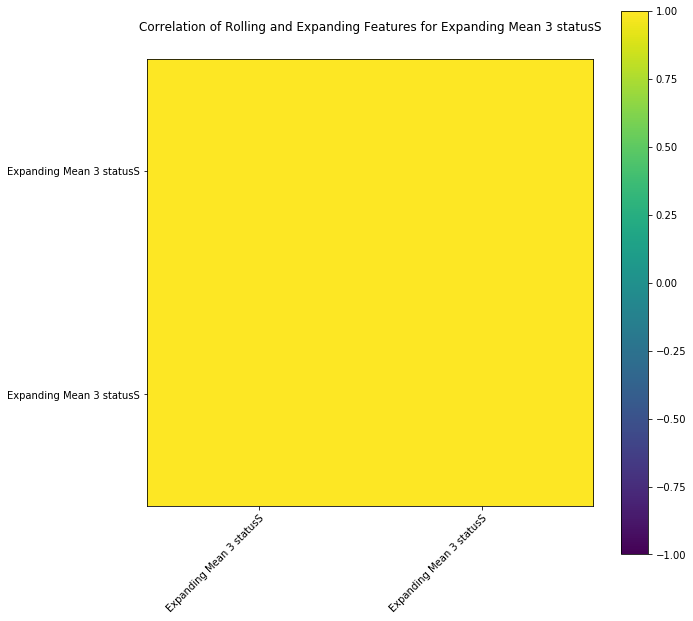

Expanding Min 4 statusS
Rolling W Done
Expanding Done


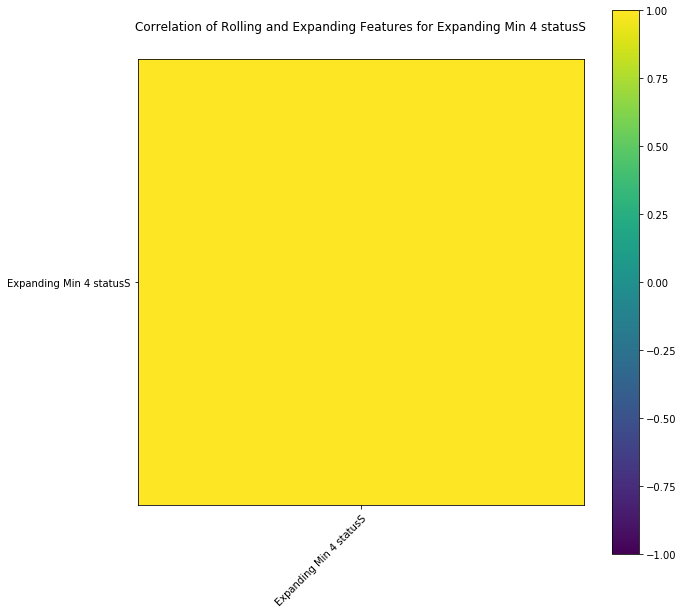

Expanding Max 4 statusS
Rolling W Done
Expanding Done


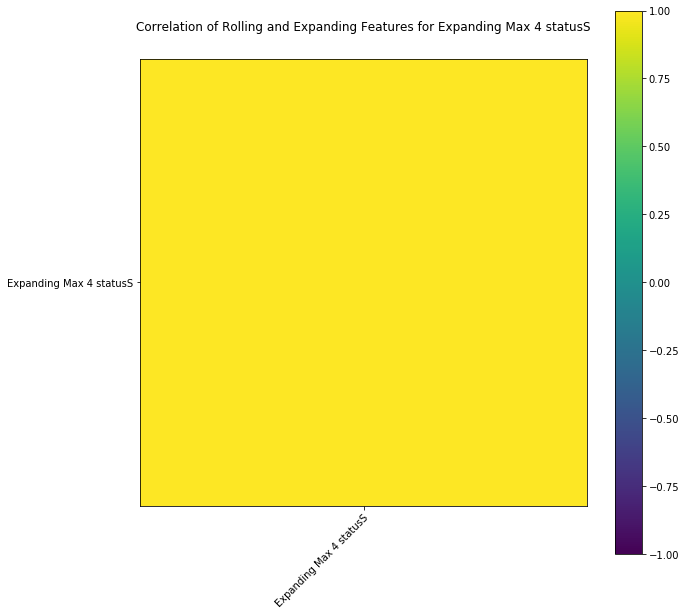

Expanding Sum 4 statusS
Rolling W Done
Expanding Done


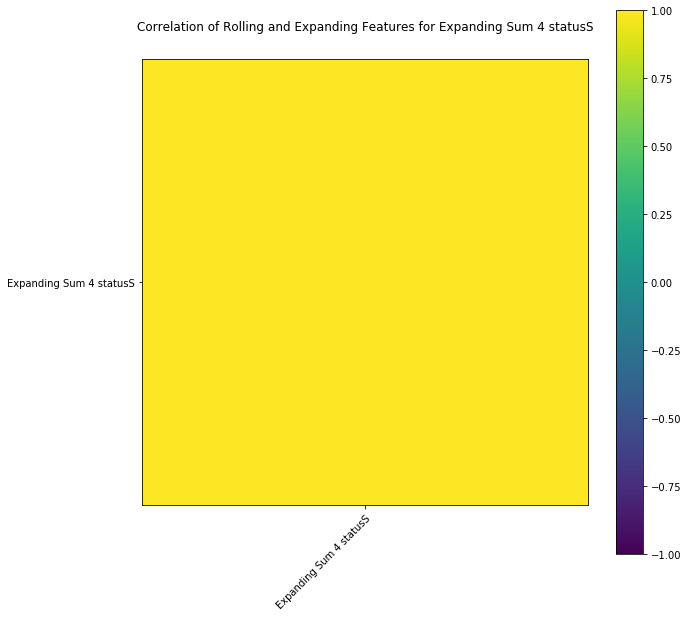

Expanding Mean 4 statusS
Rolling W Done
Expanding Done


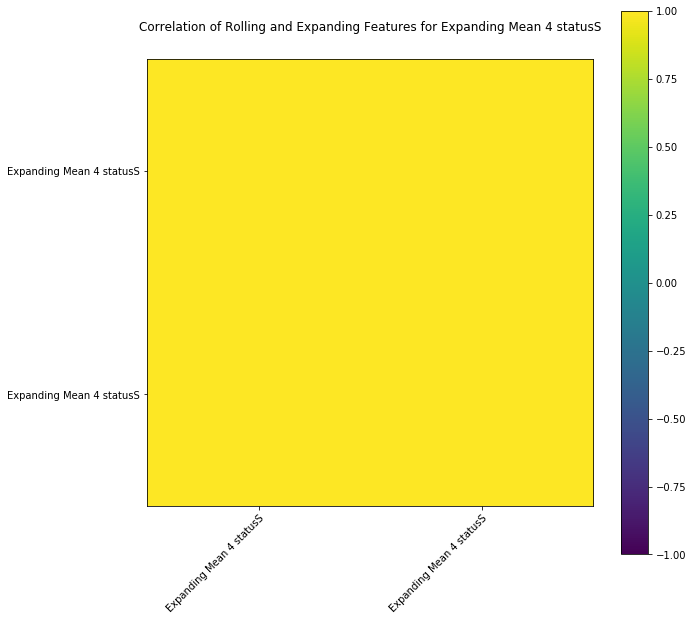

Expanding Min 8 statusS
Rolling W Done
Expanding Done


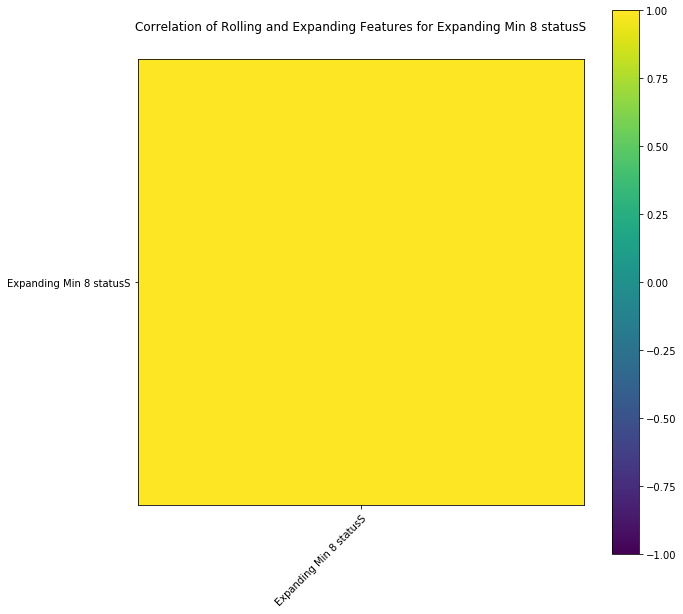

Expanding Max 8 statusS
Rolling W Done
Expanding Done


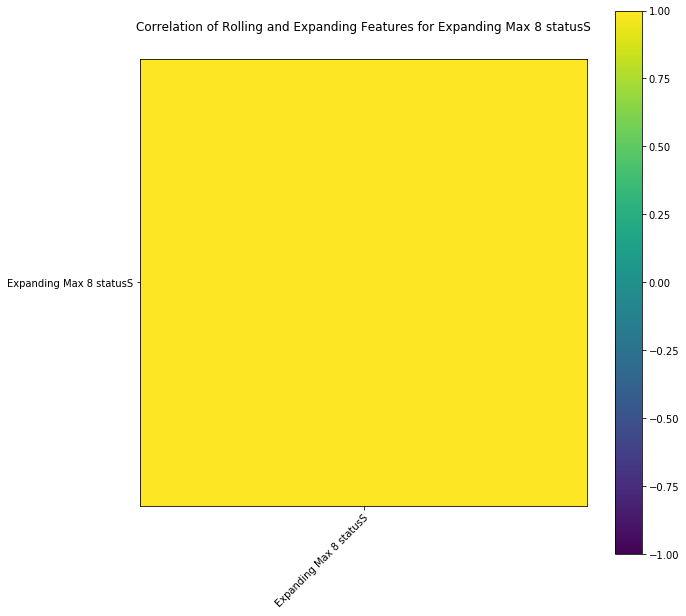

Expanding Sum 8 statusS
Rolling W Done
Expanding Done


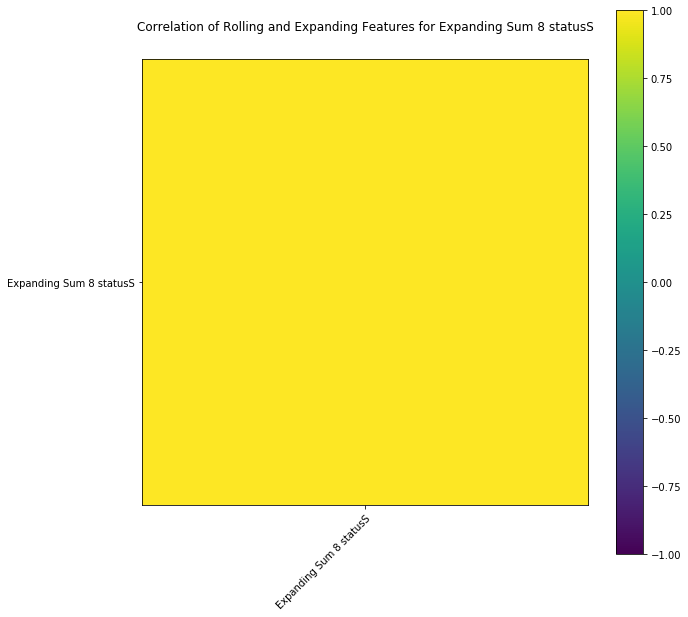

Expanding Mean 8 statusS
Rolling W Done
Expanding Done


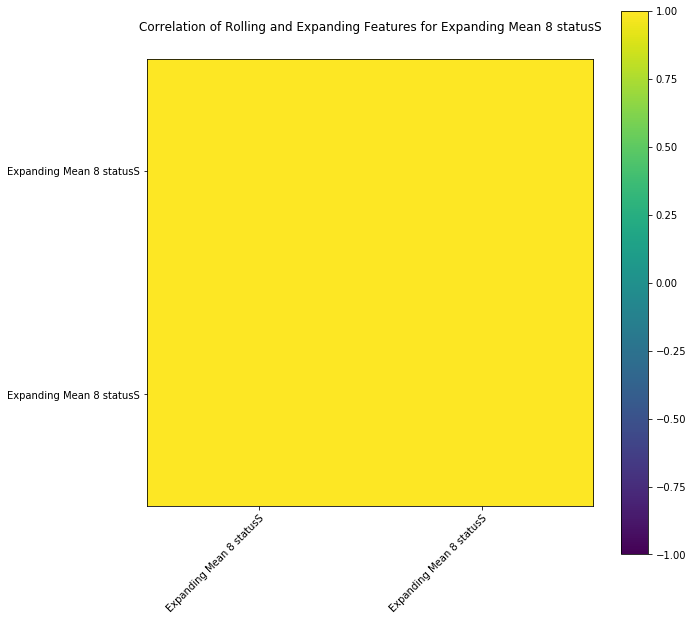

Expanding Min 12 statusS
Rolling W Done
Expanding Done


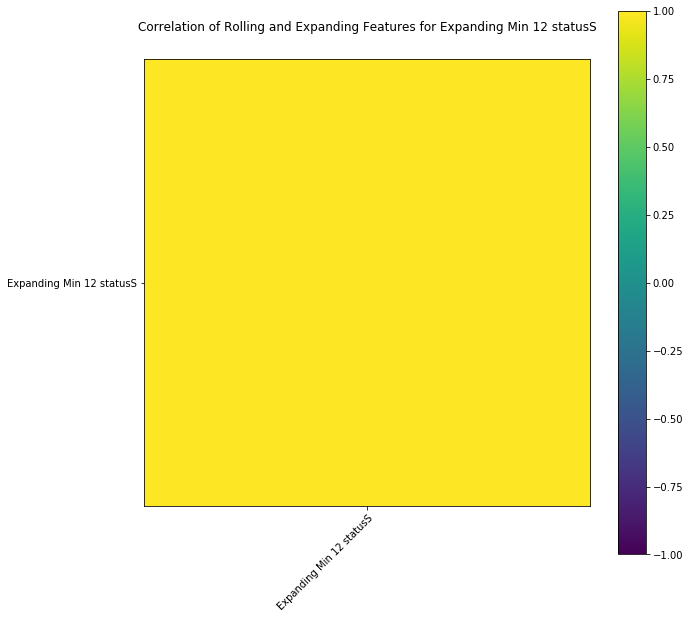

Expanding Max 12 statusS
Rolling W Done
Expanding Done


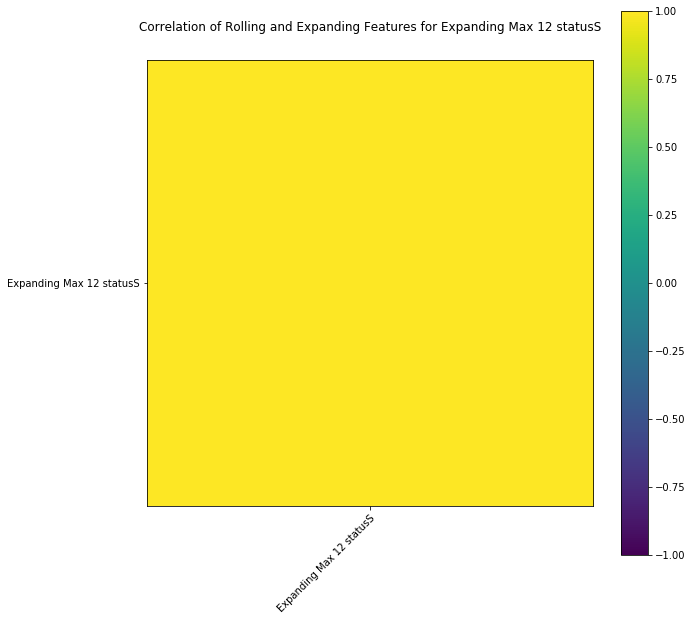

Expanding Sum 12 statusS
Rolling W Done
Expanding Done


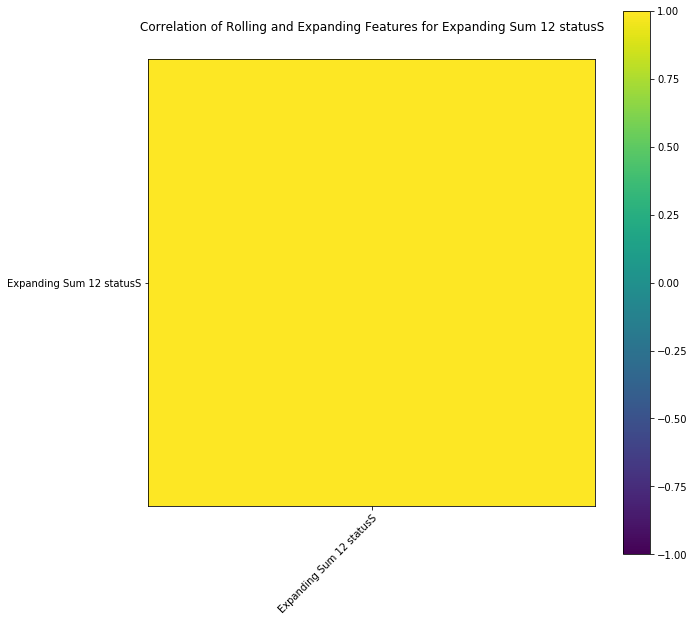

Expanding Mean 12 statusS
Rolling W Done
Expanding Done


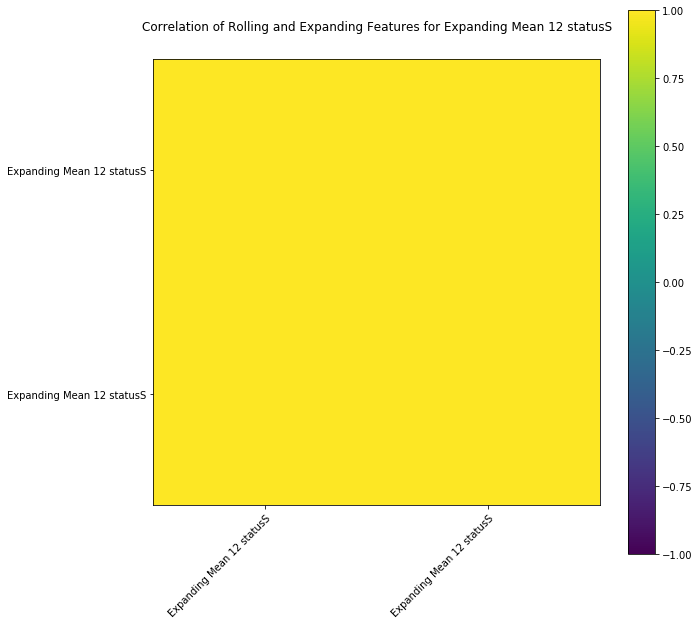

Expanding Min 16 statusS
Rolling W Done
Expanding Done


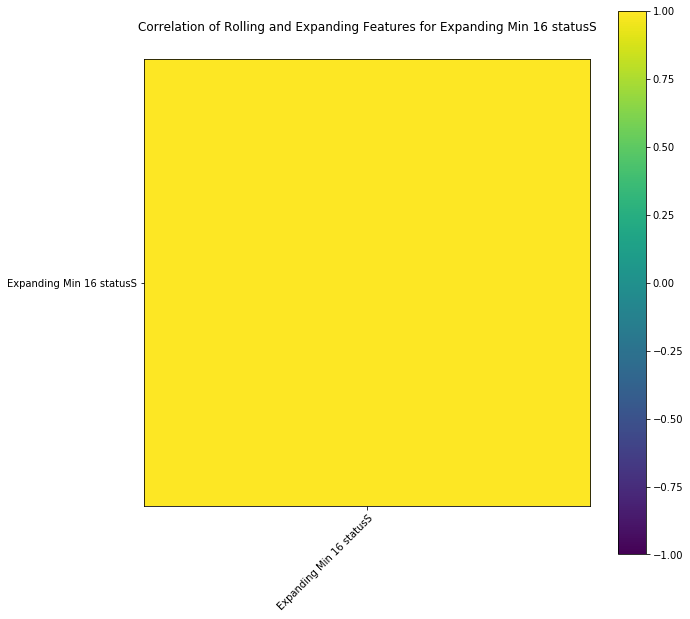

Expanding Max 16 statusS
Rolling W Done
Expanding Done


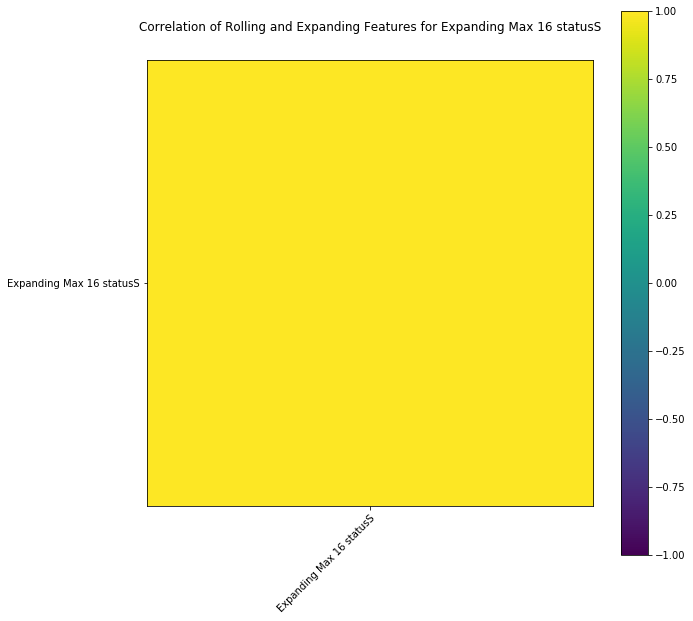

Expanding Sum 16 statusS
Rolling W Done
Expanding Done


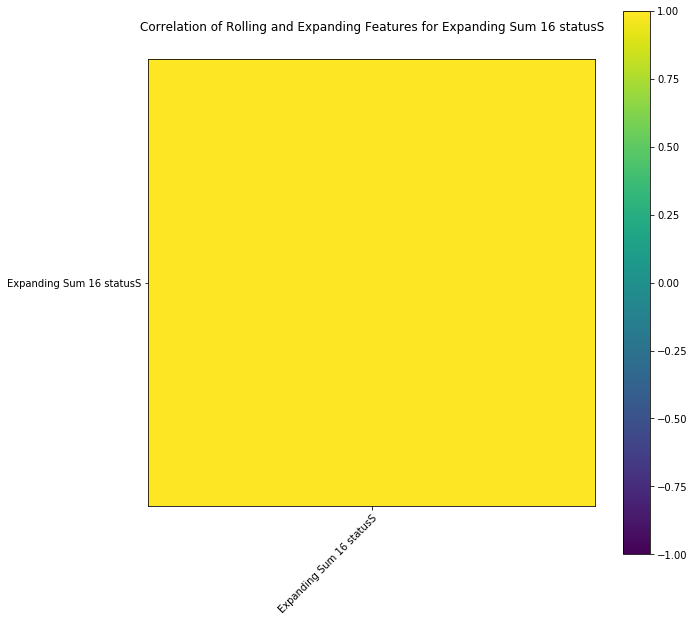

Expanding Mean 16 statusS
Rolling W Done
Expanding Done


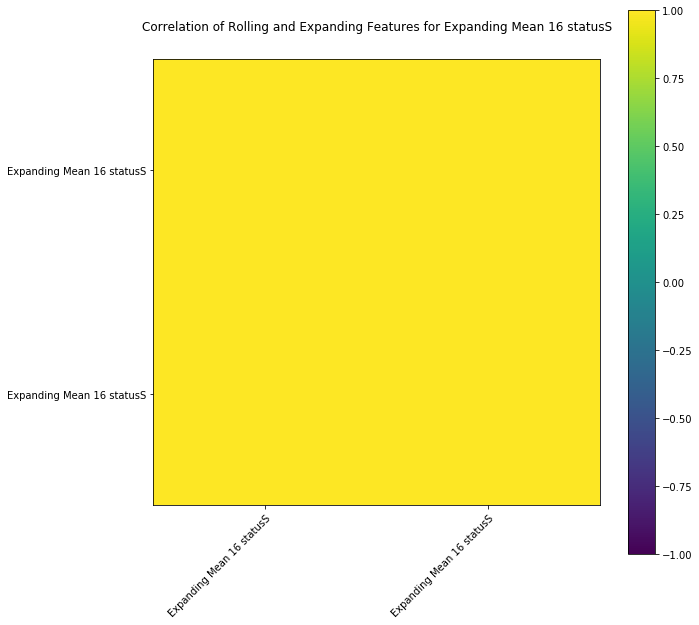

Expanding Min 24 statusS
Rolling W Done
Expanding Done


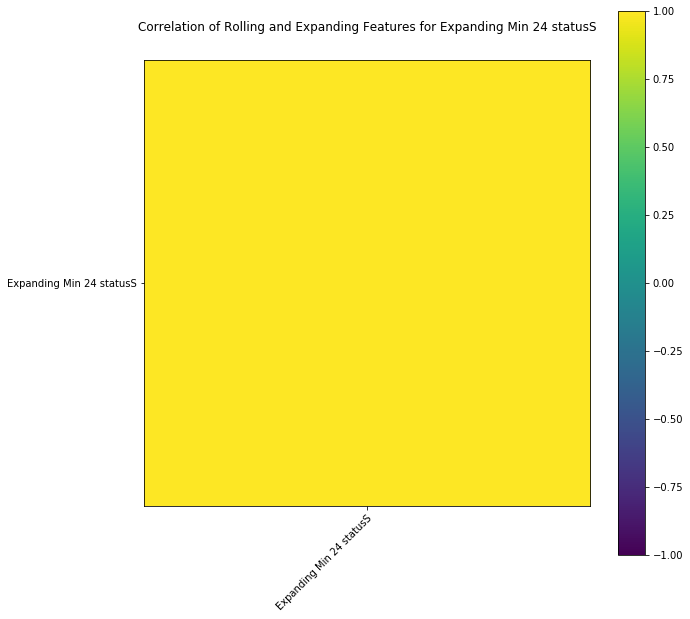

Expanding Max 24 statusS
Rolling W Done
Expanding Done


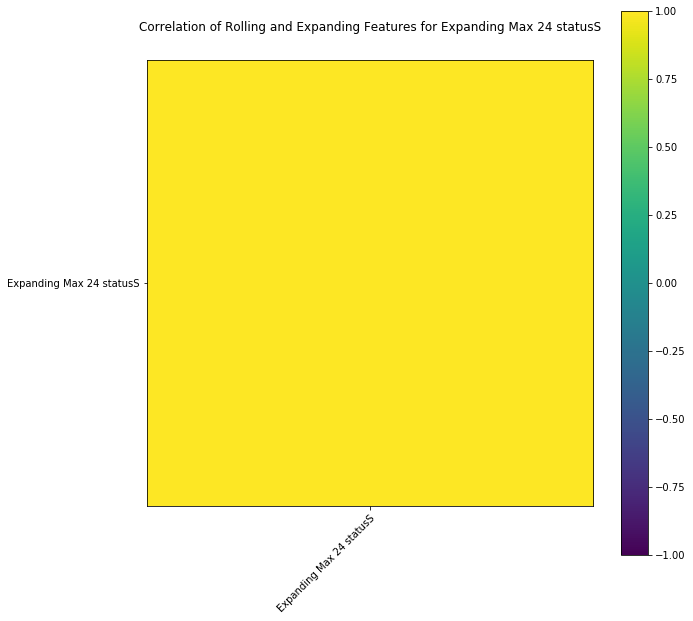

Expanding Sum 24 statusS
Rolling W Done
Expanding Done


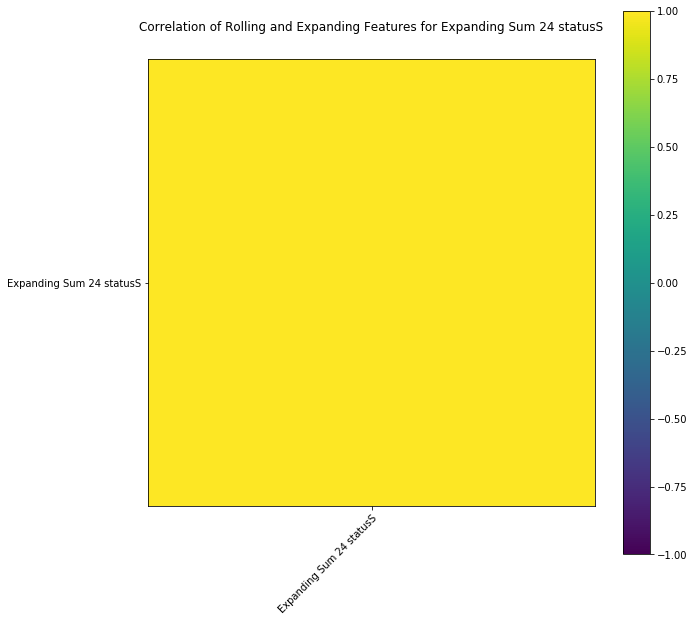

Expanding Mean 24 statusS
Rolling W Done
Expanding Done


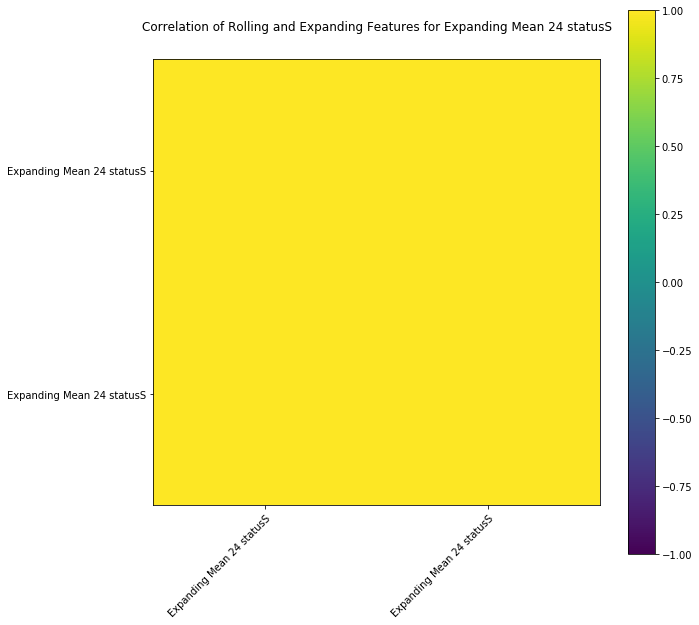

Expanding Min 48 statusS
Rolling W Done
Expanding Done


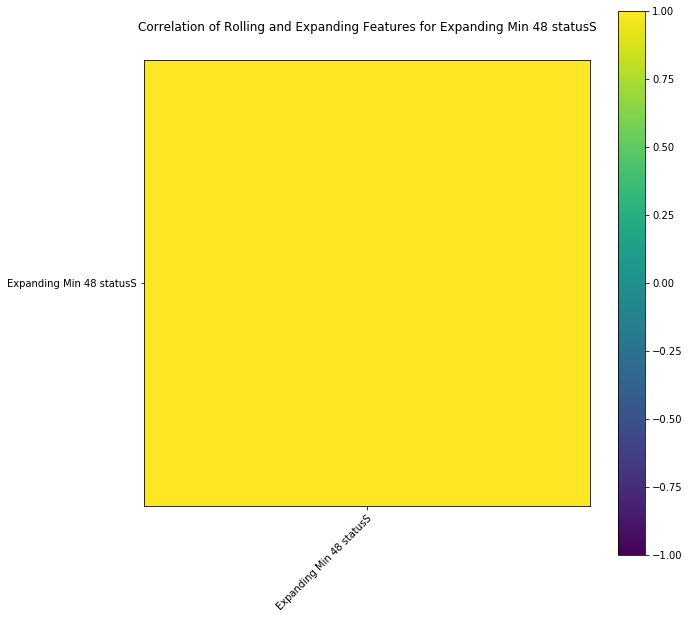

Expanding Max 48 statusS
Rolling W Done
Expanding Done


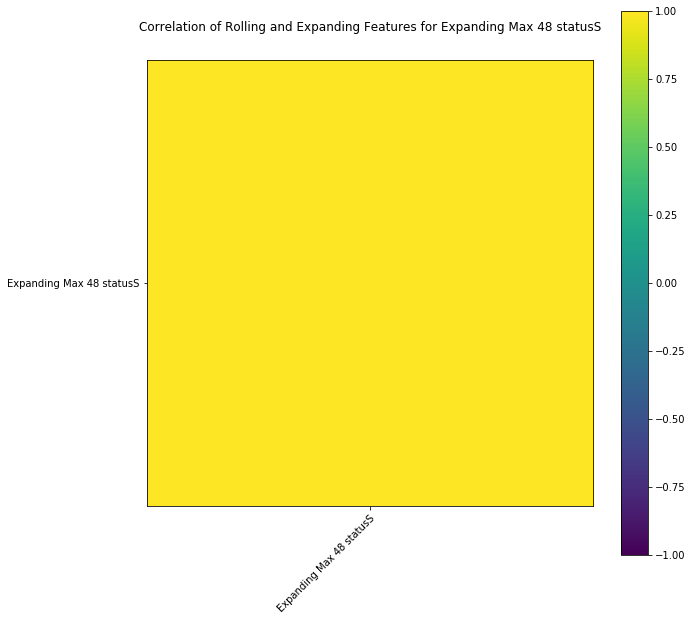

Expanding Sum 48 statusS
Rolling W Done
Expanding Done


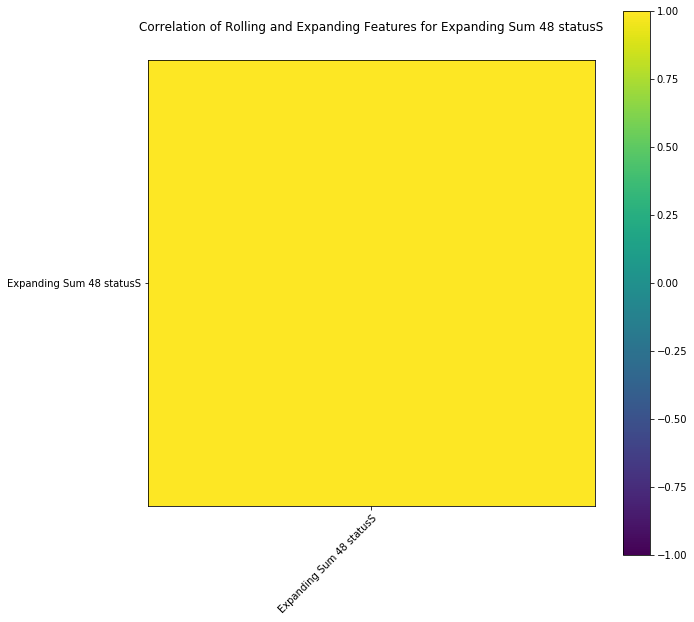

Expanding Mean 48 statusS
Rolling W Done
Expanding Done


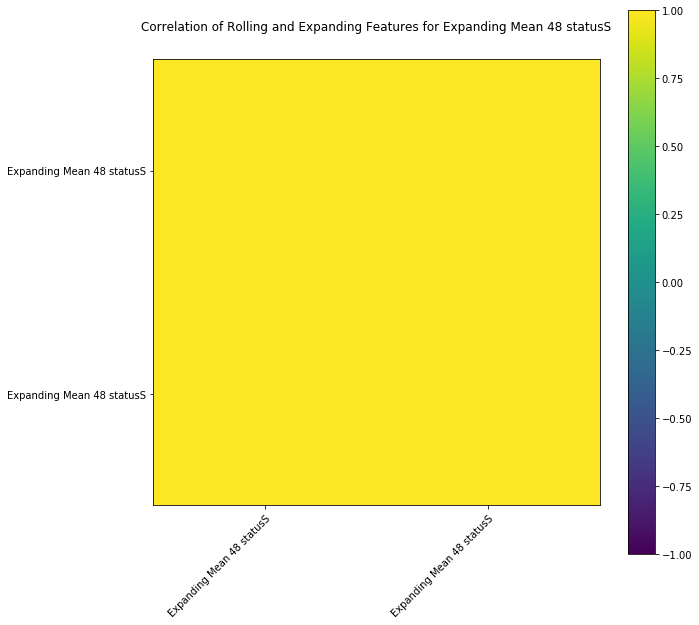

Expanding Min 96 statusS
Rolling W Done
Expanding Done


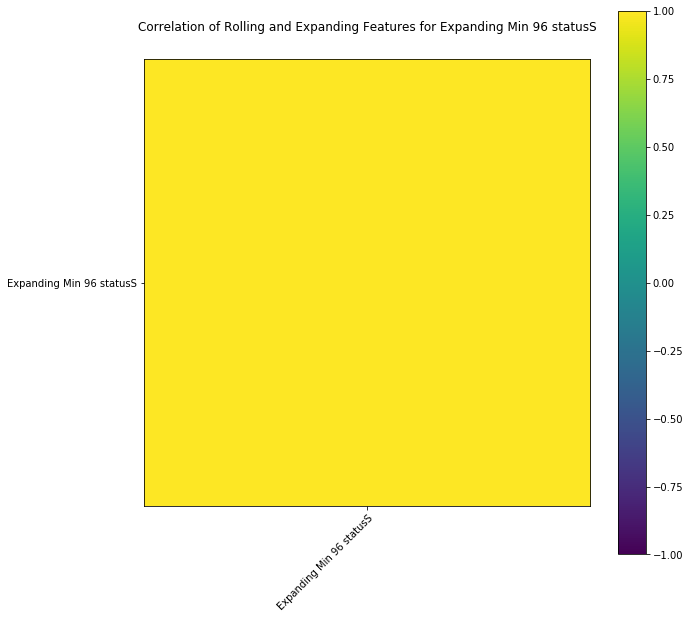

Expanding Max 96 statusS
Rolling W Done
Expanding Done


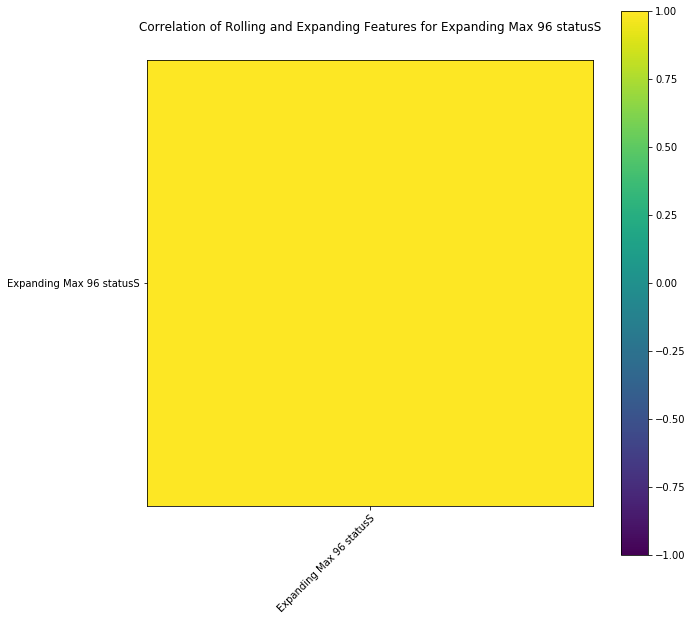

Expanding Sum 96 statusS
Rolling W Done
Expanding Done


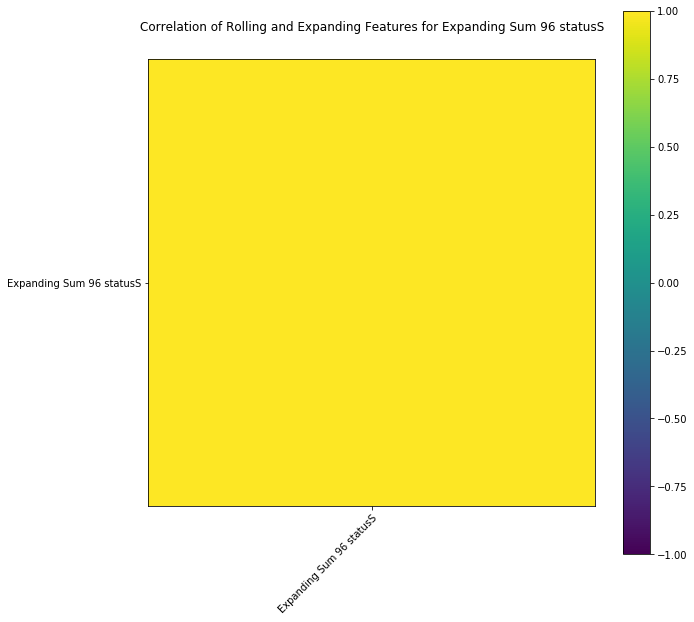

Expanding Mean 96 statusS
Rolling W Done
Expanding Done


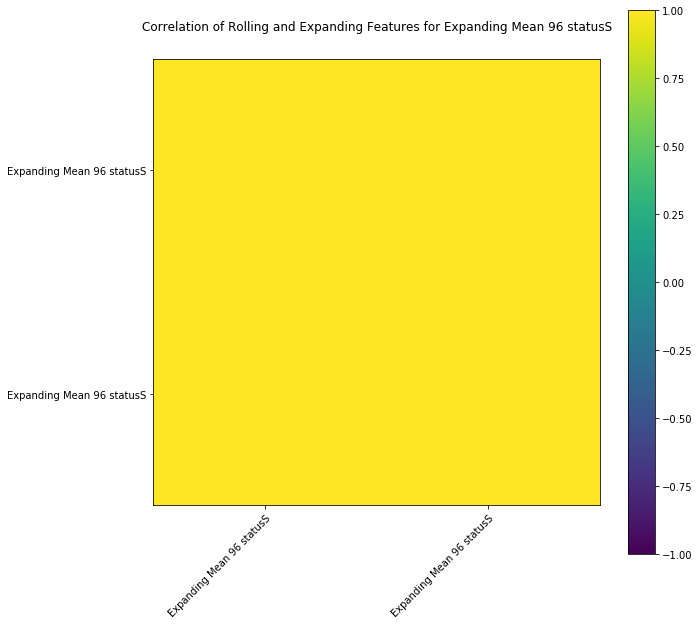

Expanding Min 2 tempC
Rolling W Done
Expanding Done


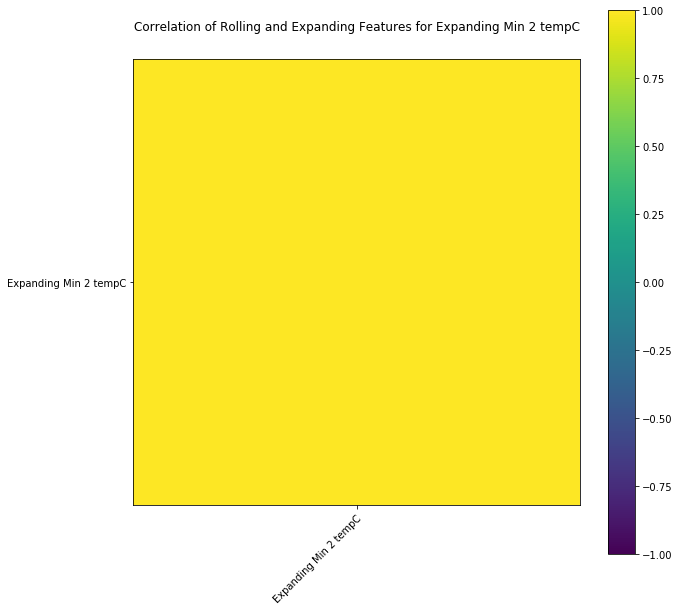

Expanding Max 2 tempC
Rolling W Done
Expanding Done


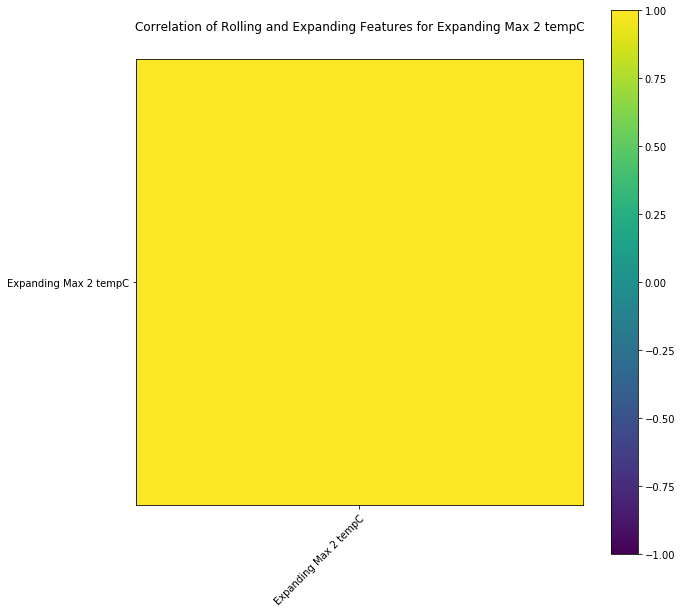

Expanding Sum 2 tempC
Rolling W Done
Expanding Done


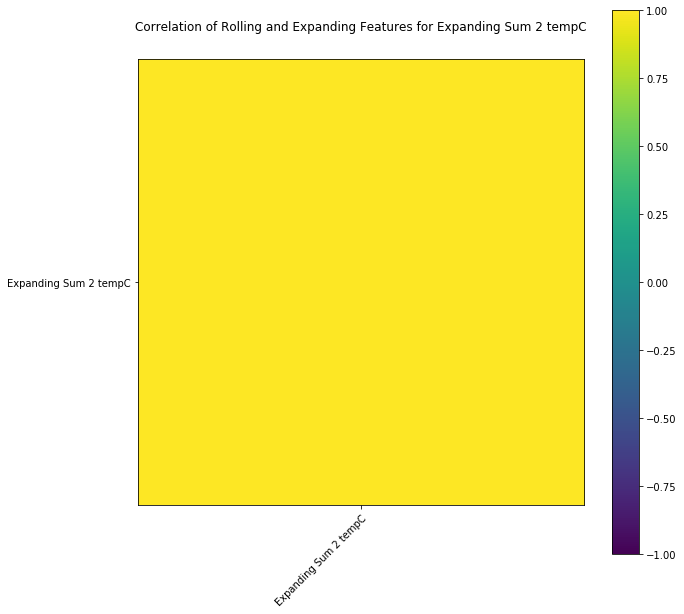

Expanding Mean 2 tempC
Rolling W Done
Expanding Done


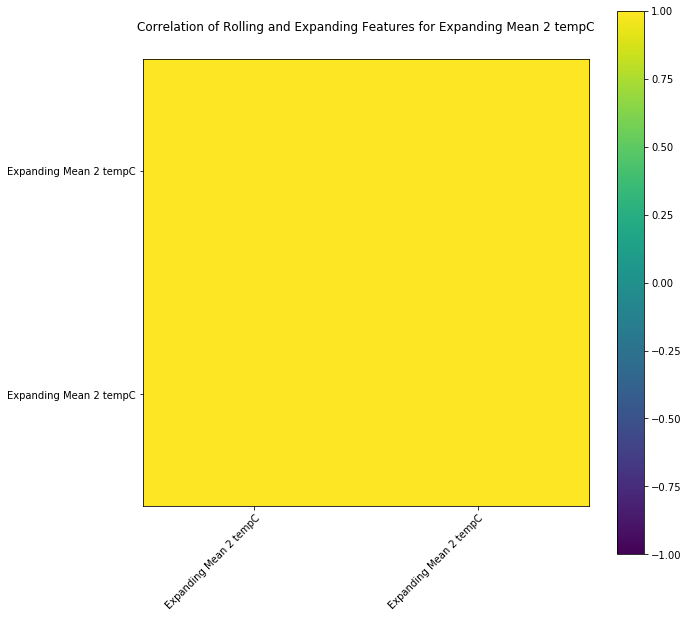

Expanding Min 3 tempC
Rolling W Done
Expanding Done


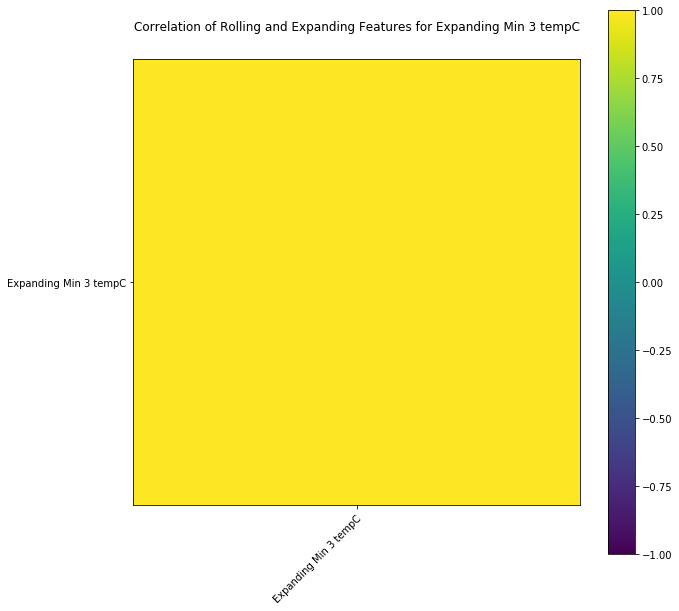

Expanding Max 3 tempC
Rolling W Done
Expanding Done


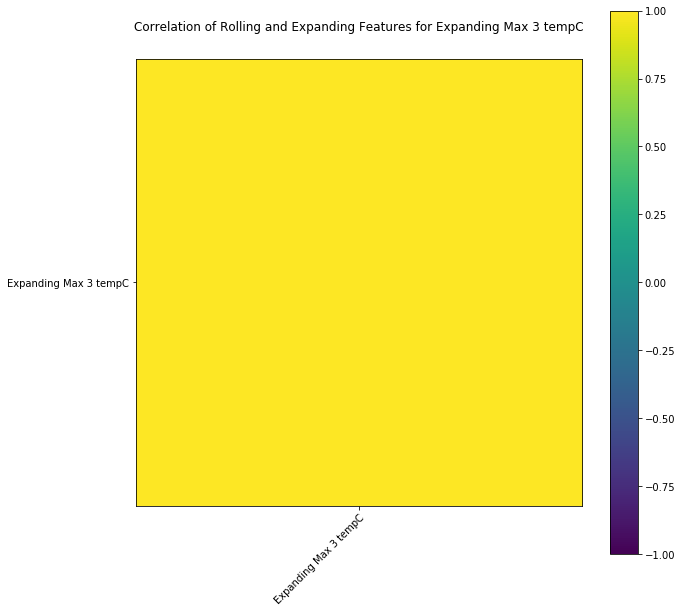

Expanding Sum 3 tempC
Rolling W Done
Expanding Done


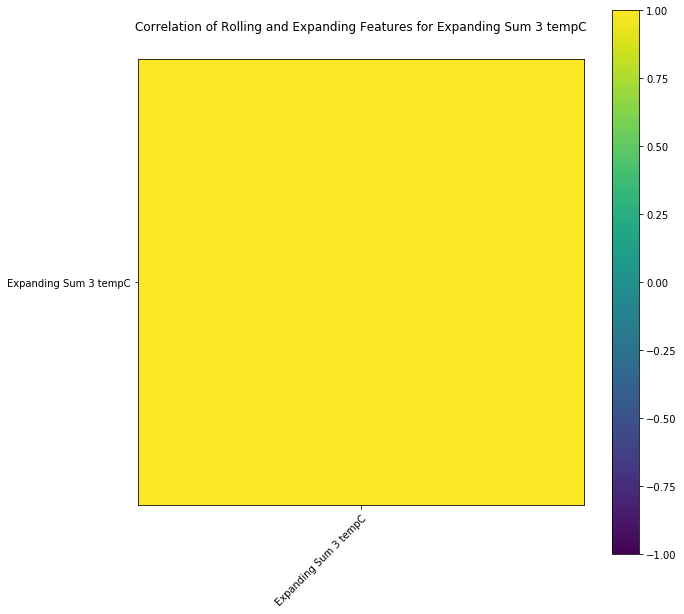

Expanding Mean 3 tempC
Rolling W Done
Expanding Done


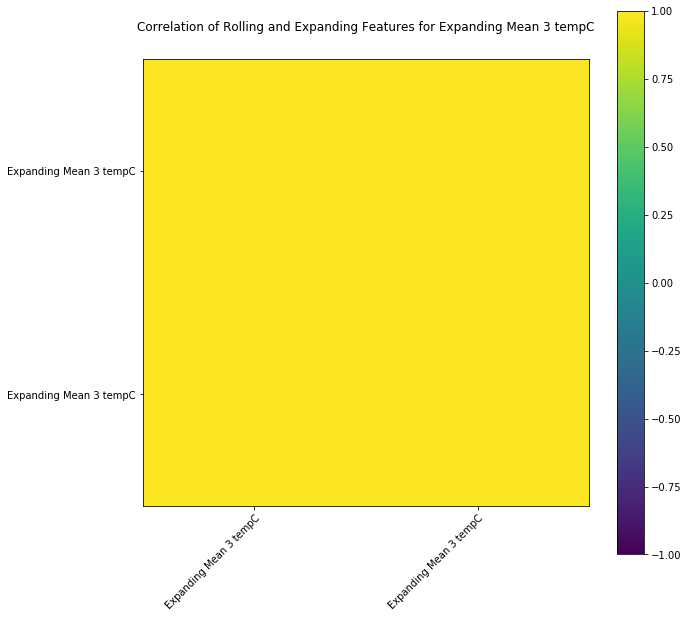

Expanding Min 4 tempC
Rolling W Done
Expanding Done


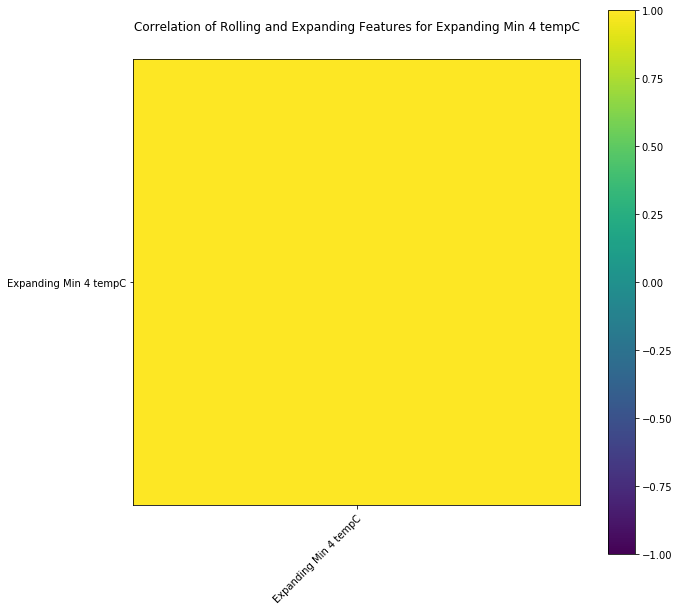

Expanding Max 4 tempC
Rolling W Done
Expanding Done


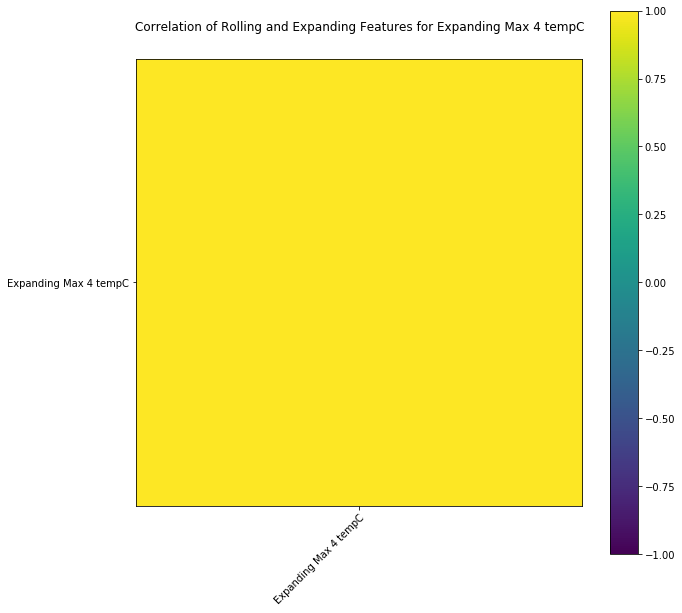

Expanding Sum 4 tempC
Rolling W Done
Expanding Done


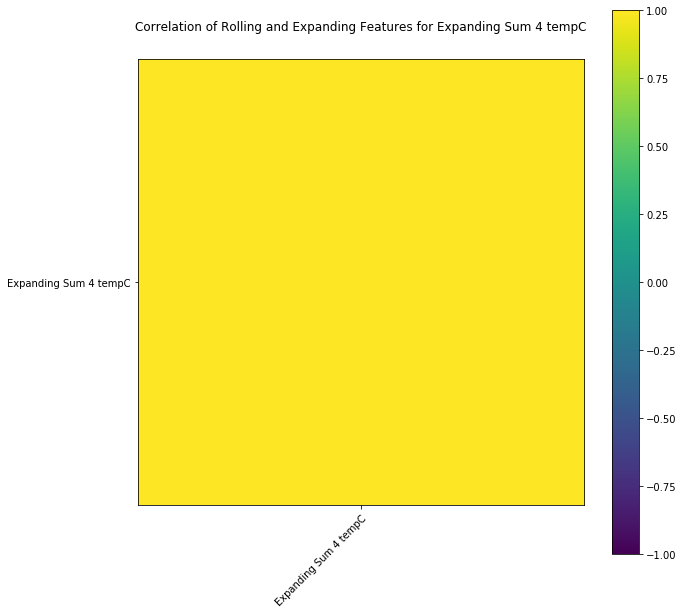

Expanding Mean 4 tempC
Rolling W Done
Expanding Done


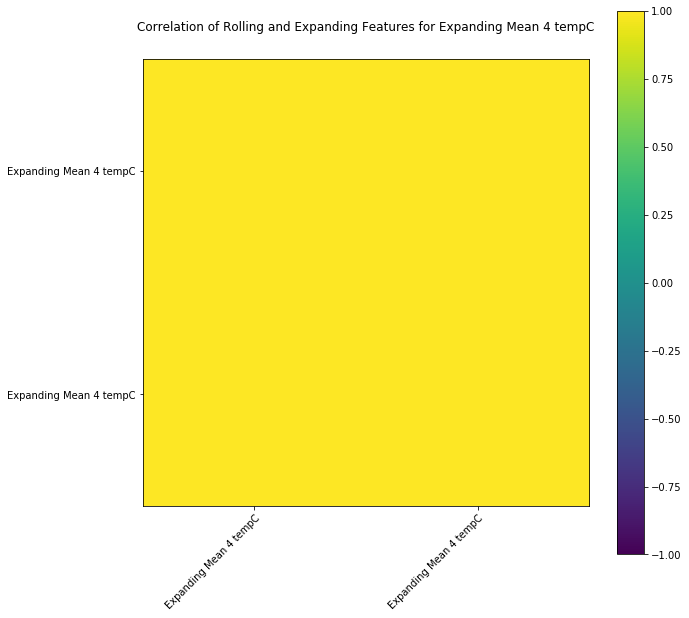

Expanding Min 8 tempC
Rolling W Done
Expanding Done


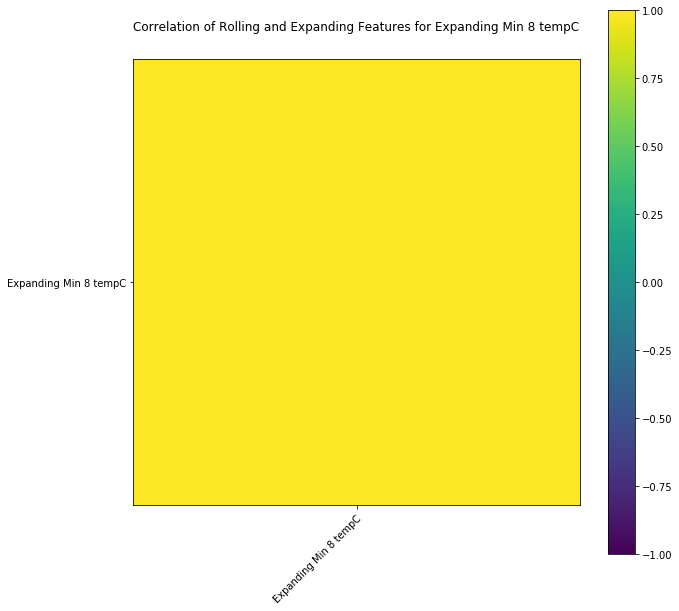

Expanding Max 8 tempC
Rolling W Done
Expanding Done


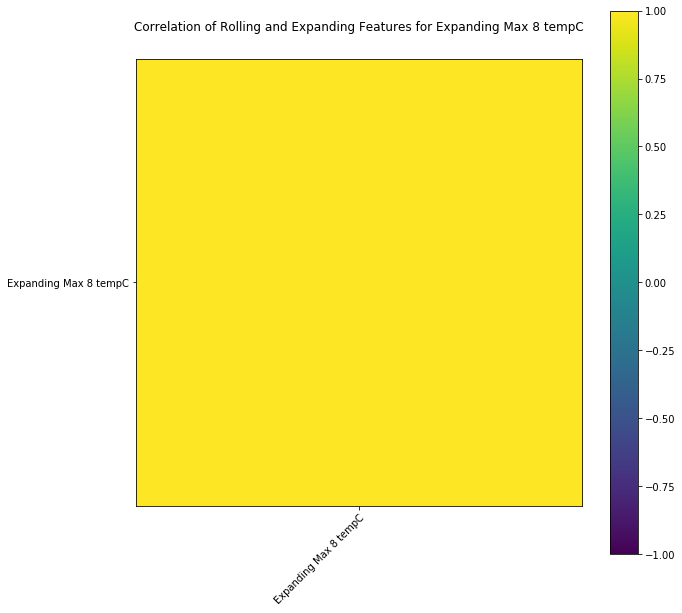

Expanding Sum 8 tempC
Rolling W Done
Expanding Done


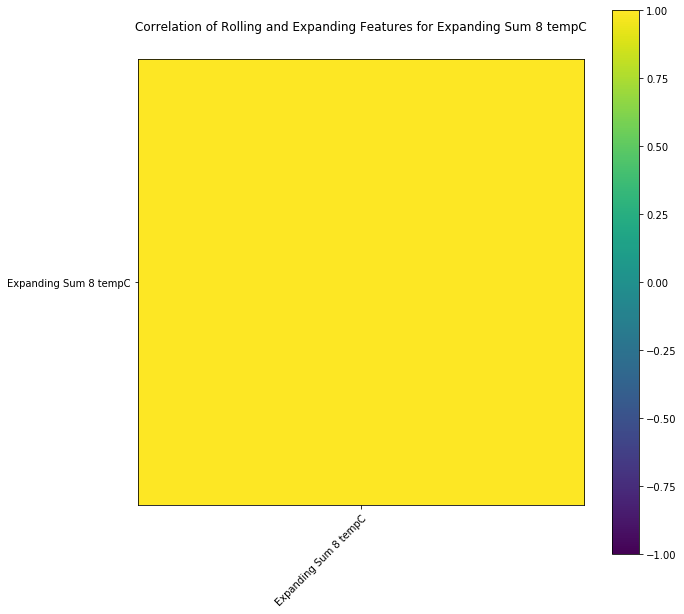

Expanding Mean 8 tempC
Rolling W Done
Expanding Done


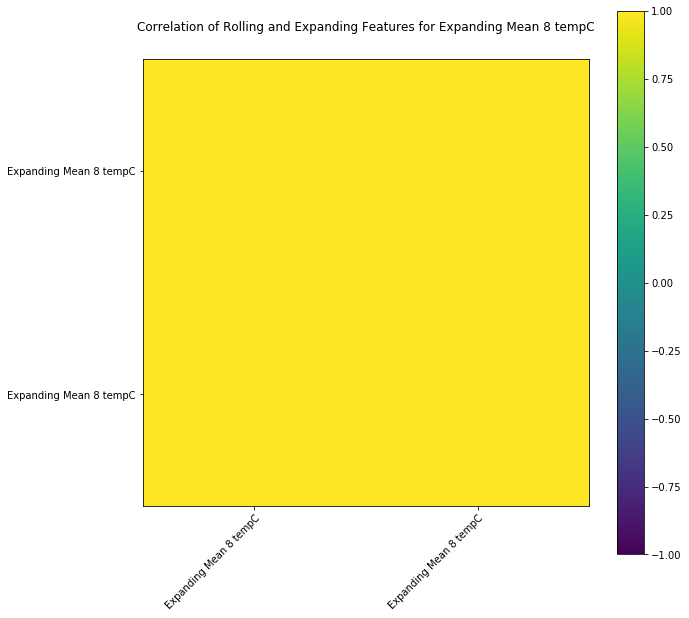

Expanding Min 12 tempC
Rolling W Done
Expanding Done


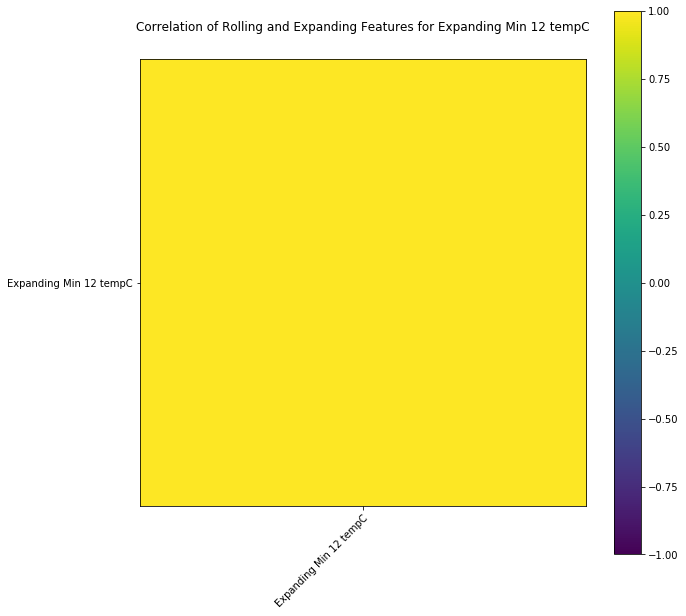

Expanding Max 12 tempC
Rolling W Done
Expanding Done


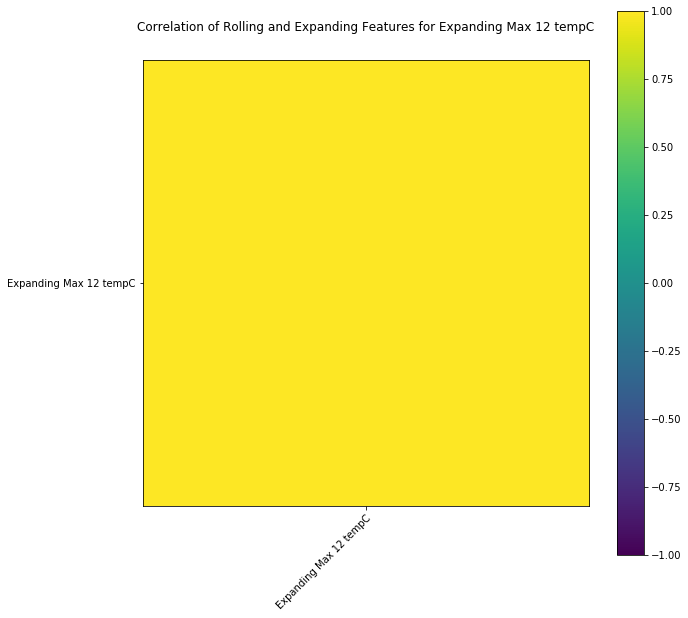

Expanding Sum 12 tempC
Rolling W Done
Expanding Done


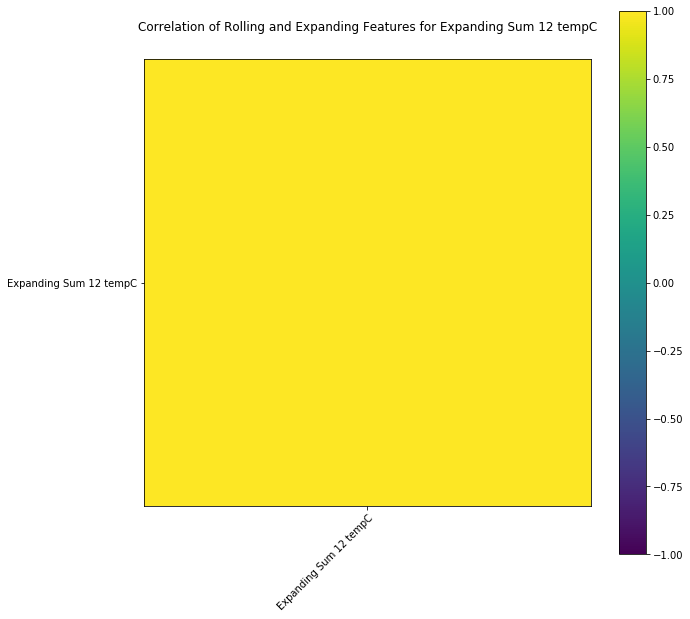

Expanding Mean 12 tempC
Rolling W Done
Expanding Done


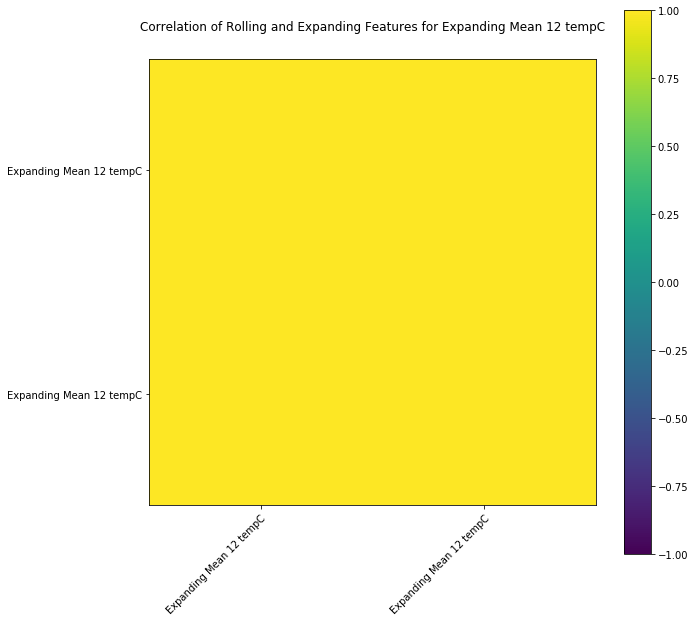

Expanding Min 16 tempC
Rolling W Done
Expanding Done


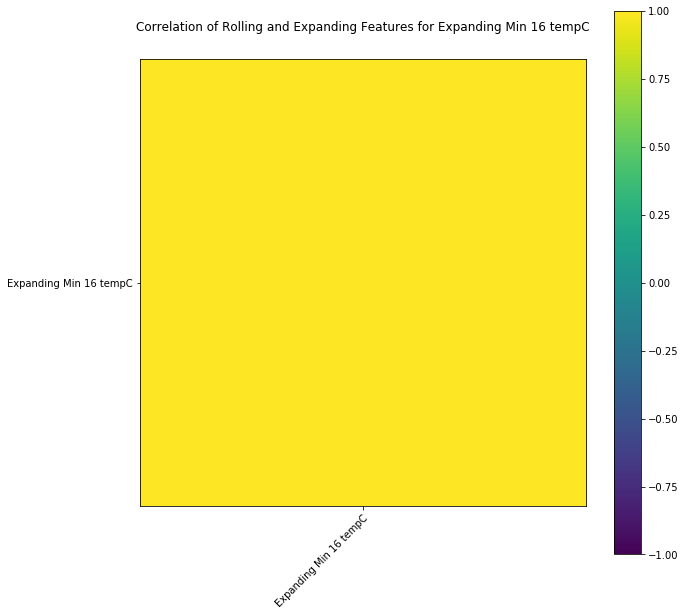

Expanding Max 16 tempC
Rolling W Done
Expanding Done


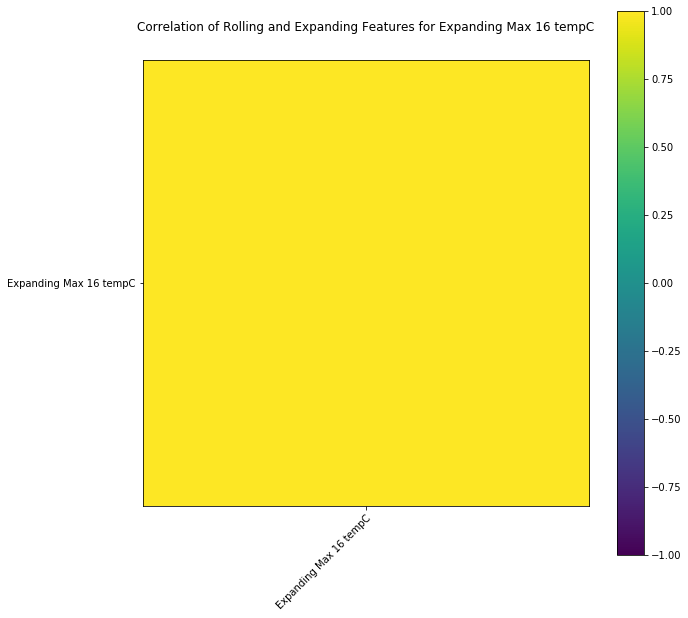

Expanding Sum 16 tempC
Rolling W Done
Expanding Done


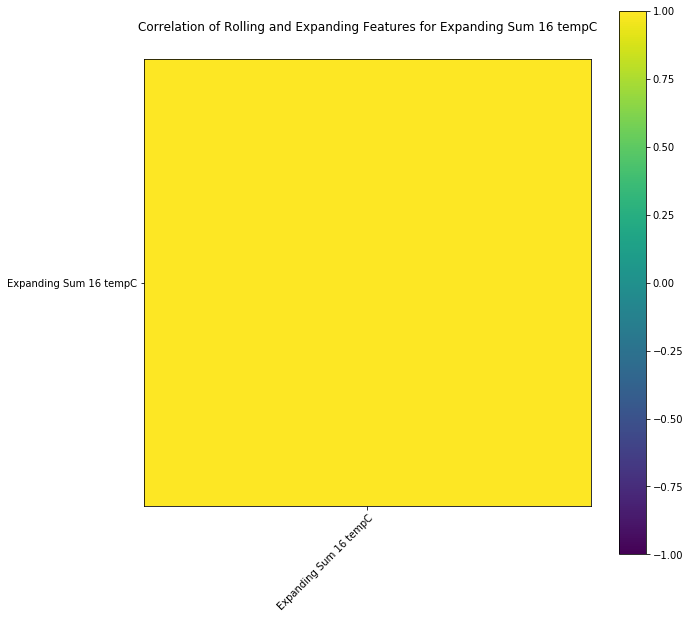

Expanding Mean 16 tempC
Rolling W Done
Expanding Done


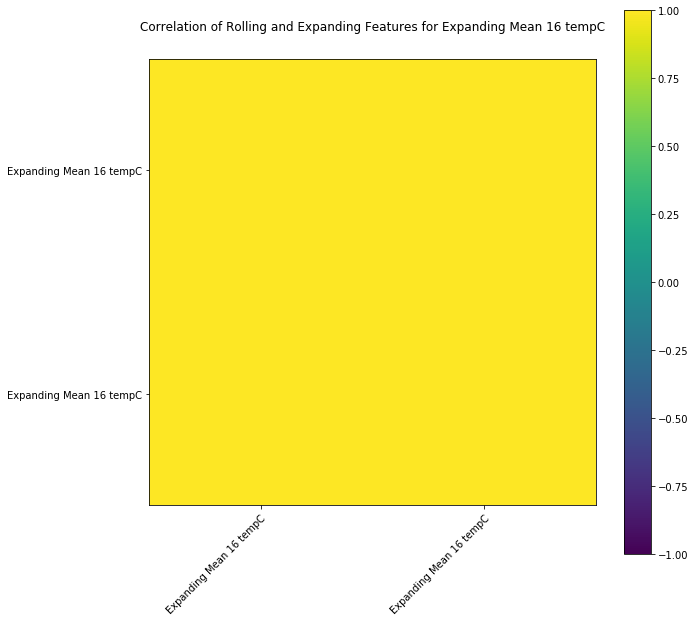

Expanding Min 24 tempC
Rolling W Done
Expanding Done


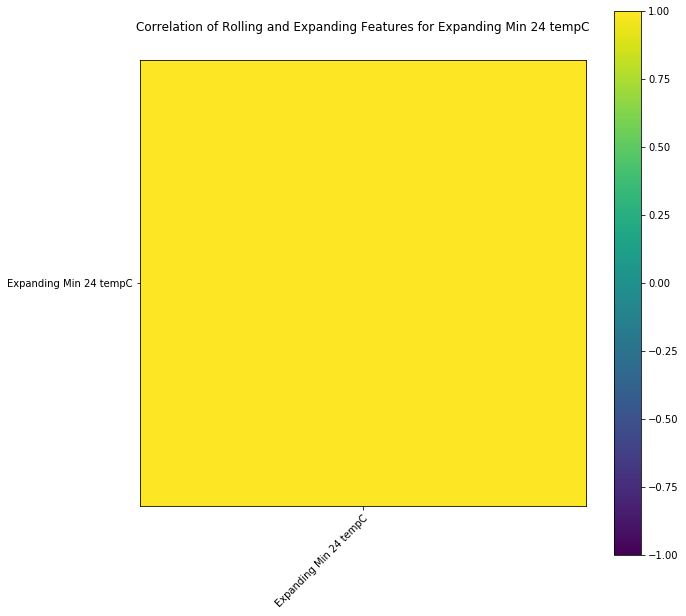

Expanding Max 24 tempC
Rolling W Done
Expanding Done


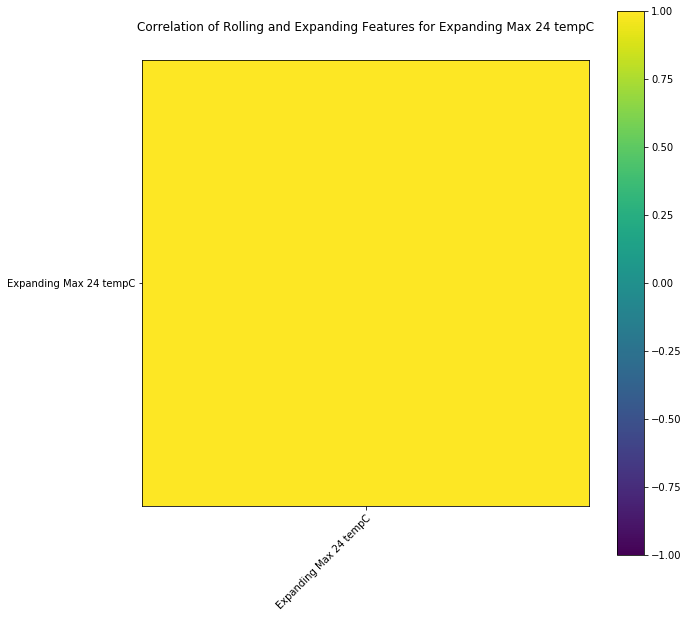

Expanding Sum 24 tempC
Rolling W Done
Expanding Done


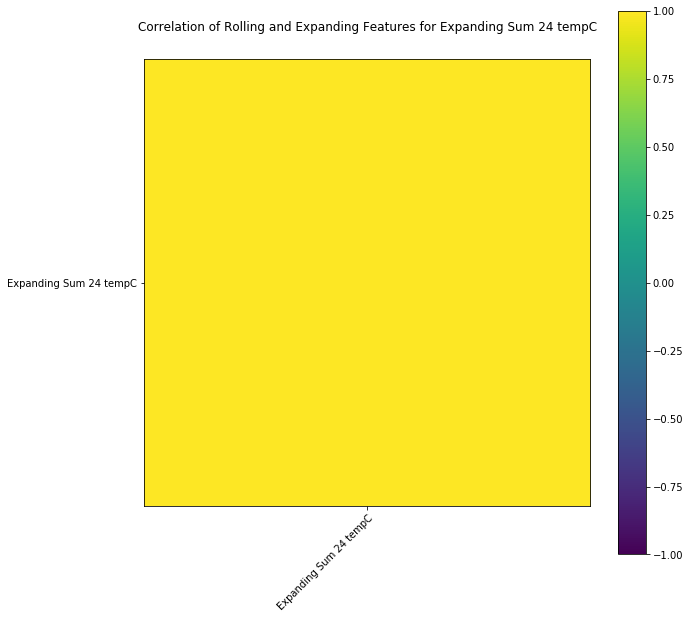

Expanding Mean 24 tempC
Rolling W Done
Expanding Done


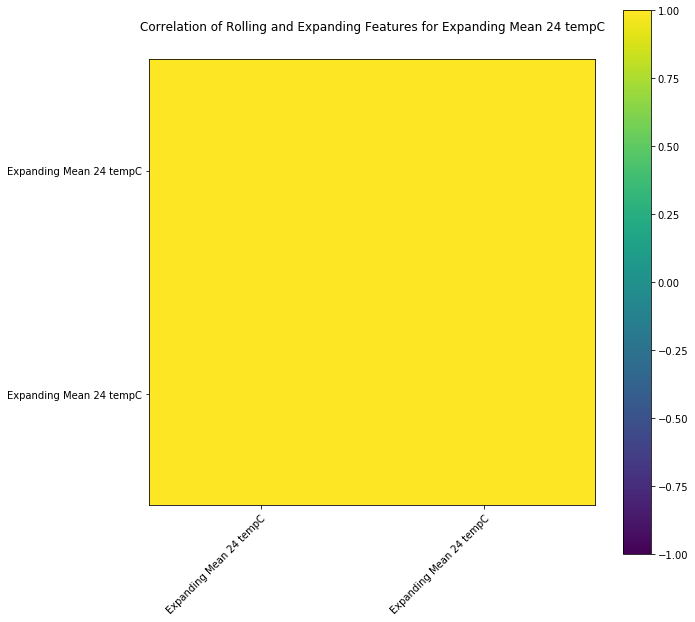

Expanding Min 48 tempC
Rolling W Done
Expanding Done


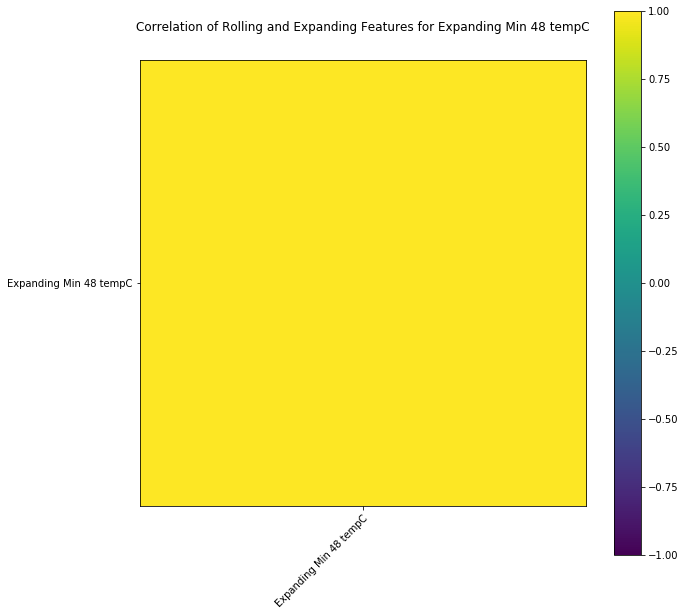

Expanding Max 48 tempC
Rolling W Done
Expanding Done


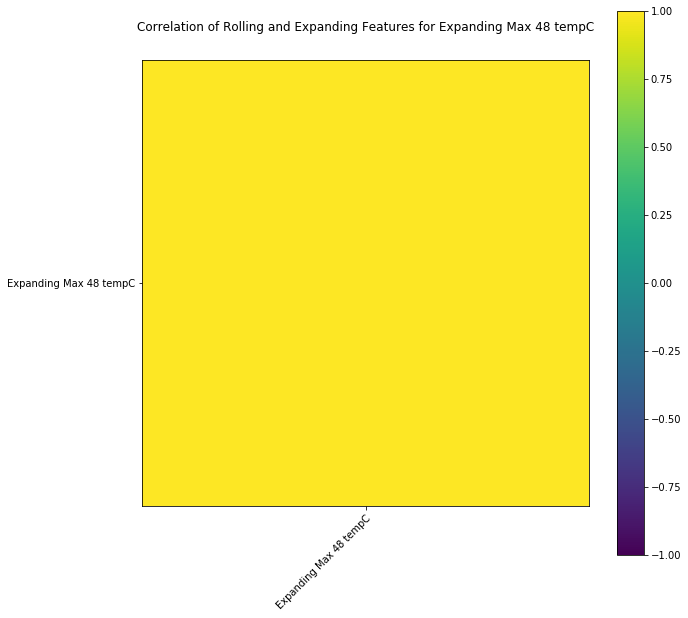

Expanding Sum 48 tempC
Rolling W Done
Expanding Done


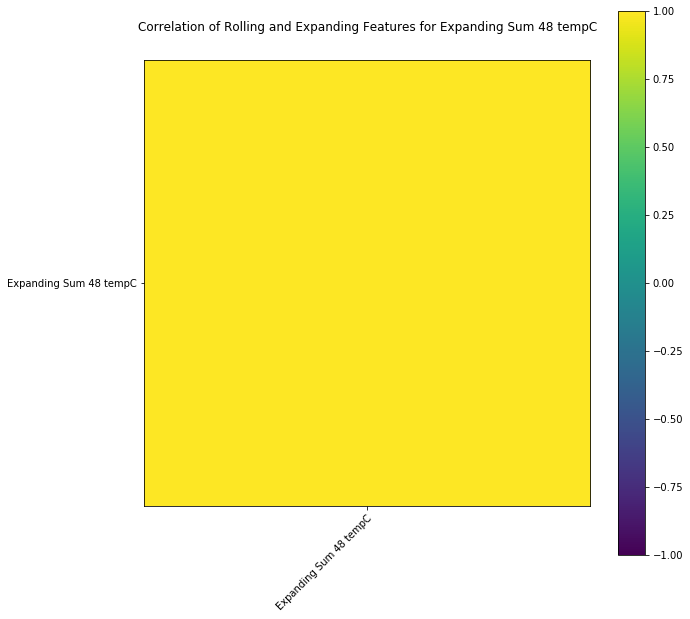

Expanding Mean 48 tempC
Rolling W Done
Expanding Done


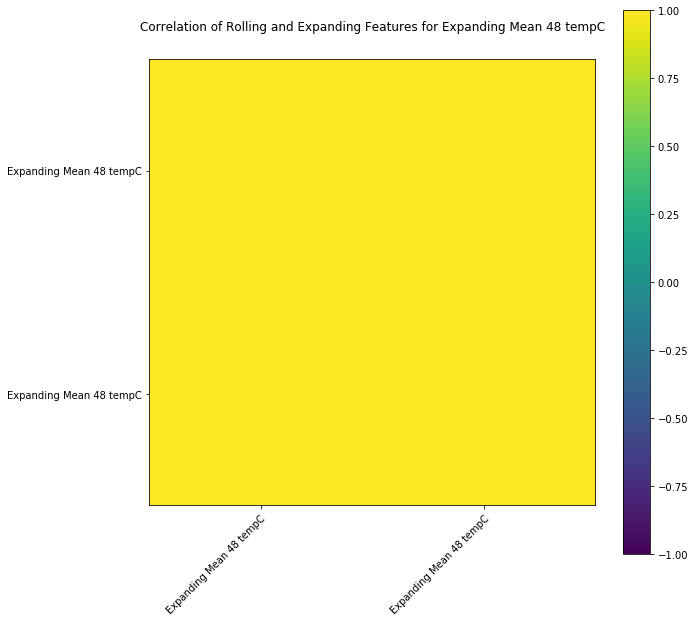

Expanding Min 96 tempC
Rolling W Done
Expanding Done


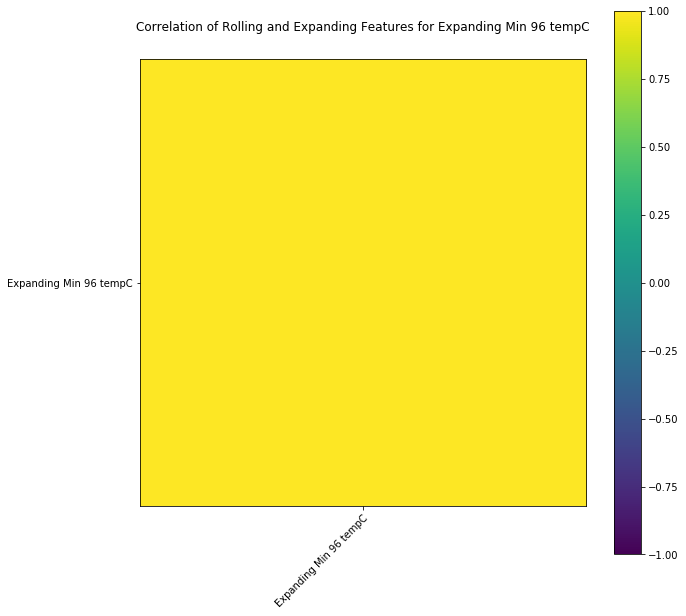

Expanding Max 96 tempC
Rolling W Done
Expanding Done


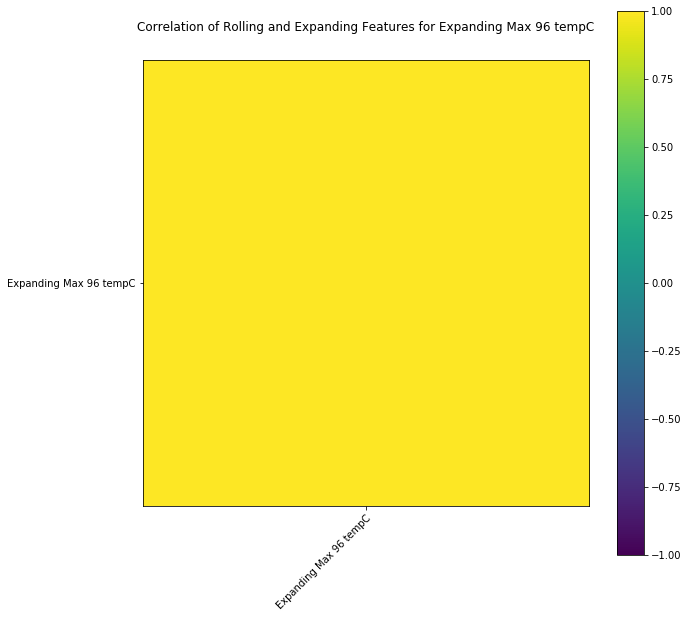

Expanding Sum 96 tempC
Rolling W Done
Expanding Done


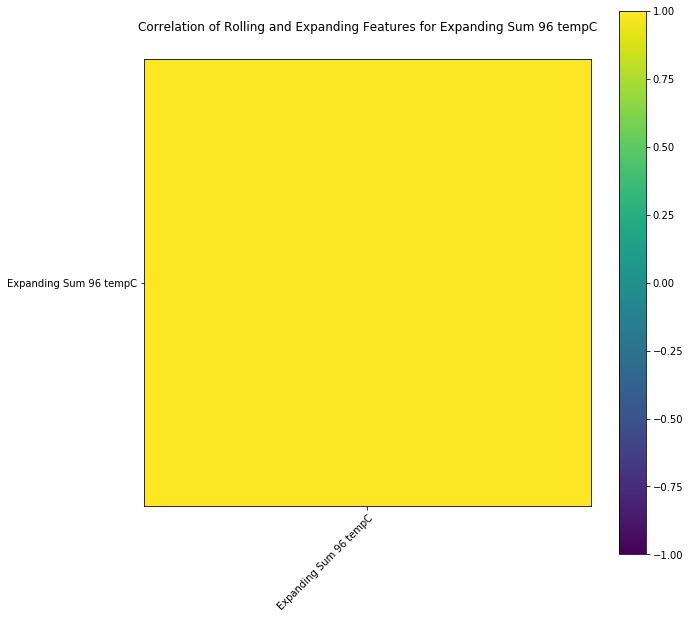

Expanding Mean 96 tempC
Rolling W Done
Expanding Done


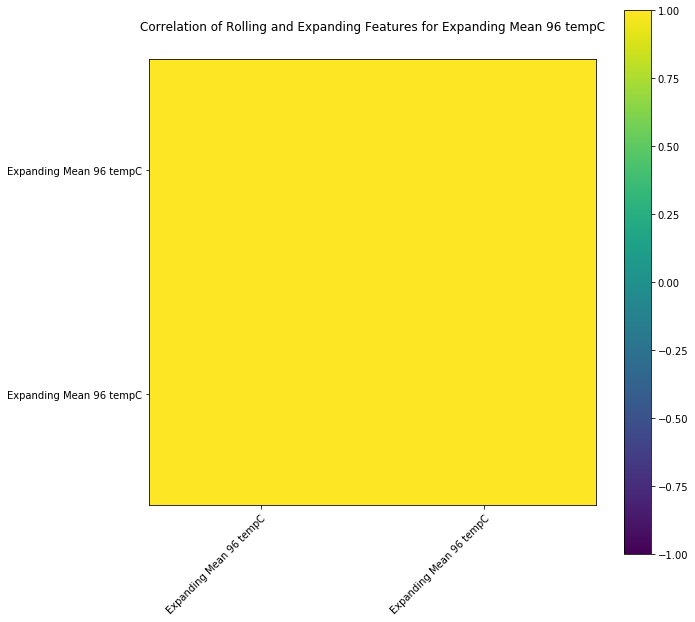

Expanding Min 2 windspeedMiles
Rolling W Done
Expanding Done


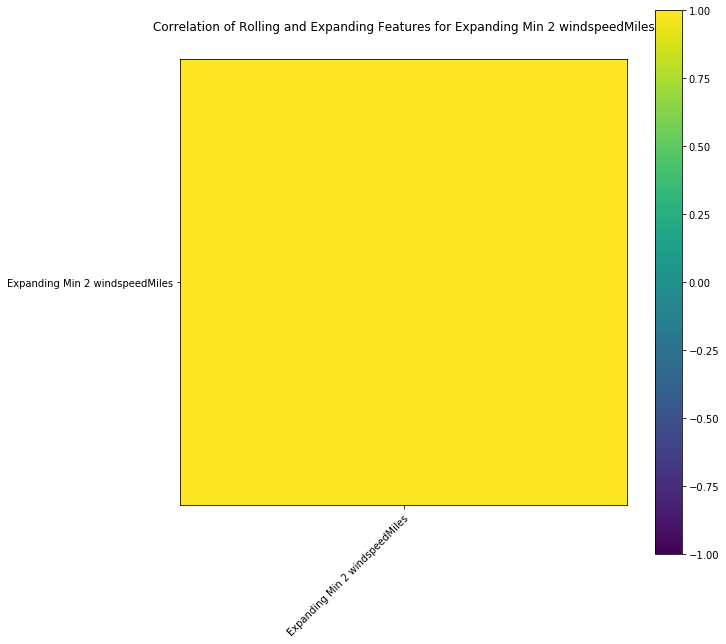

Expanding Max 2 windspeedMiles
Rolling W Done
Expanding Done


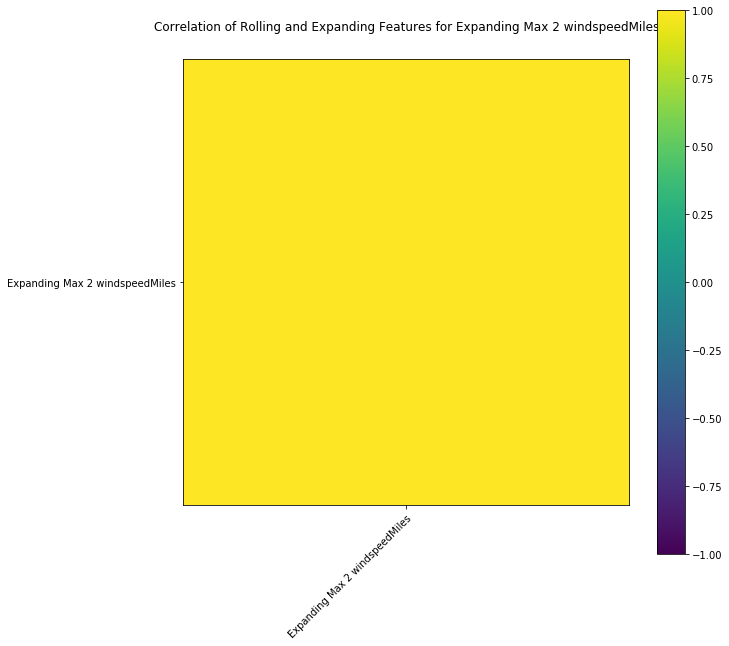

Expanding Sum 2 windspeedMiles
Rolling W Done
Expanding Done


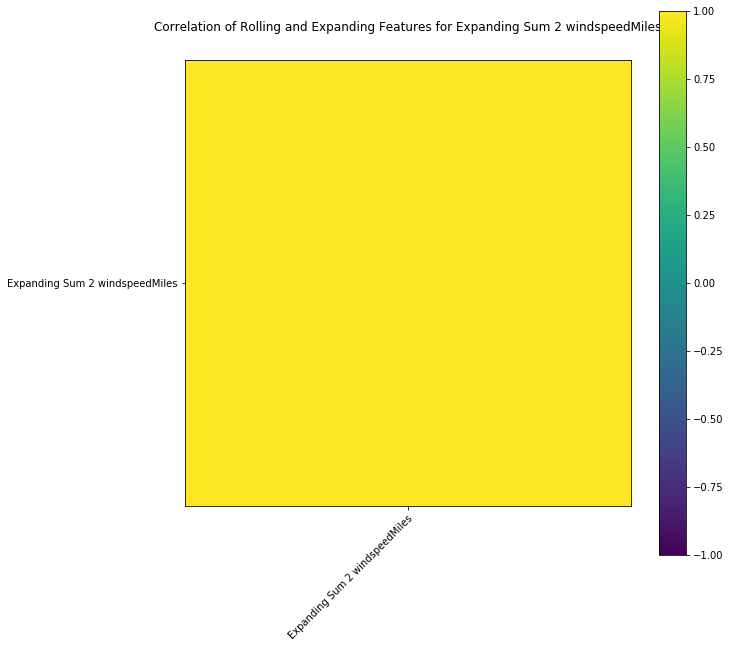

Expanding Mean 2 windspeedMiles
Rolling W Done
Expanding Done


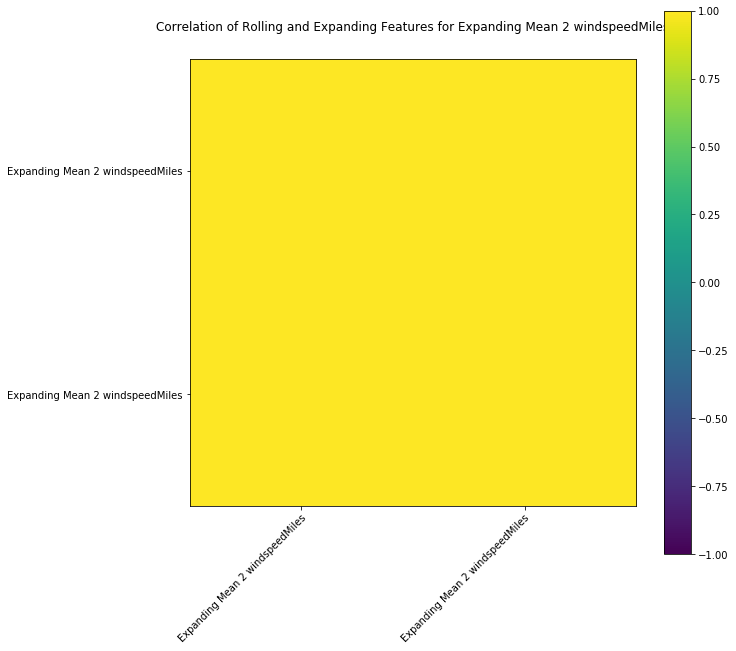

Expanding Min 3 windspeedMiles
Rolling W Done
Expanding Done


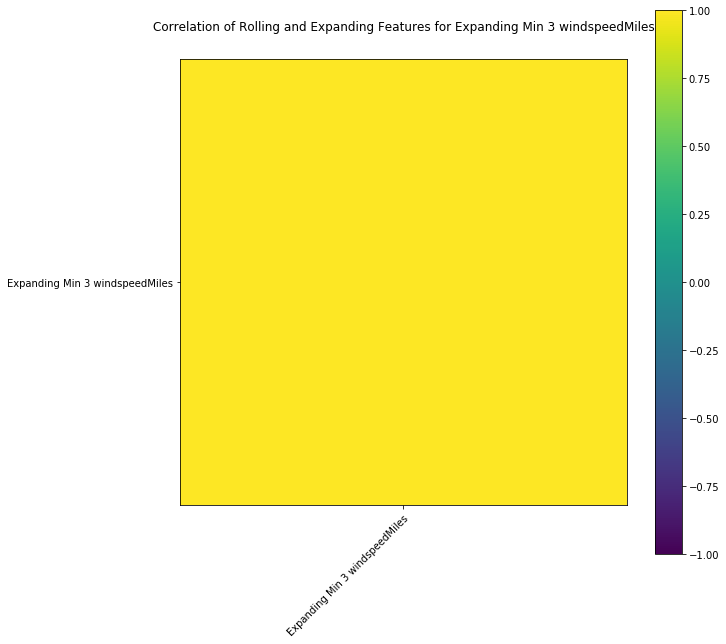

Expanding Max 3 windspeedMiles
Rolling W Done
Expanding Done


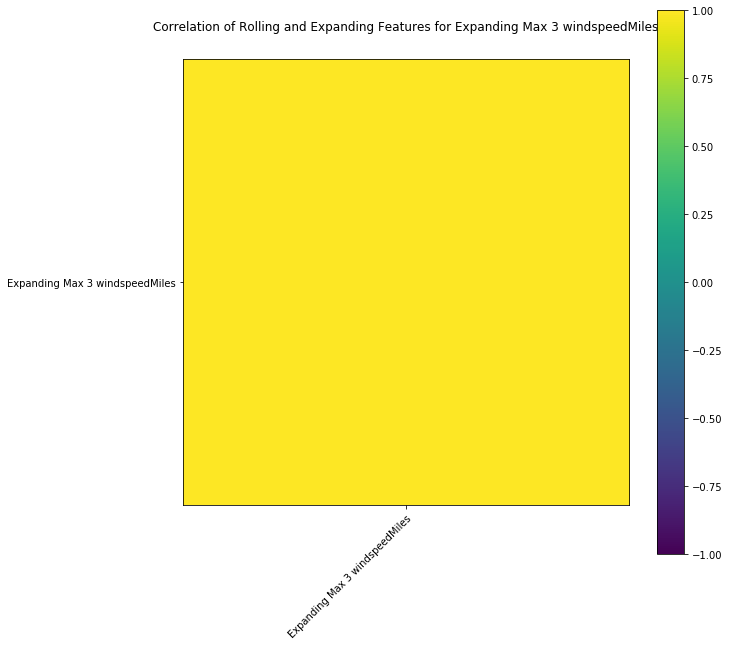

Expanding Sum 3 windspeedMiles
Rolling W Done
Expanding Done


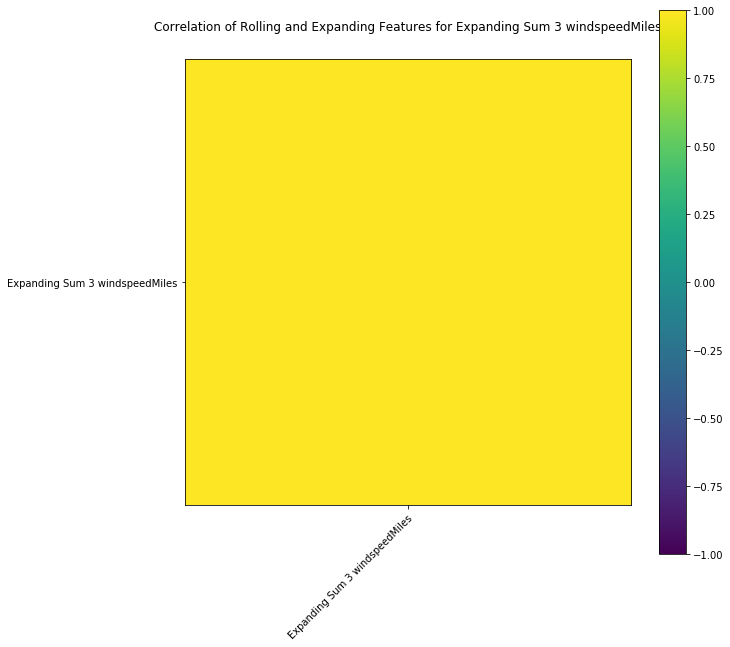

Expanding Mean 3 windspeedMiles
Rolling W Done
Expanding Done


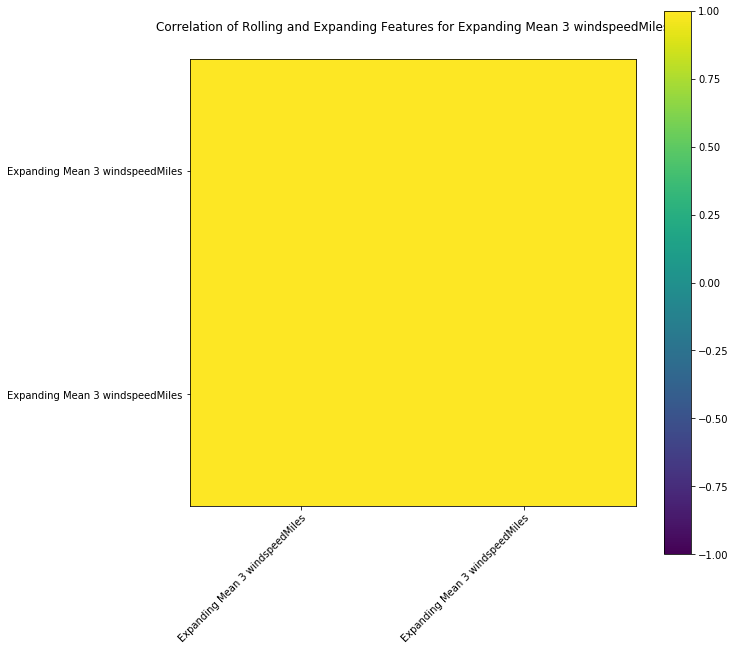

Expanding Min 4 windspeedMiles
Rolling W Done
Expanding Done


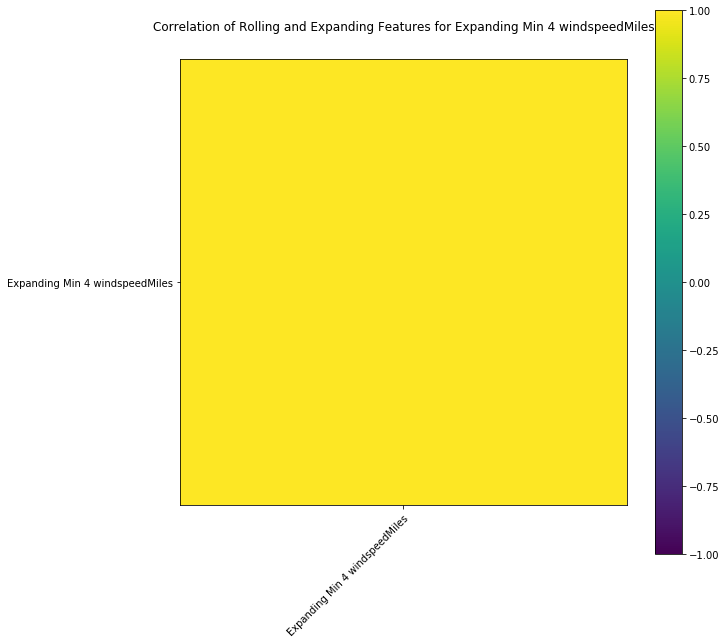

Expanding Max 4 windspeedMiles
Rolling W Done
Expanding Done


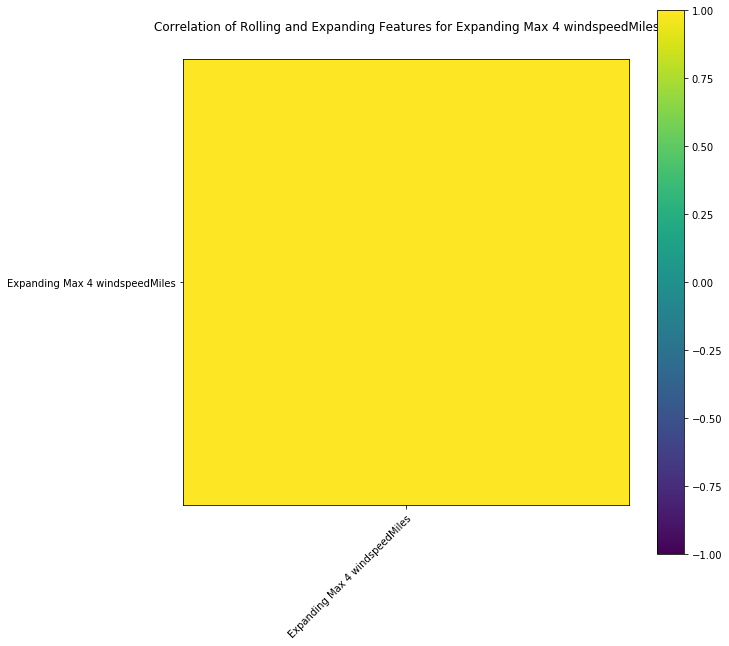

Expanding Sum 4 windspeedMiles
Rolling W Done
Expanding Done


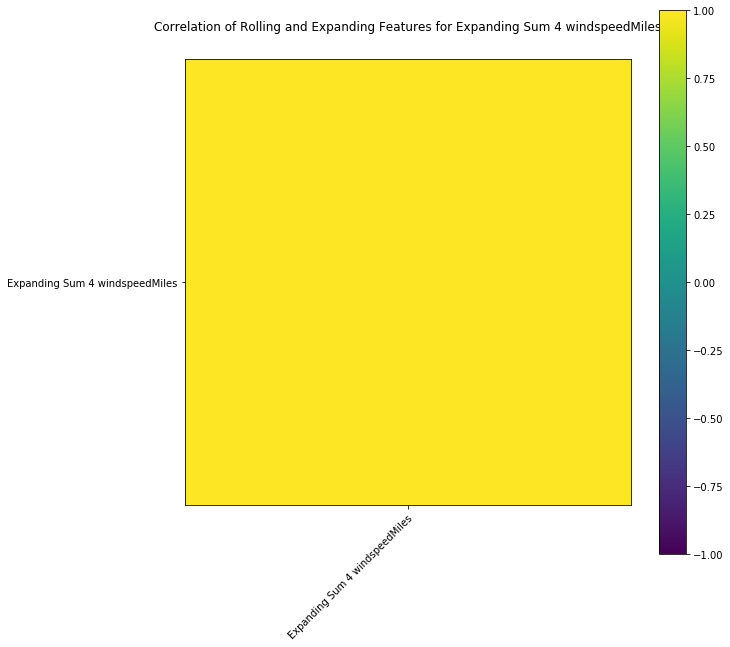

Expanding Mean 4 windspeedMiles
Rolling W Done
Expanding Done


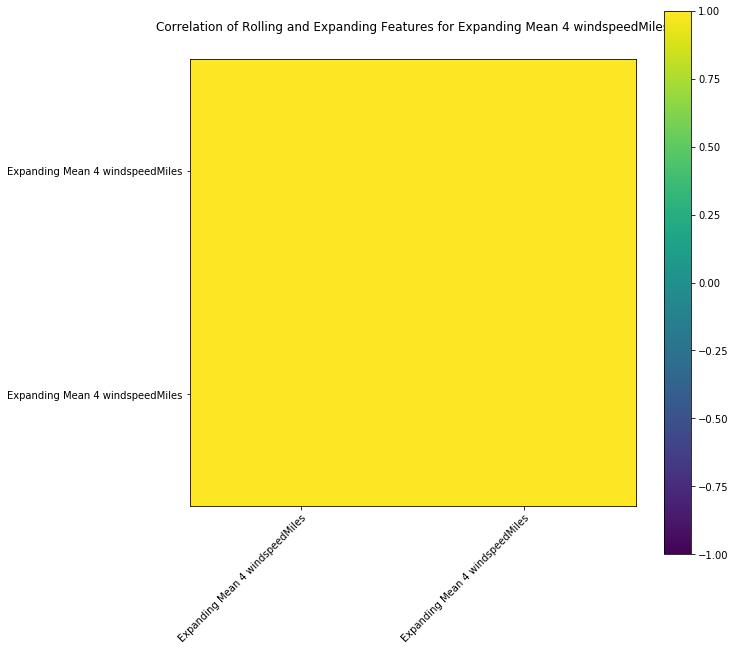

Expanding Min 8 windspeedMiles
Rolling W Done
Expanding Done


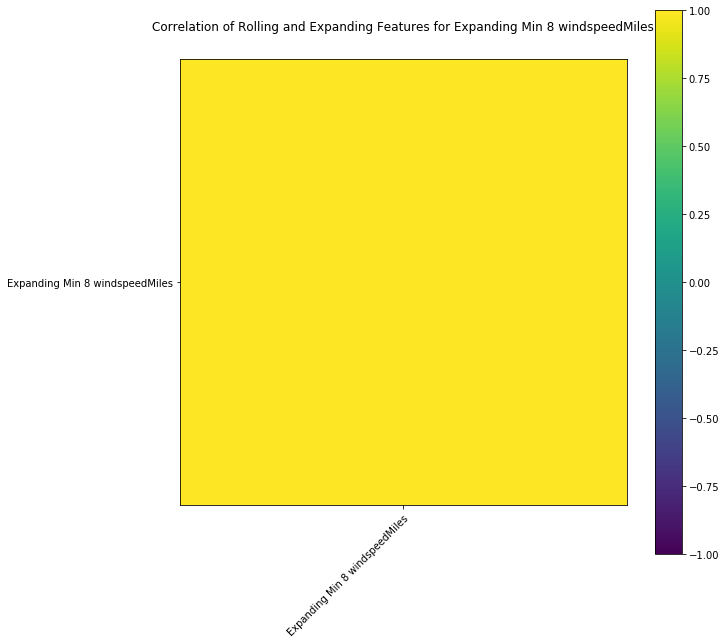

Expanding Max 8 windspeedMiles
Rolling W Done
Expanding Done


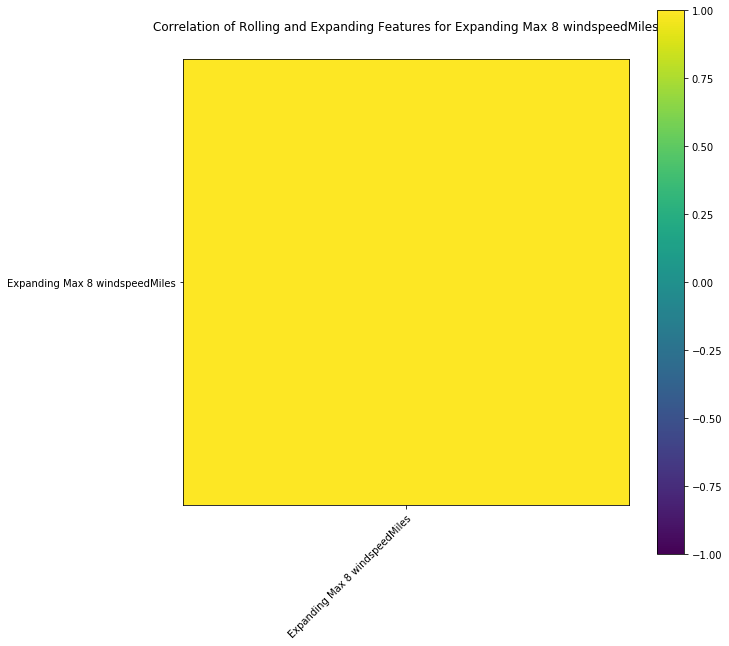

Expanding Sum 8 windspeedMiles
Rolling W Done
Expanding Done


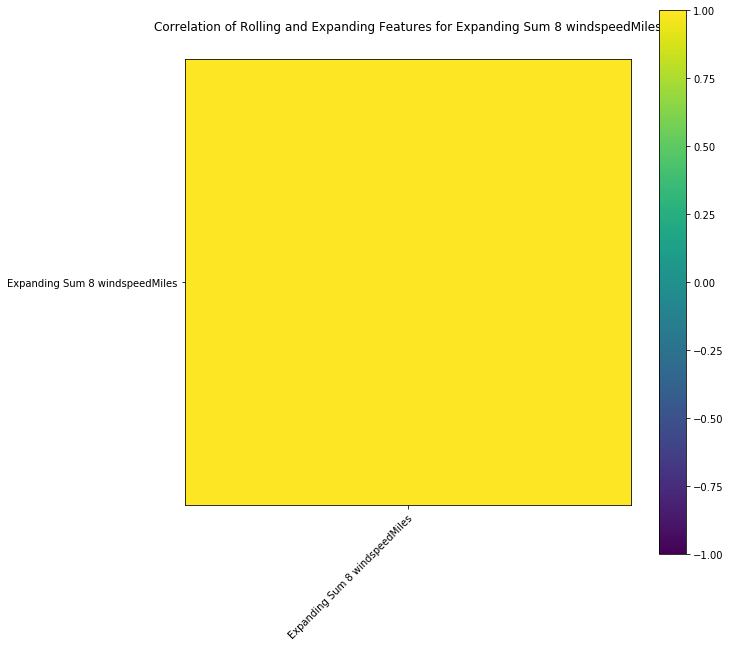

Expanding Mean 8 windspeedMiles
Rolling W Done
Expanding Done


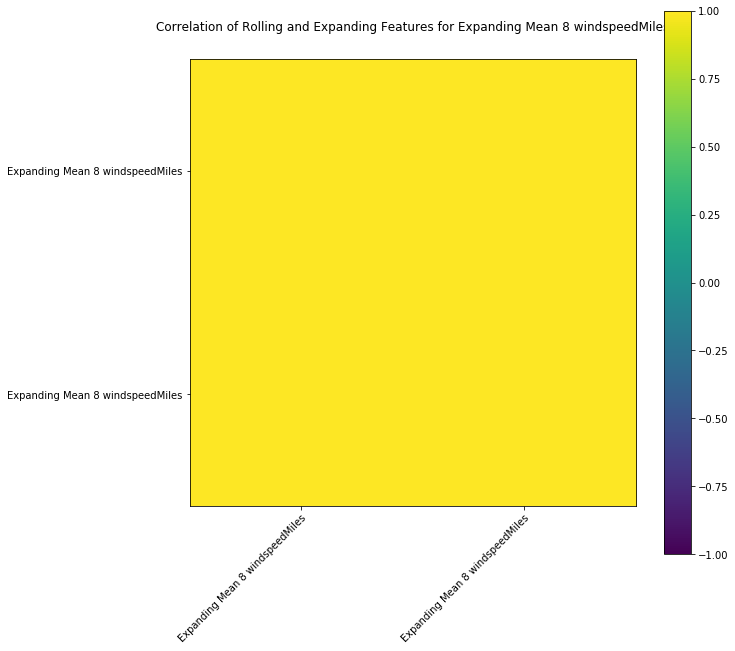

Expanding Min 12 windspeedMiles
Rolling W Done
Expanding Done


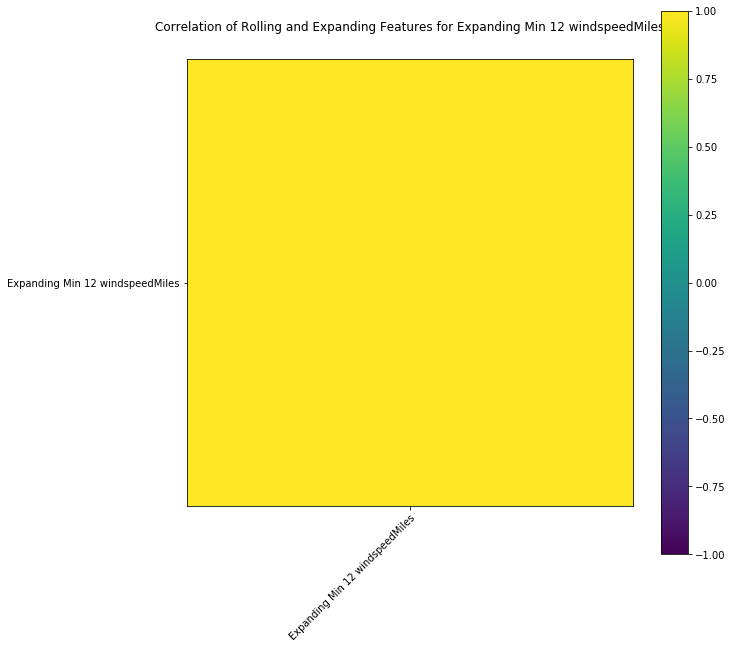

Expanding Max 12 windspeedMiles
Rolling W Done
Expanding Done


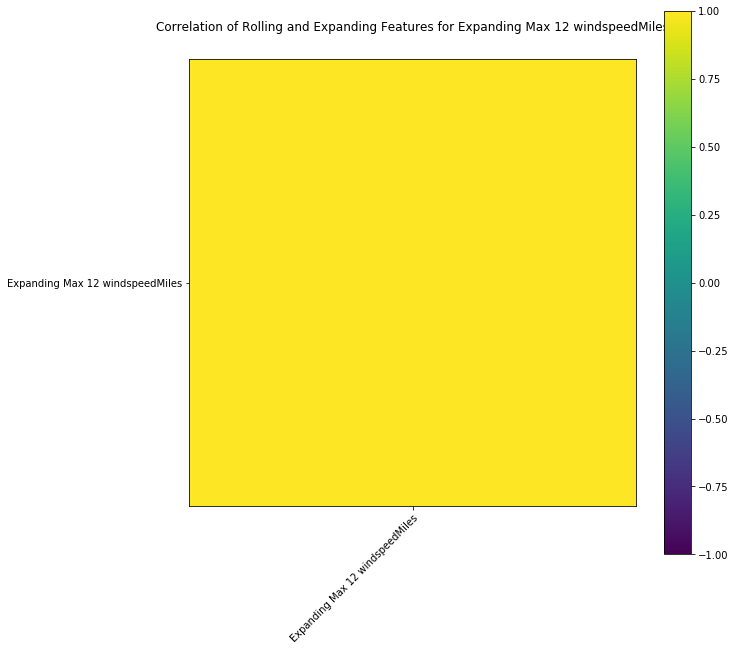

Expanding Sum 12 windspeedMiles
Rolling W Done
Expanding Done


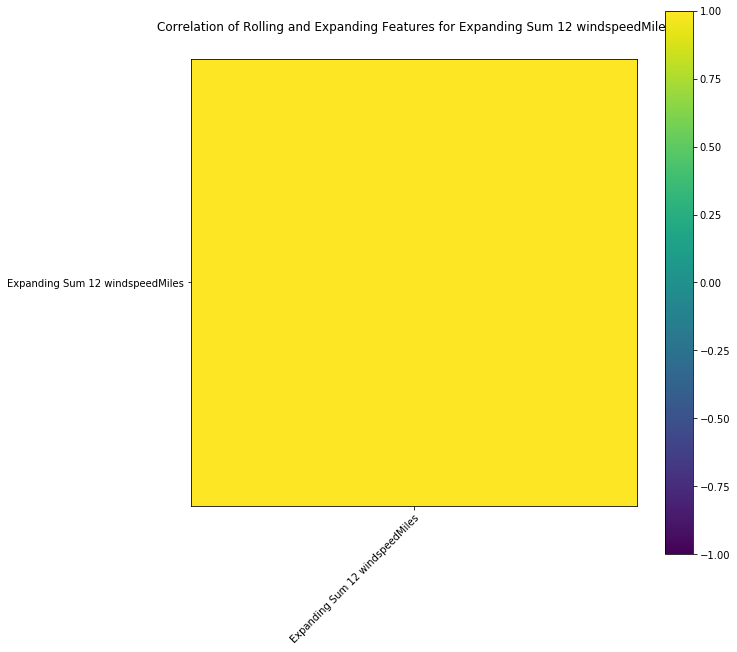

Expanding Mean 12 windspeedMiles
Rolling W Done
Expanding Done


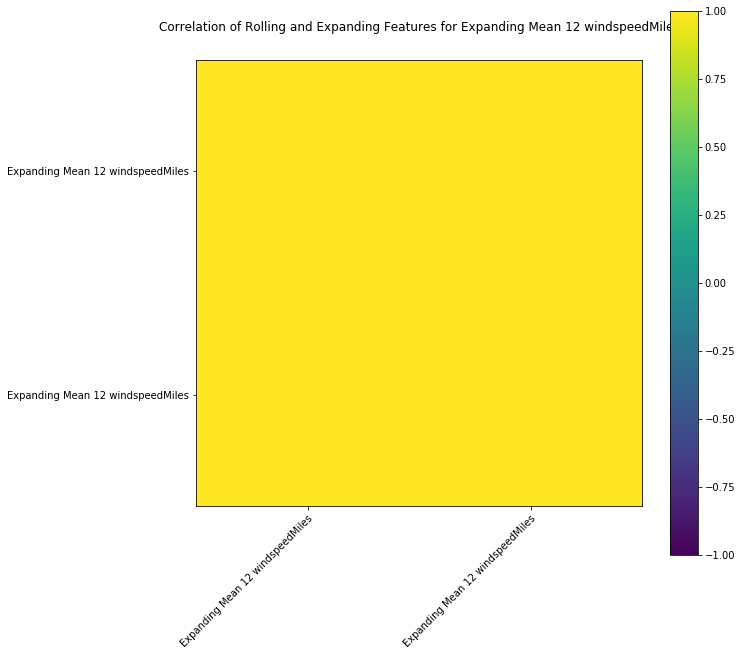

Expanding Min 16 windspeedMiles
Rolling W Done
Expanding Done


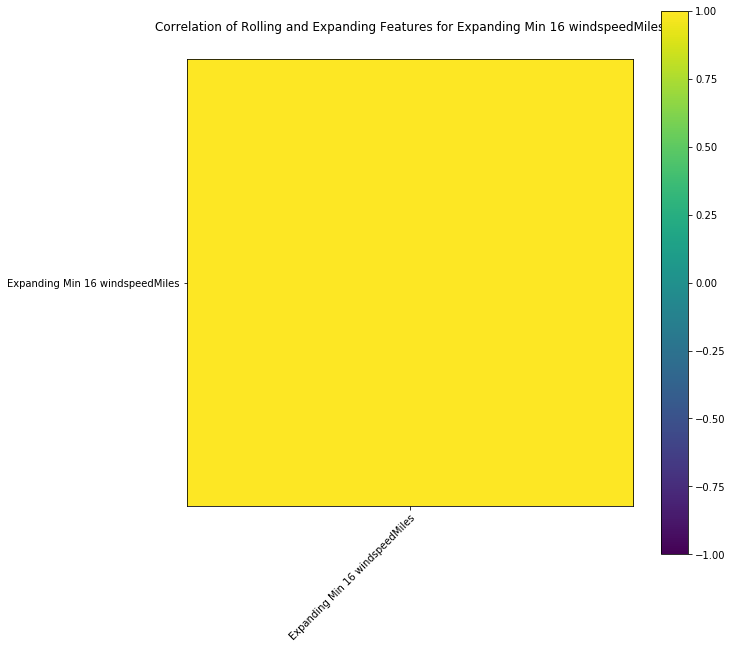

Expanding Max 16 windspeedMiles
Rolling W Done
Expanding Done


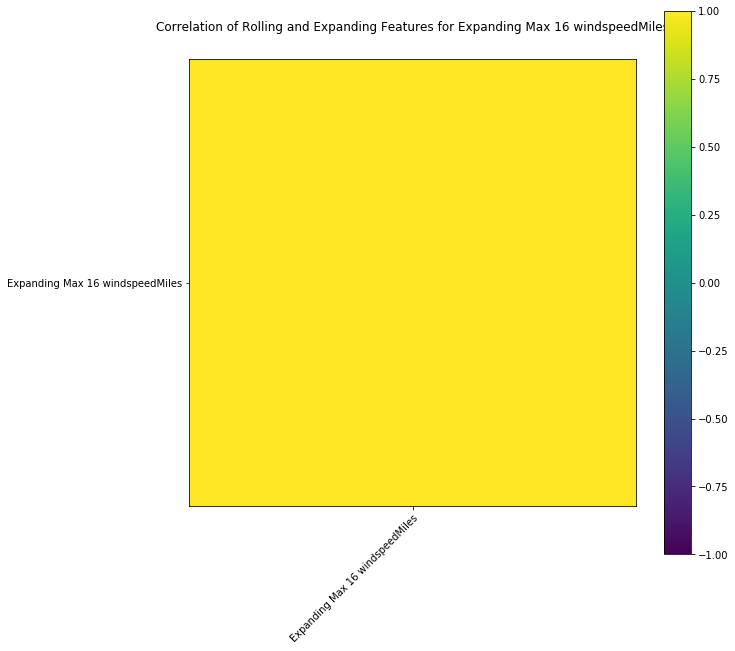

Expanding Sum 16 windspeedMiles
Rolling W Done
Expanding Done


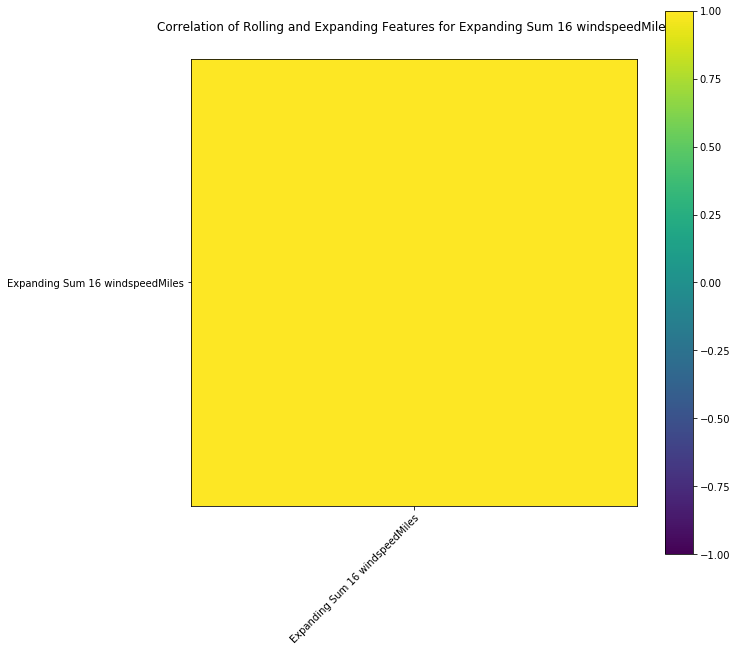

Expanding Mean 16 windspeedMiles
Rolling W Done
Expanding Done


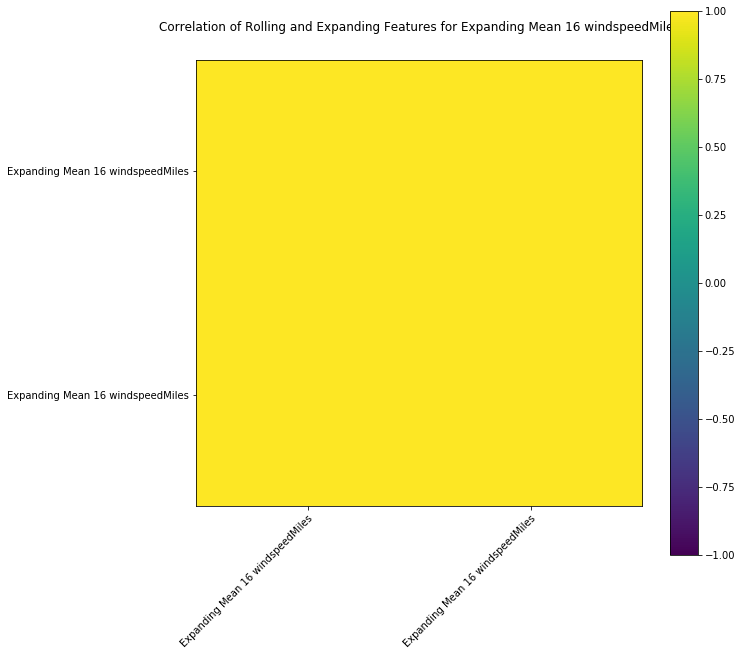

Expanding Min 24 windspeedMiles
Rolling W Done
Expanding Done


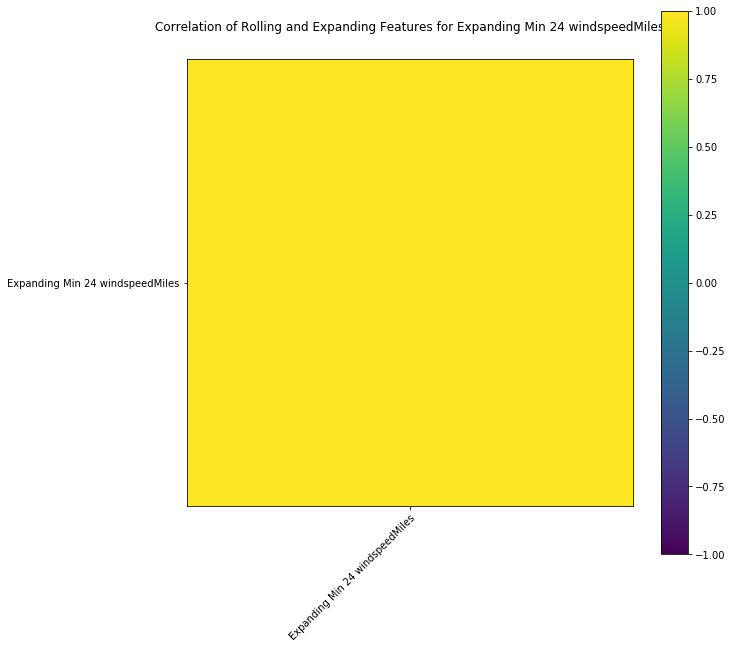

Expanding Max 24 windspeedMiles
Rolling W Done
Expanding Done


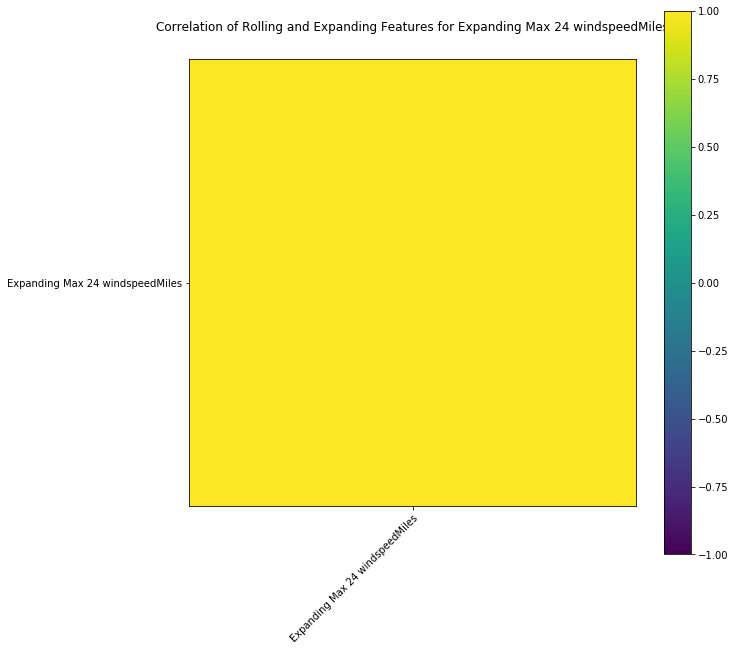

Expanding Sum 24 windspeedMiles
Rolling W Done
Expanding Done


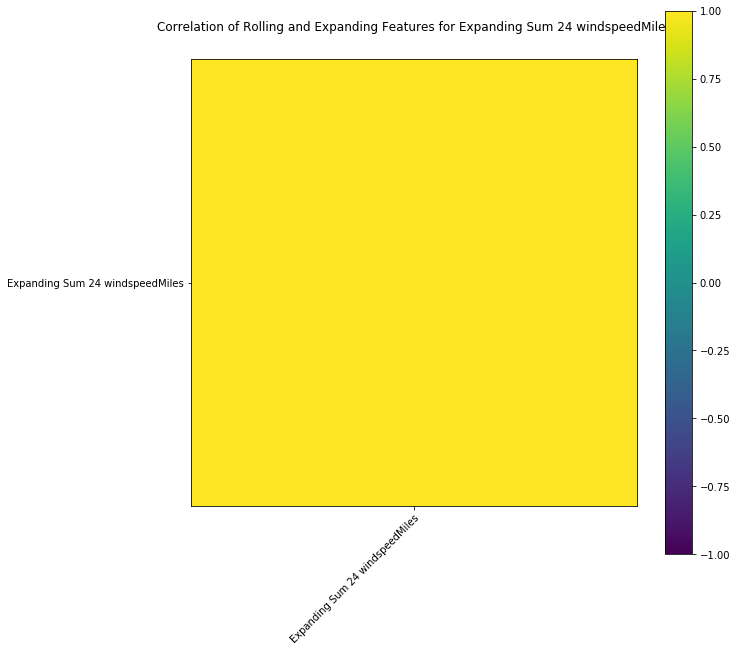

Expanding Mean 24 windspeedMiles
Rolling W Done
Expanding Done


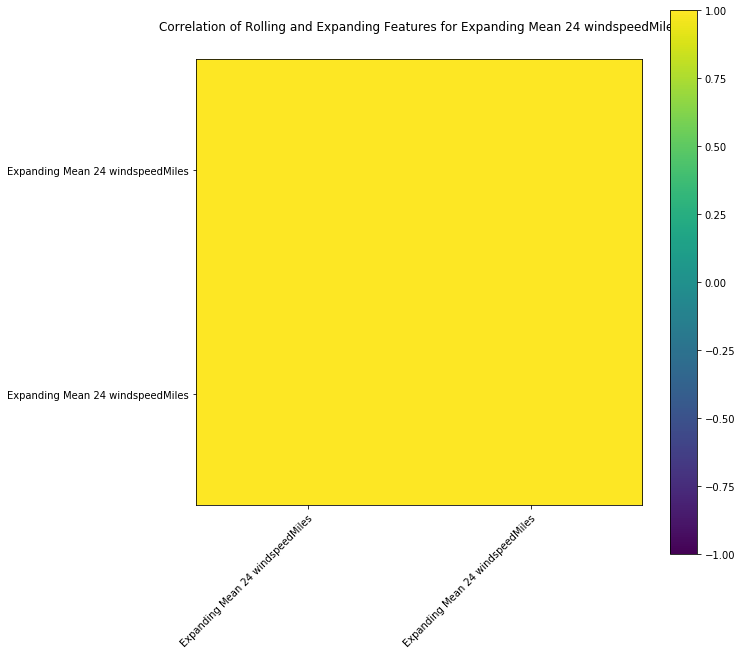

Expanding Min 48 windspeedMiles
Rolling W Done
Expanding Done


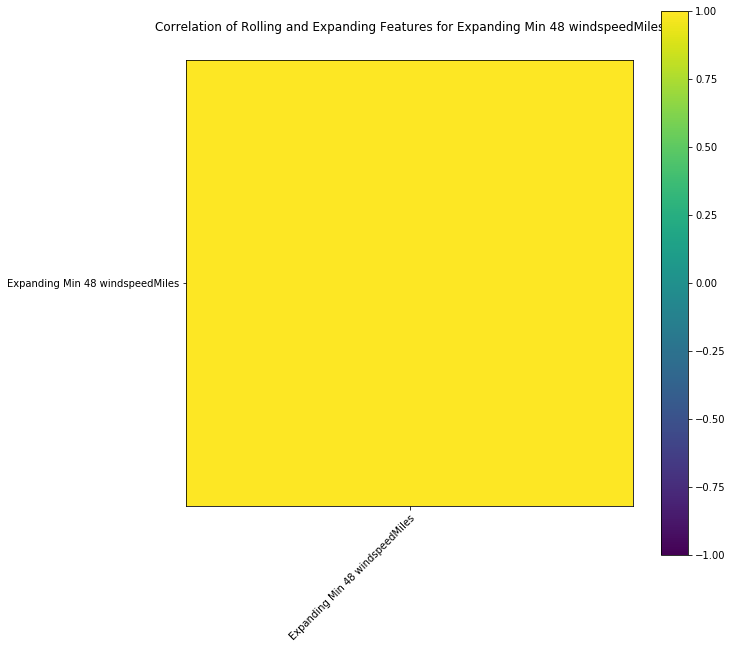

Expanding Max 48 windspeedMiles
Rolling W Done
Expanding Done


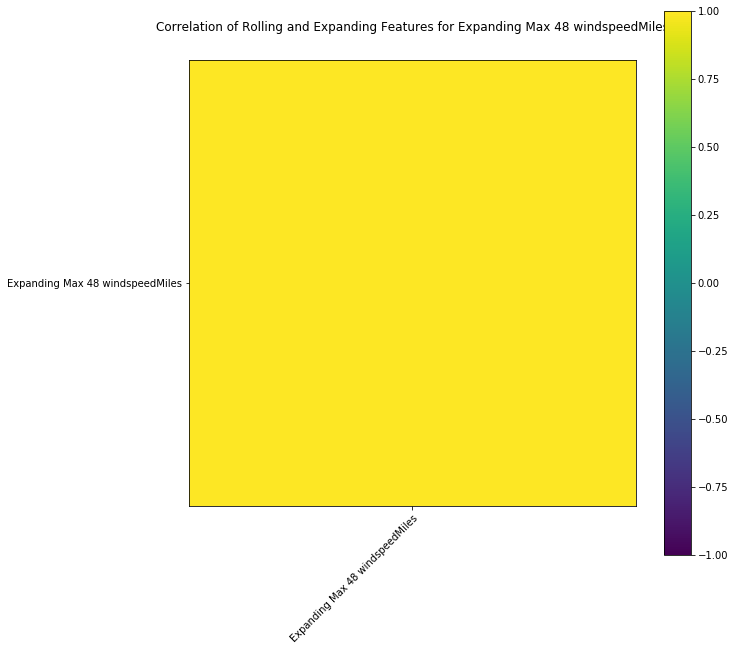

Expanding Sum 48 windspeedMiles
Rolling W Done
Expanding Done


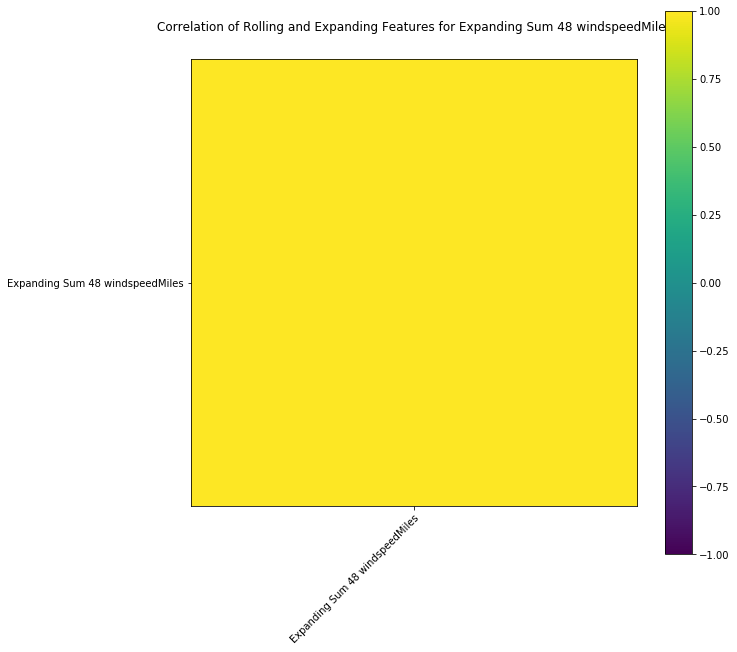

Expanding Mean 48 windspeedMiles
Rolling W Done
Expanding Done


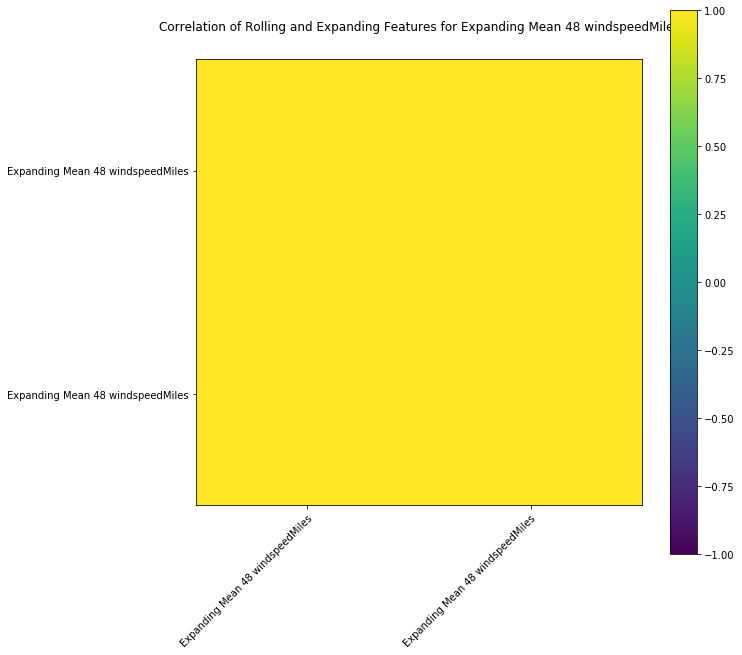

Expanding Min 96 windspeedMiles
Rolling W Done
Expanding Done


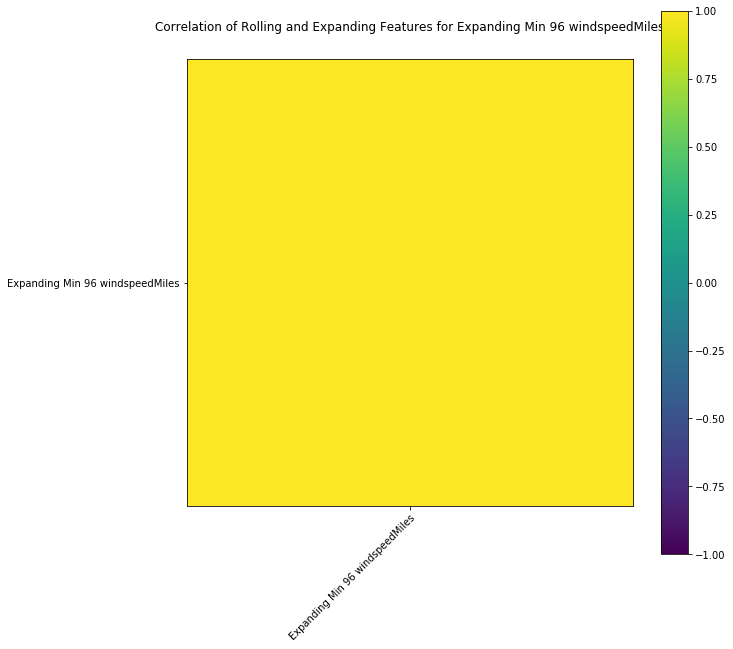

Expanding Max 96 windspeedMiles
Rolling W Done
Expanding Done


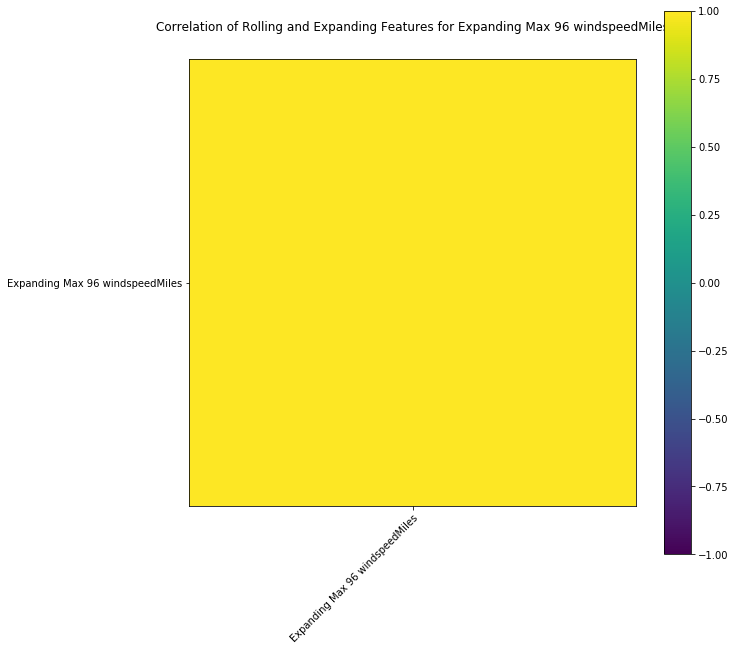

Expanding Sum 96 windspeedMiles
Rolling W Done
Expanding Done


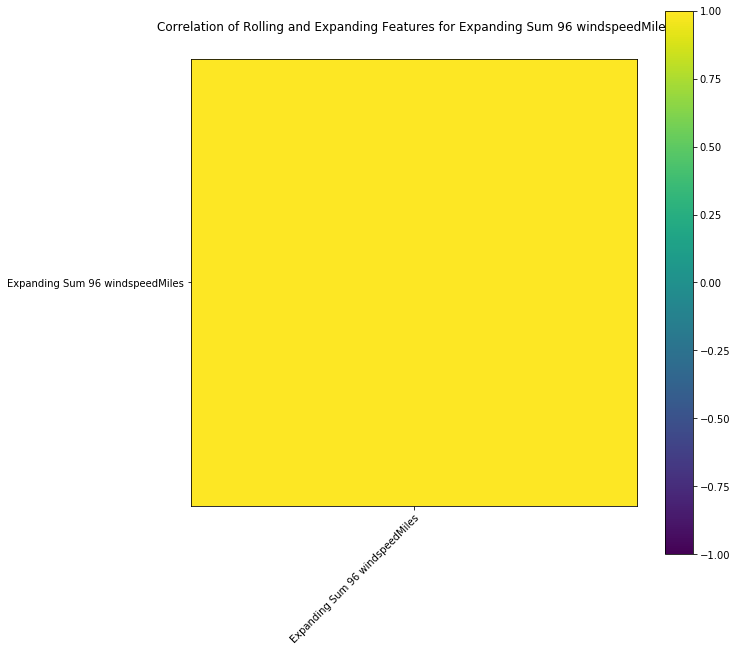

Expanding Mean 96 windspeedMiles
Rolling W Done
Expanding Done


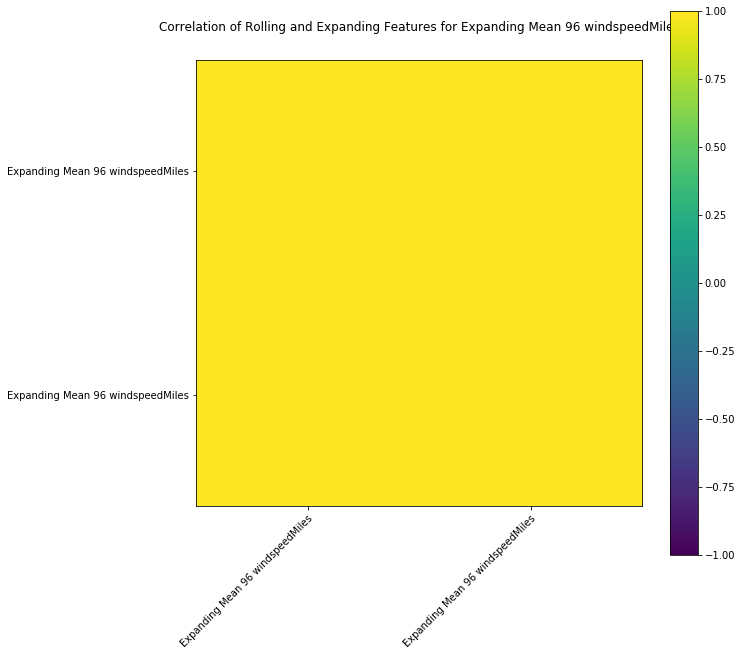

Expanding Min 2 precipMM
Rolling W Done
Expanding Done


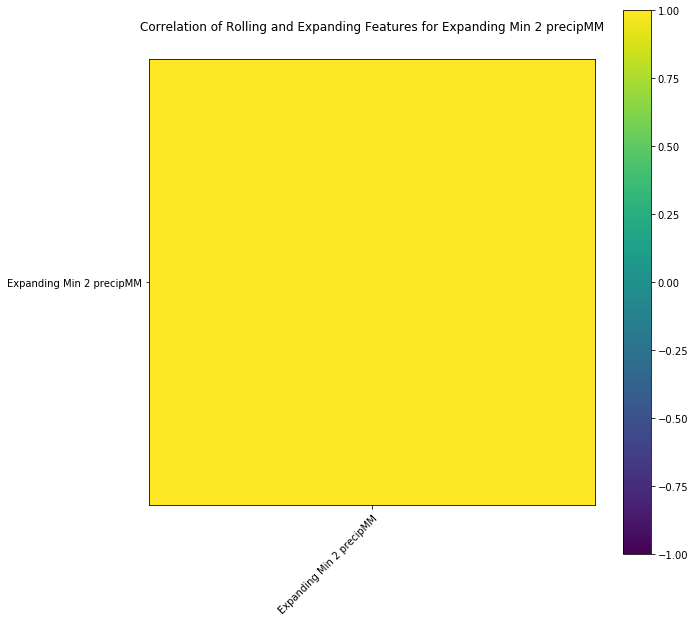

Expanding Max 2 precipMM
Rolling W Done
Expanding Done


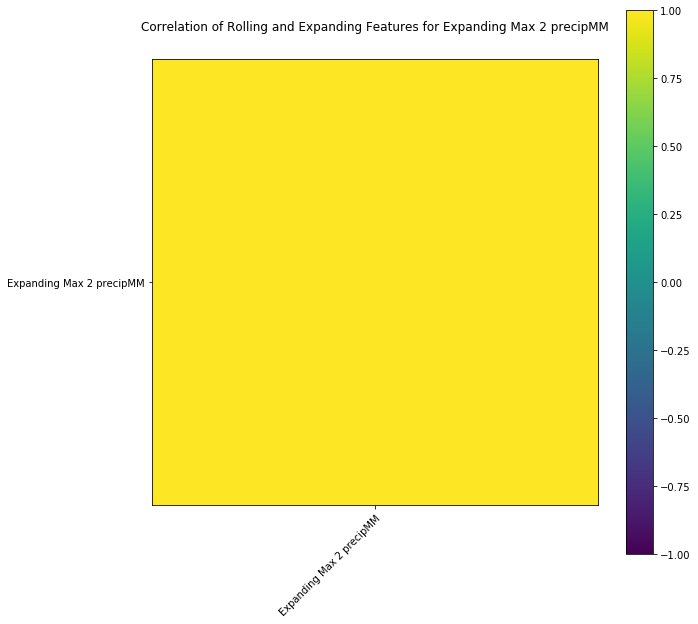

Expanding Sum 2 precipMM
Rolling W Done
Expanding Done


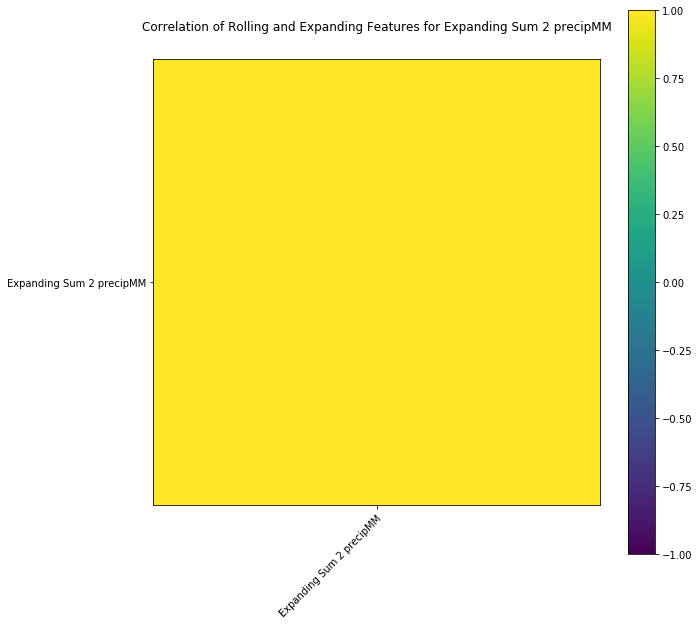

Expanding Mean 2 precipMM
Rolling W Done
Expanding Done


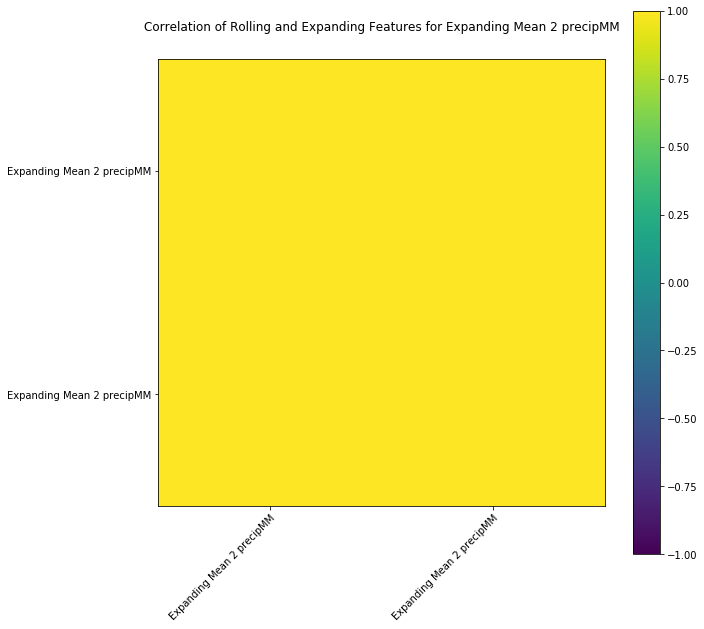

Expanding Min 3 precipMM
Rolling W Done
Expanding Done


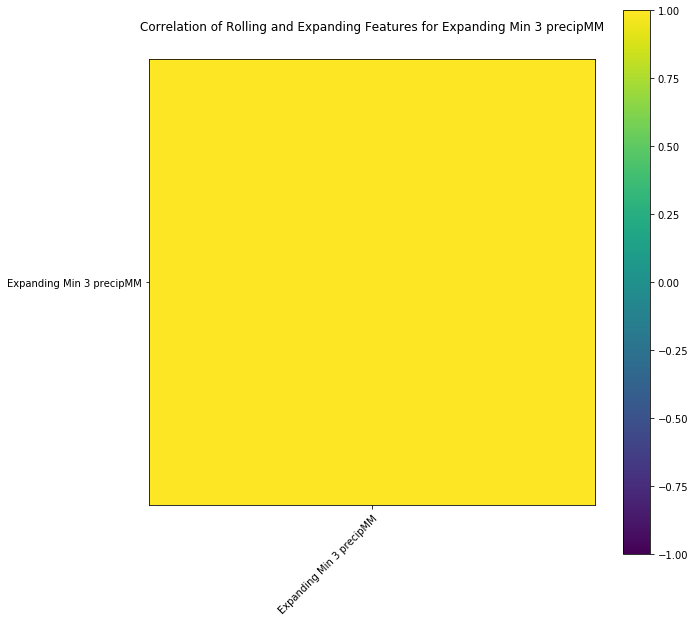

Expanding Max 3 precipMM
Rolling W Done
Expanding Done


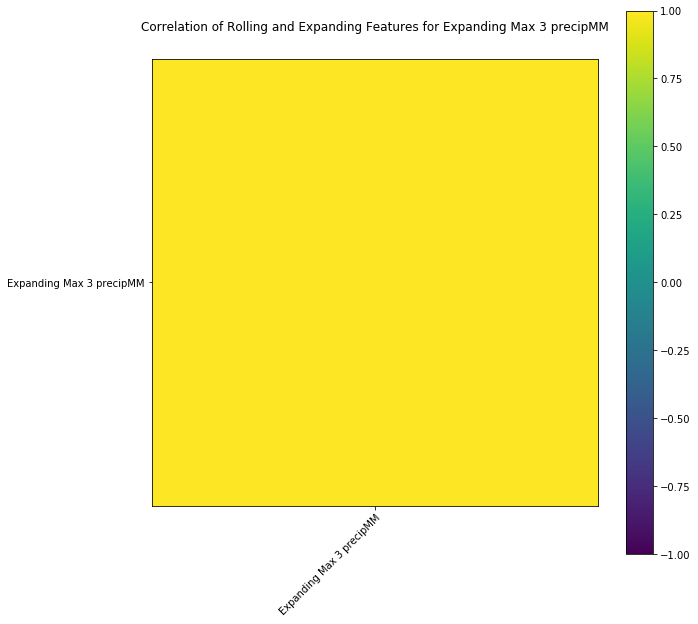

Expanding Sum 3 precipMM
Rolling W Done
Expanding Done


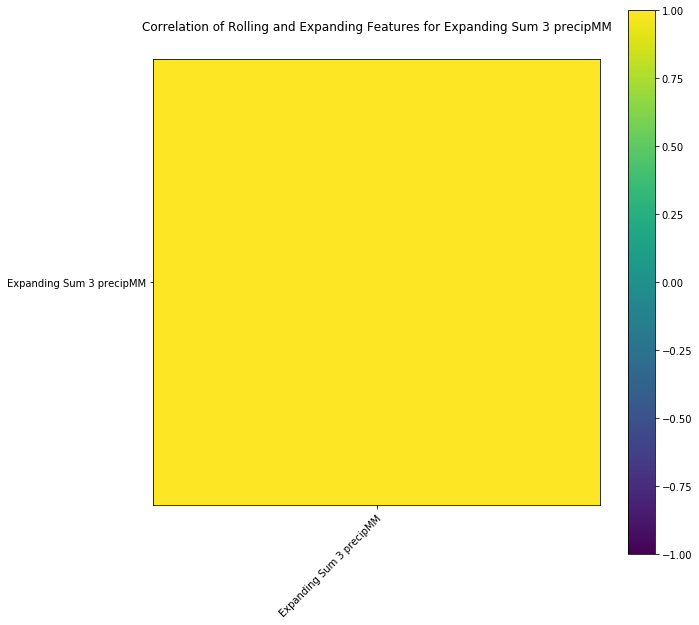

Expanding Mean 3 precipMM
Rolling W Done
Expanding Done


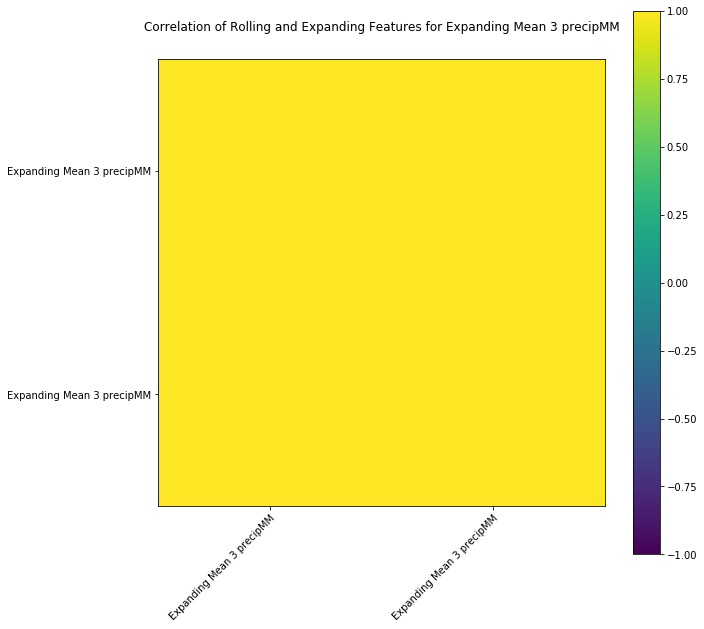

Expanding Min 4 precipMM
Rolling W Done
Expanding Done


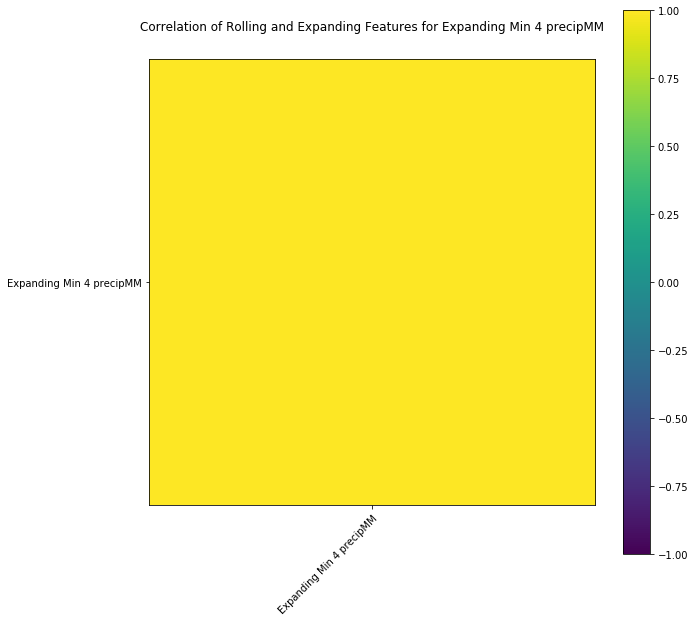

Expanding Max 4 precipMM
Rolling W Done
Expanding Done


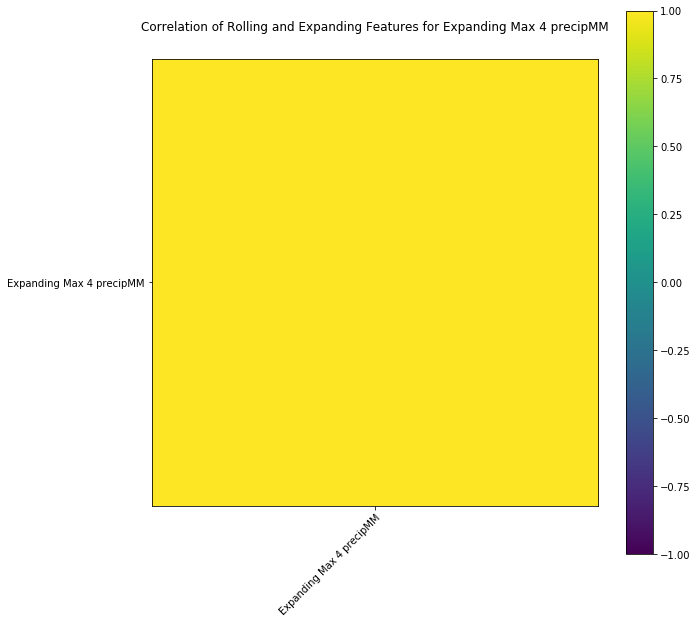

Expanding Sum 4 precipMM
Rolling W Done
Expanding Done


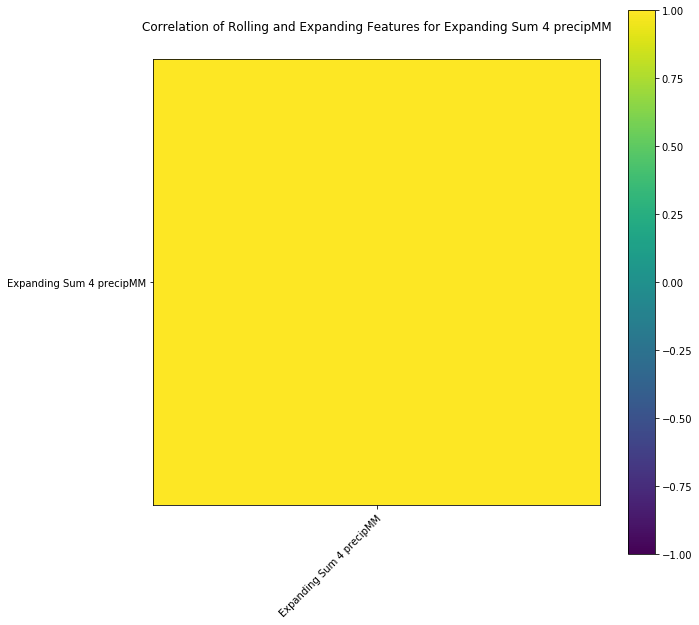

Expanding Mean 4 precipMM
Rolling W Done
Expanding Done


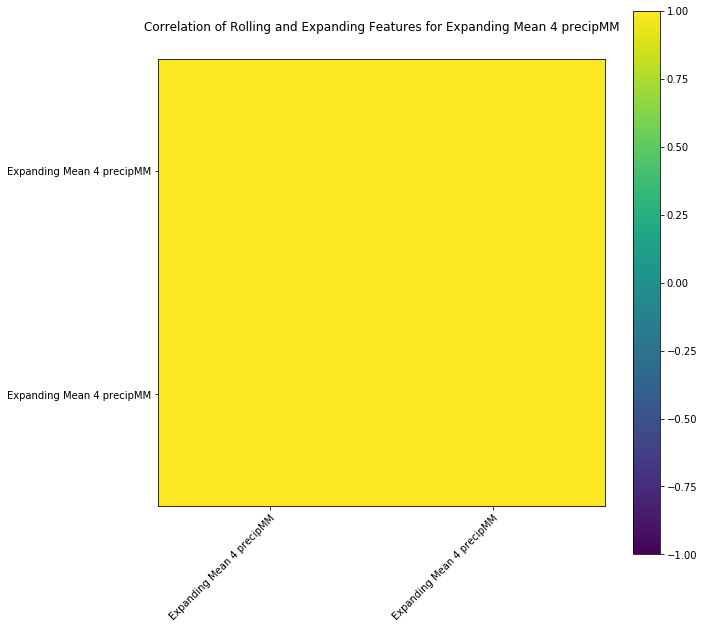

Expanding Min 8 precipMM
Rolling W Done
Expanding Done


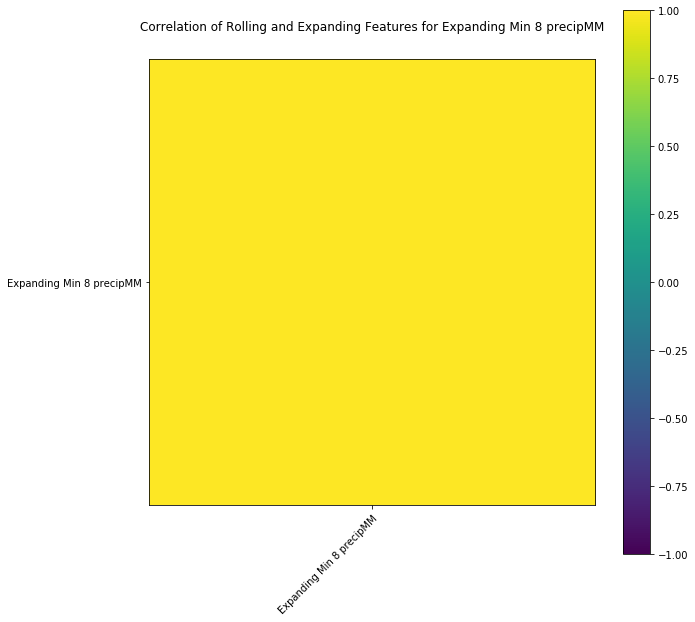

Expanding Max 8 precipMM
Rolling W Done
Expanding Done


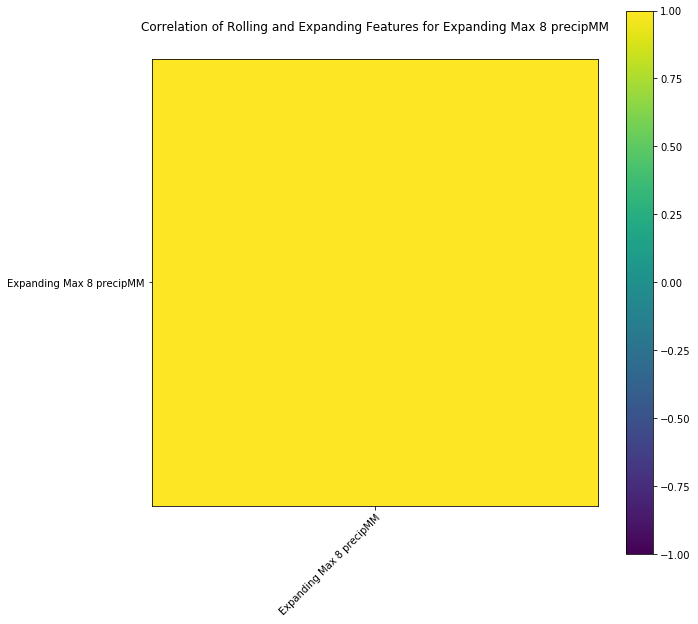

Expanding Sum 8 precipMM
Rolling W Done
Expanding Done


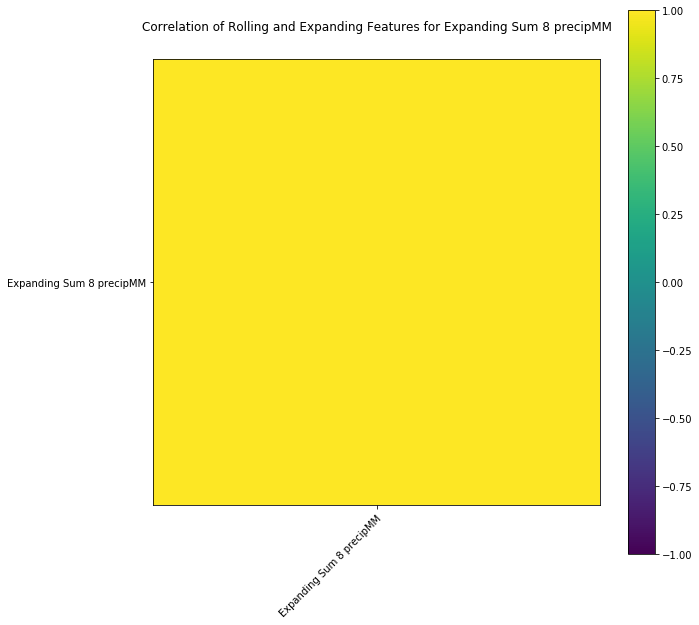

Expanding Mean 8 precipMM
Rolling W Done
Expanding Done


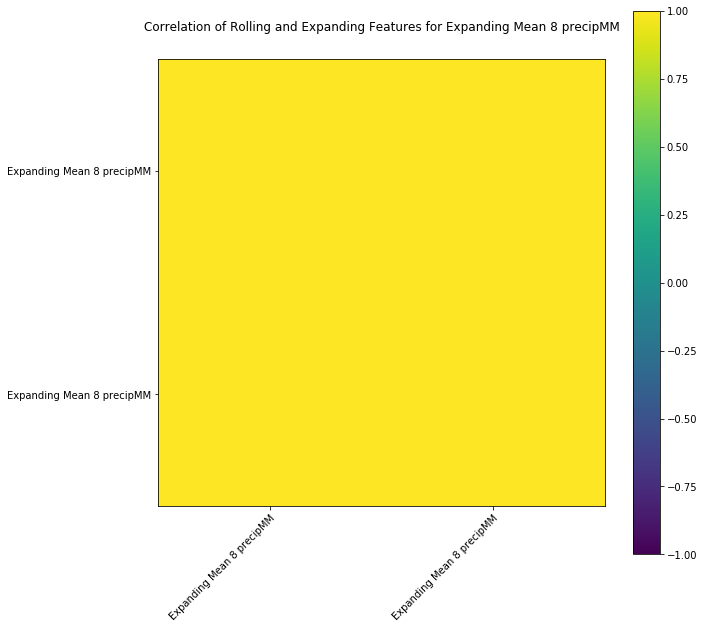

Expanding Min 12 precipMM
Rolling W Done
Expanding Done


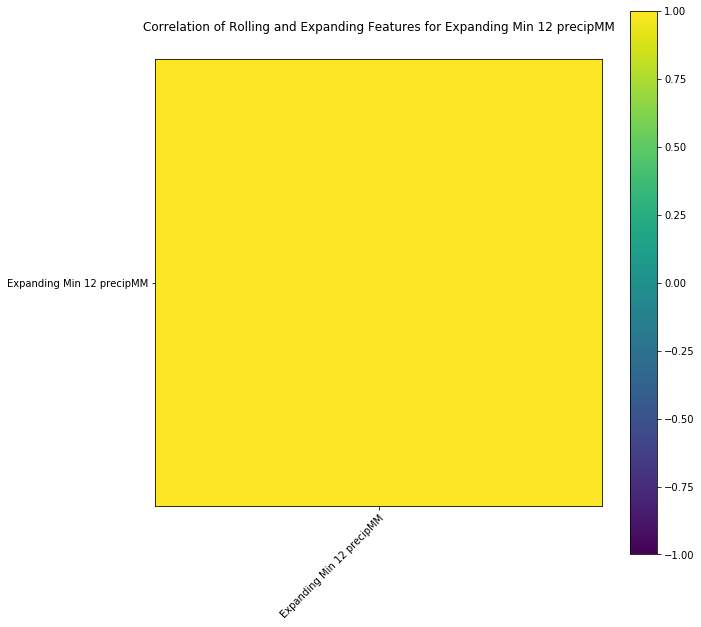

Expanding Max 12 precipMM
Rolling W Done
Expanding Done


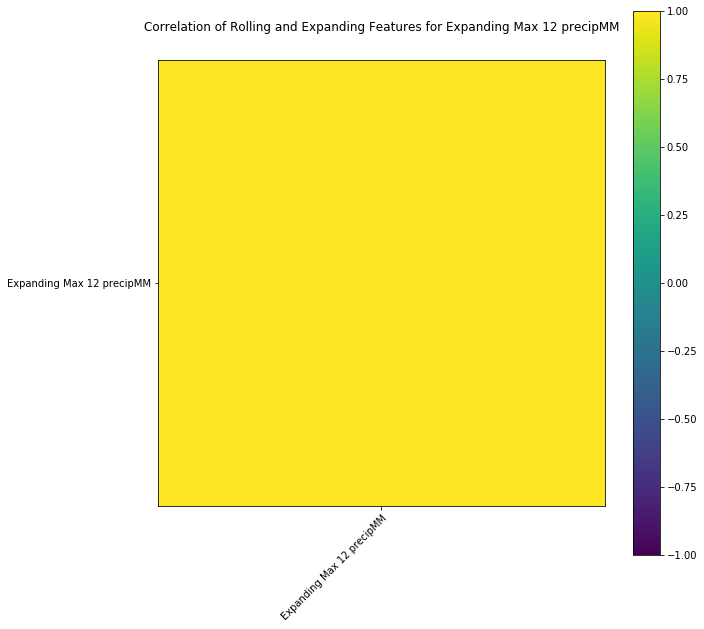

Expanding Sum 12 precipMM
Rolling W Done
Expanding Done


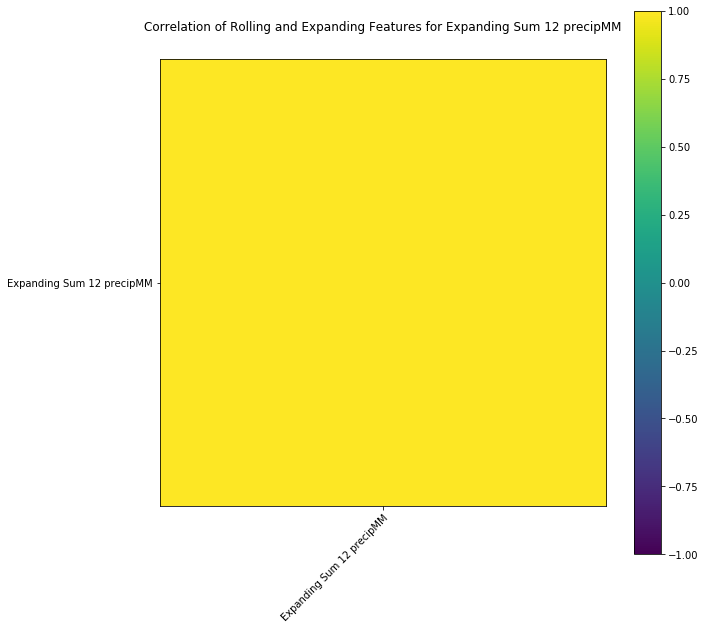

Expanding Mean 12 precipMM
Rolling W Done
Expanding Done


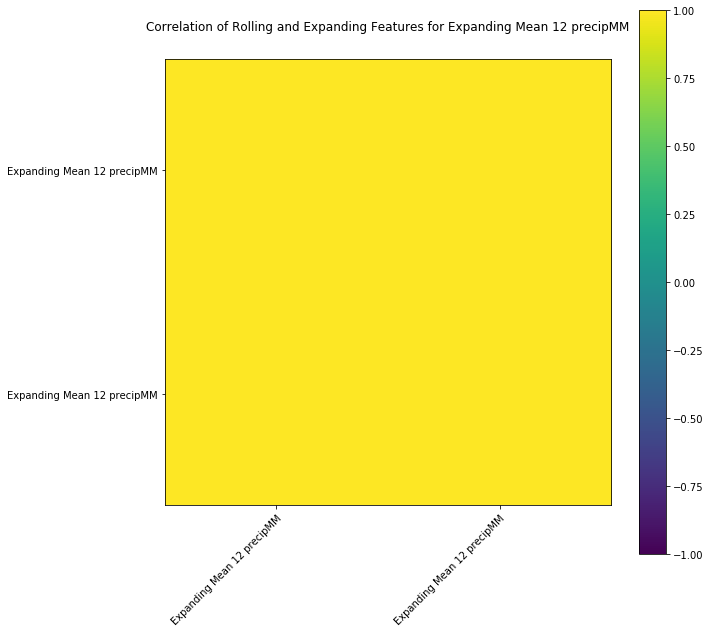

Expanding Min 16 precipMM
Rolling W Done
Expanding Done


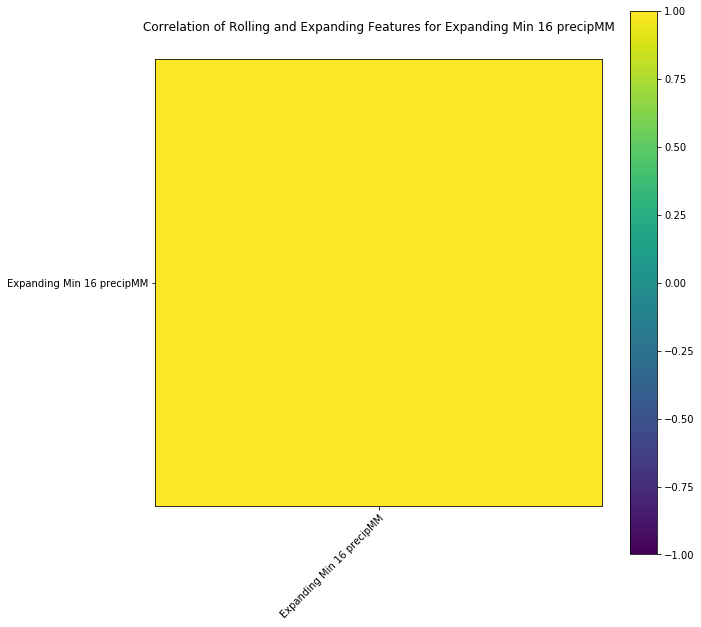

Expanding Max 16 precipMM
Rolling W Done
Expanding Done


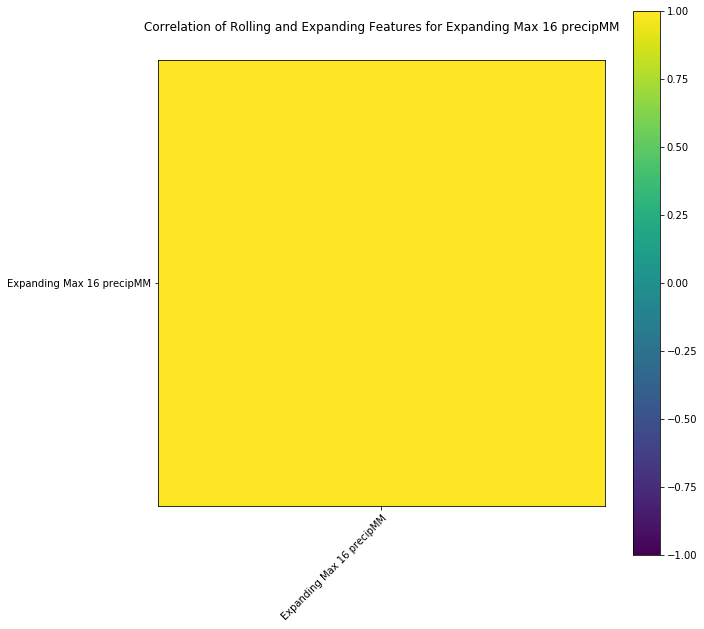

Expanding Sum 16 precipMM
Rolling W Done
Expanding Done


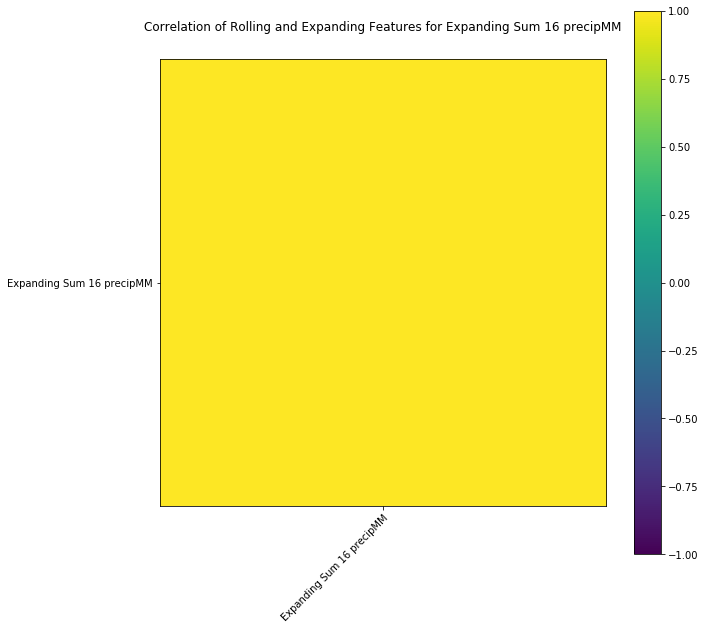

Expanding Mean 16 precipMM
Rolling W Done
Expanding Done


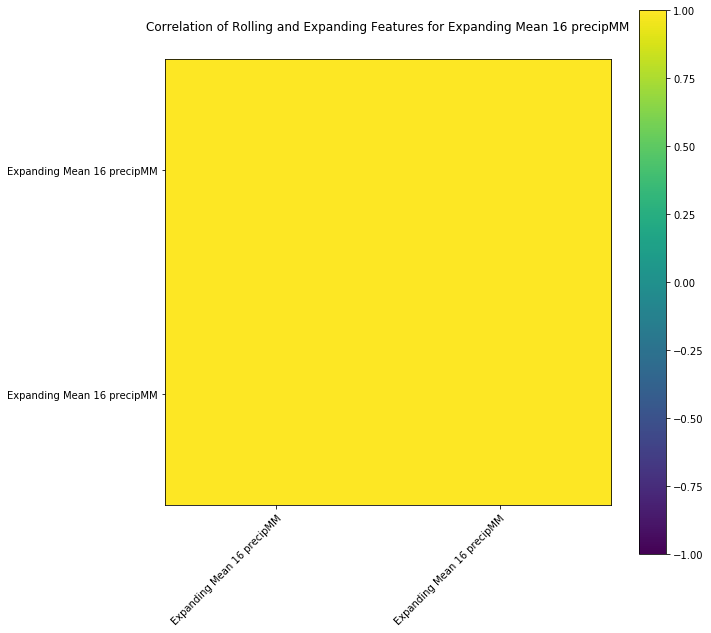

Expanding Min 24 precipMM
Rolling W Done
Expanding Done


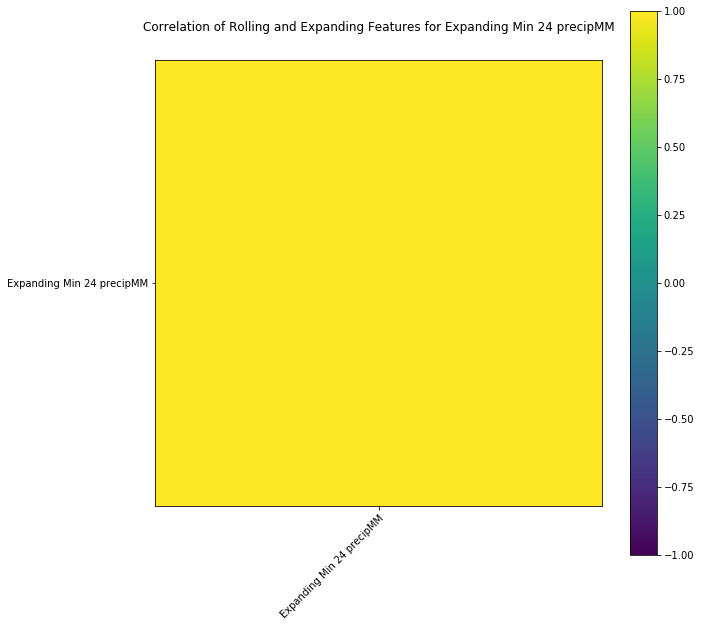

Expanding Max 24 precipMM
Rolling W Done
Expanding Done


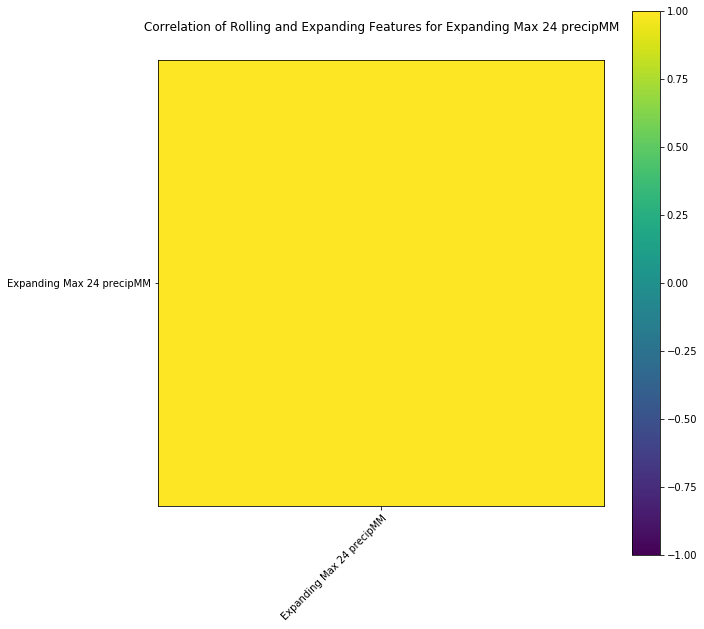

Expanding Sum 24 precipMM
Rolling W Done
Expanding Done


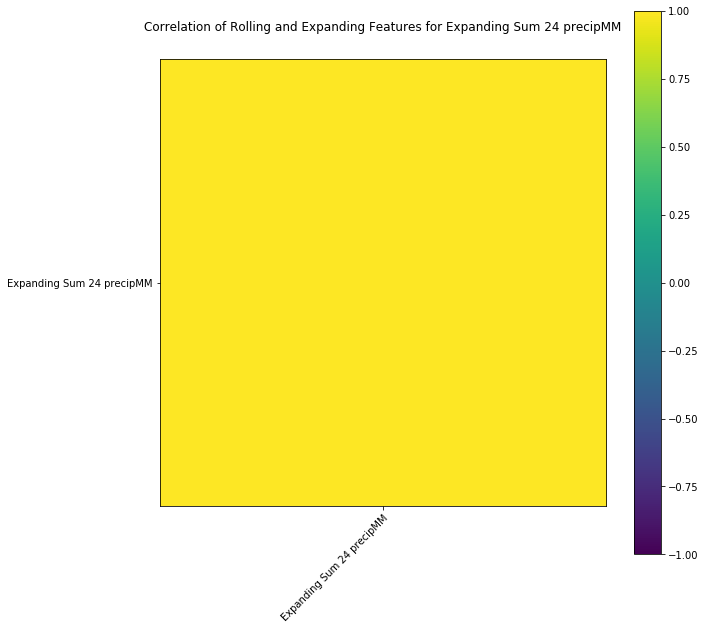

Expanding Mean 24 precipMM
Rolling W Done
Expanding Done


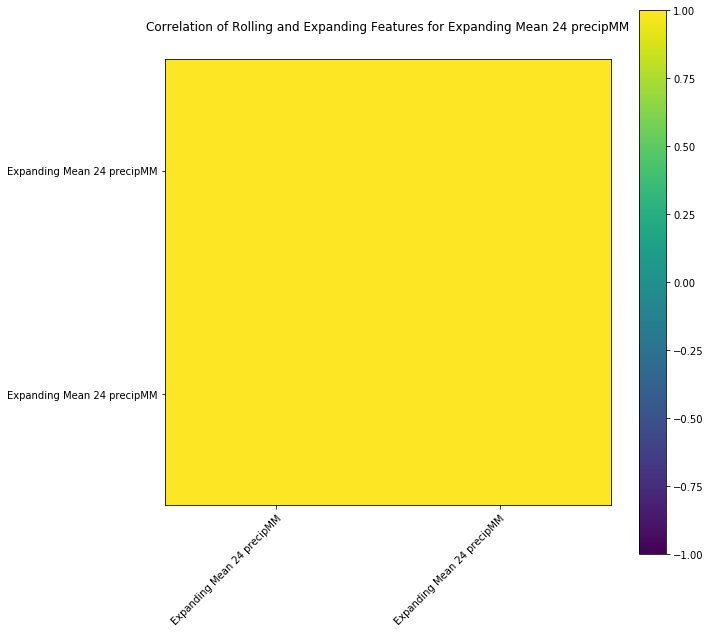

Expanding Min 48 precipMM
Rolling W Done
Expanding Done


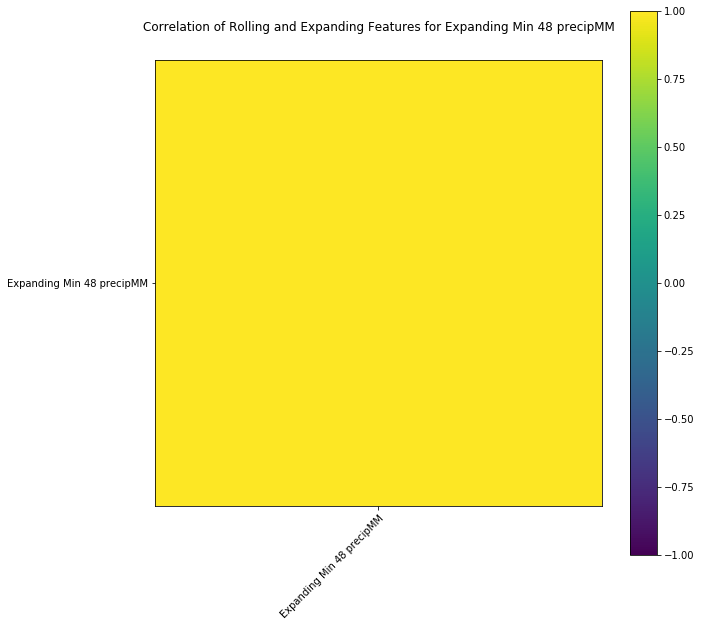

Expanding Max 48 precipMM
Rolling W Done
Expanding Done


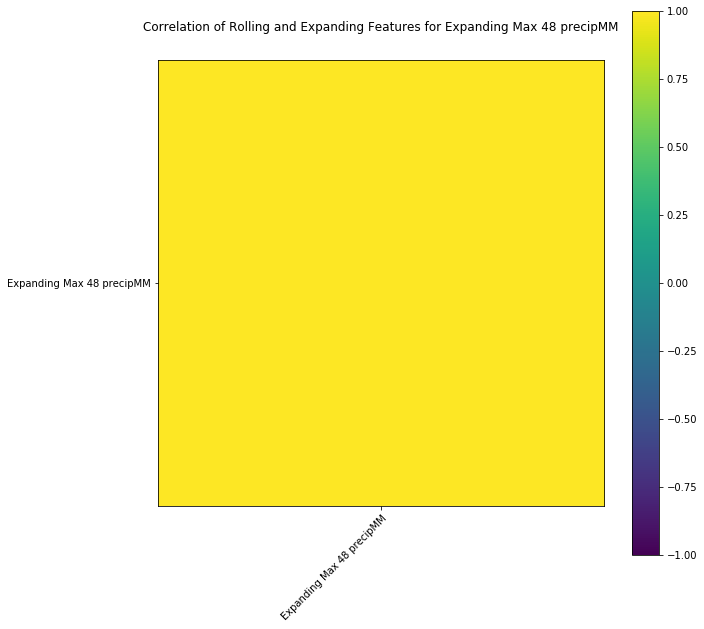

Expanding Sum 48 precipMM
Rolling W Done
Expanding Done


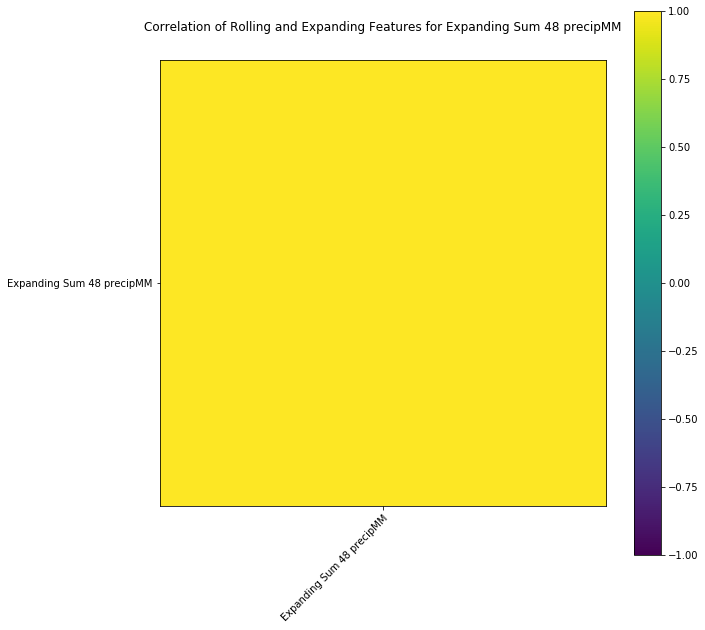

Expanding Mean 48 precipMM
Rolling W Done
Expanding Done


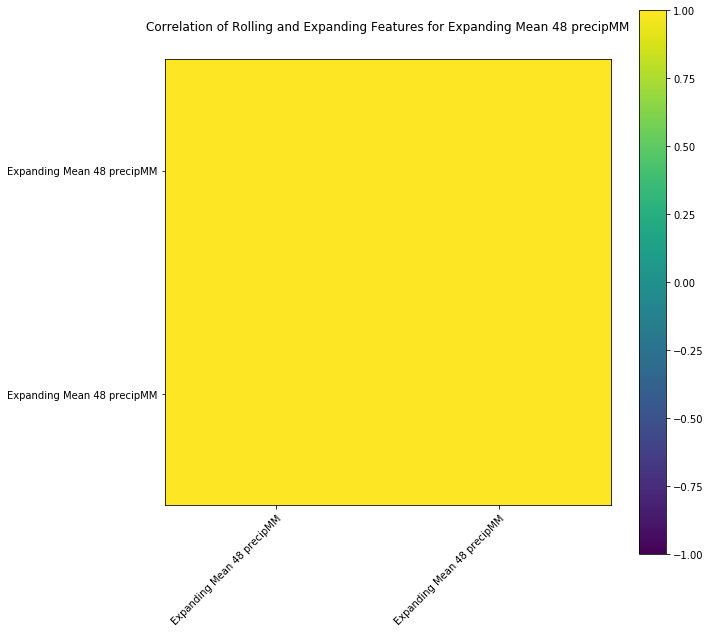

Expanding Min 96 precipMM
Rolling W Done
Expanding Done


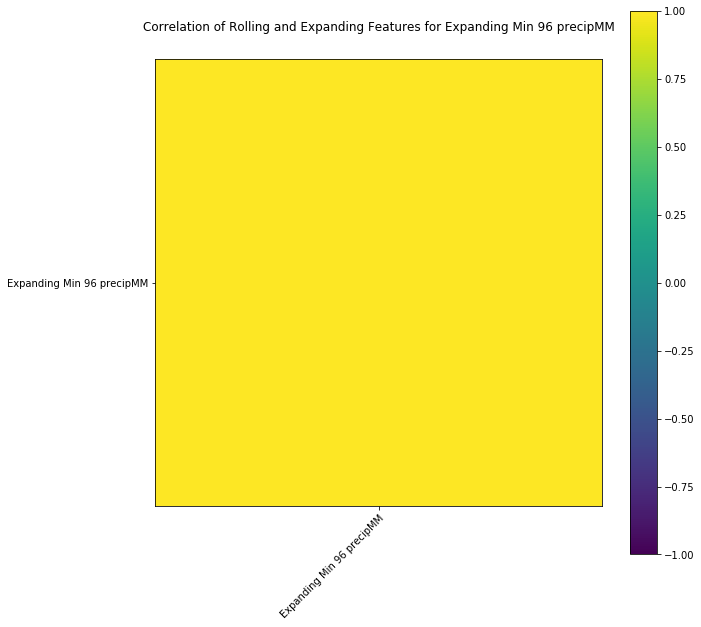

Expanding Max 96 precipMM
Rolling W Done
Expanding Done


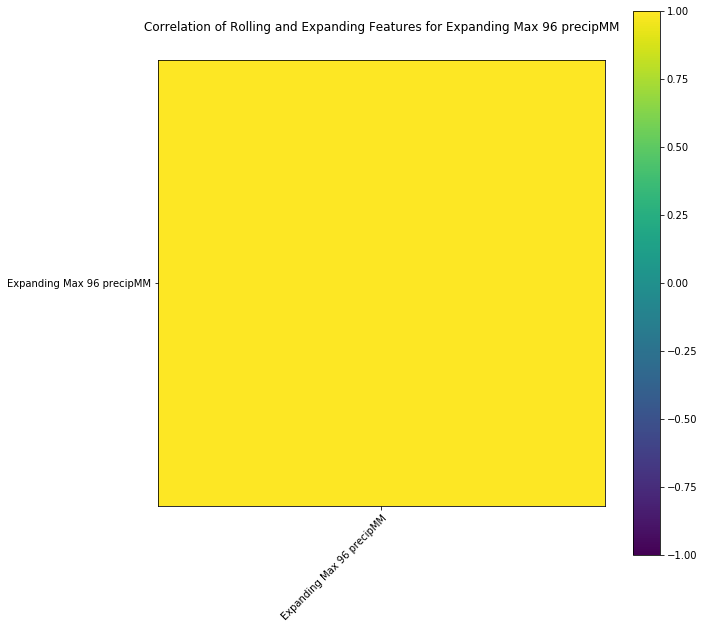

Expanding Sum 96 precipMM
Rolling W Done
Expanding Done


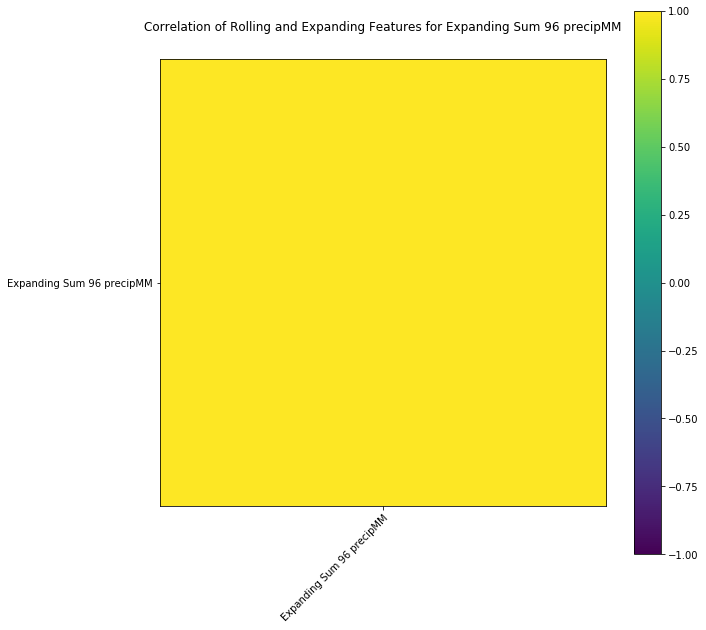

Expanding Mean 96 precipMM
Rolling W Done
Expanding Done


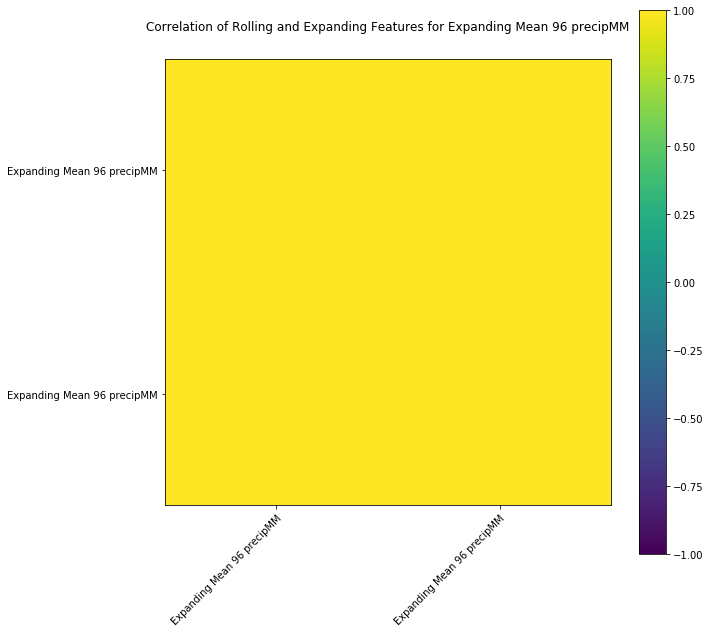

Expanding Min 2 humidity
Rolling W Done
Expanding Done


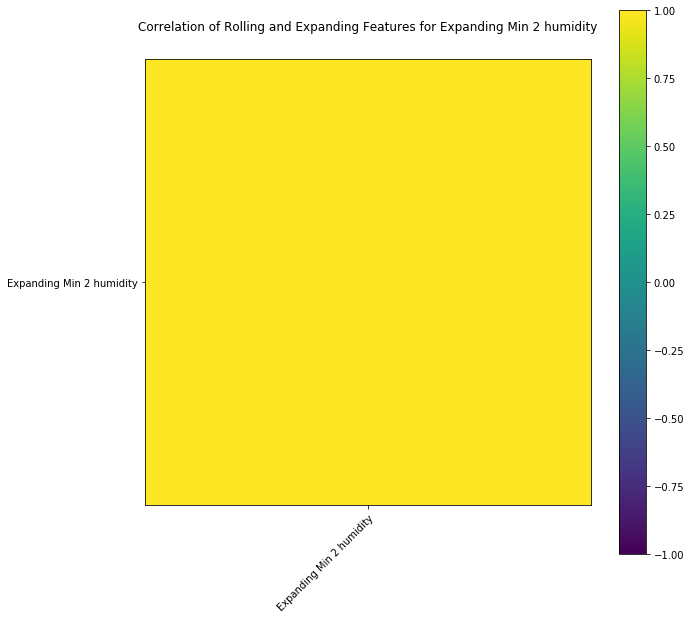

Expanding Max 2 humidity
Rolling W Done
Expanding Done


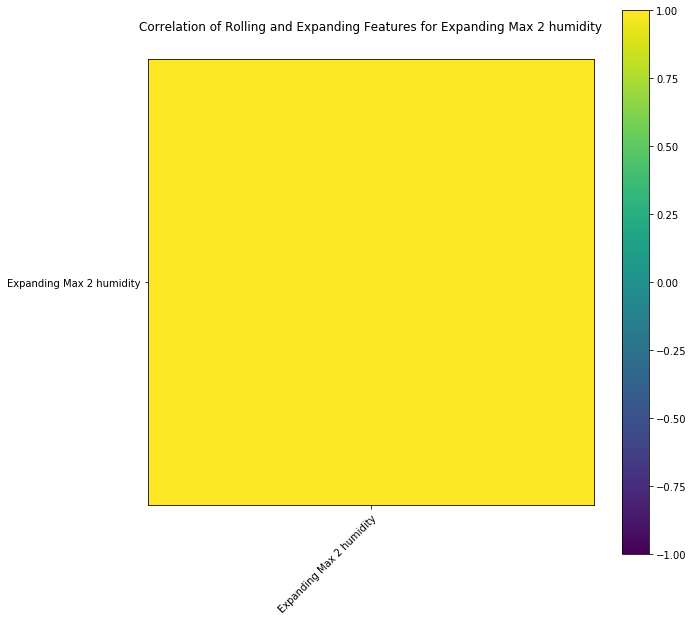

Expanding Sum 2 humidity
Rolling W Done
Expanding Done


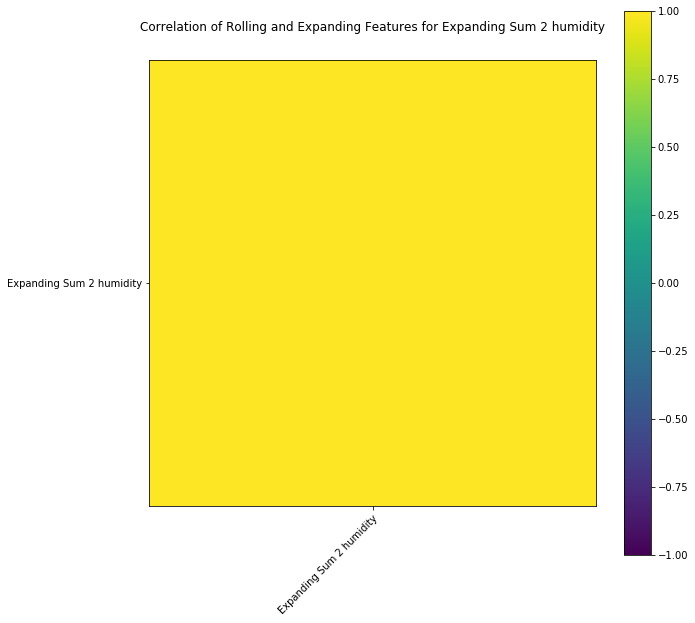

Expanding Mean 2 humidity
Rolling W Done
Expanding Done


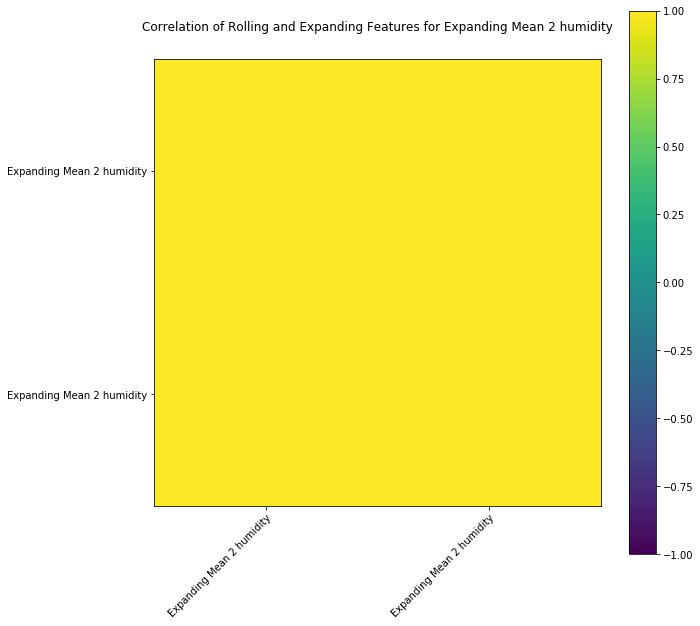

Expanding Min 3 humidity
Rolling W Done
Expanding Done


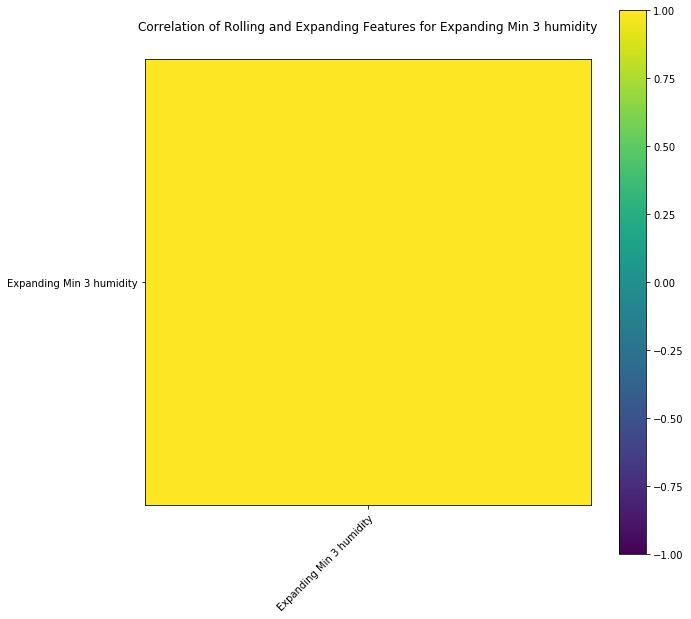

Expanding Max 3 humidity
Rolling W Done
Expanding Done


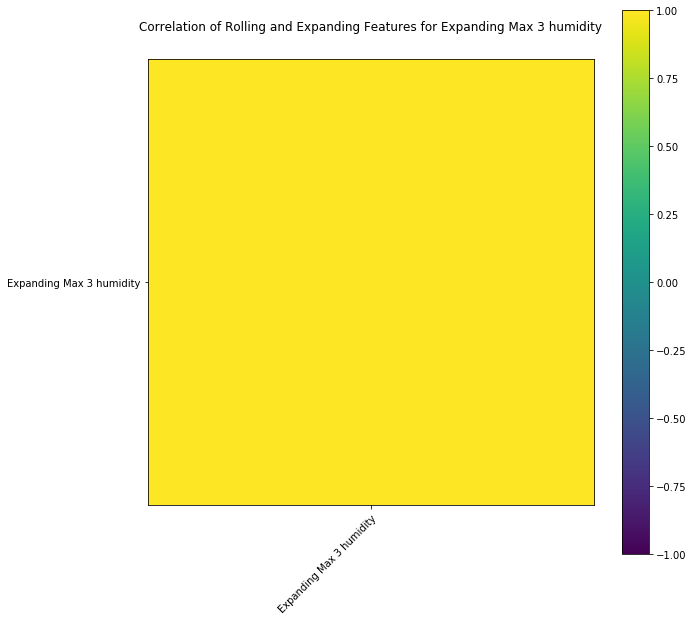

Expanding Sum 3 humidity
Rolling W Done
Expanding Done


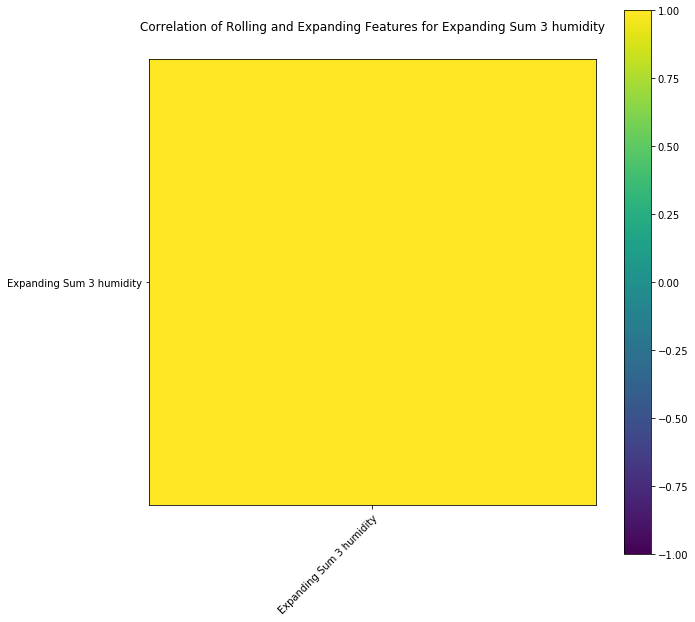

Expanding Mean 3 humidity
Rolling W Done
Expanding Done


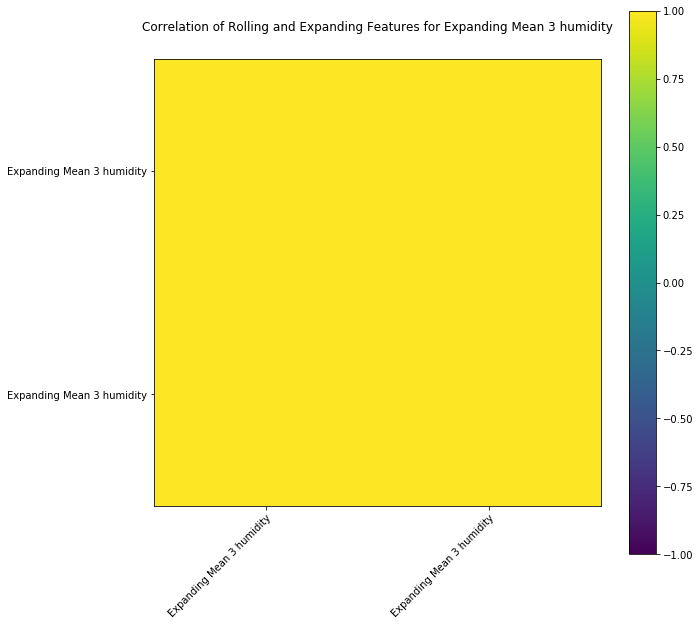

Expanding Min 4 humidity
Rolling W Done
Expanding Done


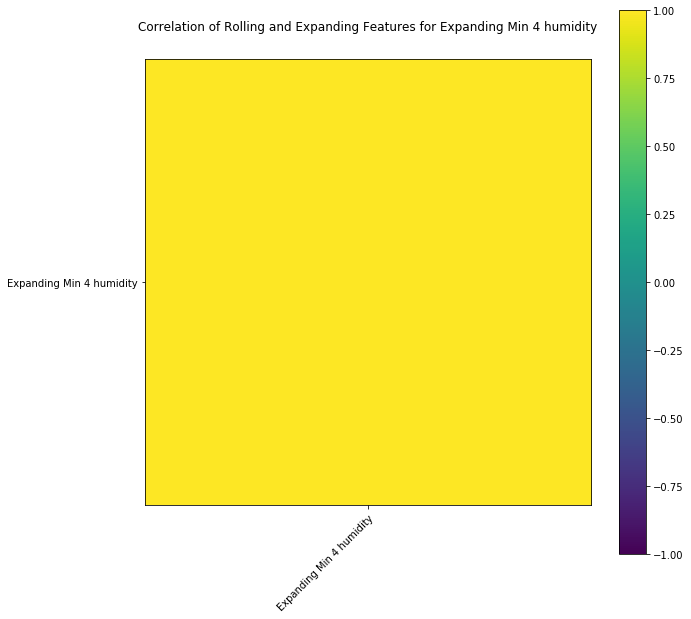

Expanding Max 4 humidity
Rolling W Done
Expanding Done


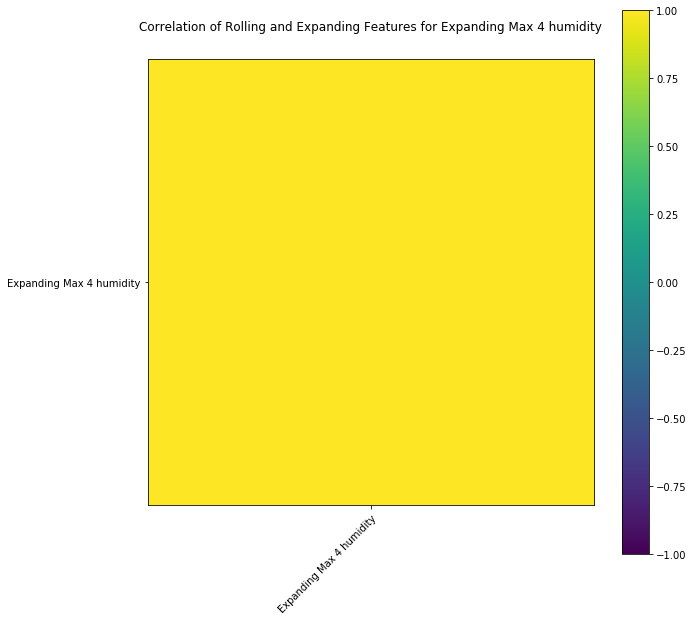

Expanding Sum 4 humidity
Rolling W Done
Expanding Done


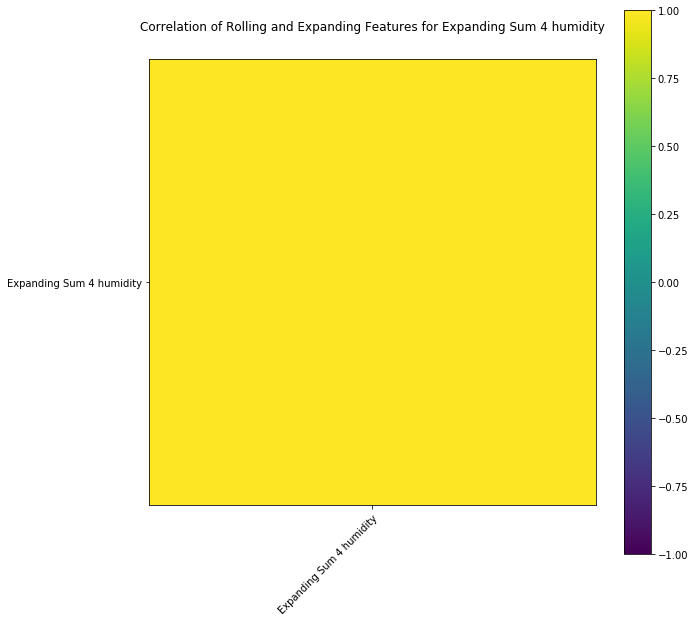

Expanding Mean 4 humidity
Rolling W Done
Expanding Done


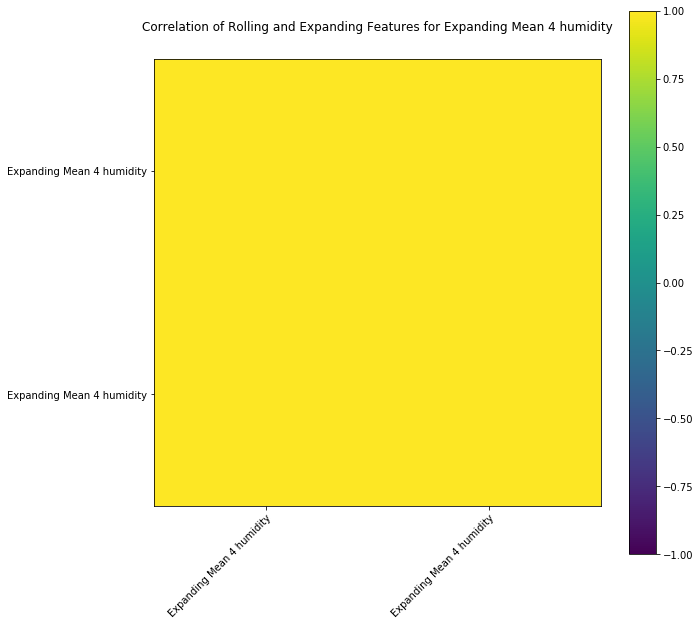

Expanding Min 8 humidity
Rolling W Done
Expanding Done


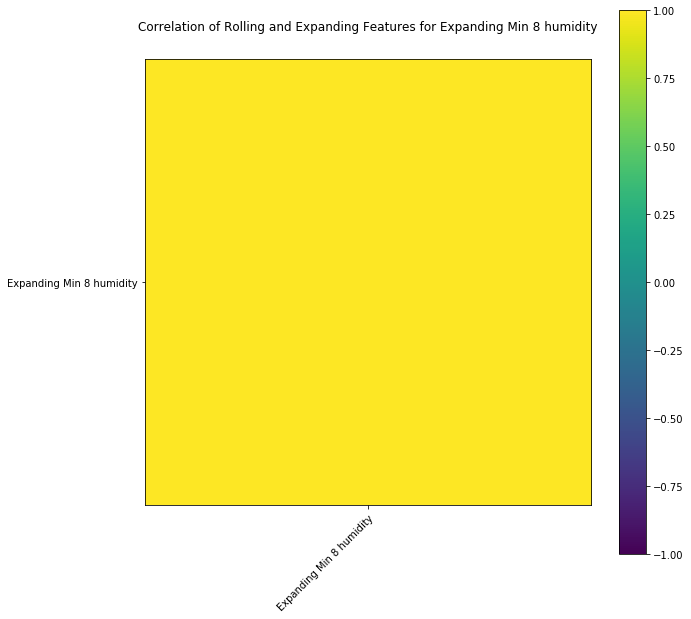

Expanding Max 8 humidity
Rolling W Done
Expanding Done


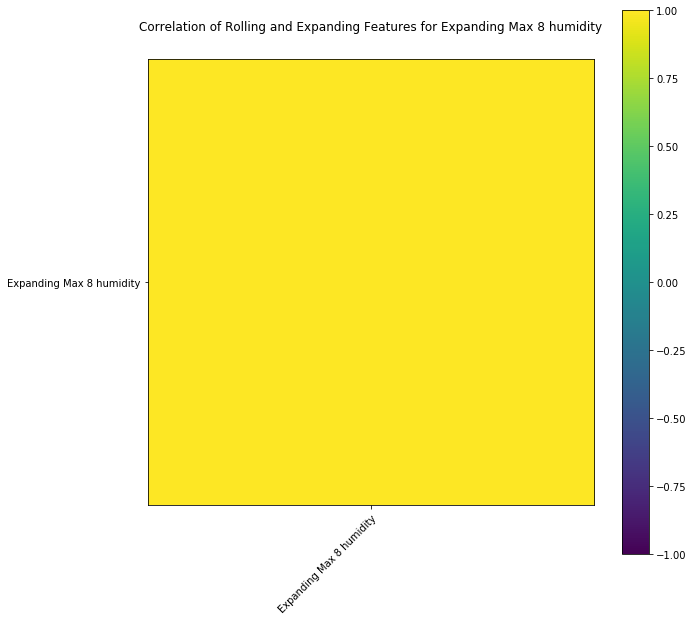

Expanding Sum 8 humidity
Rolling W Done
Expanding Done


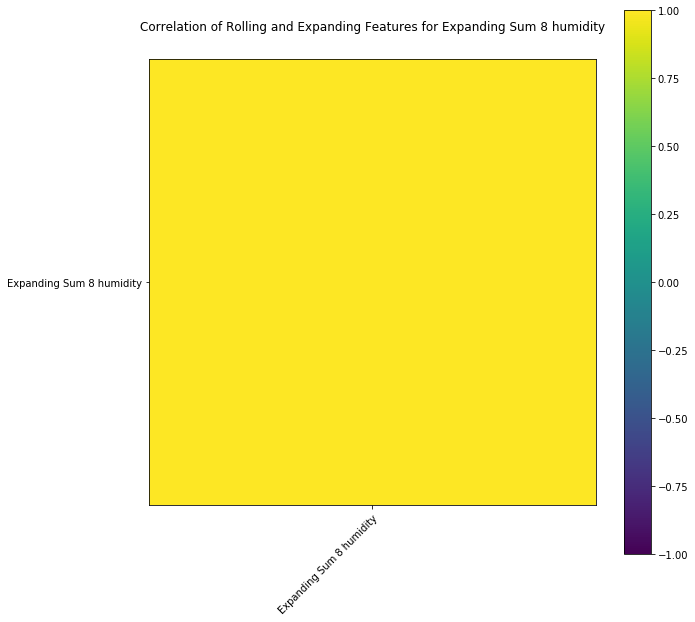

Expanding Mean 8 humidity
Rolling W Done
Expanding Done


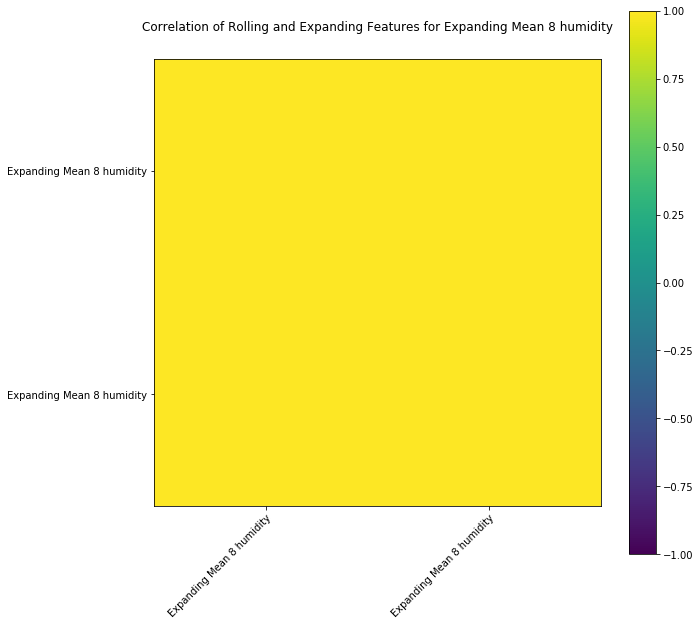

Expanding Min 12 humidity
Rolling W Done
Expanding Done


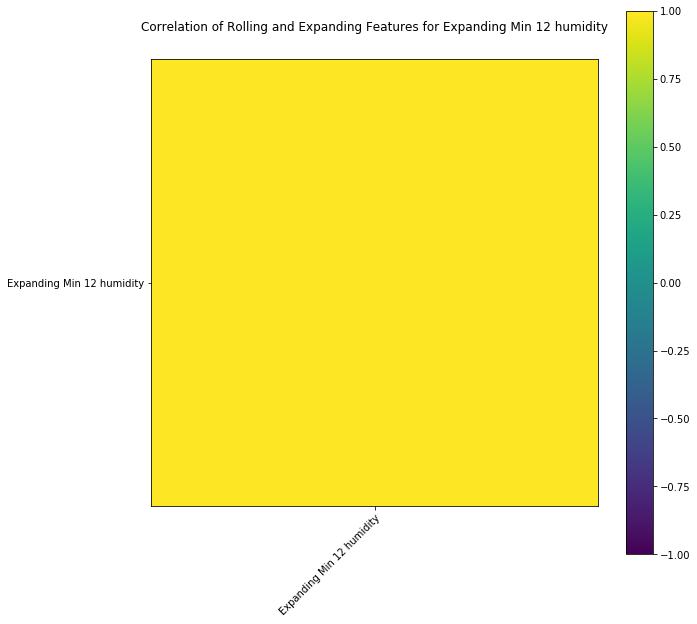

Expanding Max 12 humidity
Rolling W Done
Expanding Done


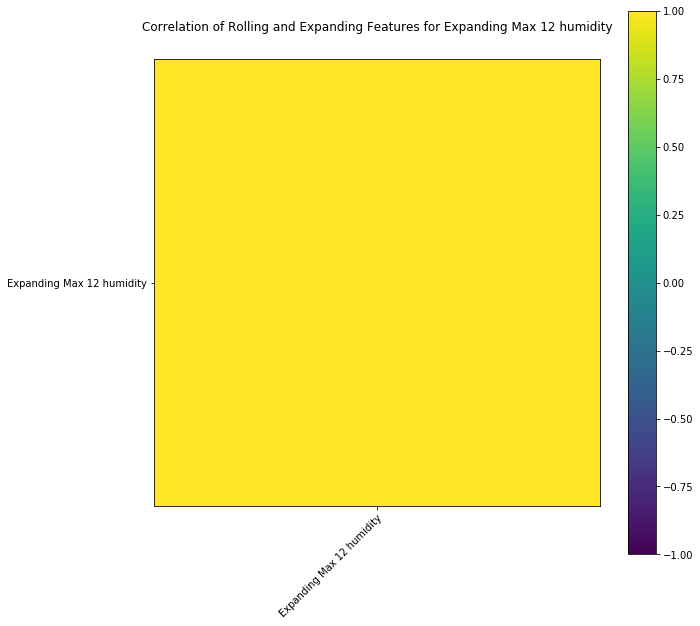

Expanding Sum 12 humidity
Rolling W Done
Expanding Done


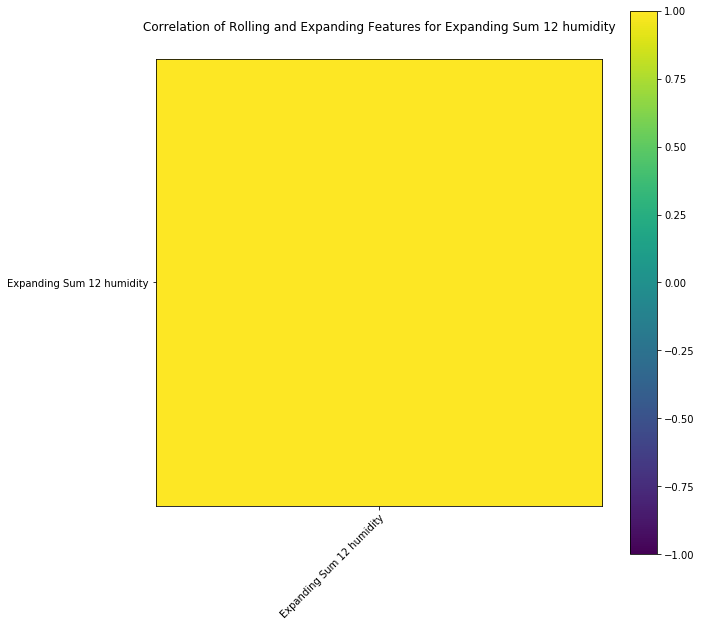

Expanding Mean 12 humidity
Rolling W Done
Expanding Done


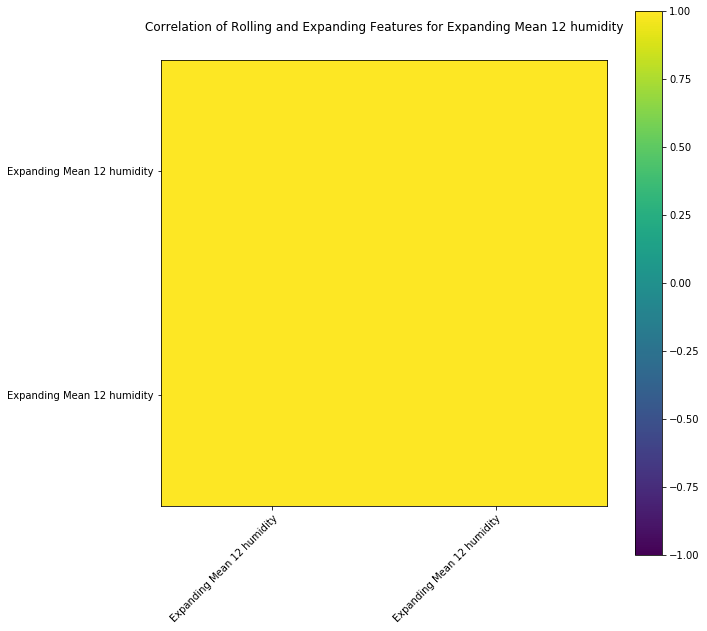

Expanding Min 16 humidity
Rolling W Done
Expanding Done


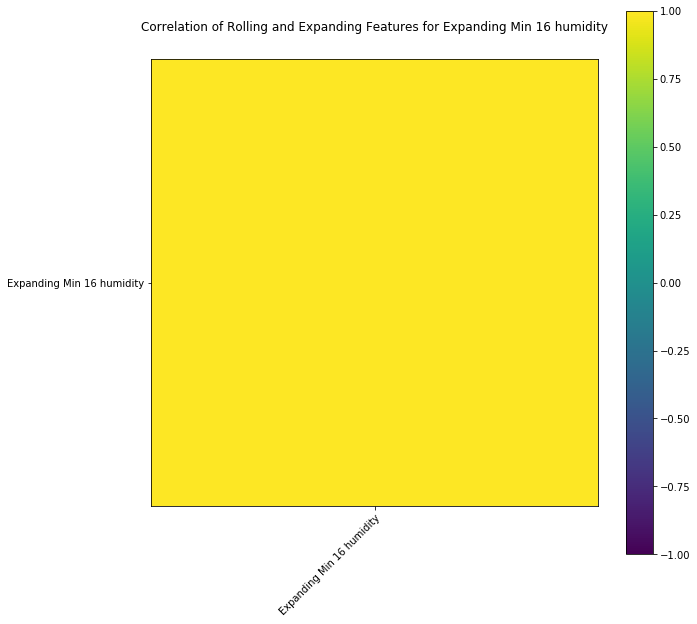

Expanding Max 16 humidity
Rolling W Done
Expanding Done


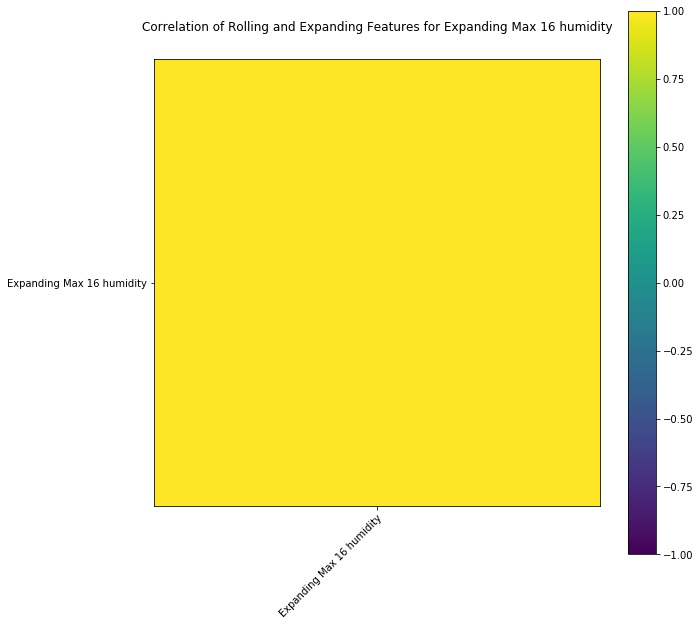

Expanding Sum 16 humidity
Rolling W Done
Expanding Done


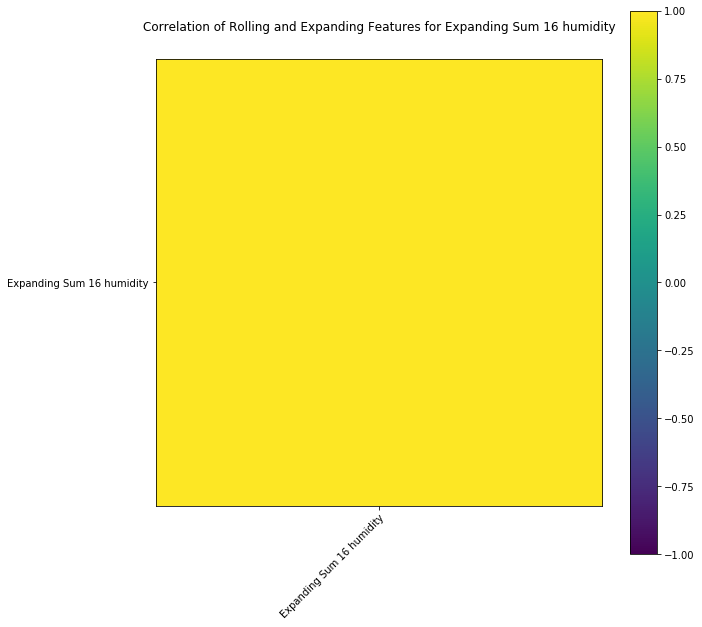

Expanding Mean 16 humidity
Rolling W Done
Expanding Done


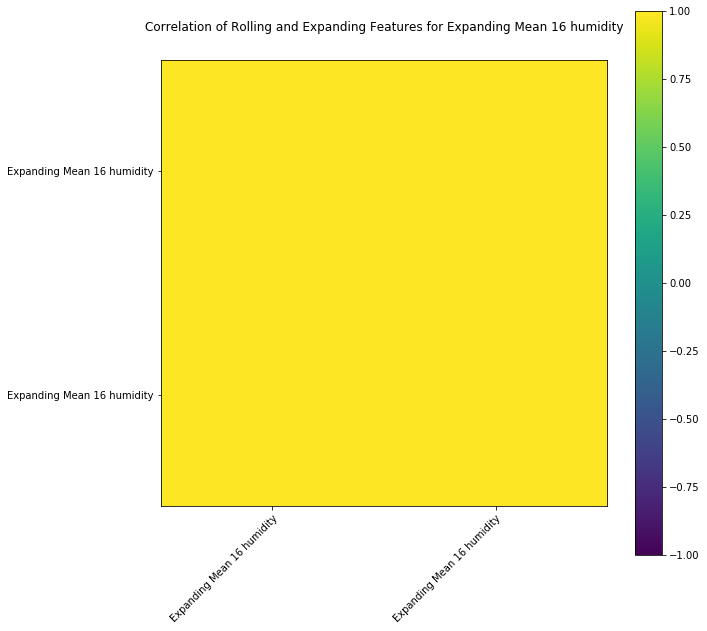

Expanding Min 24 humidity
Rolling W Done
Expanding Done


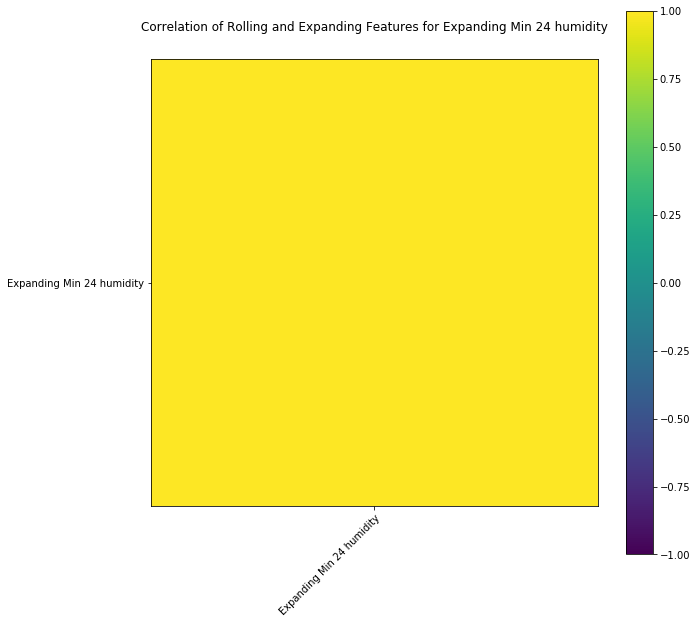

Expanding Max 24 humidity
Rolling W Done
Expanding Done


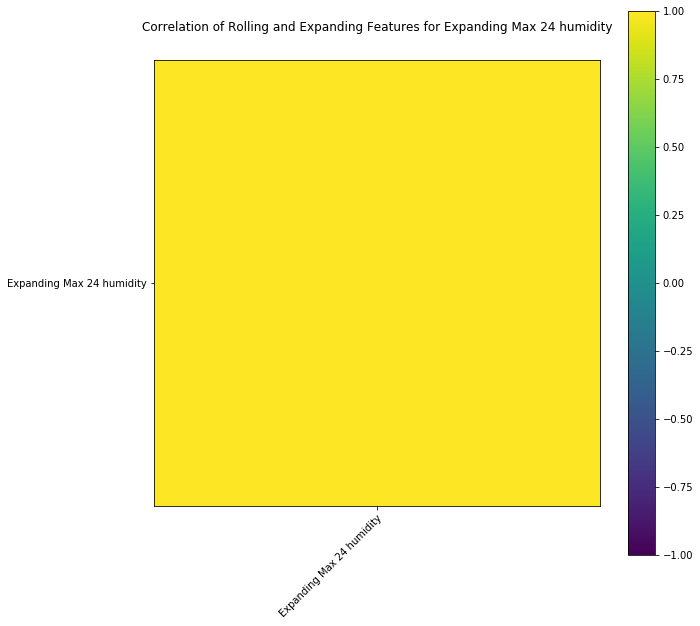

Expanding Sum 24 humidity
Rolling W Done
Expanding Done


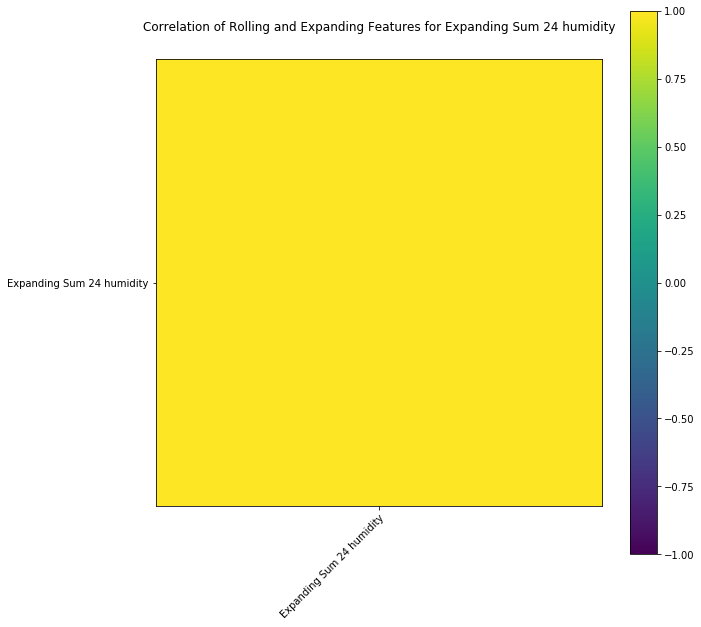

Expanding Mean 24 humidity
Rolling W Done
Expanding Done


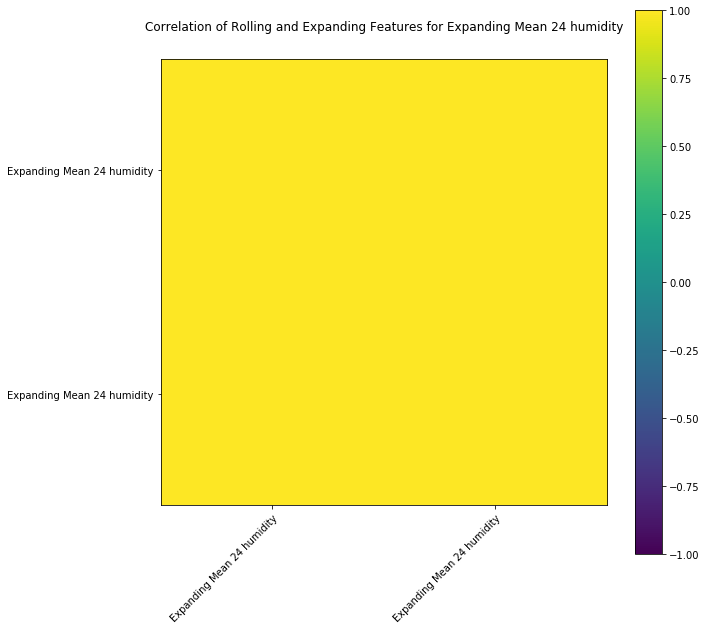

Expanding Min 48 humidity
Rolling W Done
Expanding Done


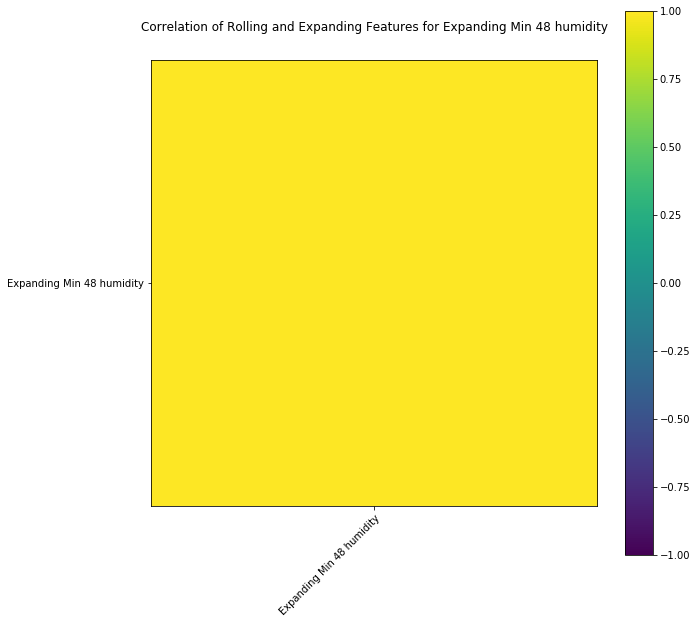

Expanding Max 48 humidity
Rolling W Done
Expanding Done


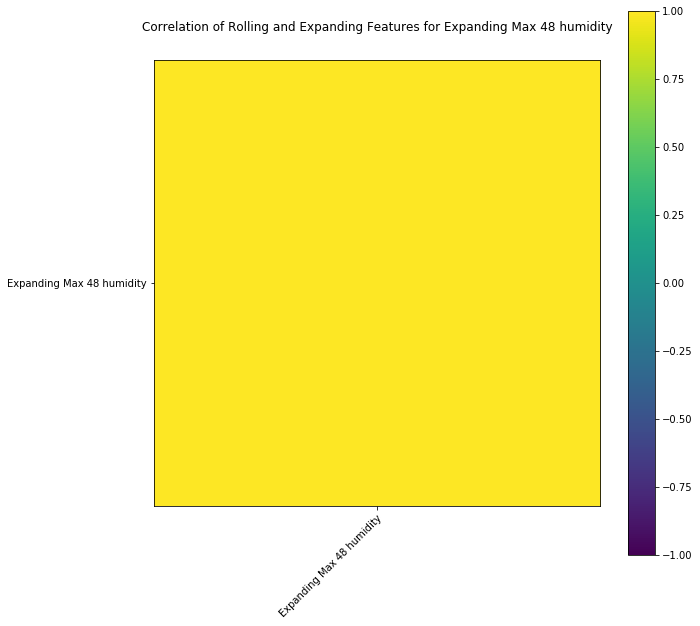

Expanding Sum 48 humidity
Rolling W Done
Expanding Done


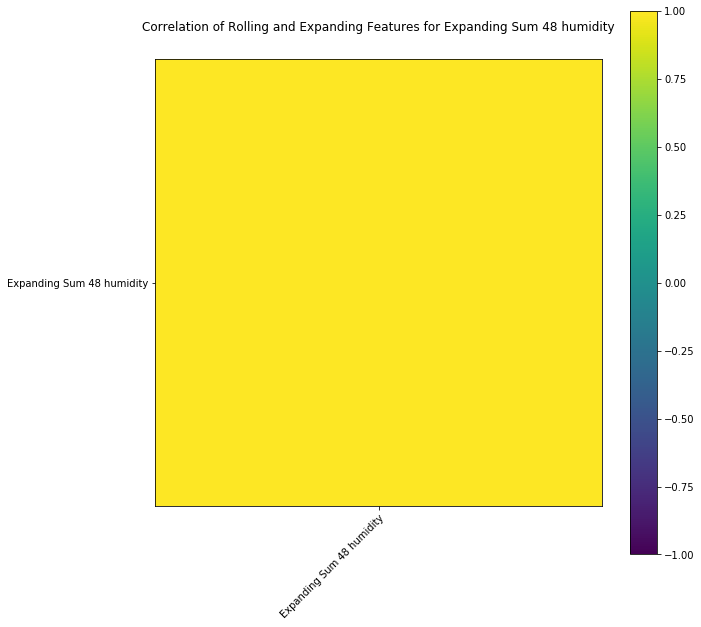

Expanding Mean 48 humidity
Rolling W Done
Expanding Done


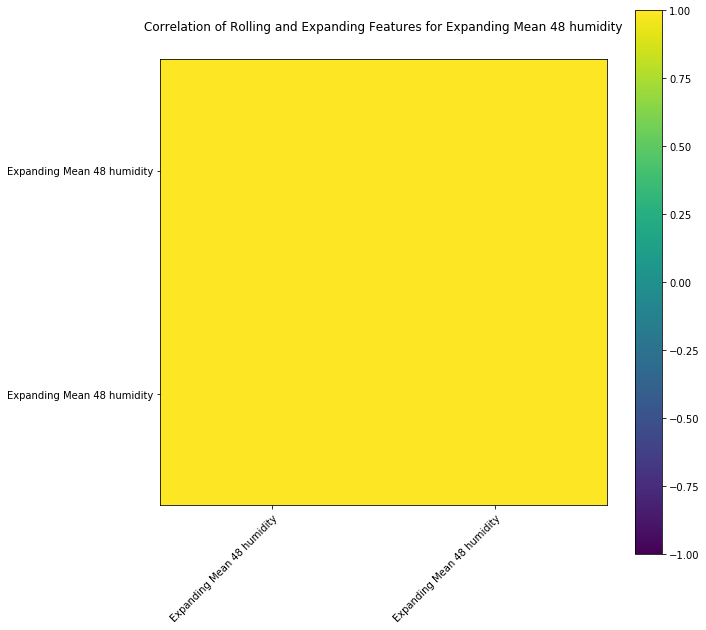

Expanding Min 96 humidity
Rolling W Done
Expanding Done


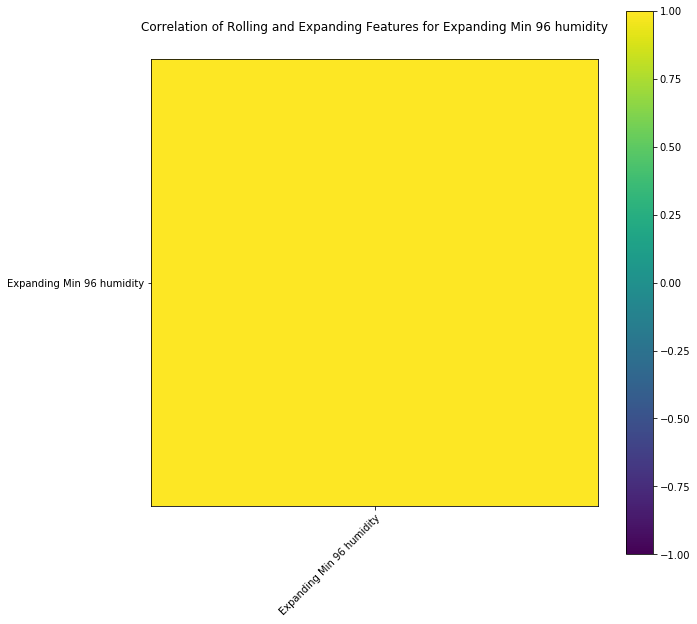

Expanding Max 96 humidity
Rolling W Done
Expanding Done


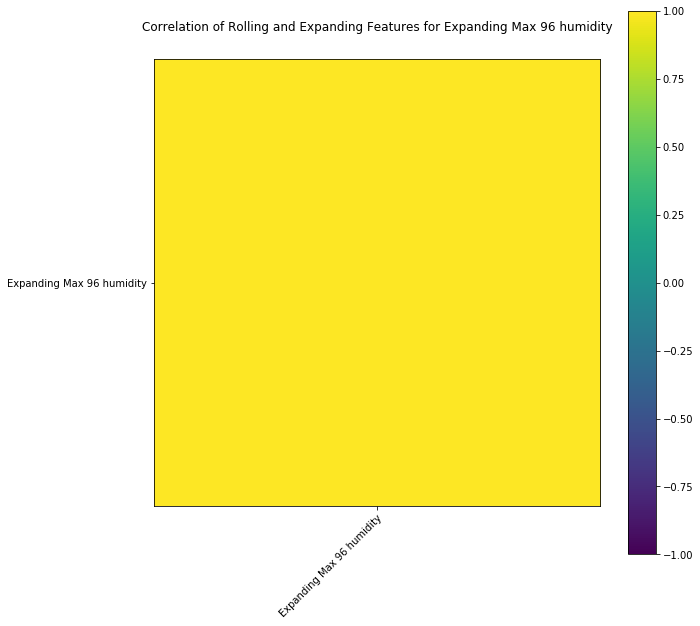

Expanding Sum 96 humidity
Rolling W Done
Expanding Done


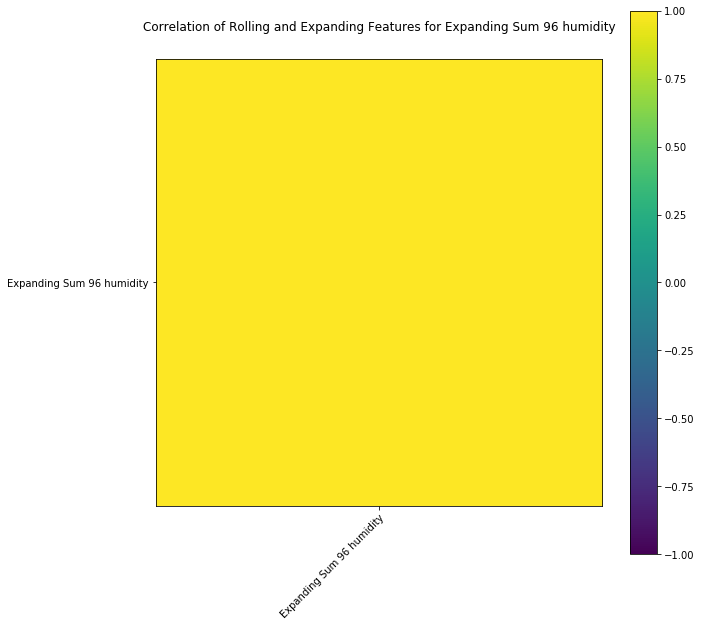

Expanding Mean 96 humidity
Rolling W Done
Expanding Done


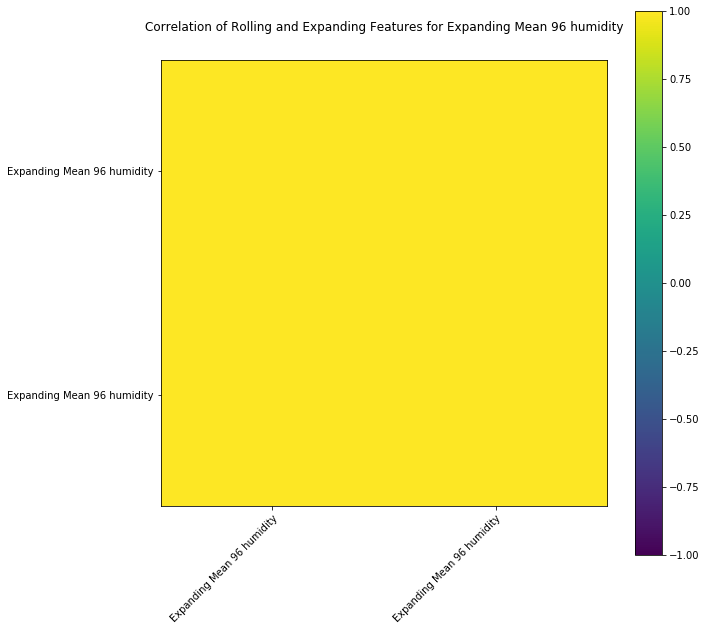

Expanding Min 2 visibility
Rolling W Done
Expanding Done


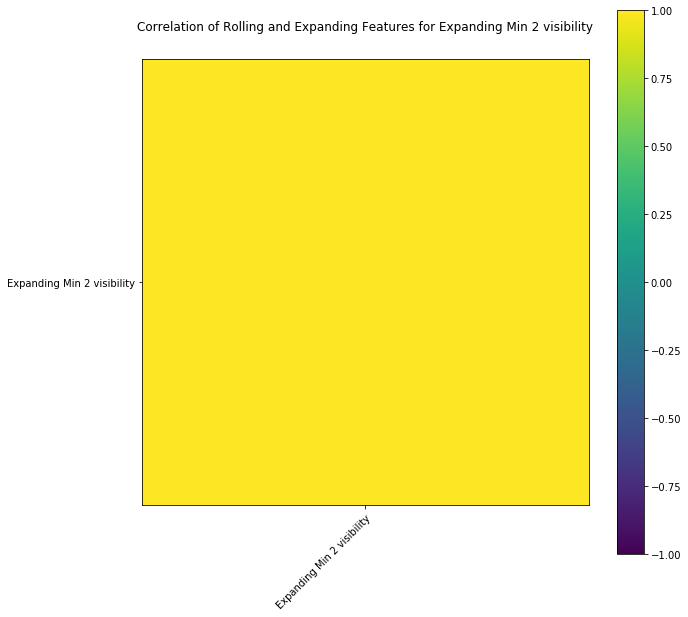

Expanding Max 2 visibility
Rolling W Done
Expanding Done


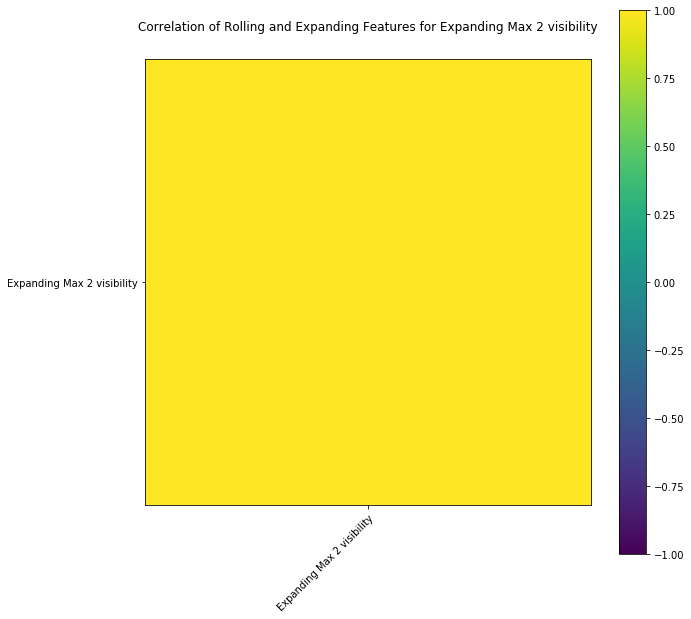

Expanding Sum 2 visibility
Rolling W Done
Expanding Done


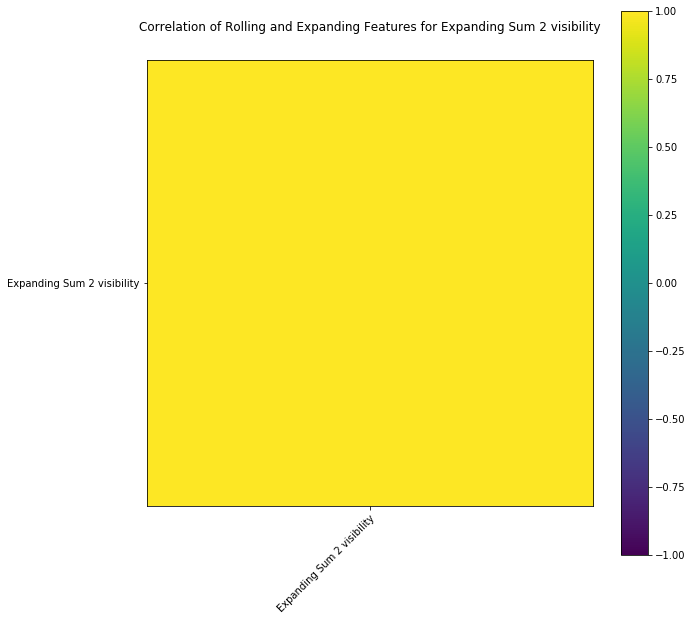

Expanding Mean 2 visibility
Rolling W Done
Expanding Done


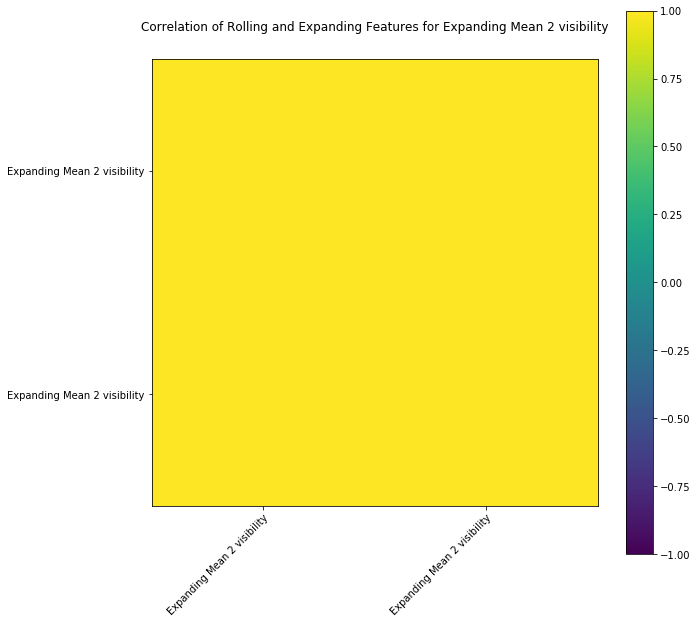

Expanding Min 3 visibility
Rolling W Done
Expanding Done


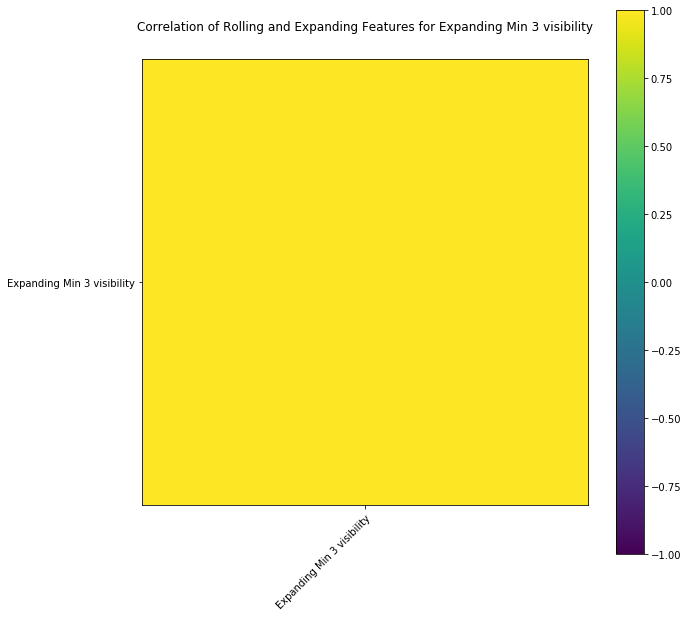

Expanding Max 3 visibility
Rolling W Done
Expanding Done


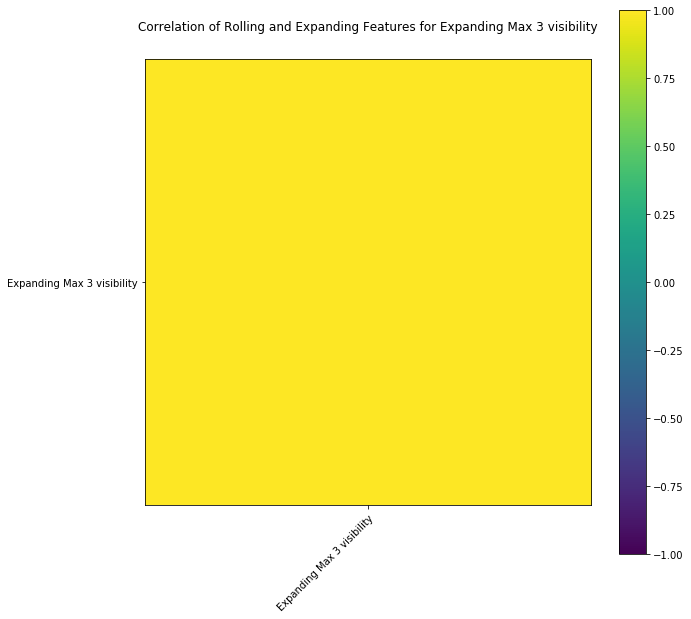

Expanding Sum 3 visibility
Rolling W Done
Expanding Done


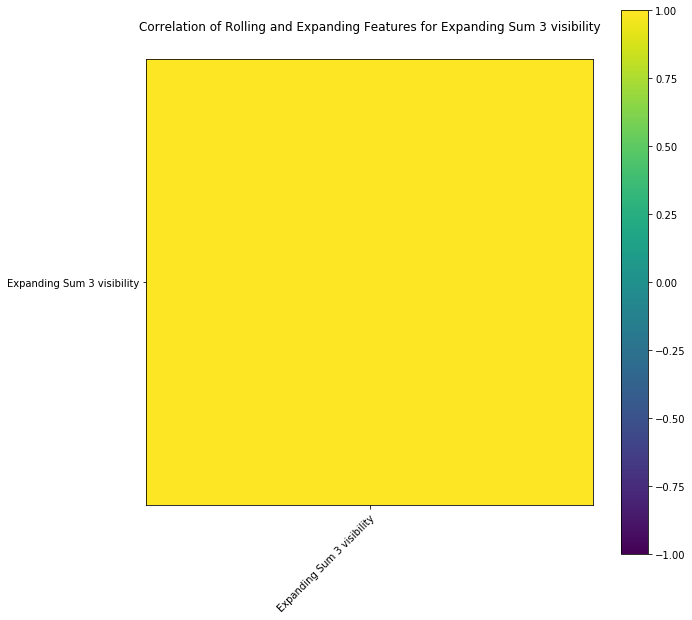

Expanding Mean 3 visibility
Rolling W Done
Expanding Done


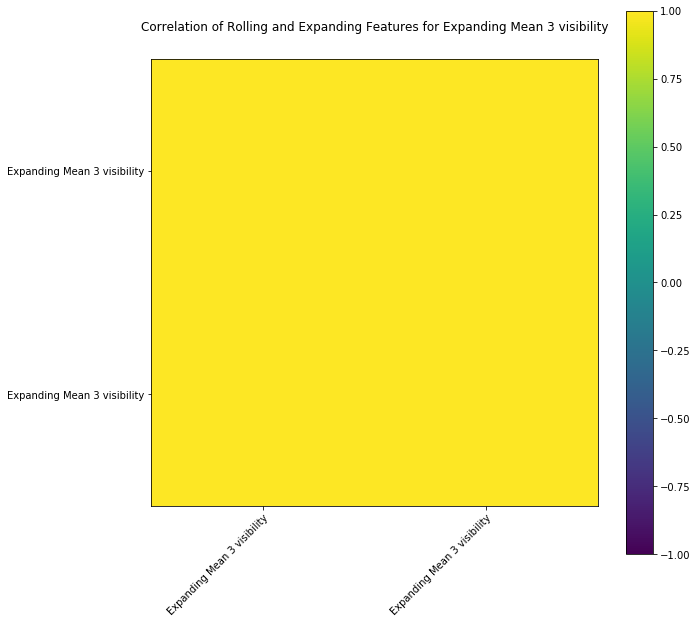

Expanding Min 4 visibility
Rolling W Done
Expanding Done


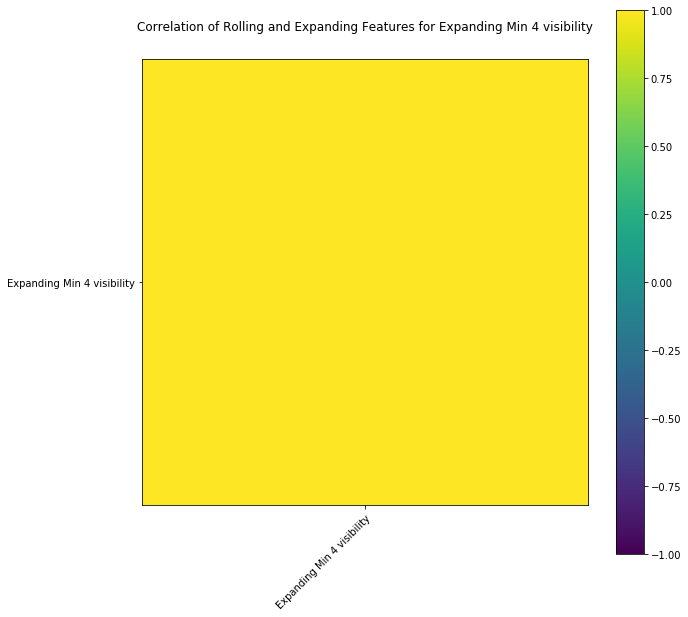

Expanding Max 4 visibility
Rolling W Done
Expanding Done


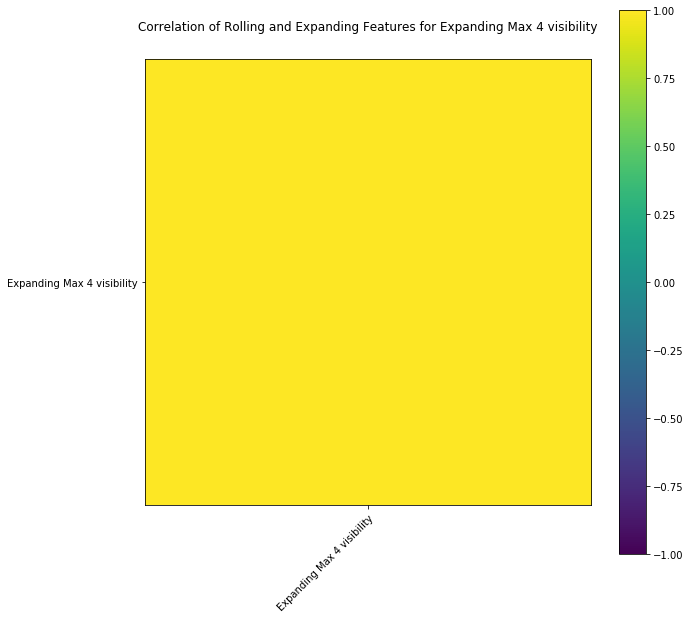

Expanding Sum 4 visibility
Rolling W Done
Expanding Done


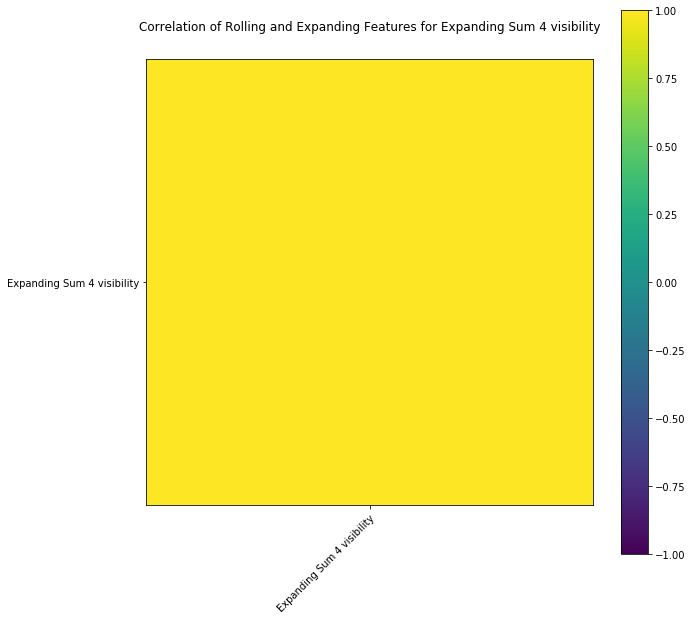

Expanding Mean 4 visibility
Rolling W Done
Expanding Done


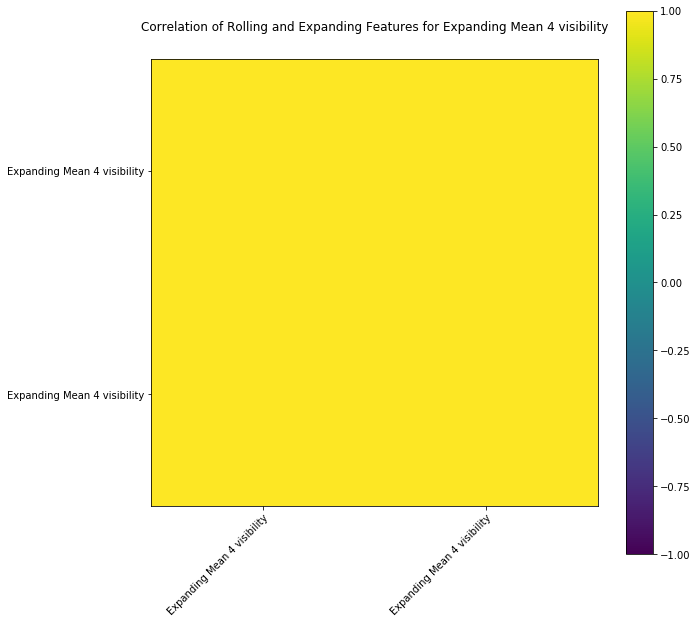

Expanding Min 8 visibility
Rolling W Done
Expanding Done


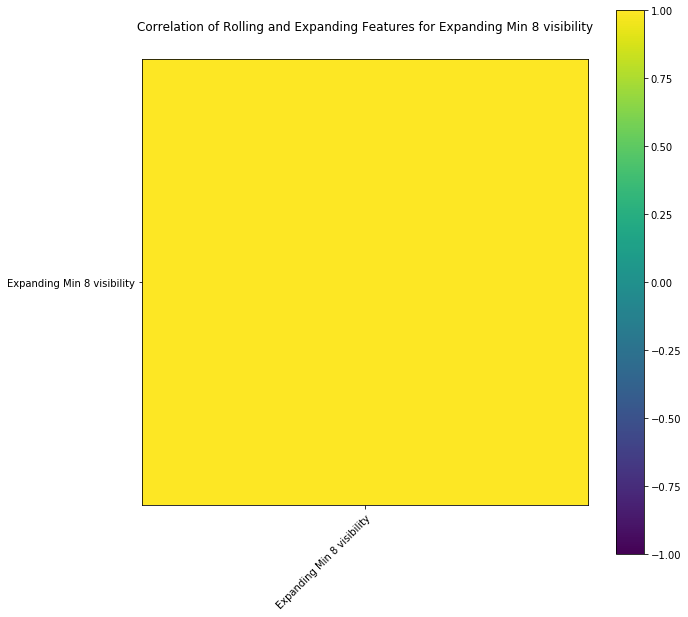

Expanding Max 8 visibility
Rolling W Done
Expanding Done


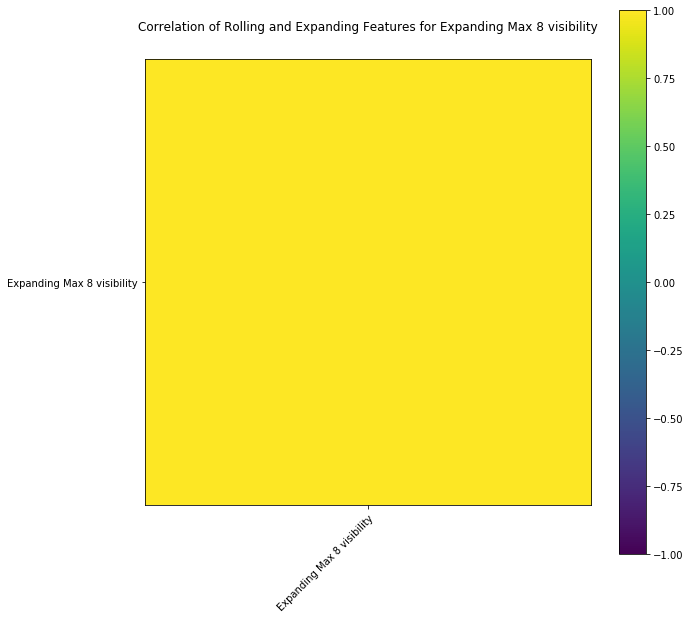

Expanding Sum 8 visibility
Rolling W Done
Expanding Done


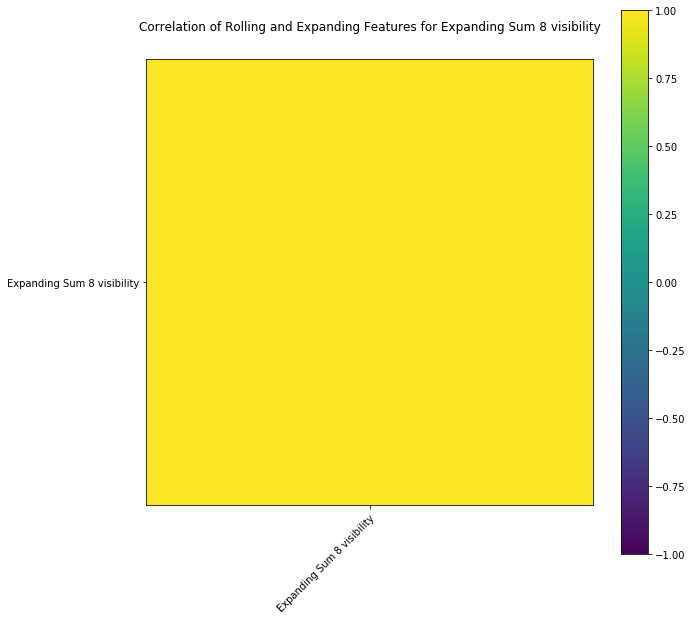

Expanding Mean 8 visibility
Rolling W Done
Expanding Done


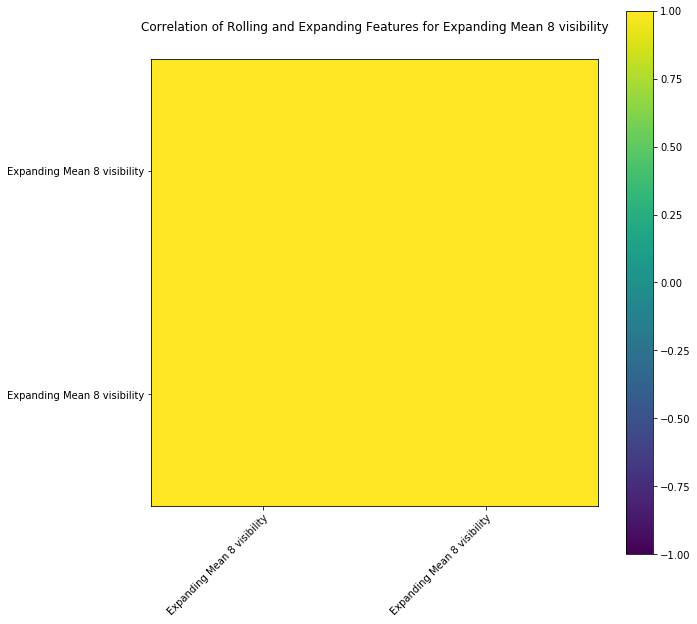

Expanding Min 12 visibility
Rolling W Done
Expanding Done


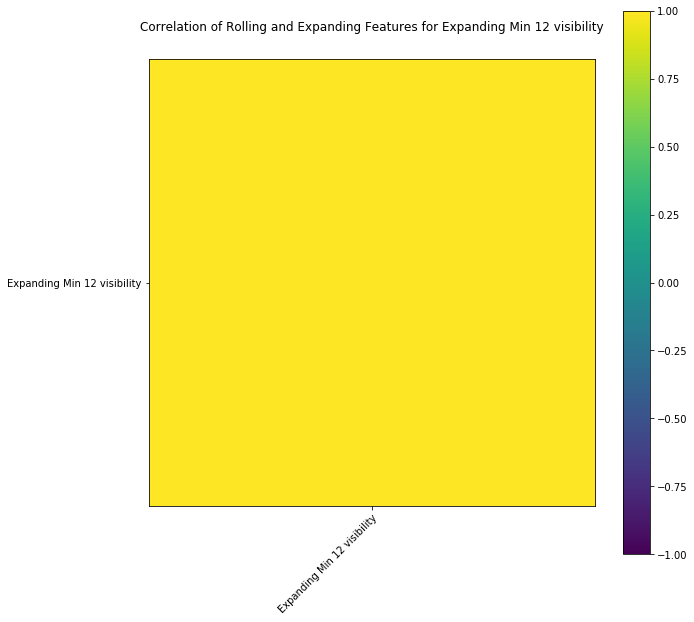

Expanding Max 12 visibility
Rolling W Done
Expanding Done


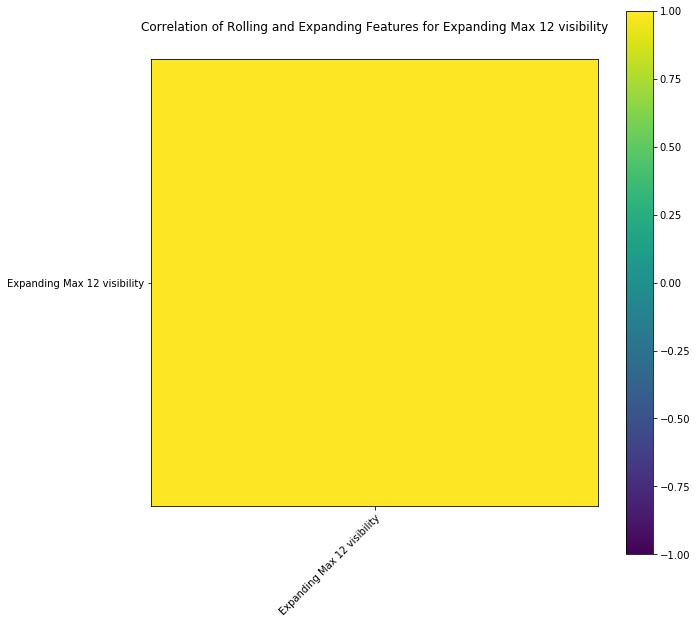

Expanding Sum 12 visibility
Rolling W Done
Expanding Done


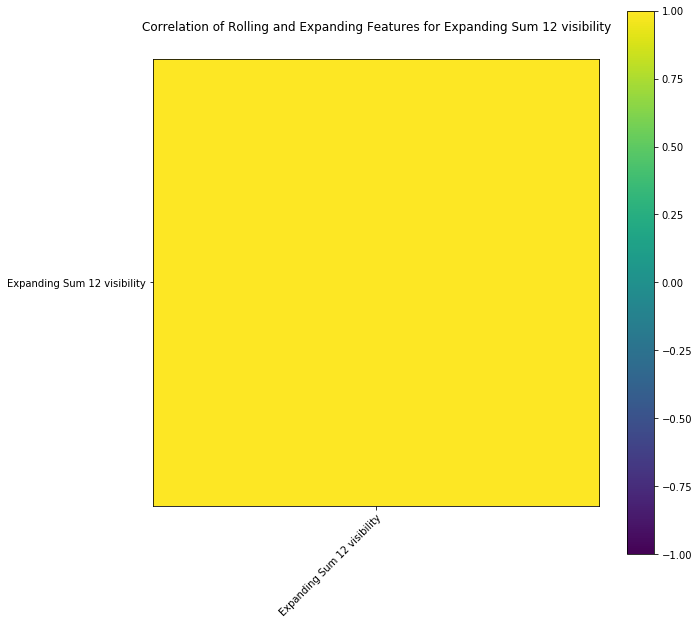

Expanding Mean 12 visibility
Rolling W Done
Expanding Done


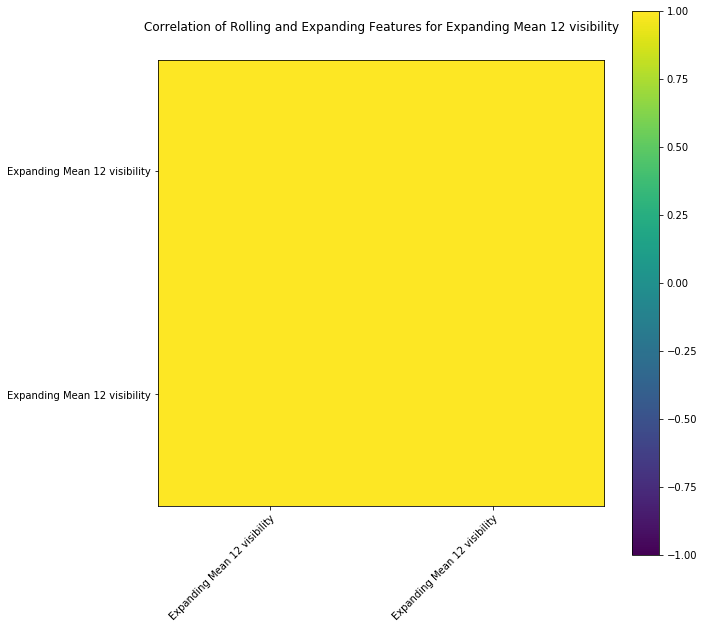

Expanding Min 16 visibility
Rolling W Done
Expanding Done


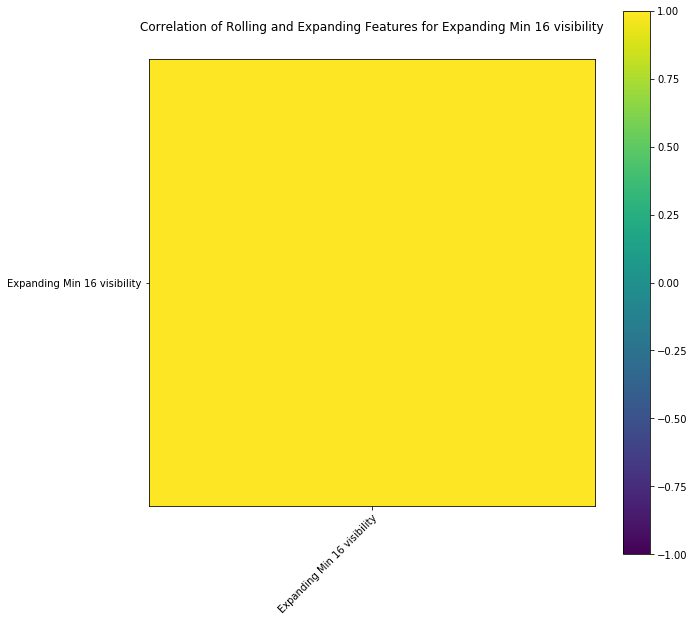

Expanding Max 16 visibility
Rolling W Done
Expanding Done


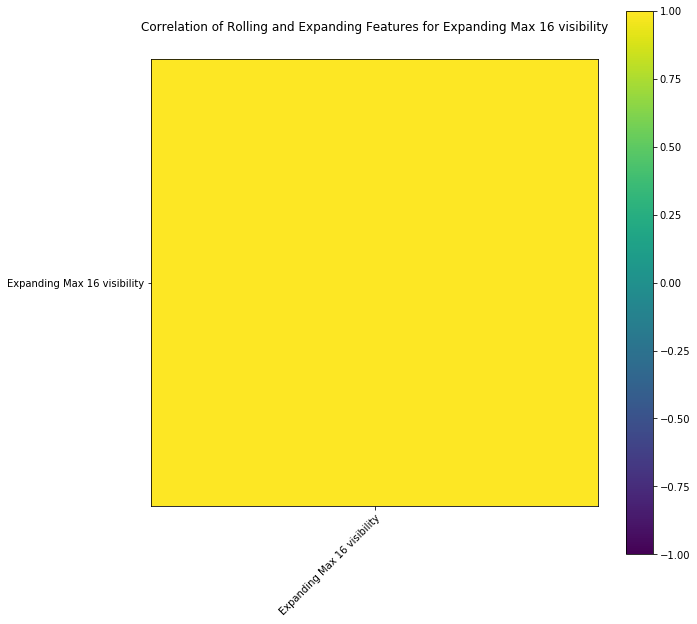

Expanding Sum 16 visibility
Rolling W Done
Expanding Done


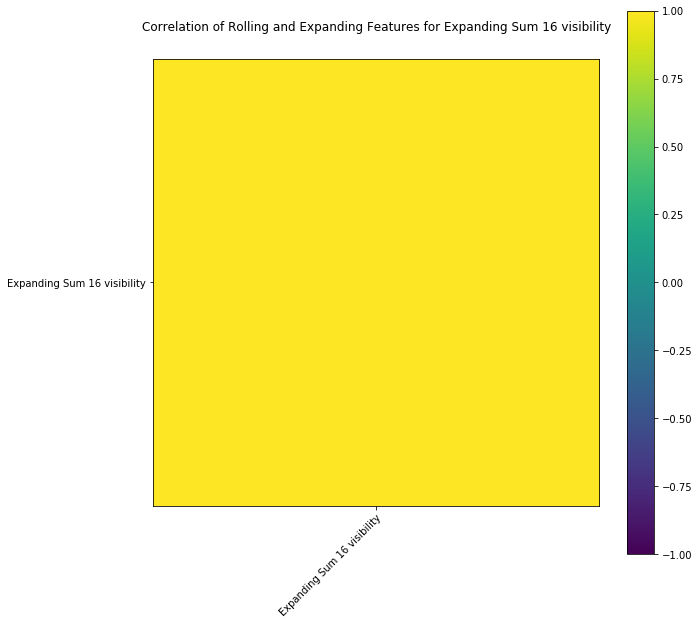

Expanding Mean 16 visibility
Rolling W Done
Expanding Done


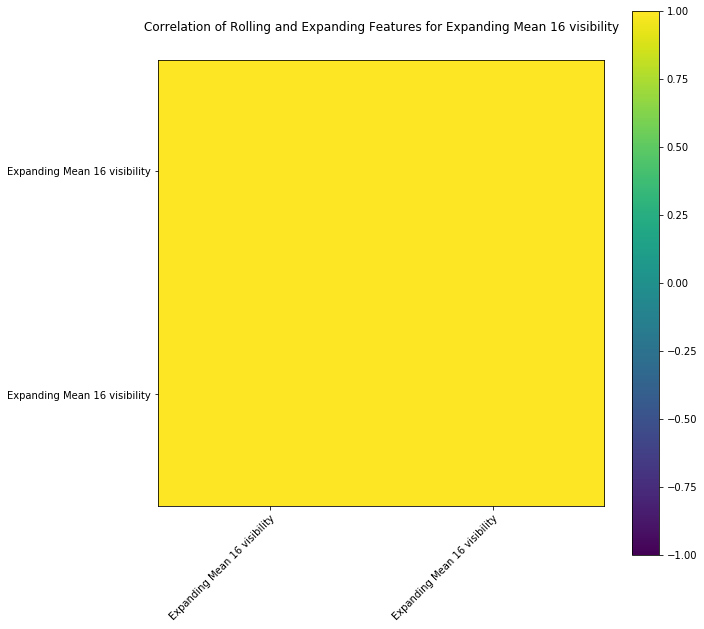

Expanding Min 24 visibility
Rolling W Done
Expanding Done


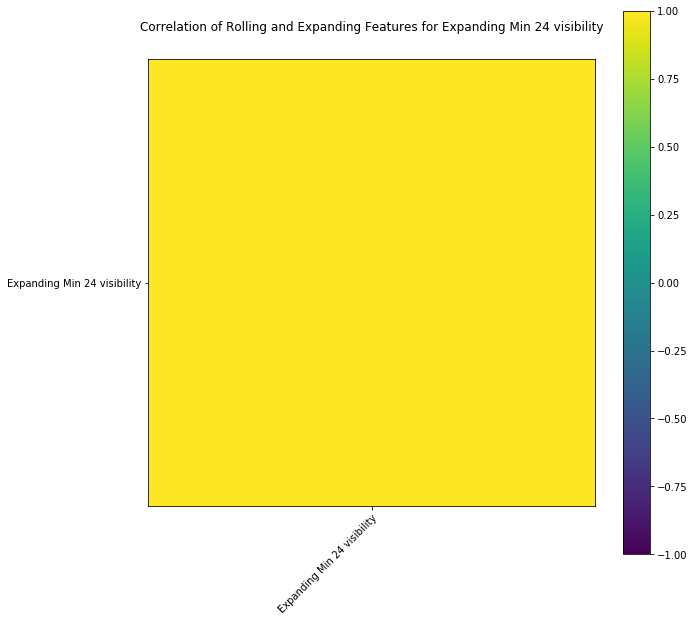

Expanding Max 24 visibility
Rolling W Done
Expanding Done


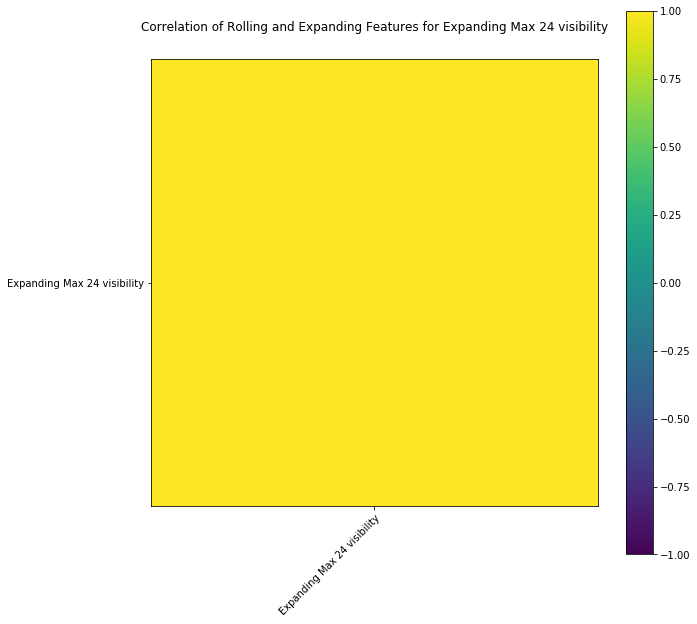

Expanding Sum 24 visibility
Rolling W Done
Expanding Done


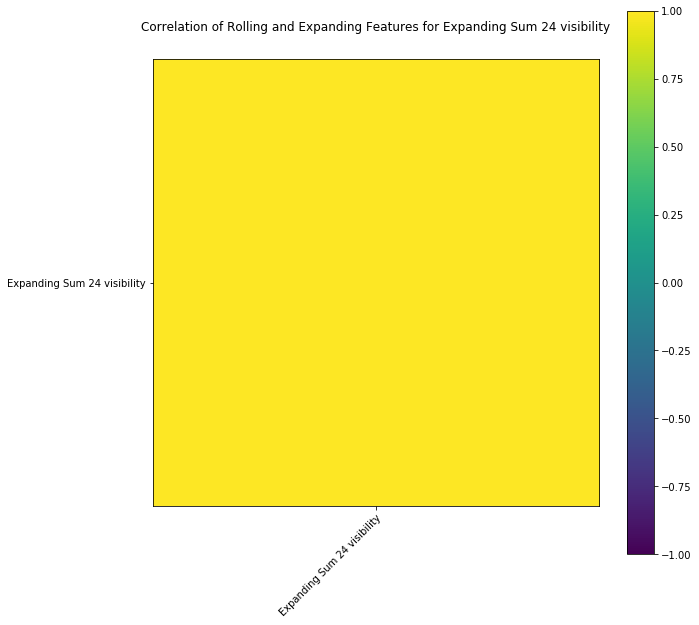

Expanding Mean 24 visibility
Rolling W Done
Expanding Done


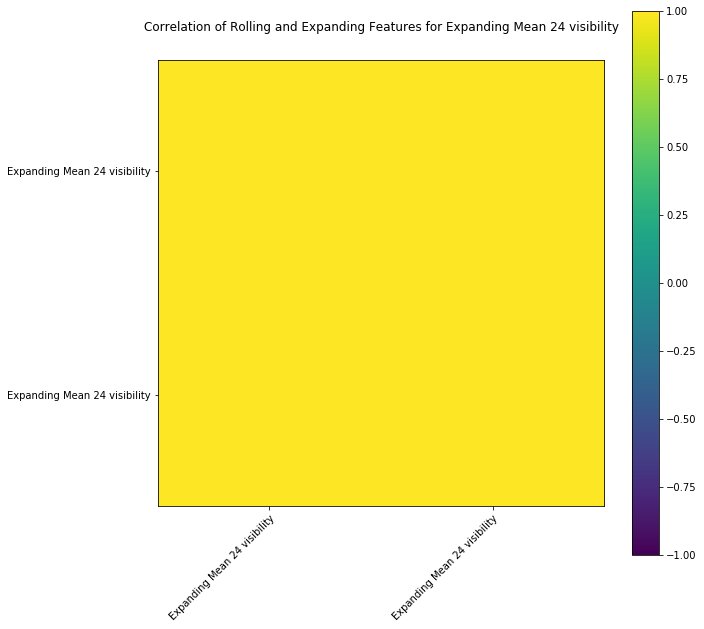

Expanding Min 48 visibility
Rolling W Done
Expanding Done


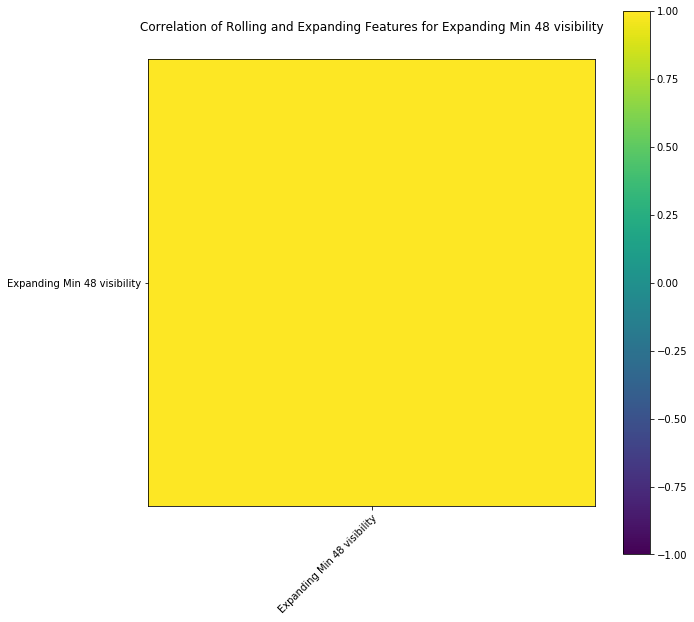

Expanding Max 48 visibility
Rolling W Done
Expanding Done


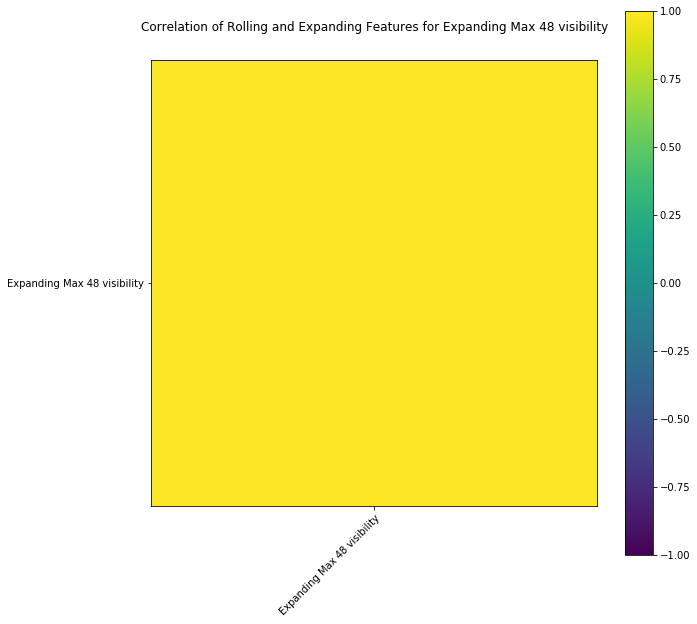

Expanding Sum 48 visibility
Rolling W Done
Expanding Done


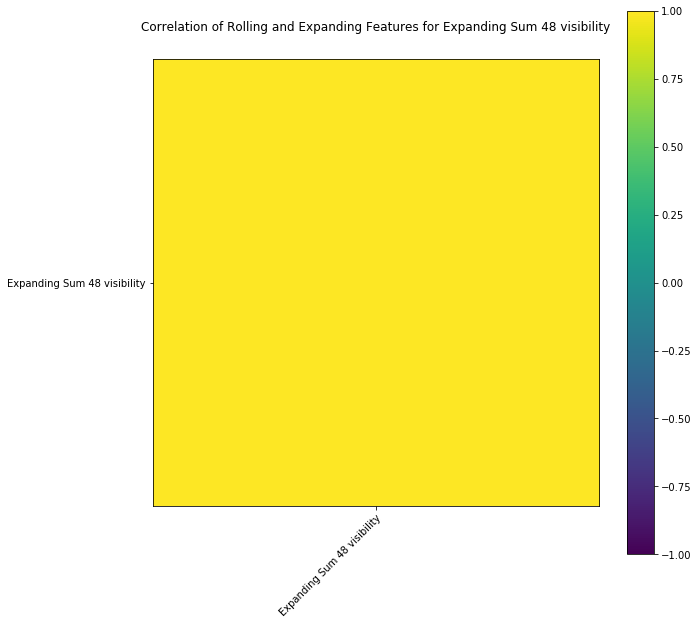

Expanding Mean 48 visibility
Rolling W Done
Expanding Done


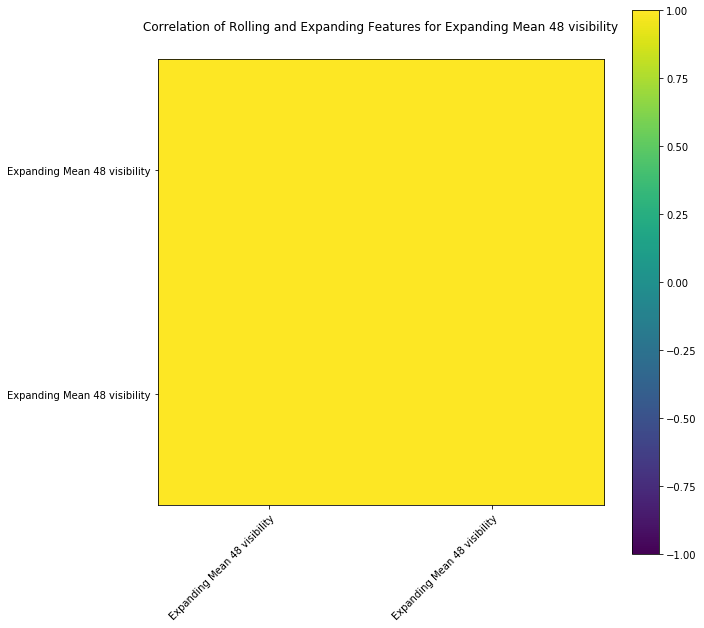

Expanding Min 96 visibility
Rolling W Done
Expanding Done


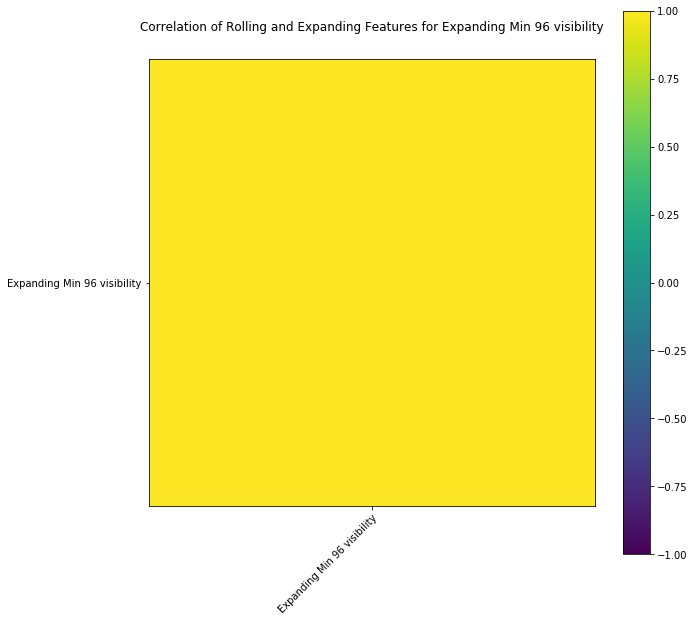

Expanding Max 96 visibility
Rolling W Done
Expanding Done


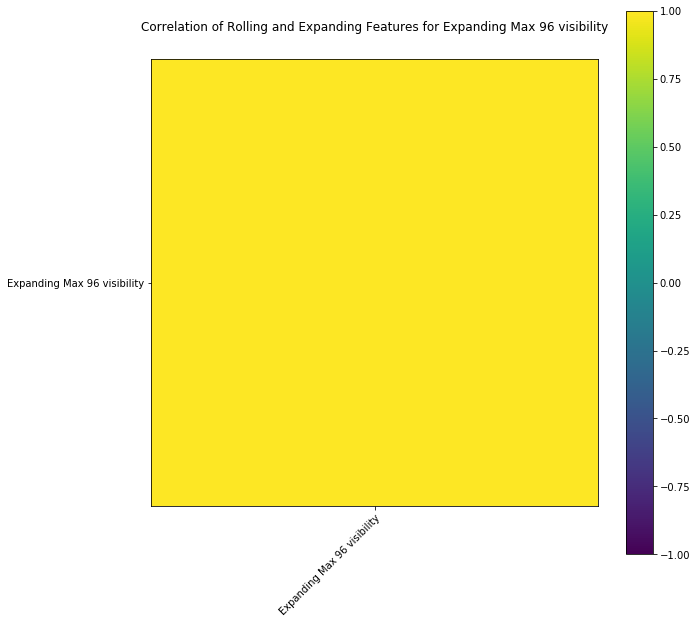

Expanding Sum 96 visibility
Rolling W Done
Expanding Done


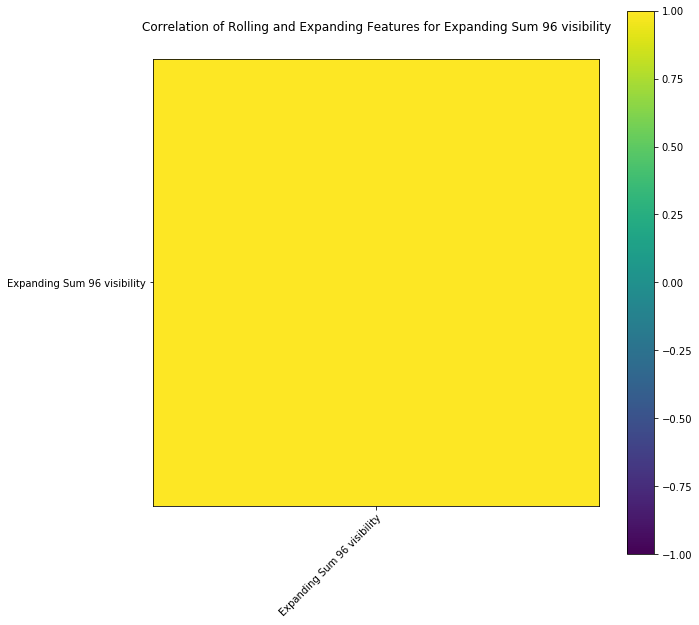

Expanding Mean 96 visibility
Rolling W Done
Expanding Done


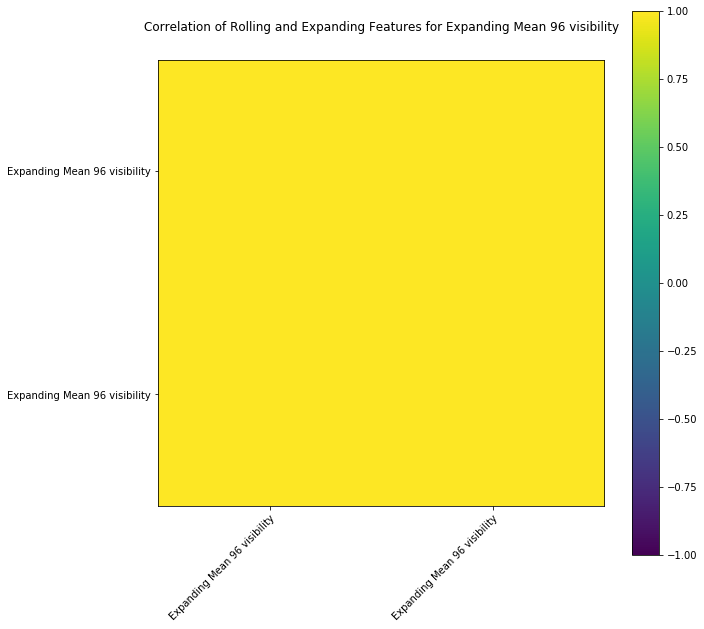

Expanding Min 2 pressure
Rolling W Done
Expanding Done


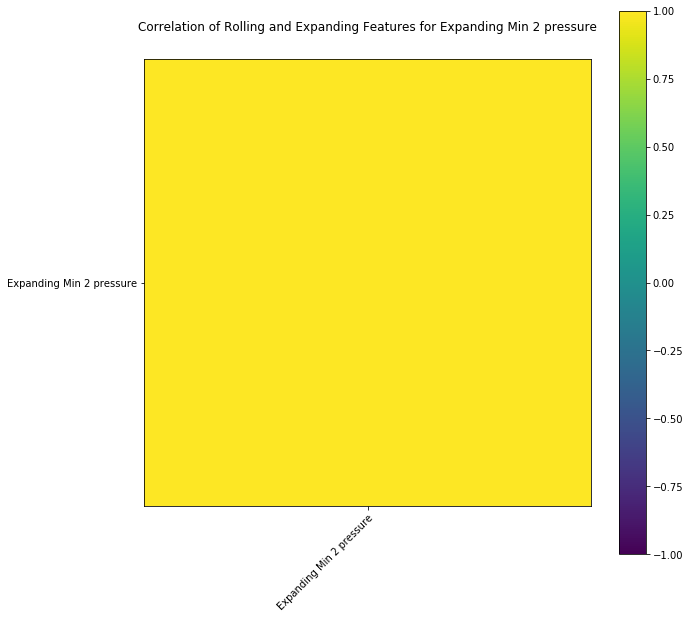

Expanding Max 2 pressure
Rolling W Done
Expanding Done


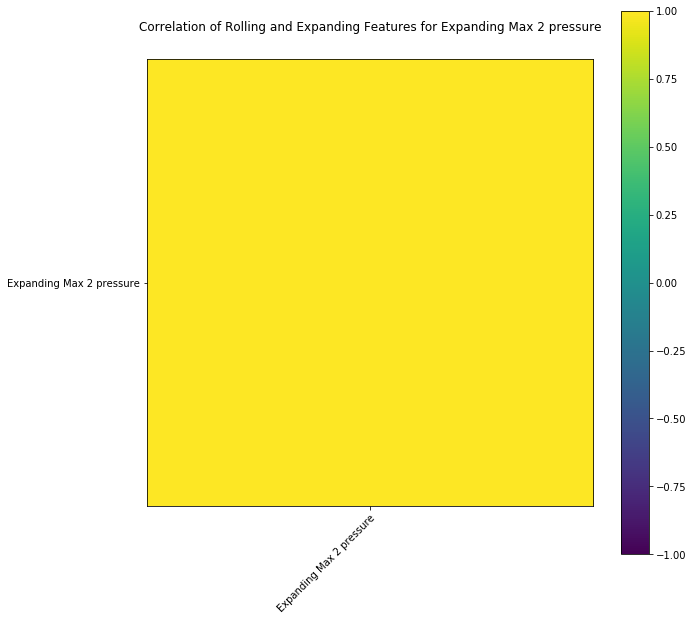

Expanding Sum 2 pressure
Rolling W Done
Expanding Done


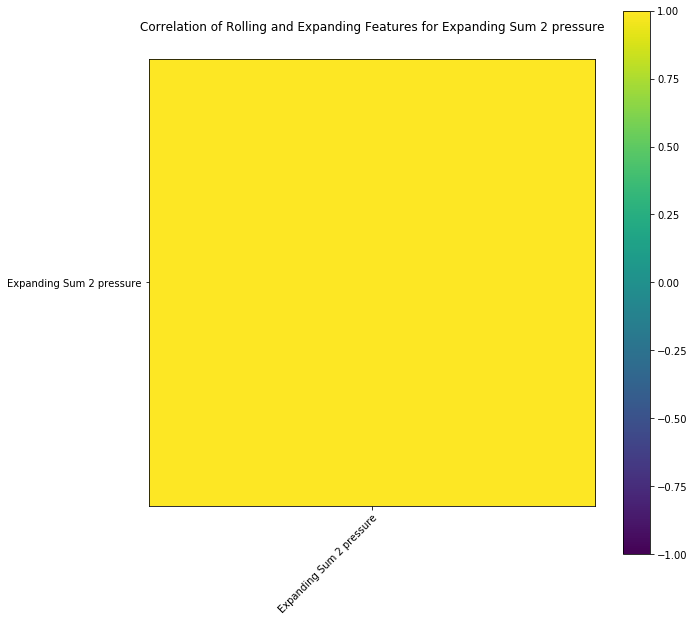

Expanding Mean 2 pressure
Rolling W Done
Expanding Done


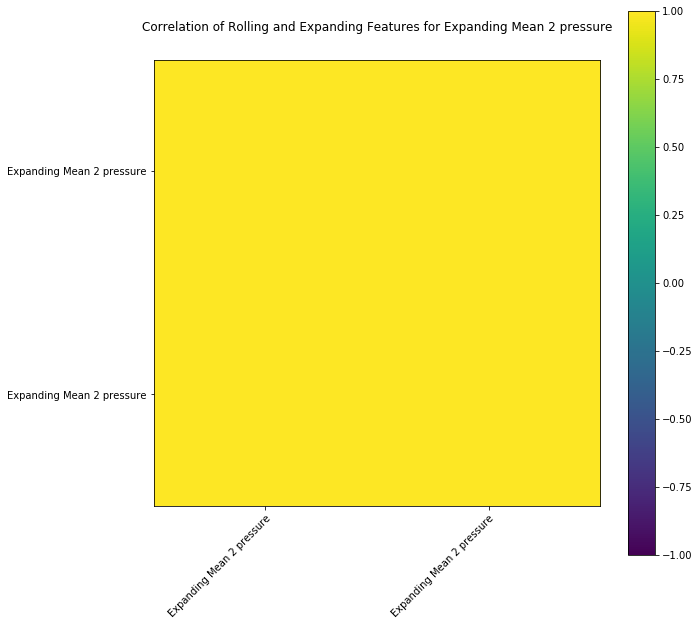

Expanding Min 3 pressure
Rolling W Done
Expanding Done


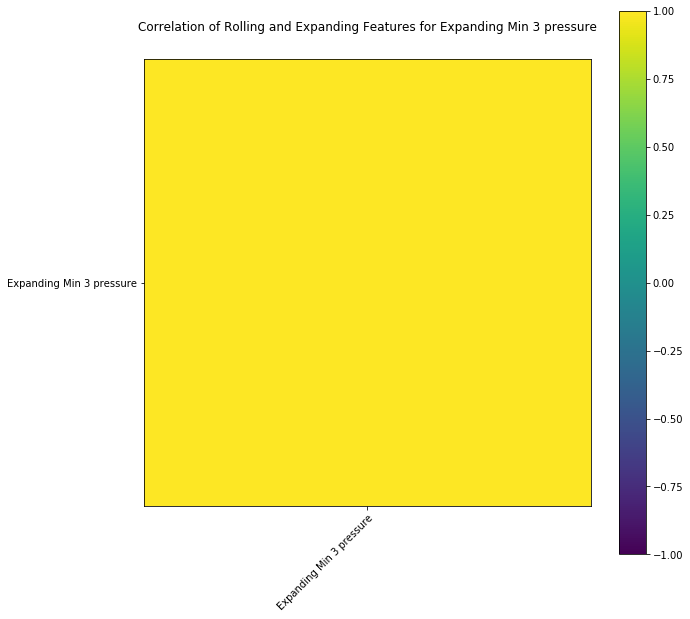

Expanding Max 3 pressure
Rolling W Done
Expanding Done


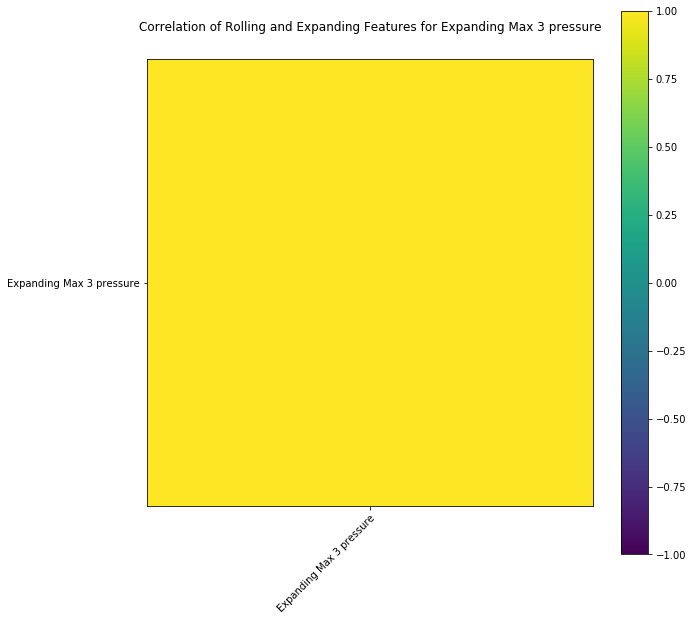

Expanding Sum 3 pressure
Rolling W Done
Expanding Done


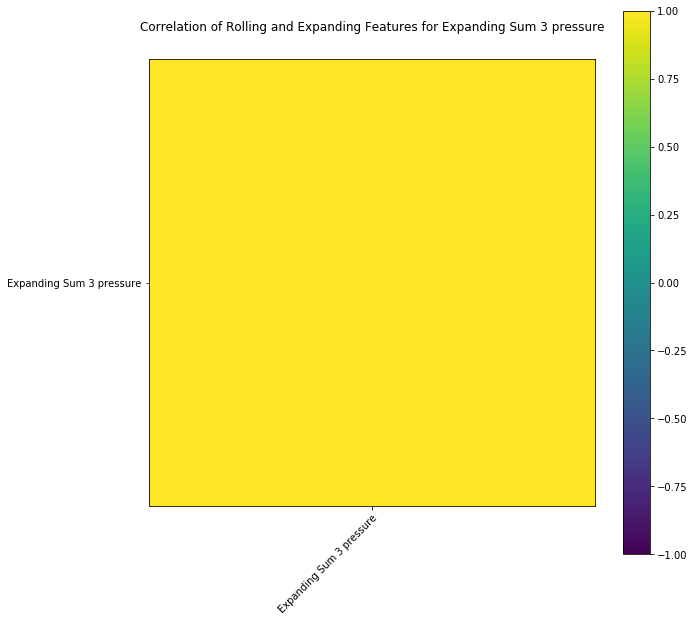

Expanding Mean 3 pressure
Rolling W Done
Expanding Done


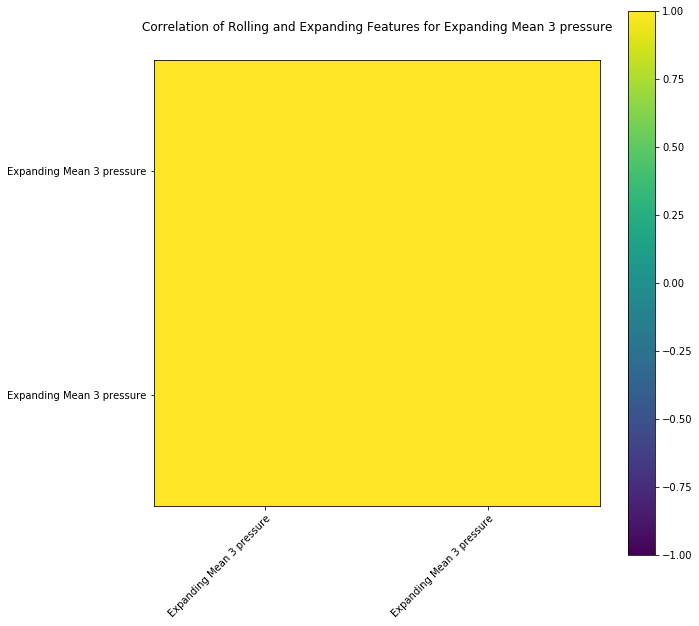

Expanding Min 4 pressure
Rolling W Done
Expanding Done


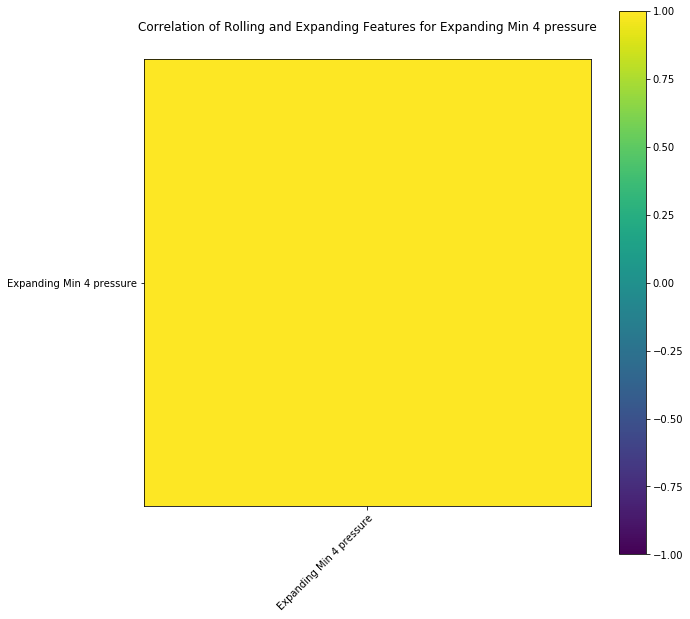

Expanding Max 4 pressure
Rolling W Done
Expanding Done


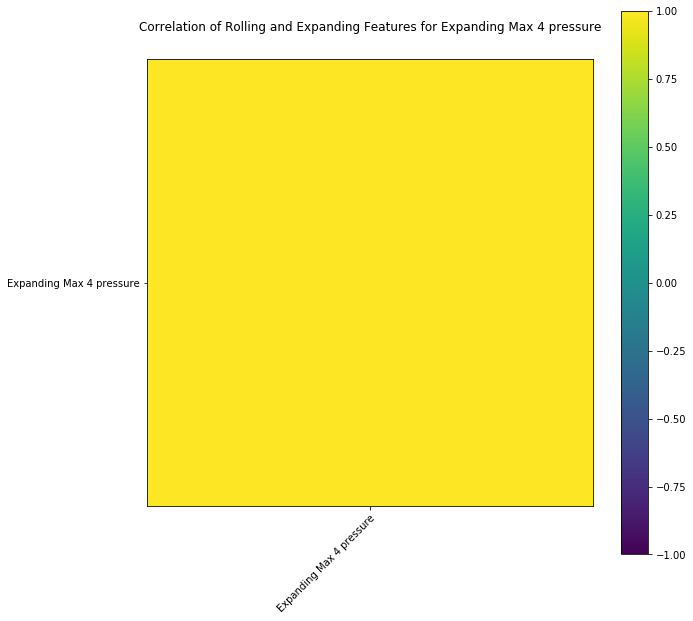

Expanding Sum 4 pressure
Rolling W Done
Expanding Done


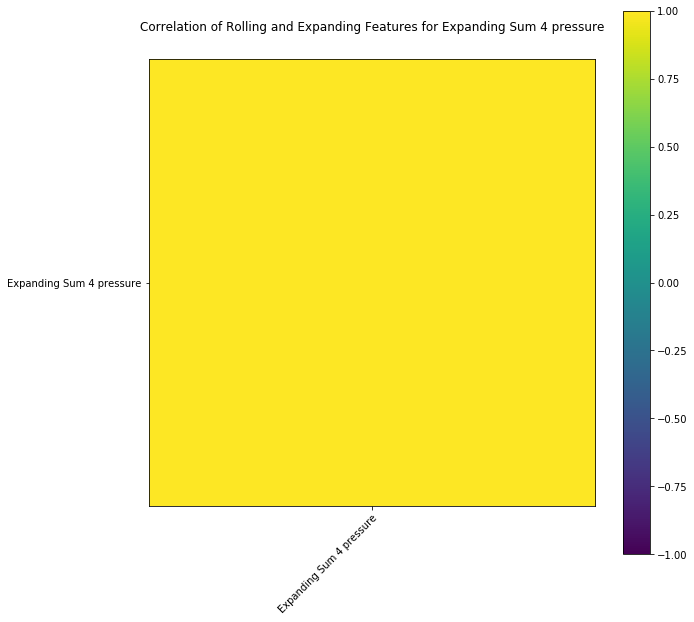

Expanding Mean 4 pressure
Rolling W Done
Expanding Done


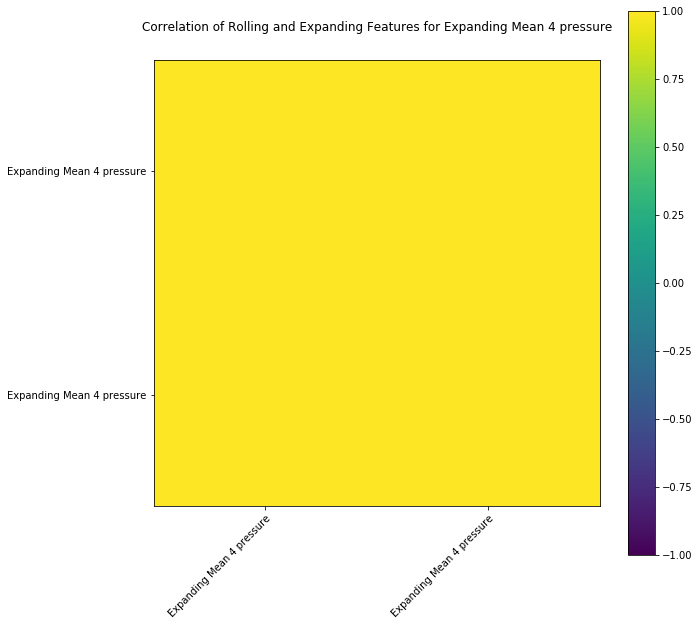

Expanding Min 8 pressure
Rolling W Done
Expanding Done


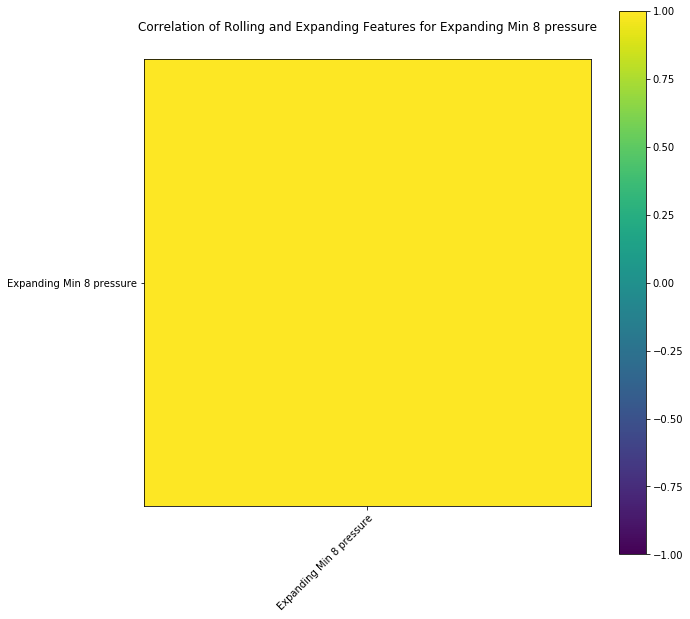

Expanding Max 8 pressure
Rolling W Done
Expanding Done


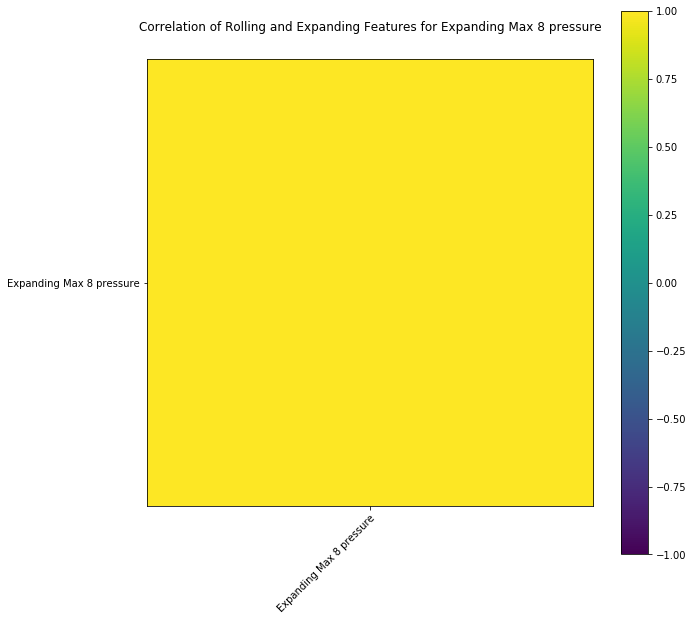

Expanding Sum 8 pressure
Rolling W Done
Expanding Done


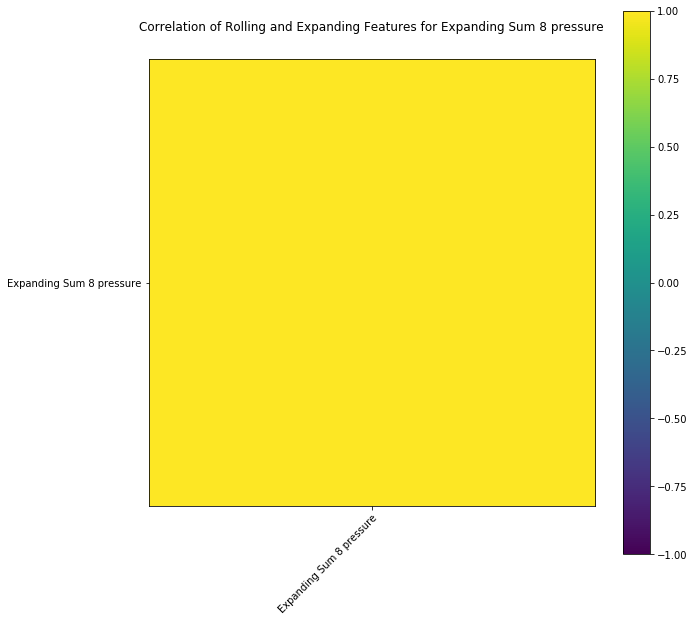

Expanding Mean 8 pressure
Rolling W Done
Expanding Done


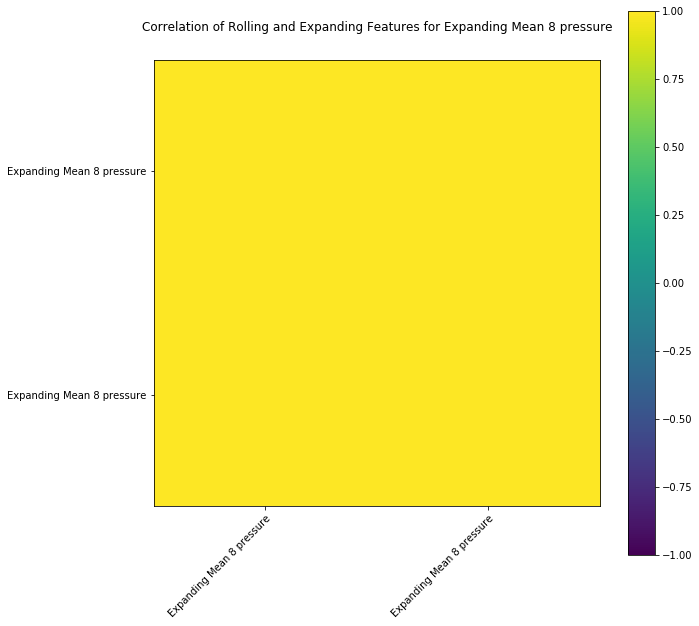

Expanding Min 12 pressure
Rolling W Done
Expanding Done


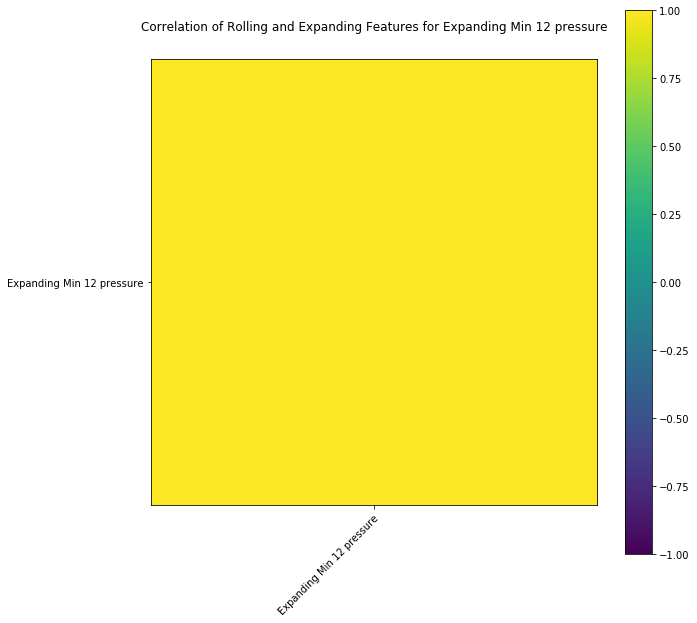

Expanding Max 12 pressure
Rolling W Done
Expanding Done


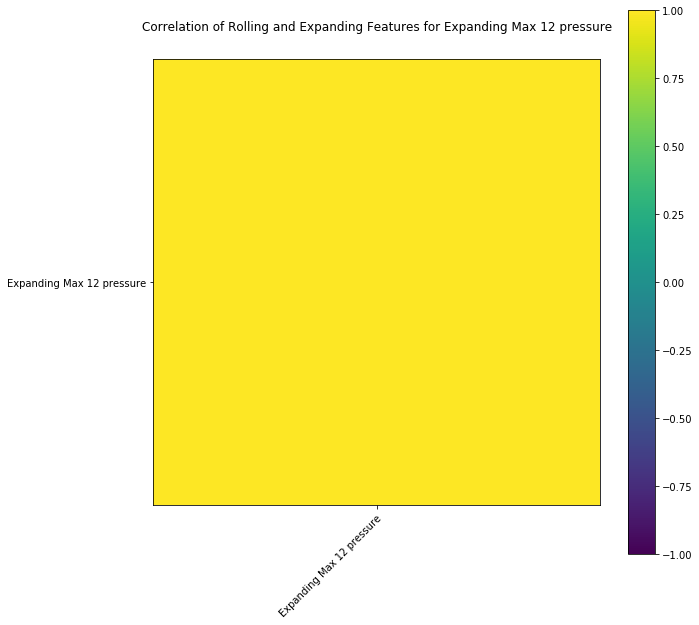

Expanding Sum 12 pressure
Rolling W Done
Expanding Done


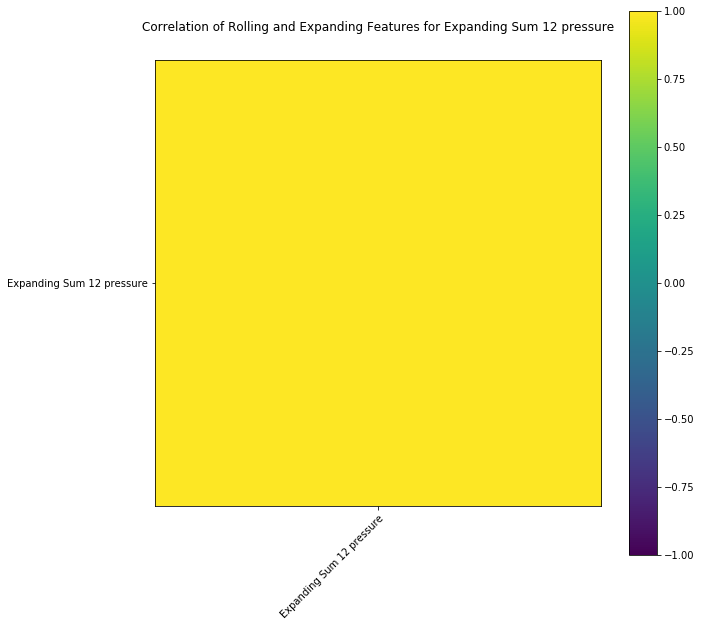

Expanding Mean 12 pressure
Rolling W Done
Expanding Done


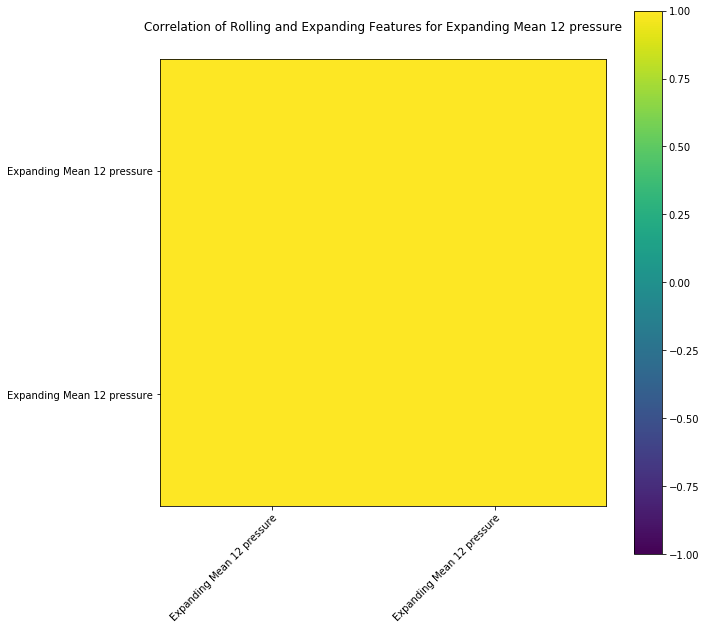

Expanding Min 16 pressure
Rolling W Done
Expanding Done


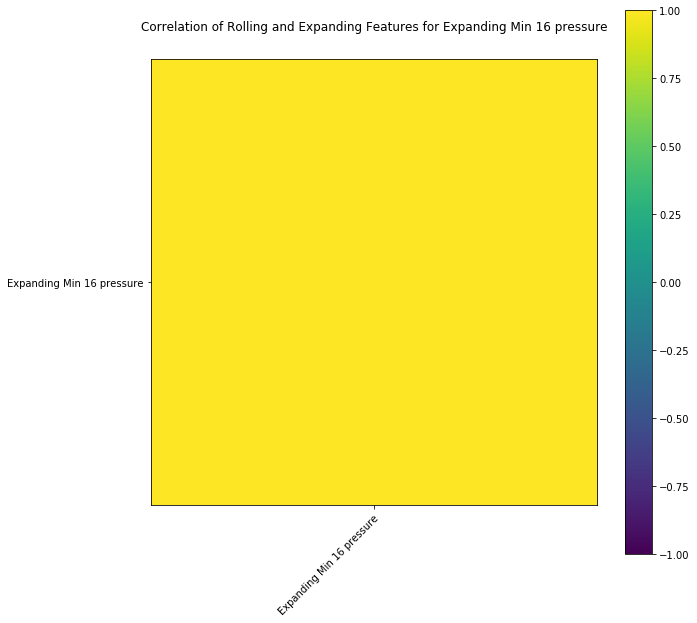

Expanding Max 16 pressure
Rolling W Done
Expanding Done


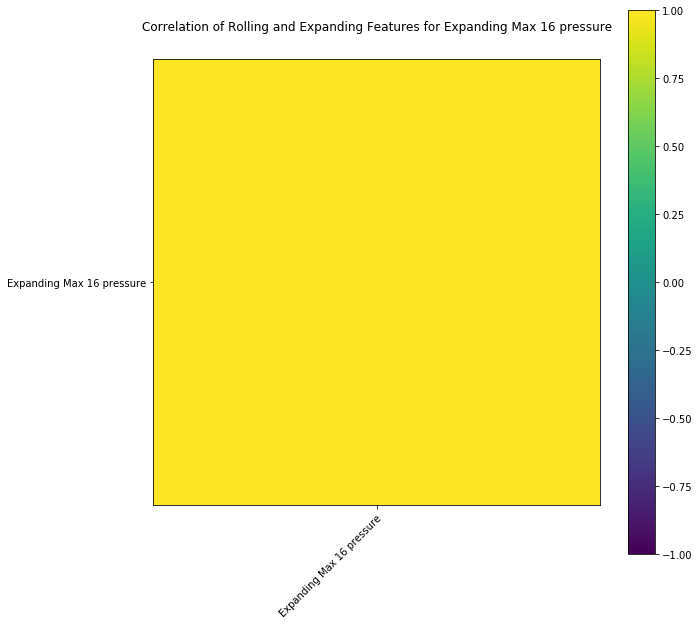

Expanding Sum 16 pressure
Rolling W Done
Expanding Done


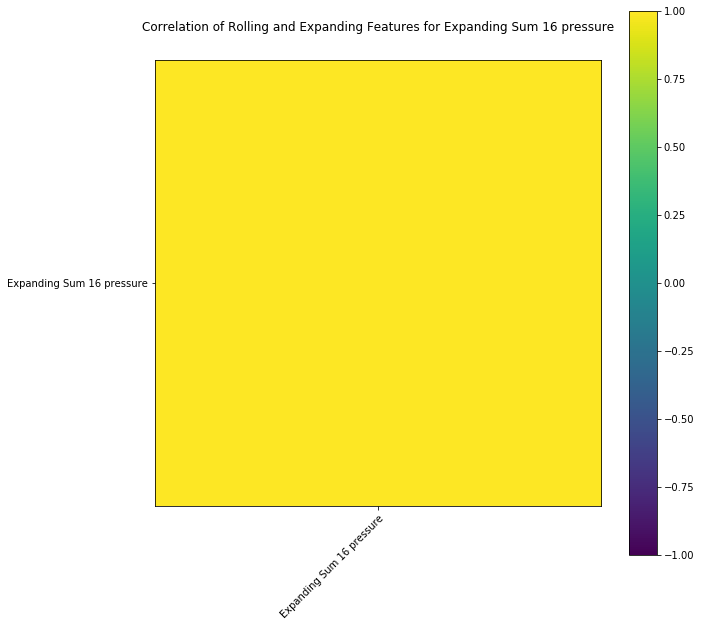

Expanding Mean 16 pressure
Rolling W Done
Expanding Done


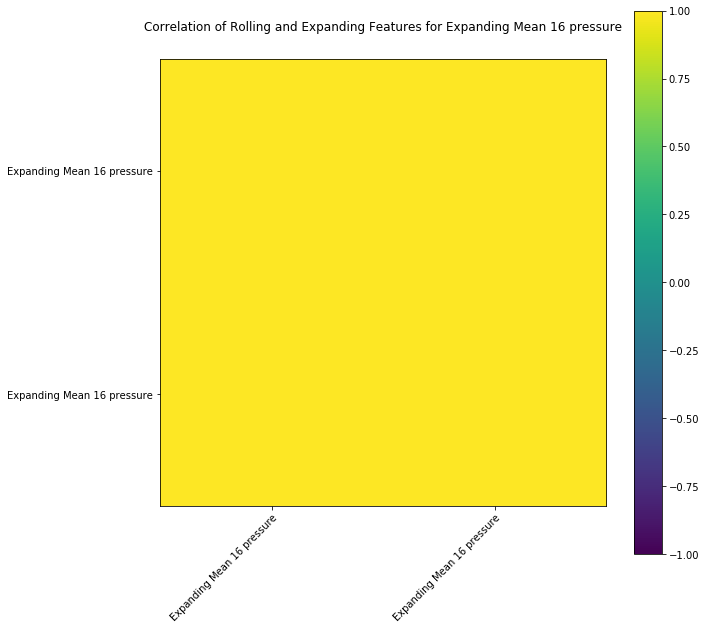

Expanding Min 24 pressure
Rolling W Done
Expanding Done


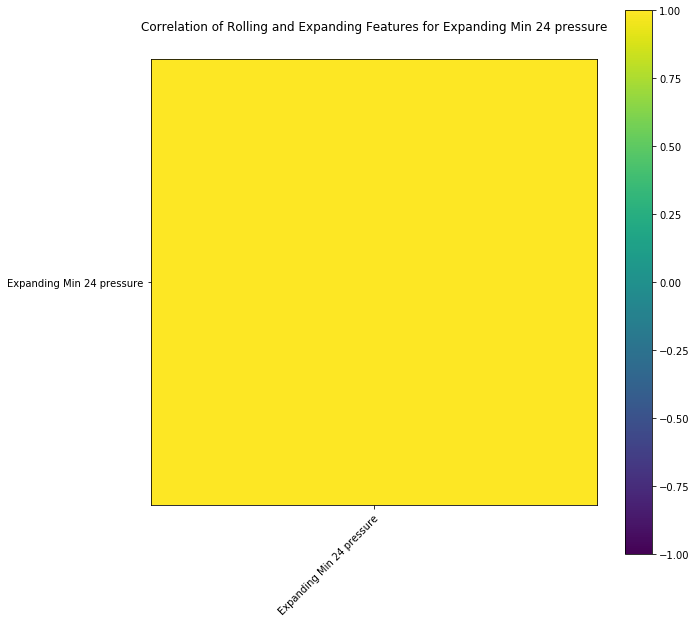

Expanding Max 24 pressure
Rolling W Done
Expanding Done


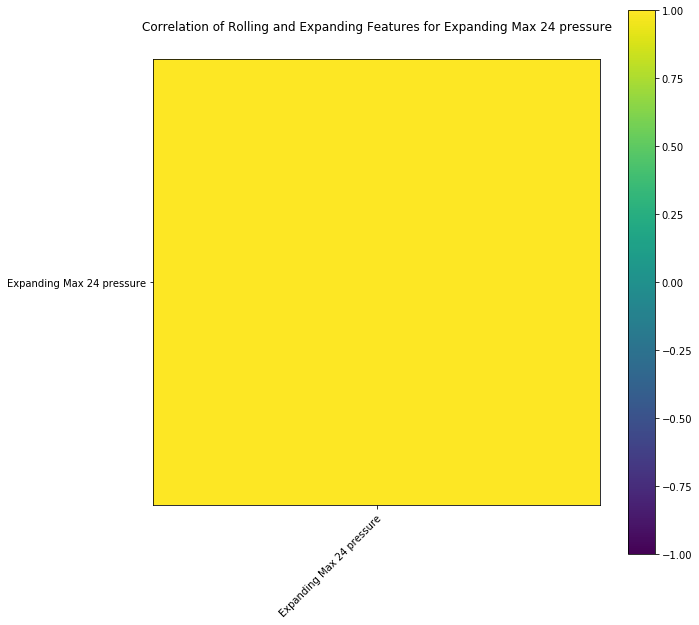

Expanding Sum 24 pressure
Rolling W Done
Expanding Done


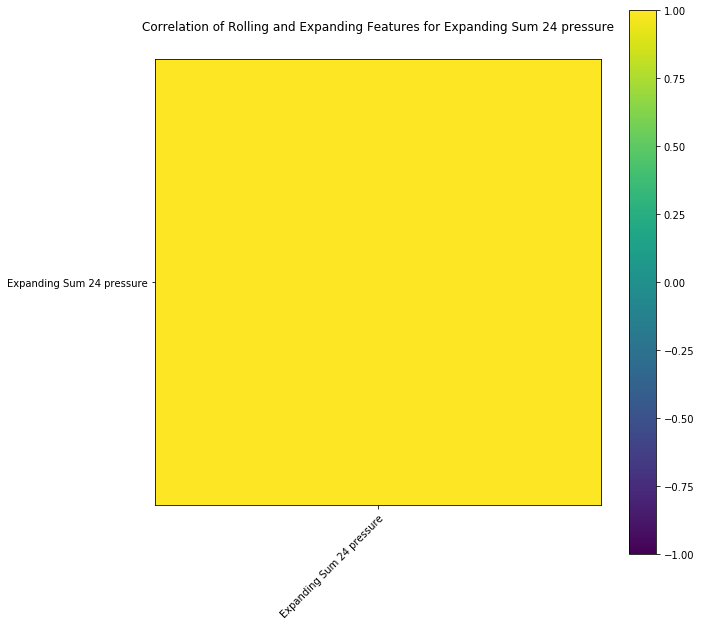

Expanding Mean 24 pressure
Rolling W Done
Expanding Done


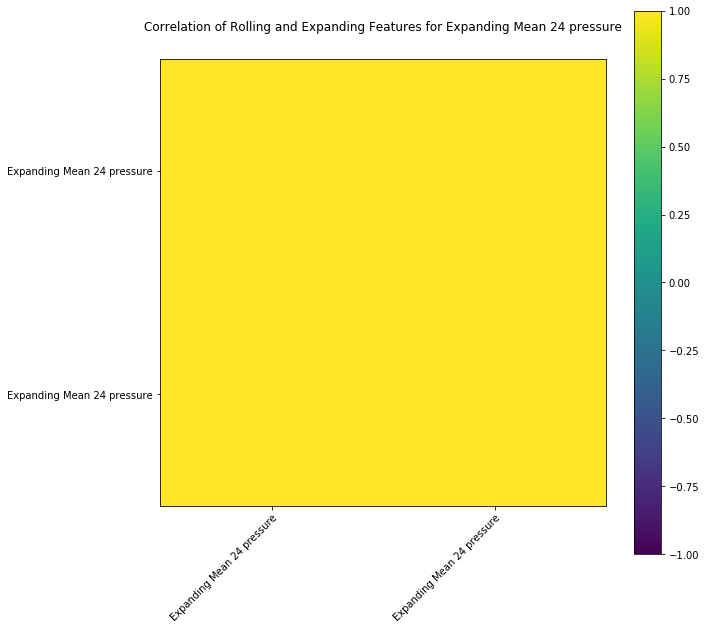

Expanding Min 48 pressure
Rolling W Done
Expanding Done


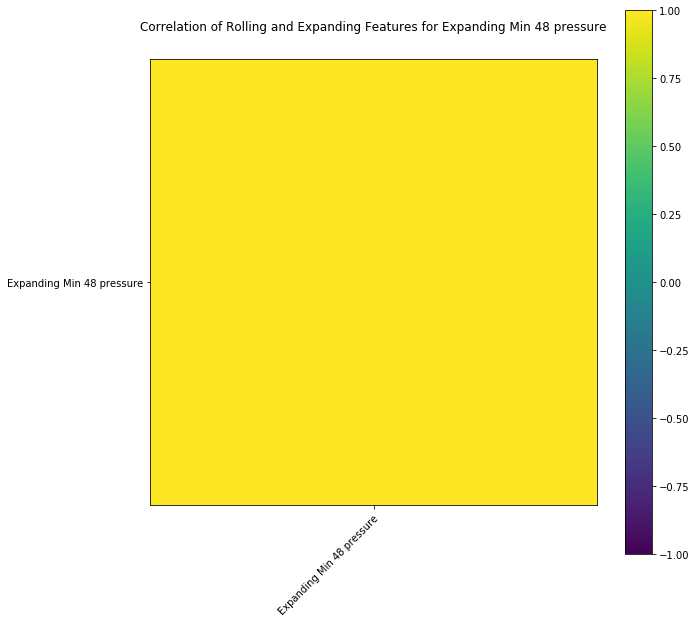

Expanding Max 48 pressure
Rolling W Done
Expanding Done


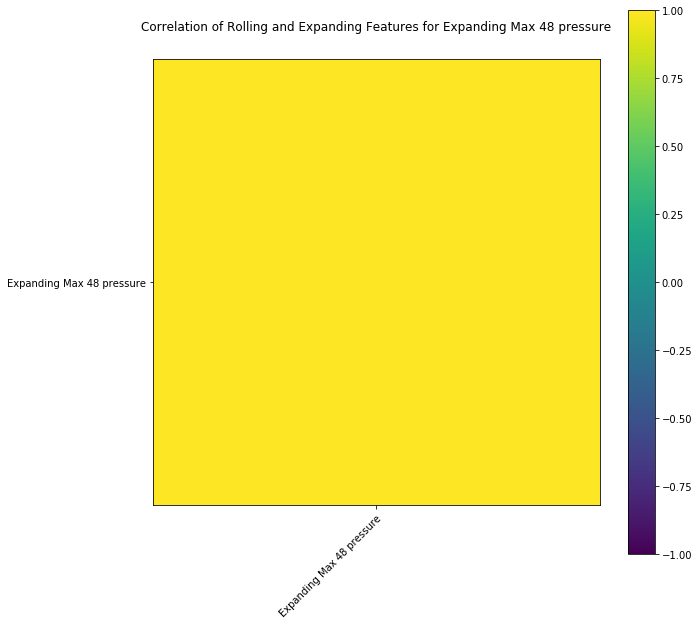

Expanding Sum 48 pressure
Rolling W Done
Expanding Done


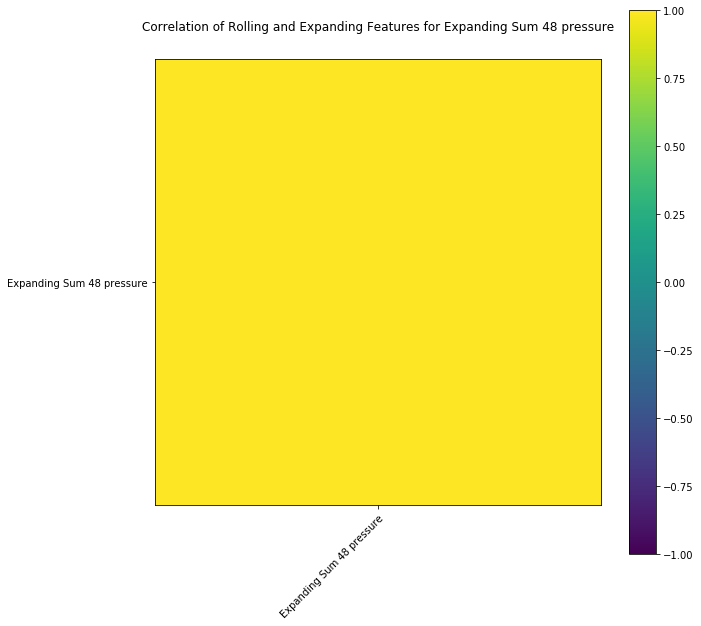

Expanding Mean 48 pressure
Rolling W Done
Expanding Done


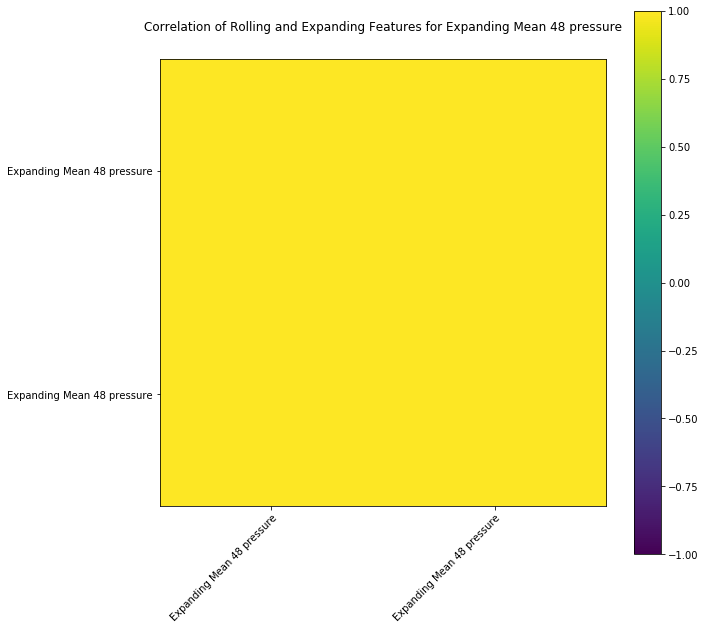

Expanding Min 96 pressure
Rolling W Done
Expanding Done


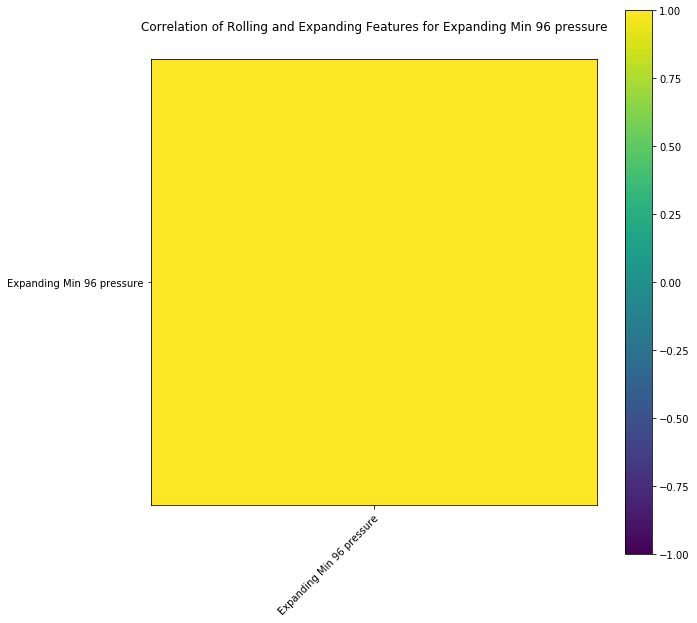

Expanding Max 96 pressure
Rolling W Done
Expanding Done


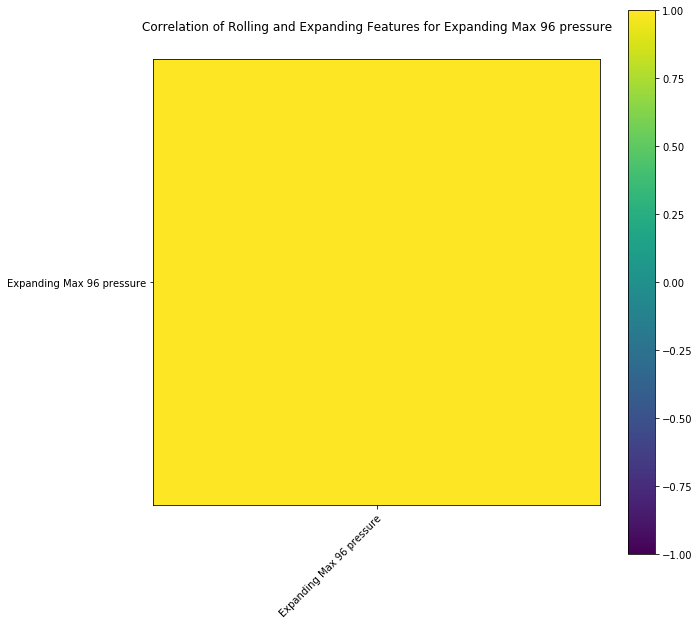

Expanding Sum 96 pressure
Rolling W Done
Expanding Done


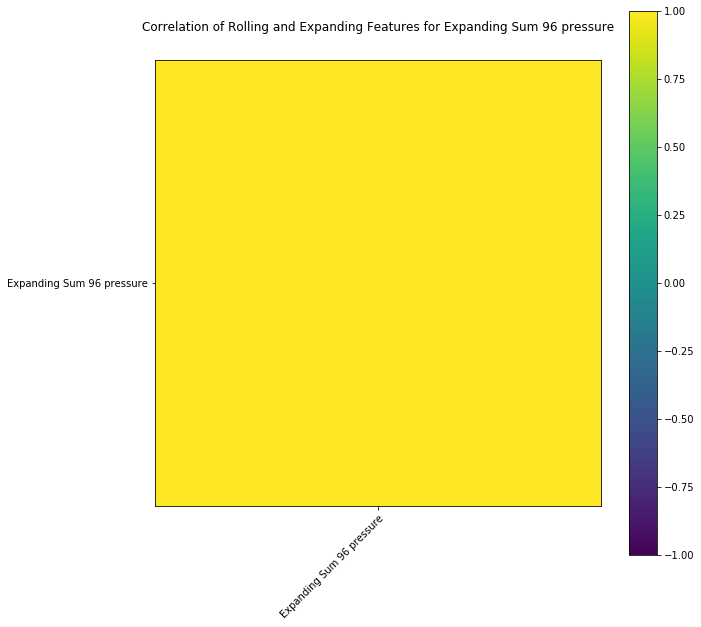

Expanding Mean 96 pressure
Rolling W Done
Expanding Done


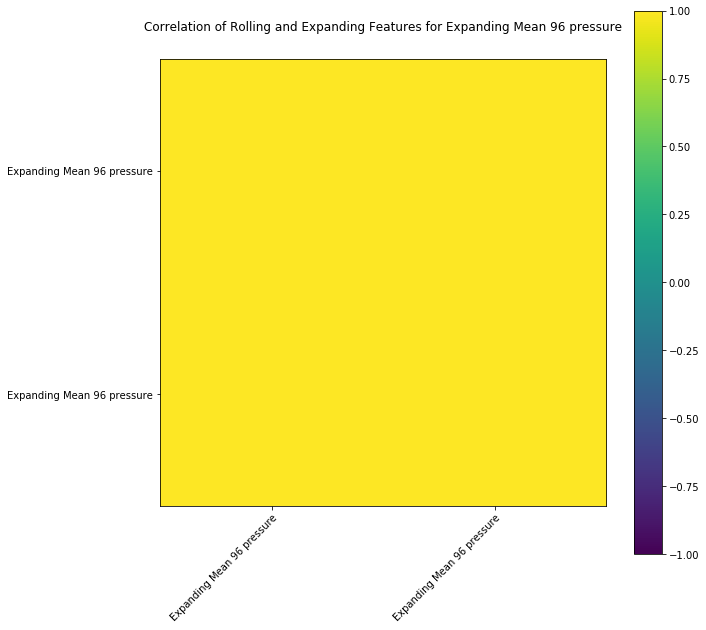

Expanding Min 2 cloudcover
Rolling W Done
Expanding Done


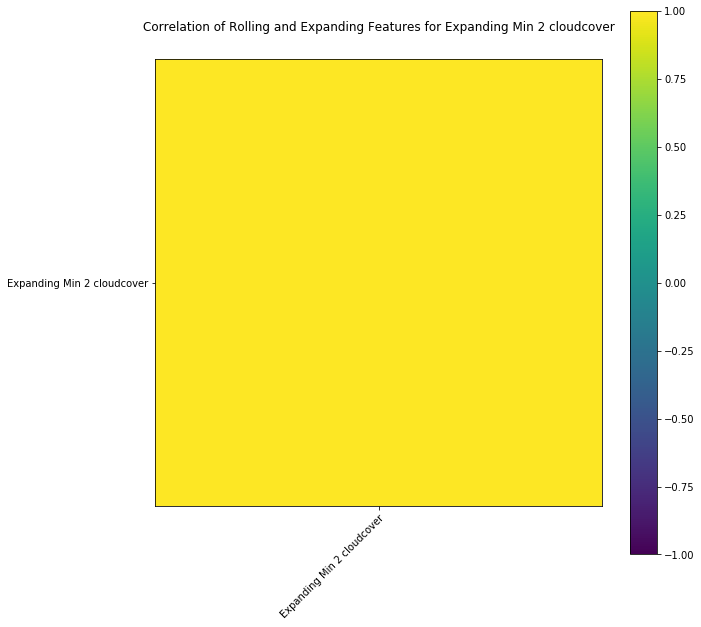

Expanding Max 2 cloudcover
Rolling W Done
Expanding Done


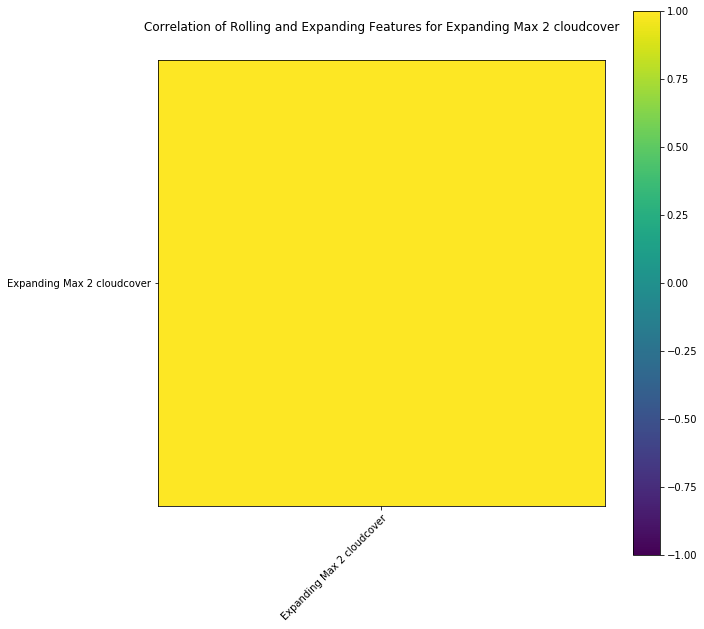

Expanding Sum 2 cloudcover
Rolling W Done
Expanding Done


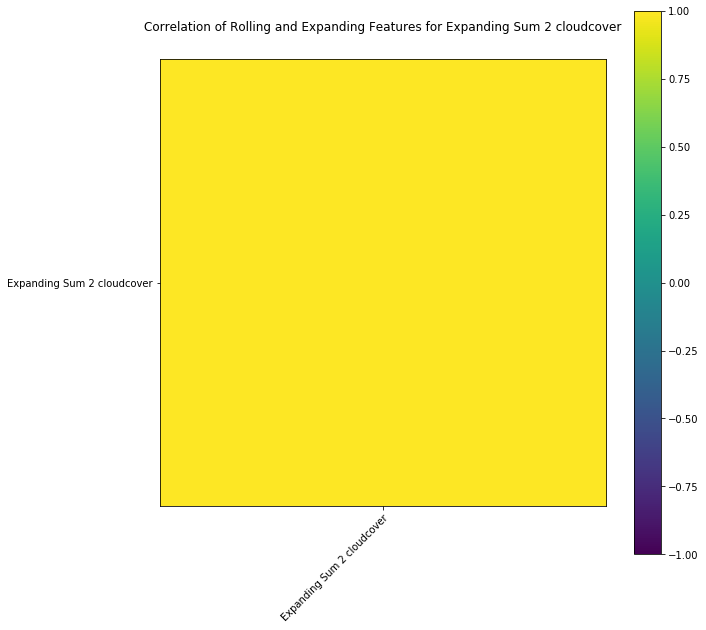

Expanding Mean 2 cloudcover
Rolling W Done
Expanding Done


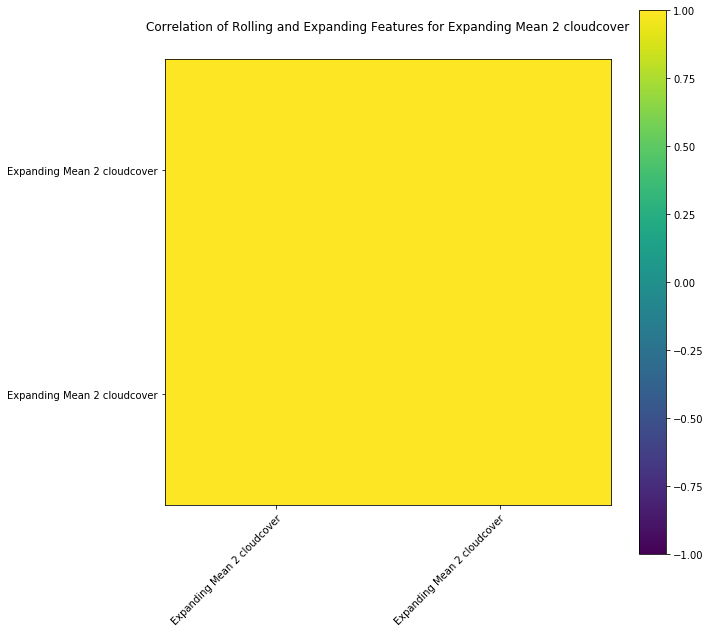

Expanding Min 3 cloudcover
Rolling W Done
Expanding Done


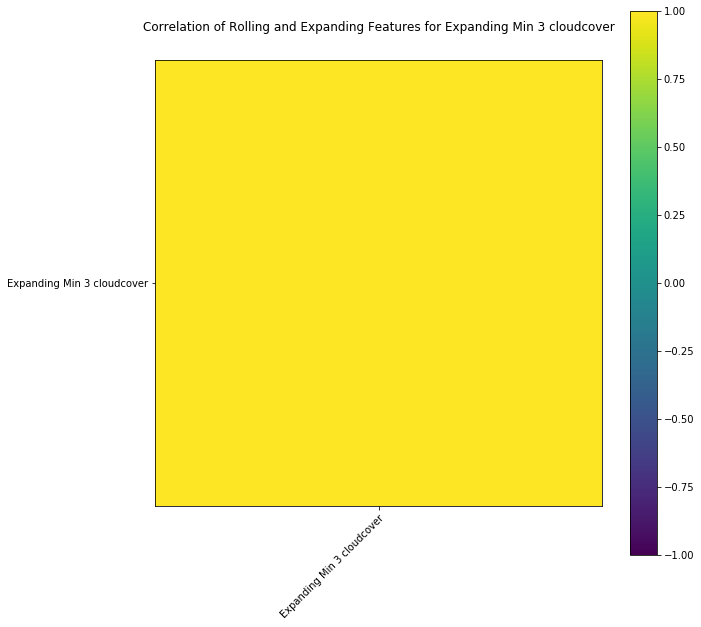

Expanding Max 3 cloudcover
Rolling W Done
Expanding Done


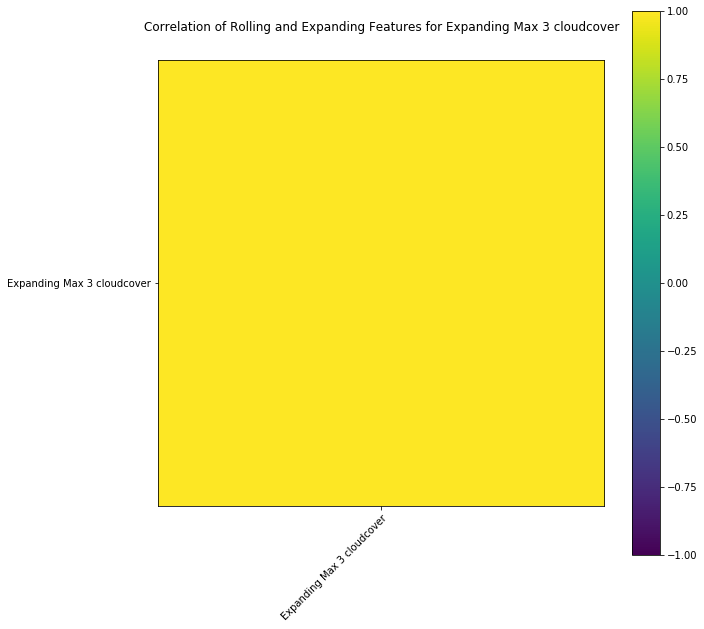

Expanding Sum 3 cloudcover
Rolling W Done
Expanding Done


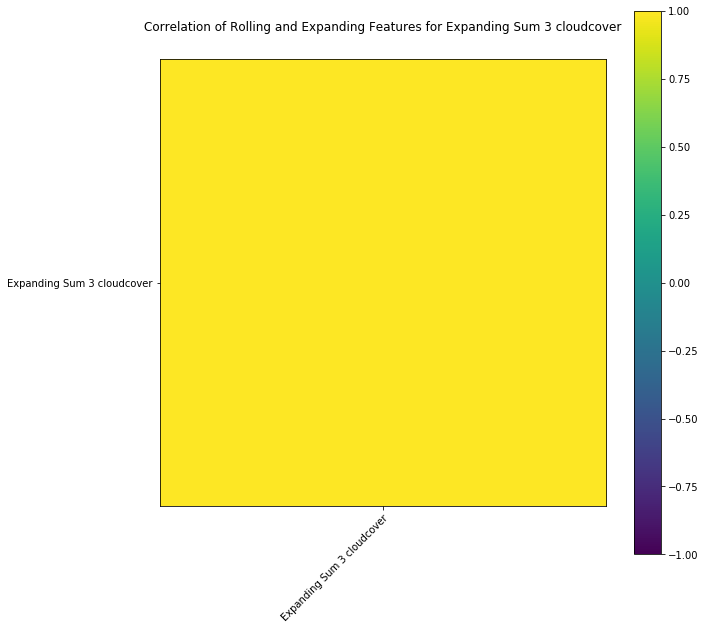

Expanding Mean 3 cloudcover
Rolling W Done
Expanding Done


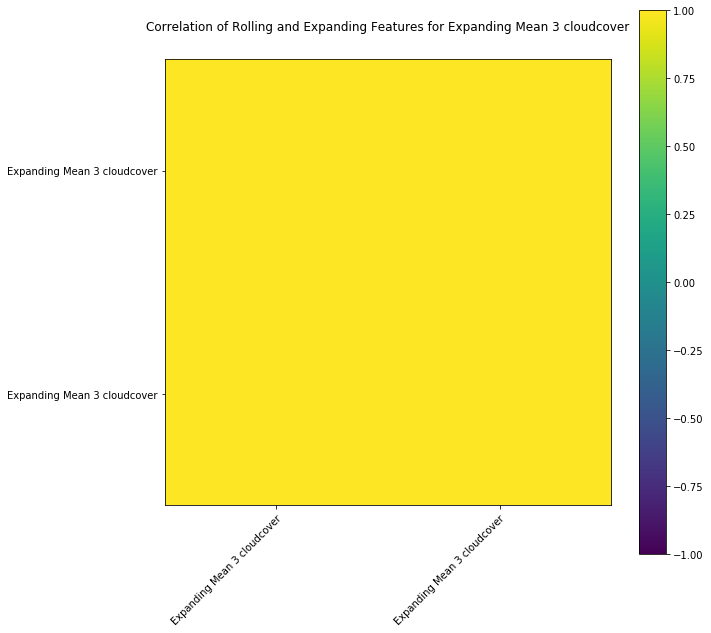

Expanding Min 4 cloudcover
Rolling W Done
Expanding Done


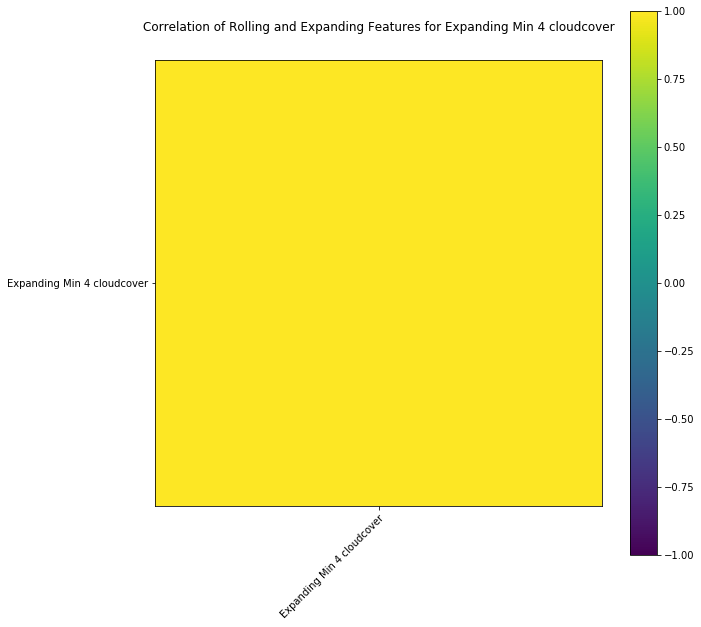

Expanding Max 4 cloudcover
Rolling W Done
Expanding Done


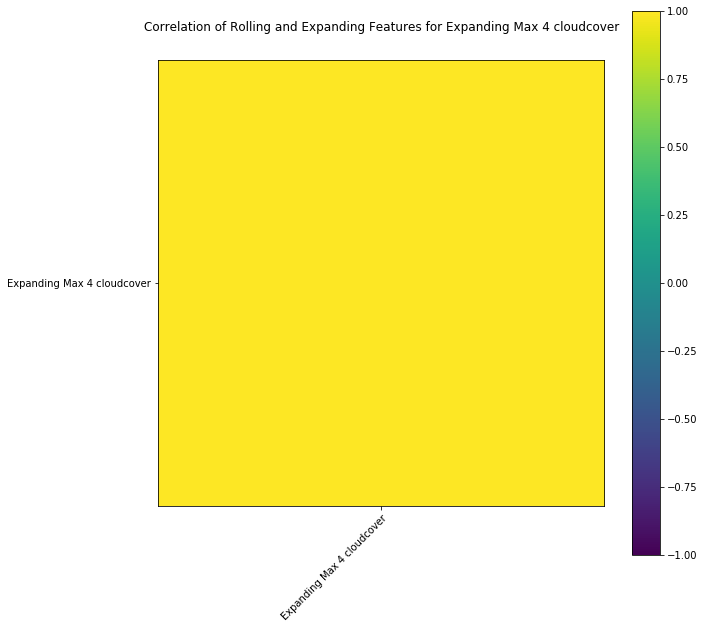

Expanding Sum 4 cloudcover
Rolling W Done
Expanding Done


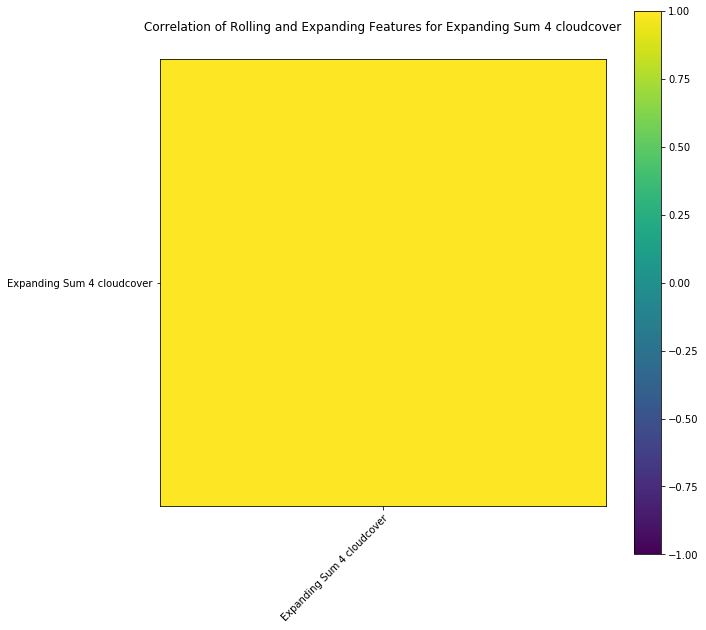

Expanding Mean 4 cloudcover
Rolling W Done
Expanding Done


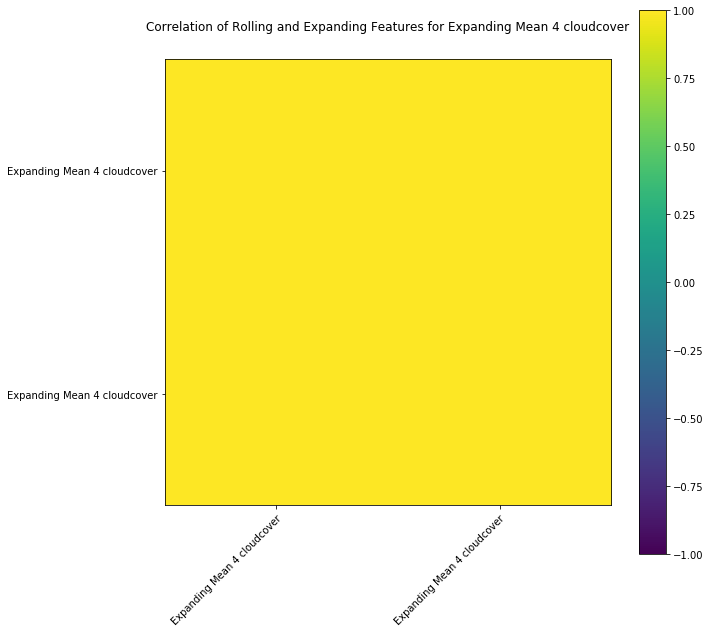

Expanding Min 8 cloudcover
Rolling W Done
Expanding Done


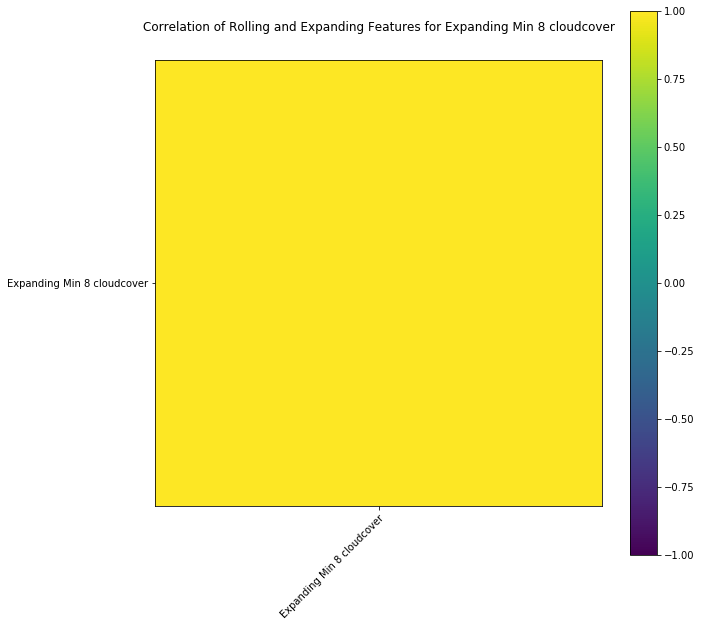

Expanding Max 8 cloudcover
Rolling W Done
Expanding Done


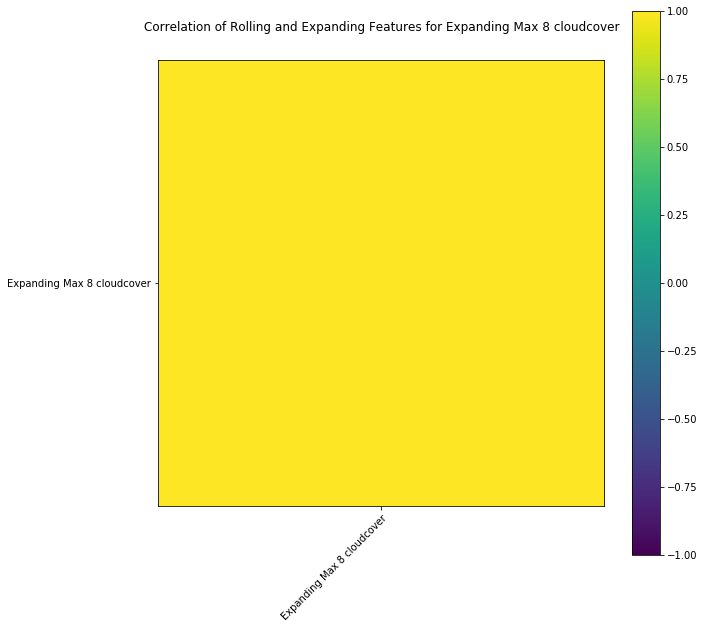

Expanding Sum 8 cloudcover
Rolling W Done
Expanding Done


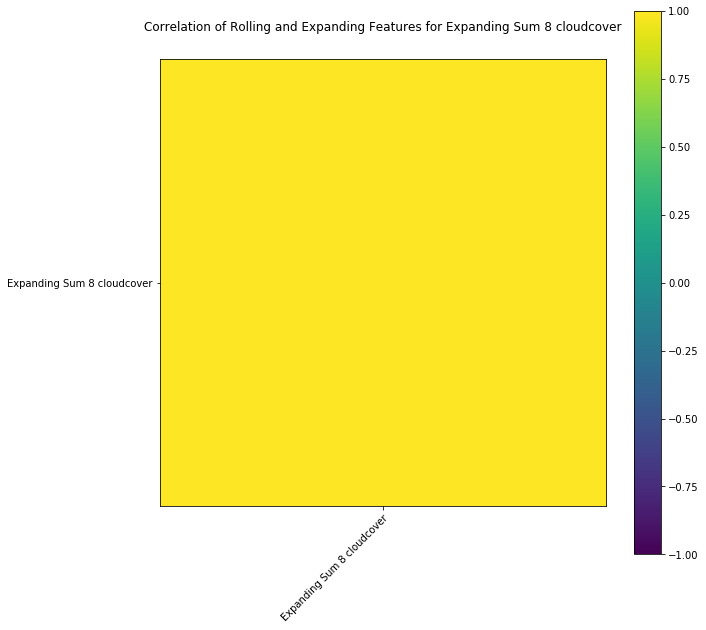

Expanding Mean 8 cloudcover
Rolling W Done
Expanding Done


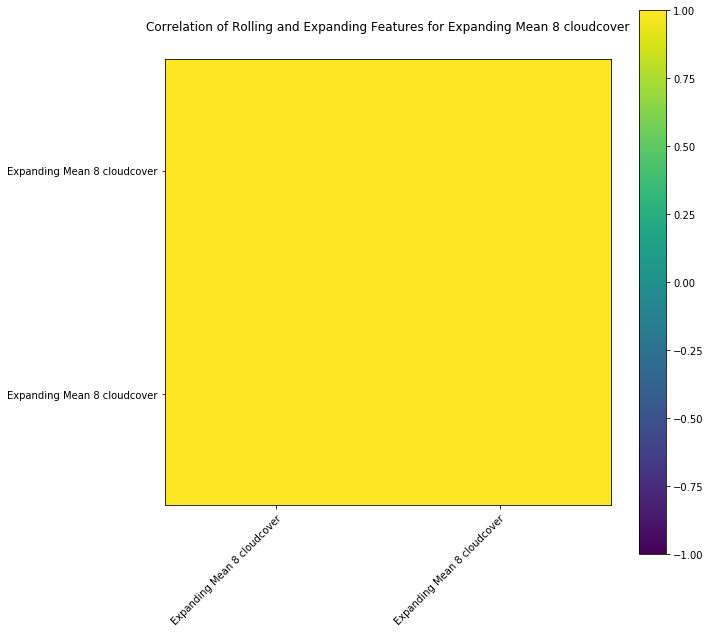

Expanding Min 12 cloudcover
Rolling W Done
Expanding Done


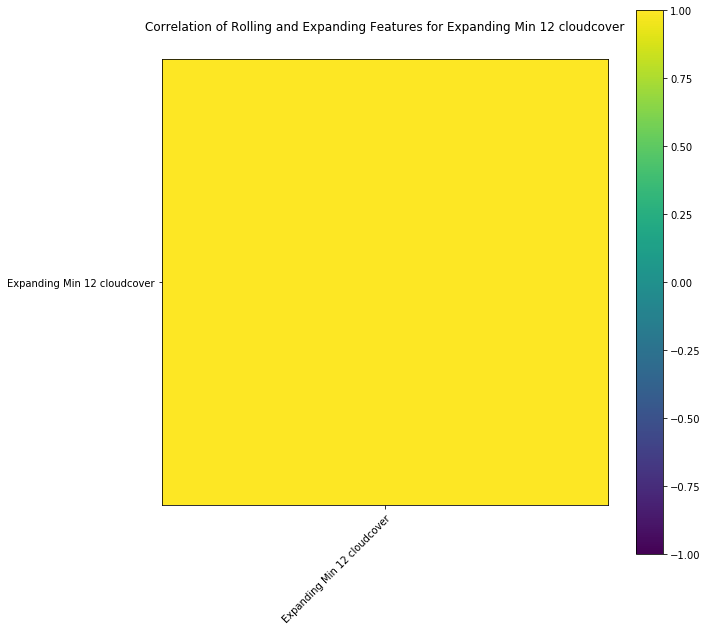

Expanding Max 12 cloudcover
Rolling W Done
Expanding Done


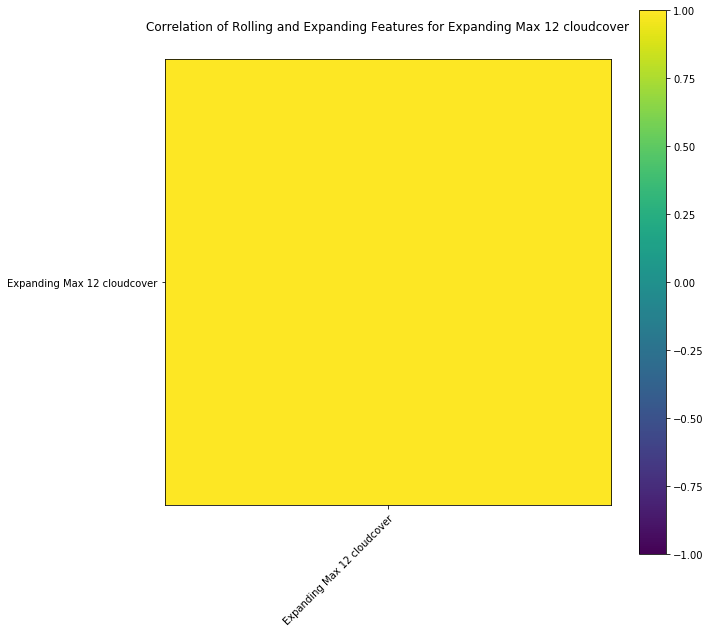

Expanding Sum 12 cloudcover
Rolling W Done
Expanding Done


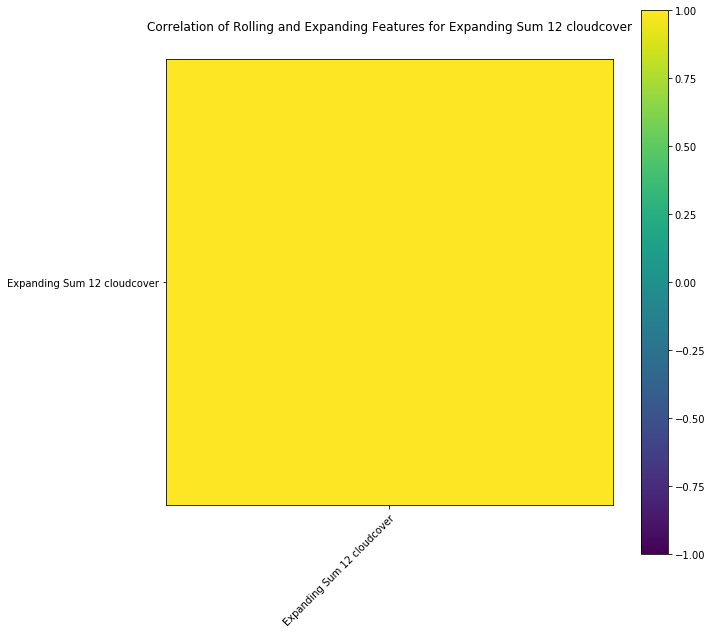

Expanding Mean 12 cloudcover
Rolling W Done
Expanding Done


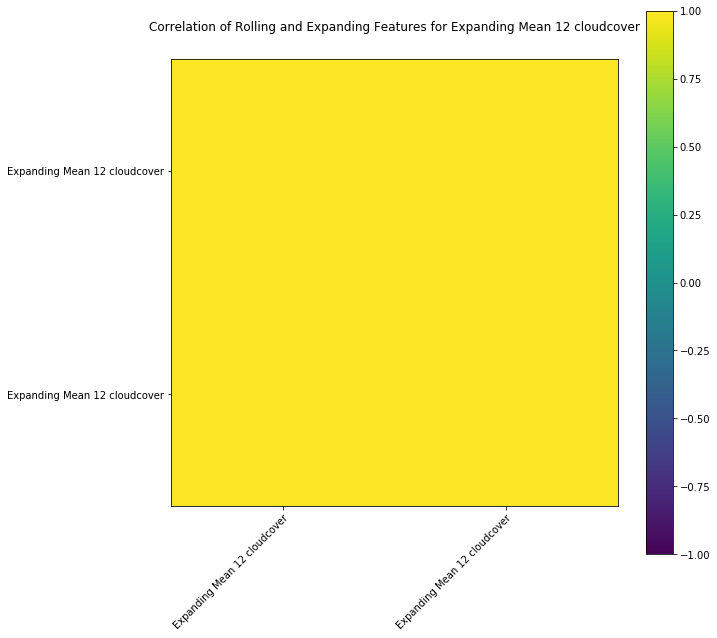

Expanding Min 16 cloudcover
Rolling W Done
Expanding Done


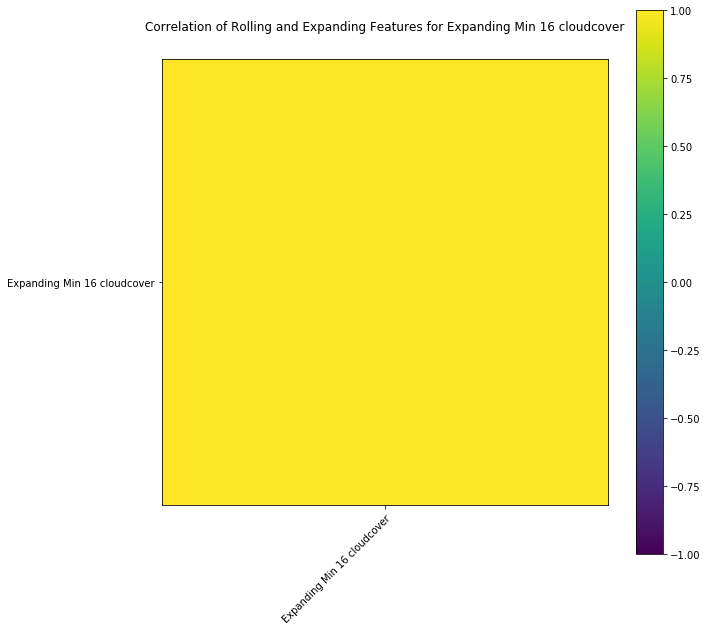

Expanding Max 16 cloudcover
Rolling W Done
Expanding Done


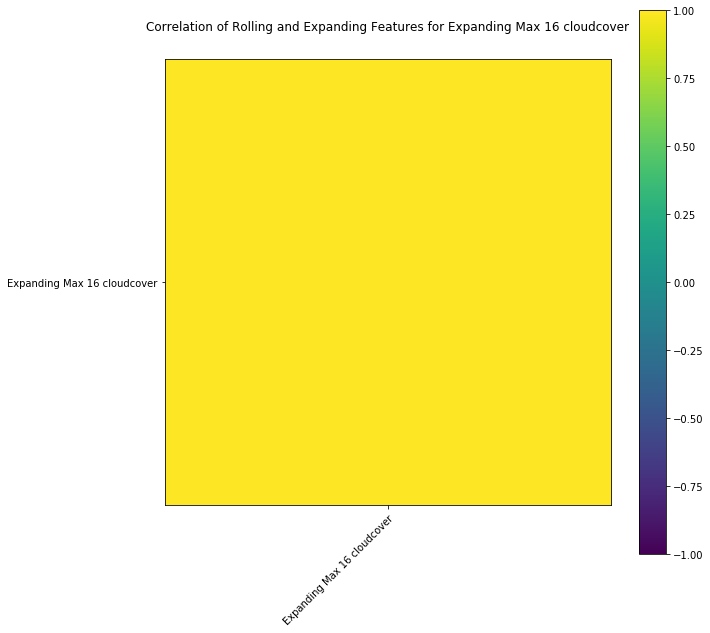

Expanding Sum 16 cloudcover
Rolling W Done
Expanding Done


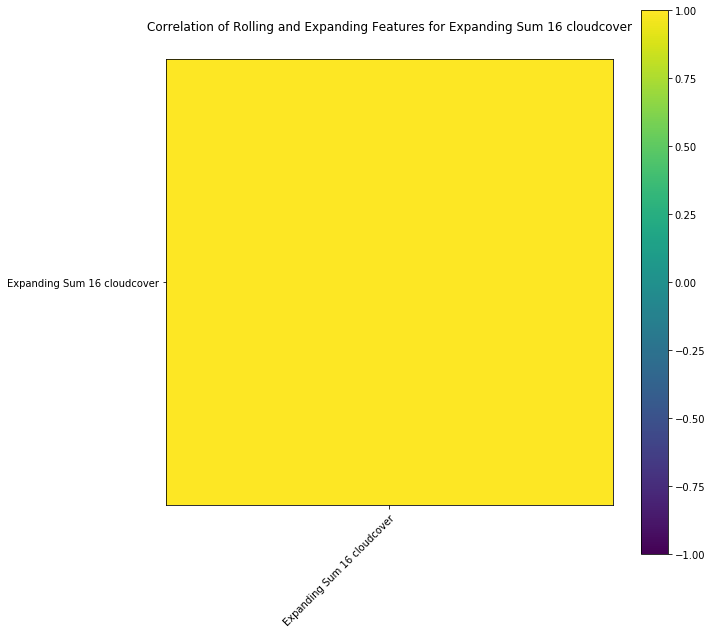

Expanding Mean 16 cloudcover
Rolling W Done
Expanding Done


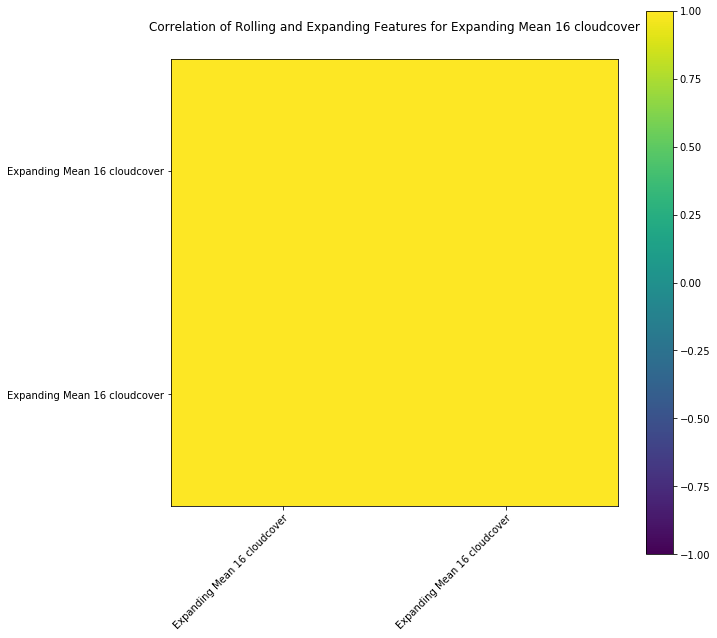

Expanding Min 24 cloudcover
Rolling W Done
Expanding Done


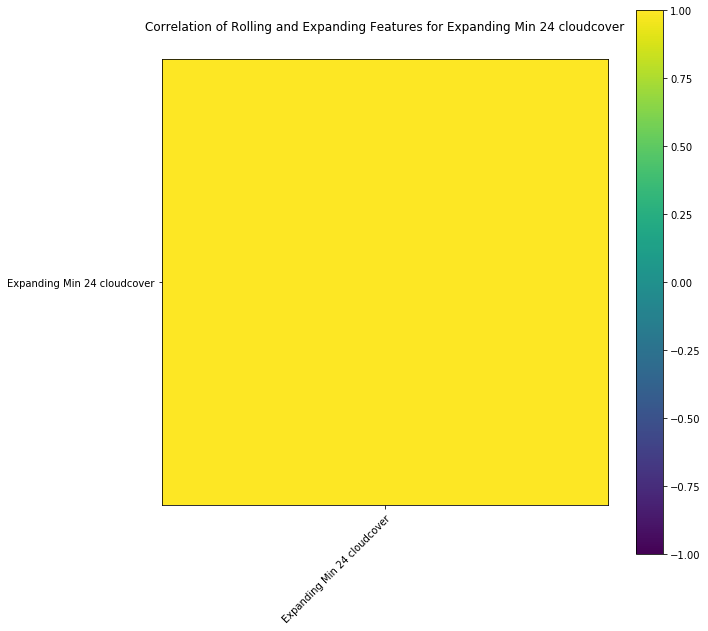

Expanding Max 24 cloudcover
Rolling W Done
Expanding Done


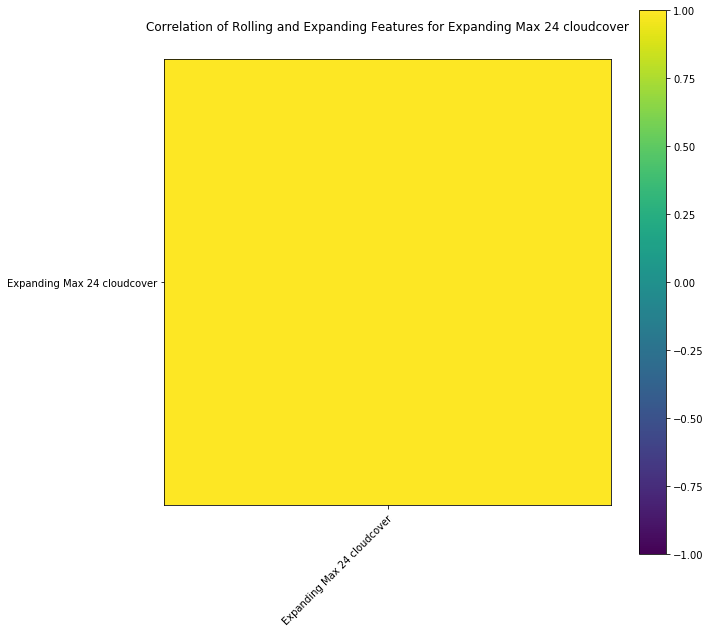

Expanding Sum 24 cloudcover
Rolling W Done
Expanding Done


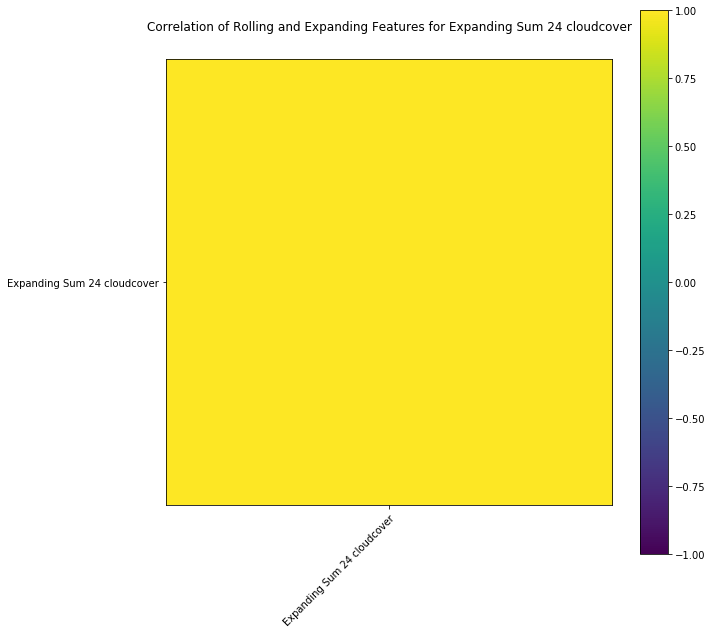

Expanding Mean 24 cloudcover
Rolling W Done
Expanding Done


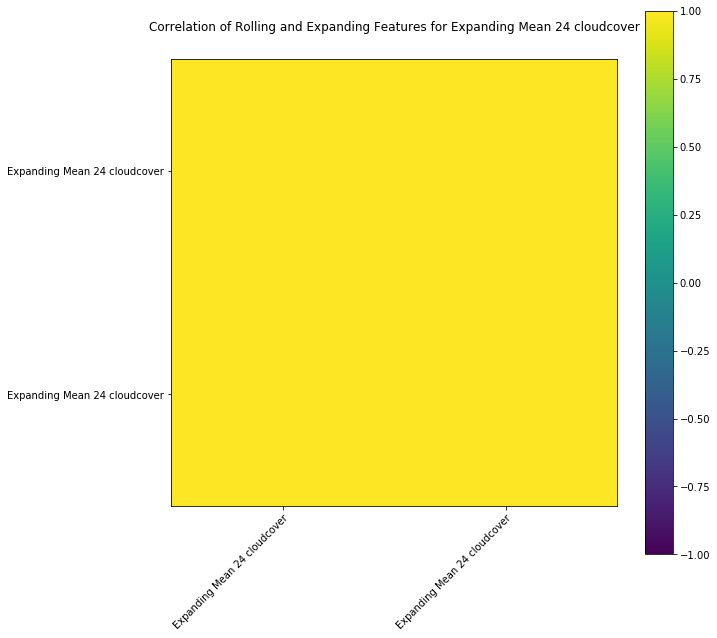

Expanding Min 48 cloudcover
Rolling W Done
Expanding Done


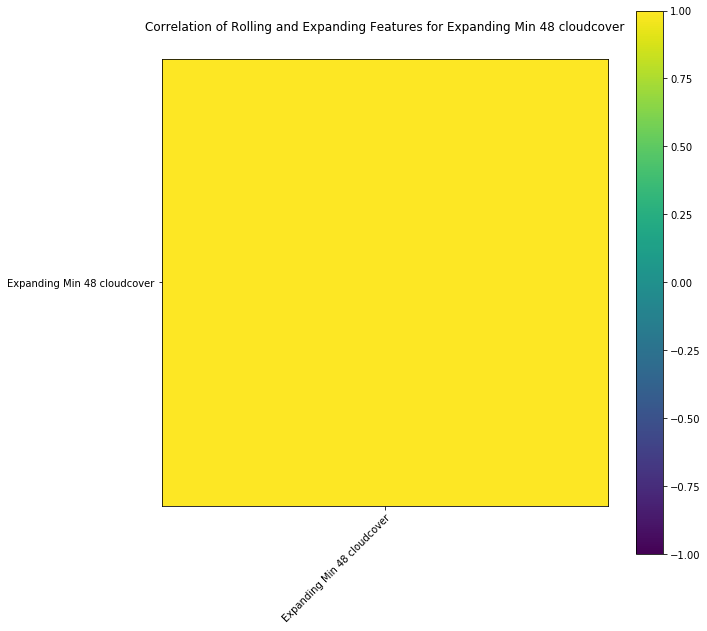

Expanding Max 48 cloudcover
Rolling W Done
Expanding Done


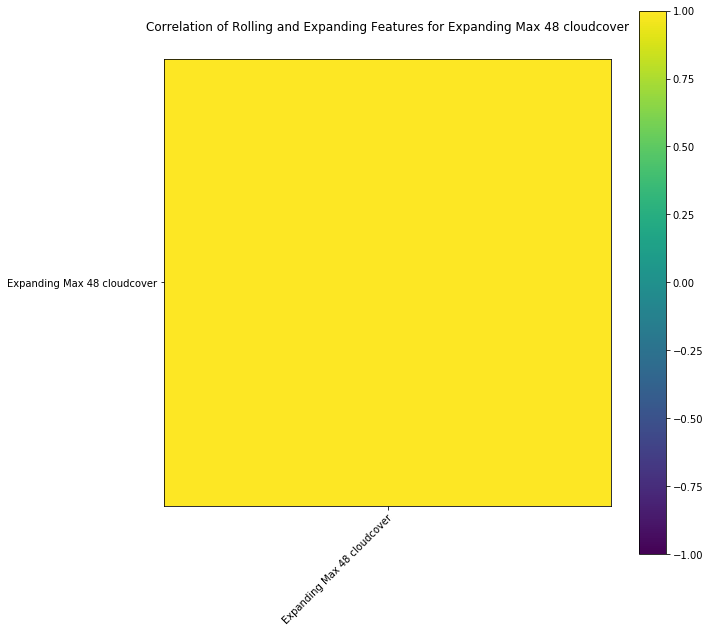

Expanding Sum 48 cloudcover
Rolling W Done
Expanding Done


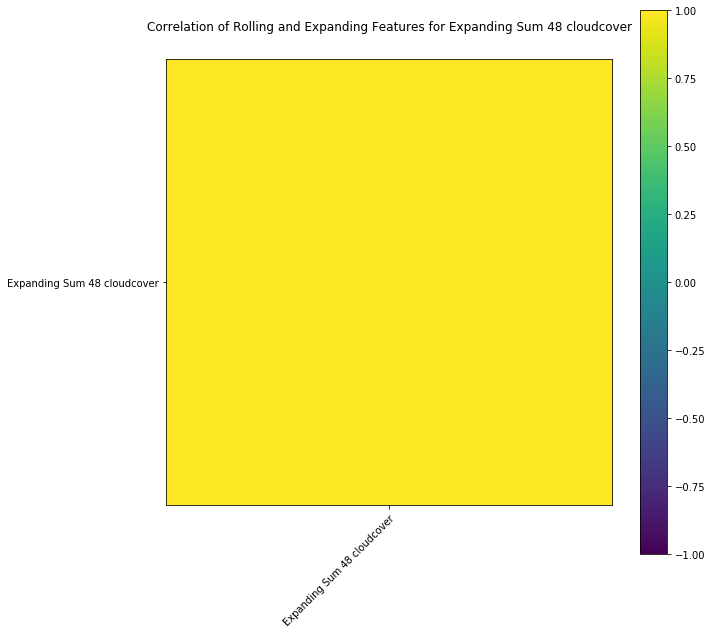

Expanding Mean 48 cloudcover
Rolling W Done
Expanding Done


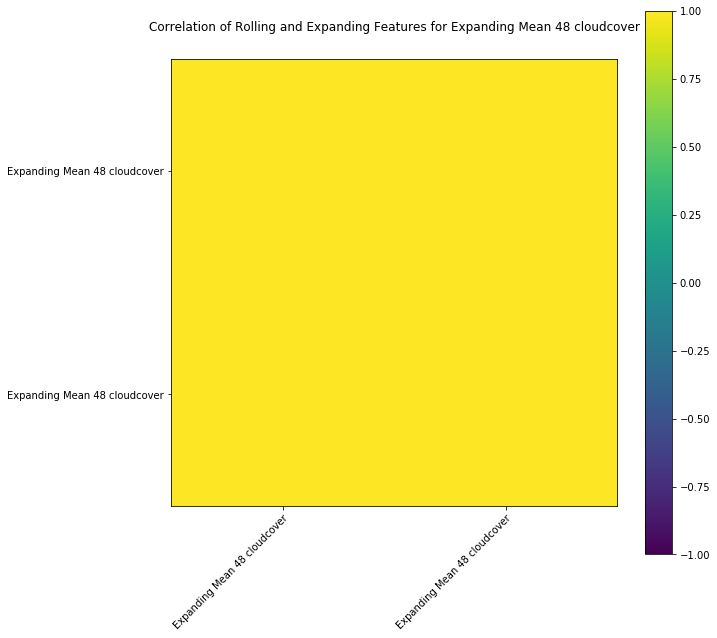

Expanding Min 96 cloudcover
Rolling W Done
Expanding Done


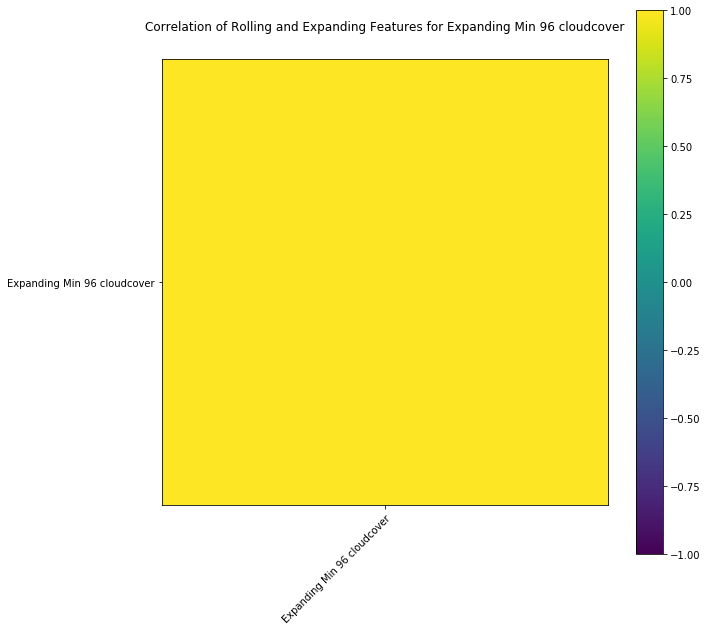

Expanding Max 96 cloudcover
Rolling W Done
Expanding Done


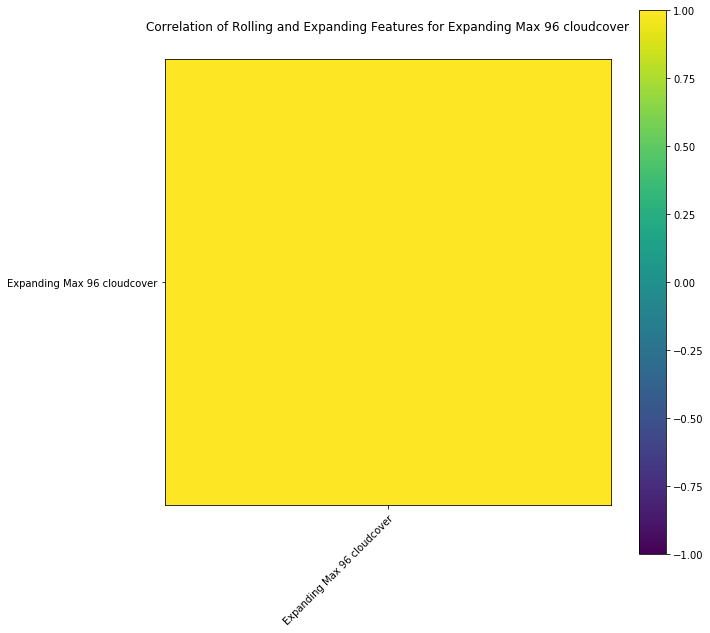

Expanding Sum 96 cloudcover
Rolling W Done
Expanding Done


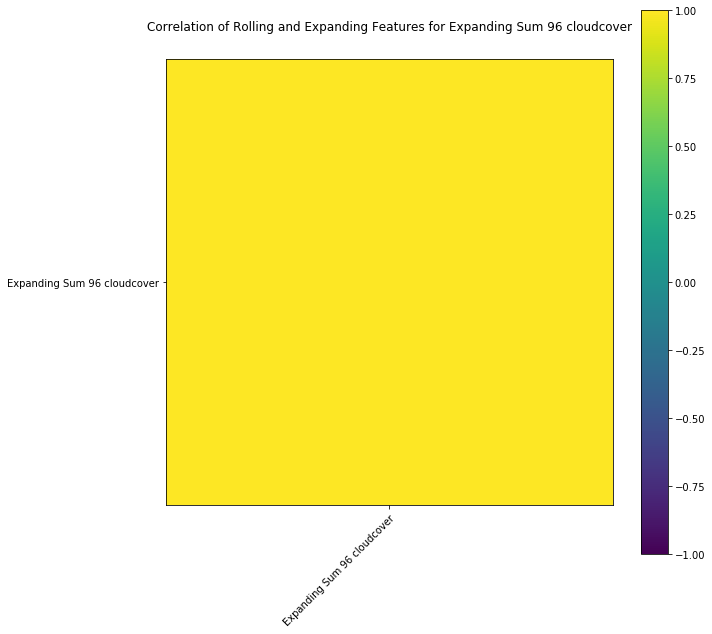

Expanding Mean 96 cloudcover
Rolling W Done
Expanding Done


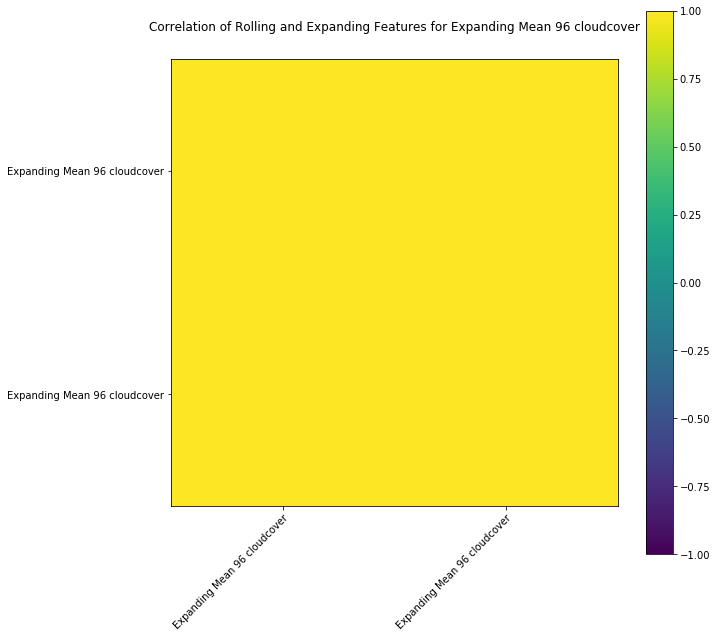

Expanding Min 2 heatIndexC
Rolling W Done
Expanding Done


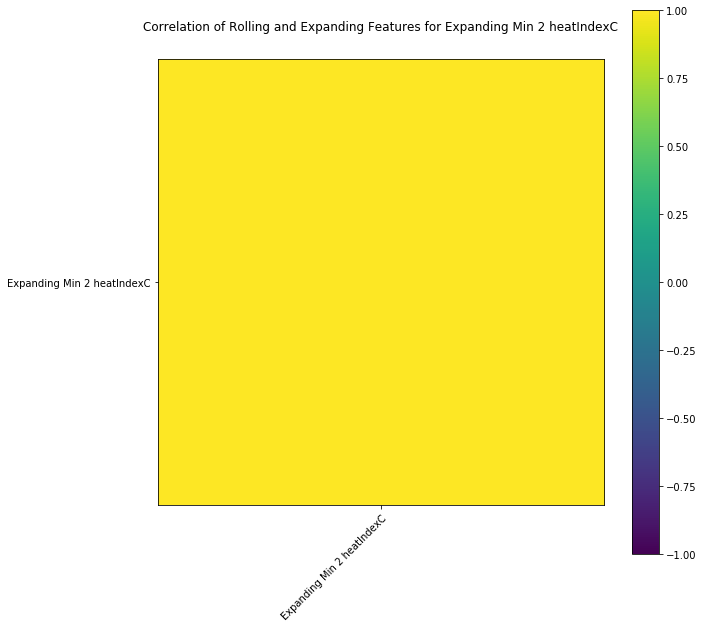

Expanding Max 2 heatIndexC
Rolling W Done
Expanding Done


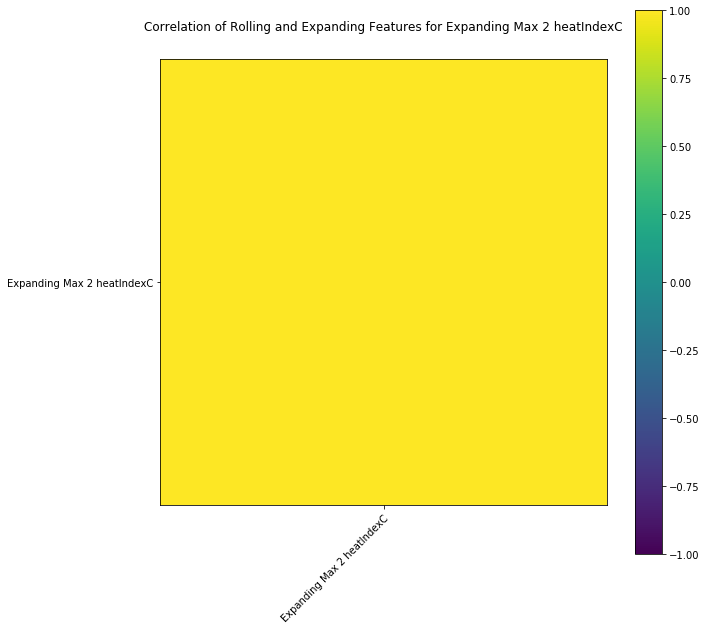

Expanding Sum 2 heatIndexC
Rolling W Done
Expanding Done


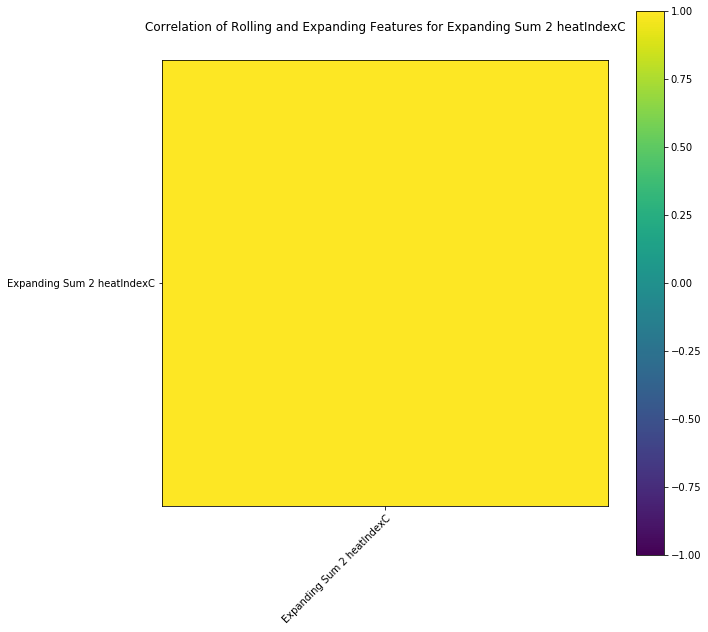

Expanding Mean 2 heatIndexC
Rolling W Done
Expanding Done


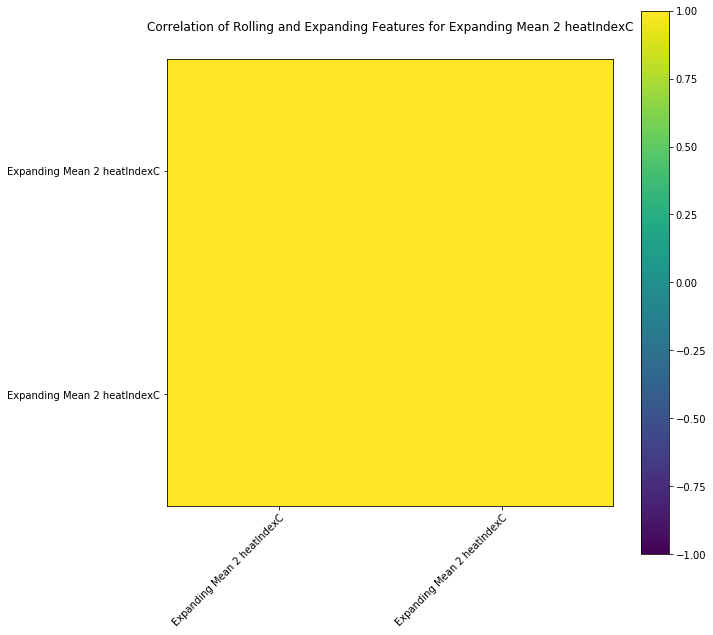

Expanding Min 3 heatIndexC
Rolling W Done
Expanding Done


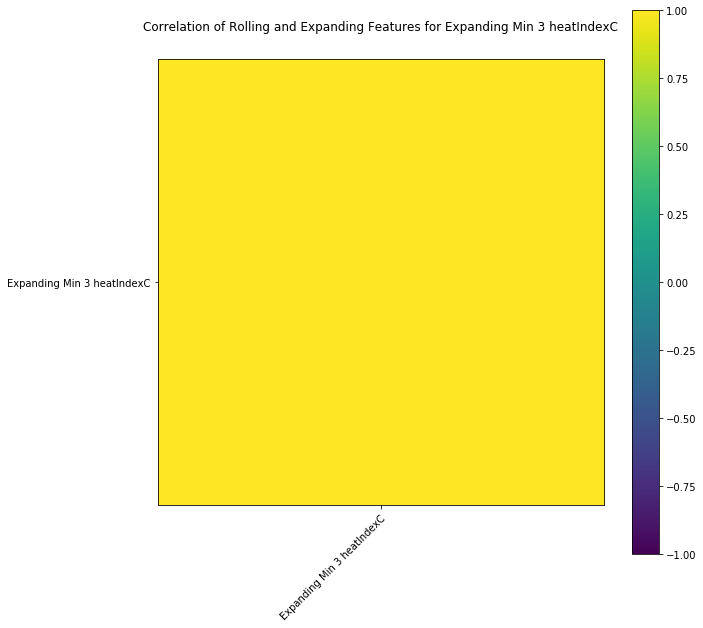

Expanding Max 3 heatIndexC
Rolling W Done
Expanding Done


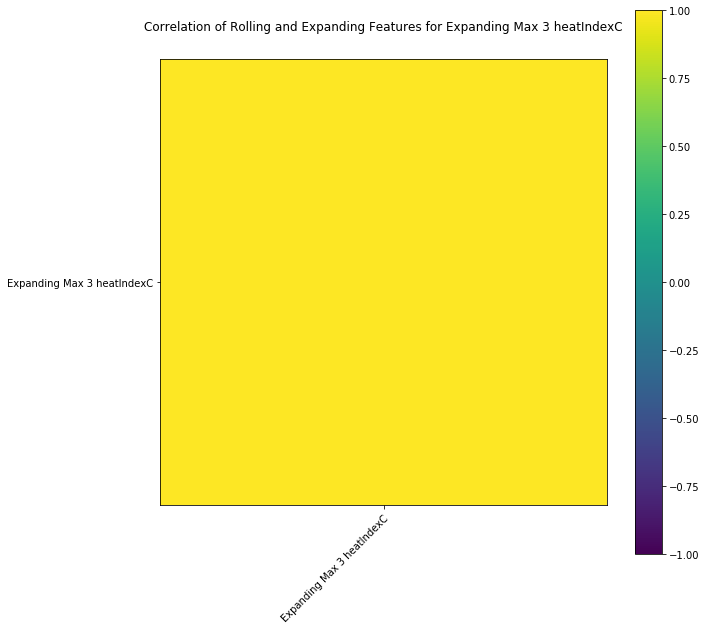

Expanding Sum 3 heatIndexC
Rolling W Done
Expanding Done


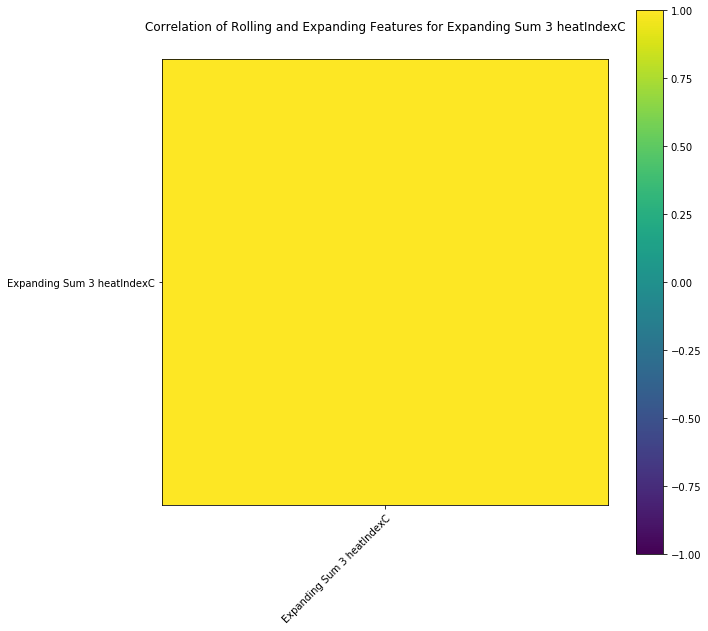

Expanding Mean 3 heatIndexC
Rolling W Done
Expanding Done


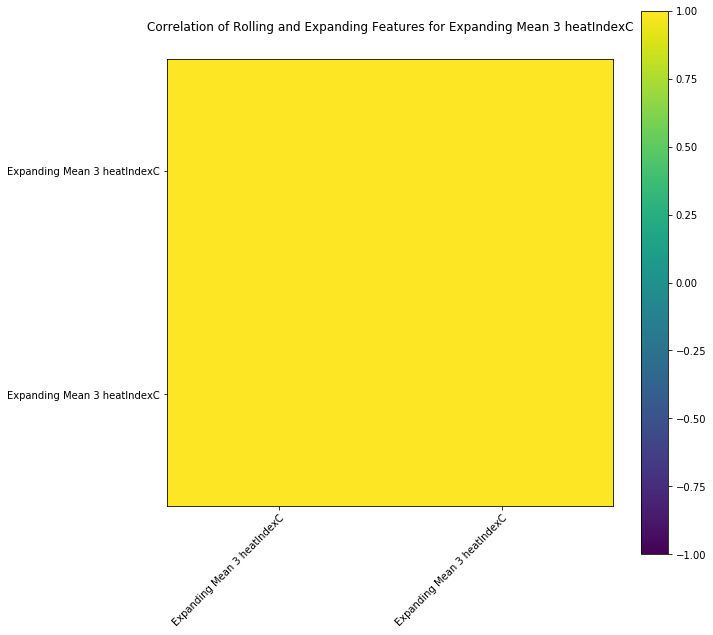

Expanding Min 4 heatIndexC
Rolling W Done
Expanding Done


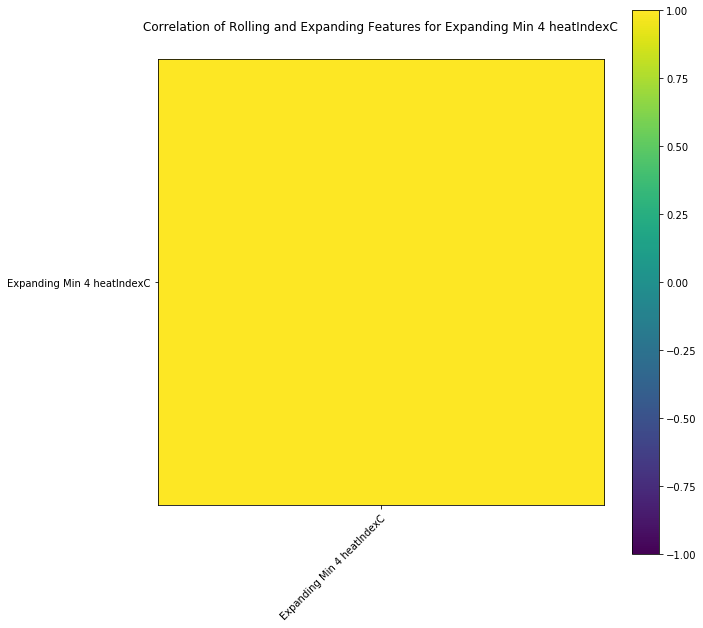

Expanding Max 4 heatIndexC
Rolling W Done
Expanding Done


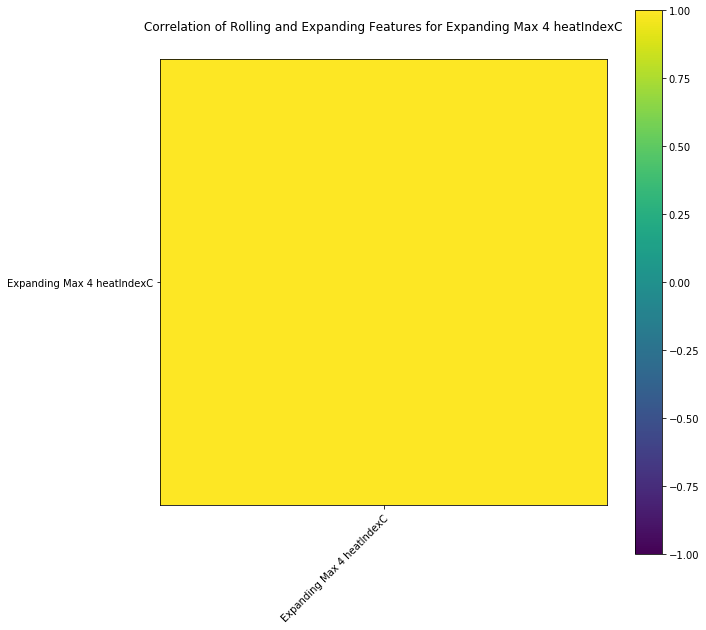

Expanding Sum 4 heatIndexC
Rolling W Done
Expanding Done


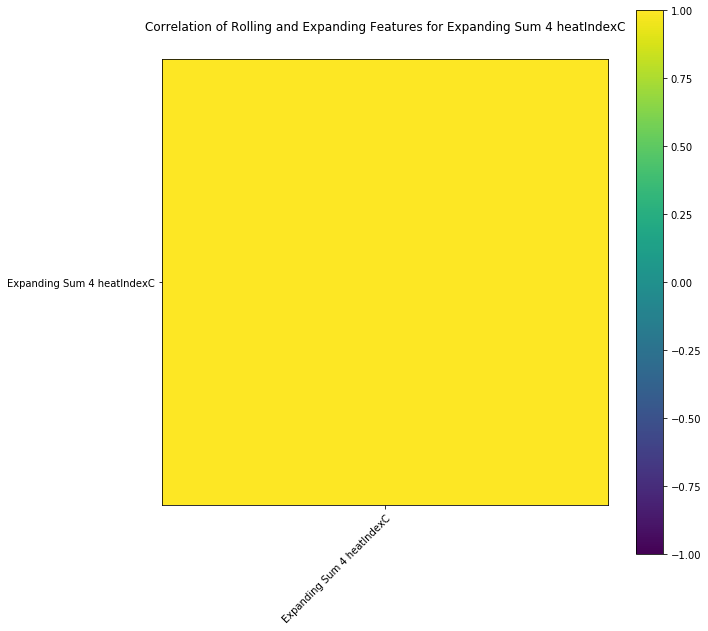

Expanding Mean 4 heatIndexC
Rolling W Done
Expanding Done


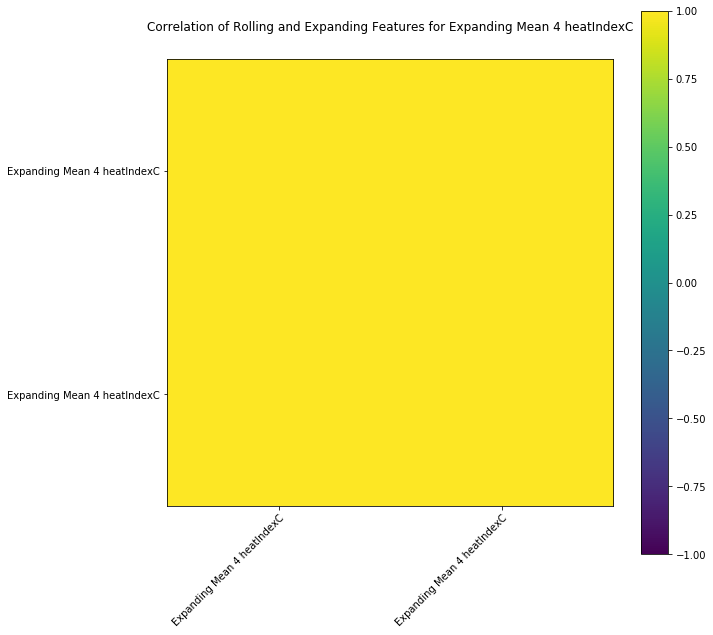

Expanding Min 8 heatIndexC
Rolling W Done
Expanding Done


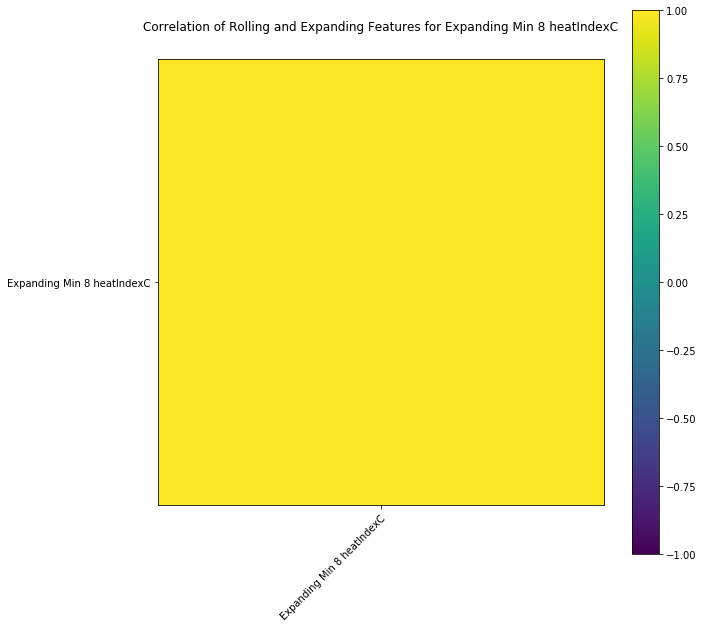

Expanding Max 8 heatIndexC
Rolling W Done
Expanding Done


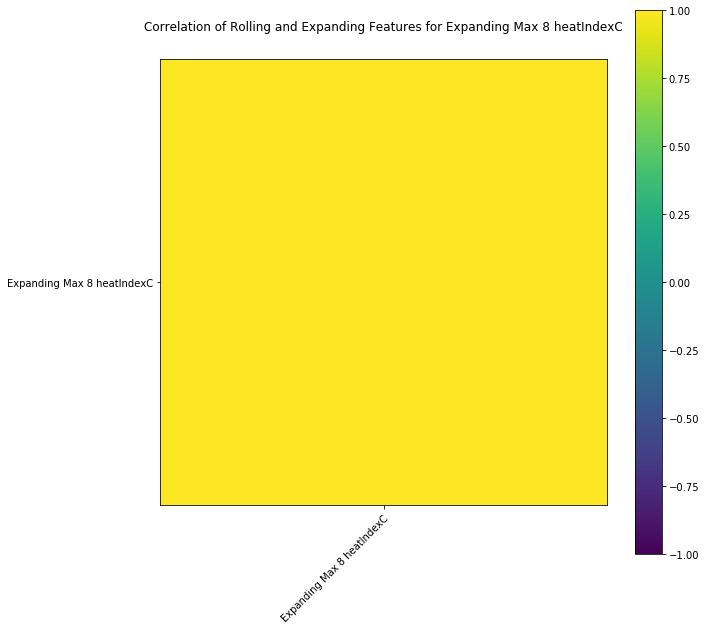

Expanding Sum 8 heatIndexC
Rolling W Done
Expanding Done


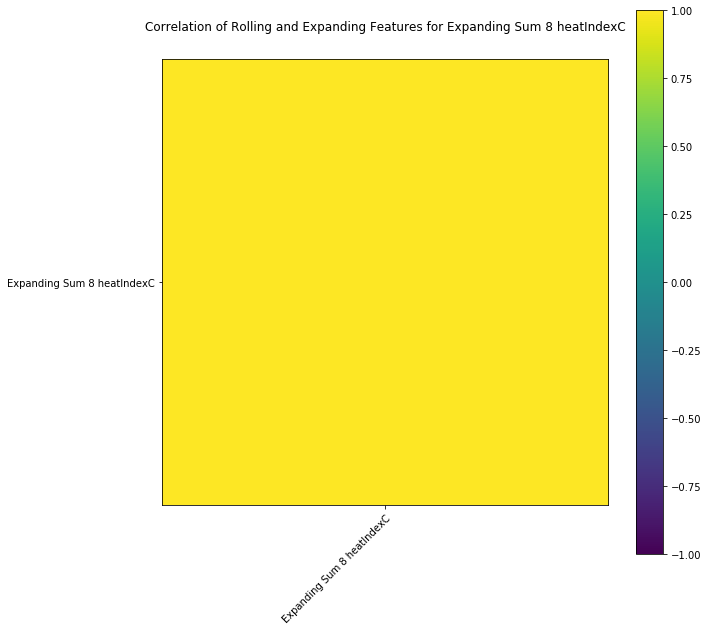

Expanding Mean 8 heatIndexC
Rolling W Done
Expanding Done


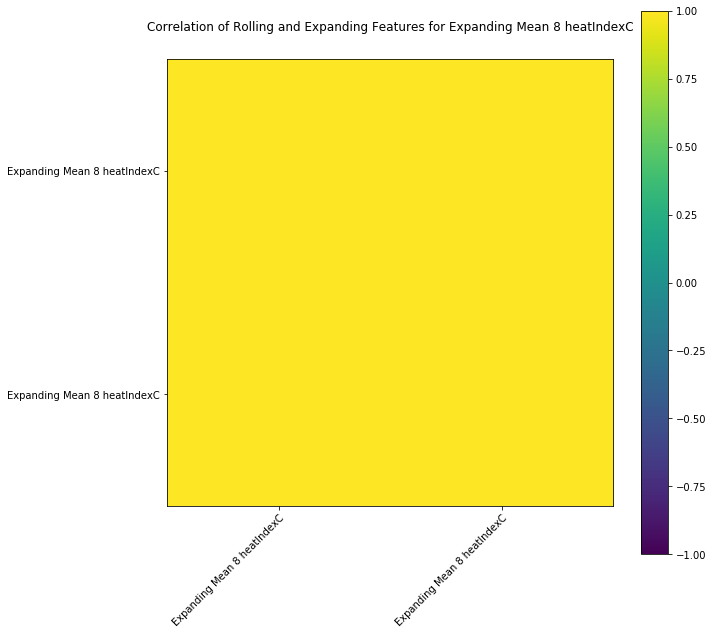

Expanding Min 12 heatIndexC
Rolling W Done
Expanding Done


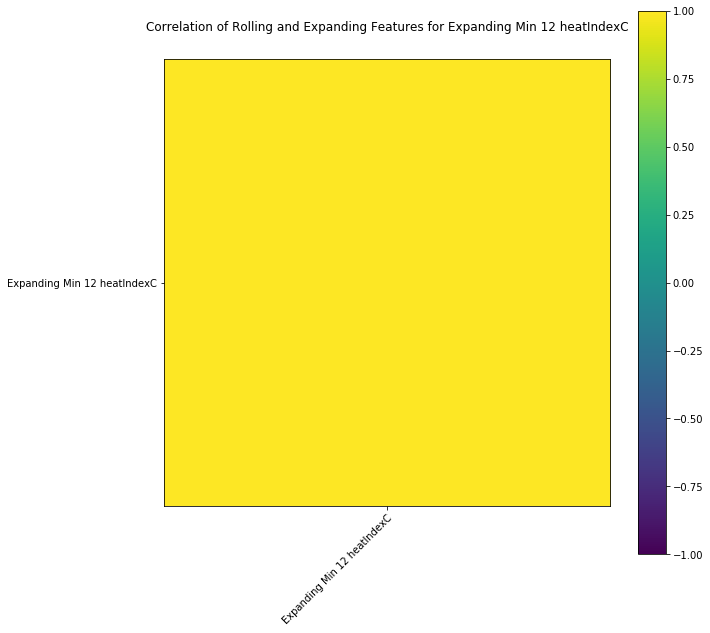

Expanding Max 12 heatIndexC
Rolling W Done
Expanding Done


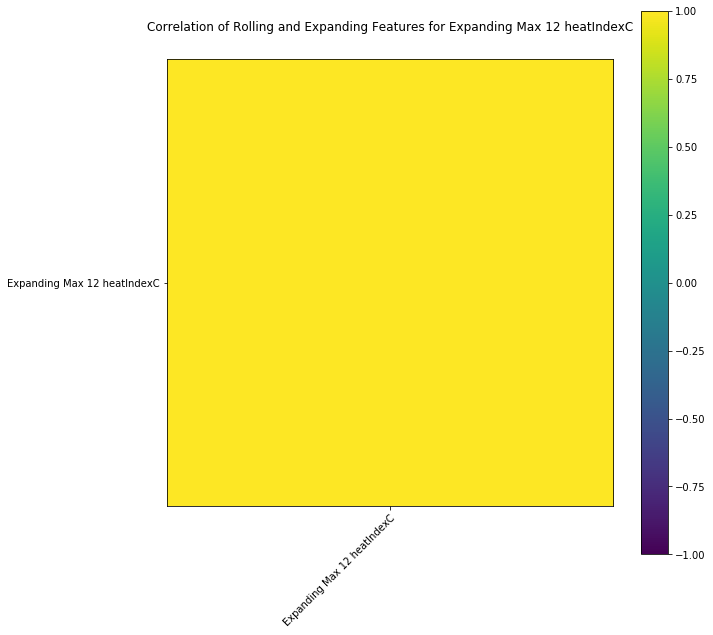

Expanding Sum 12 heatIndexC
Rolling W Done
Expanding Done


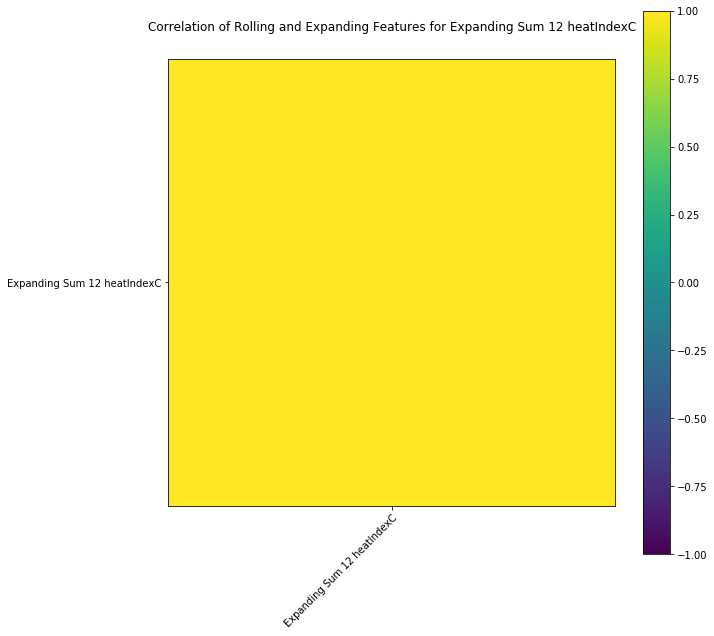

Expanding Mean 12 heatIndexC
Rolling W Done
Expanding Done


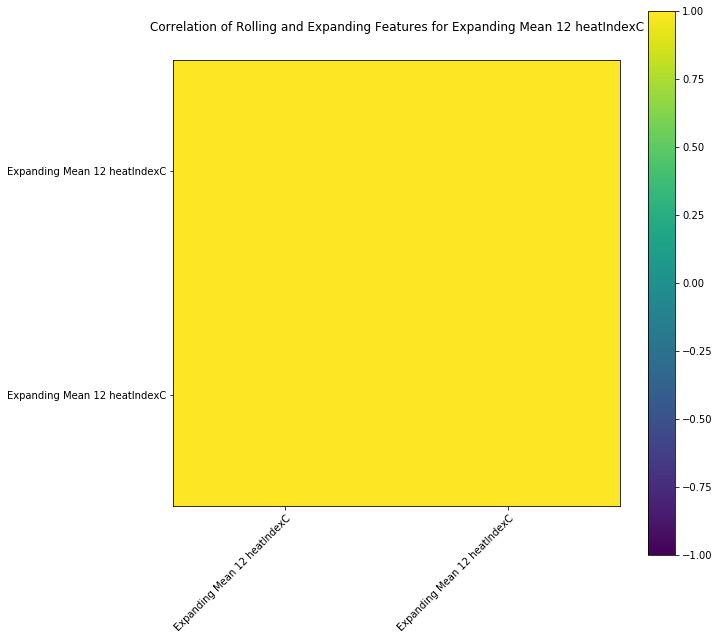

Expanding Min 16 heatIndexC
Rolling W Done
Expanding Done


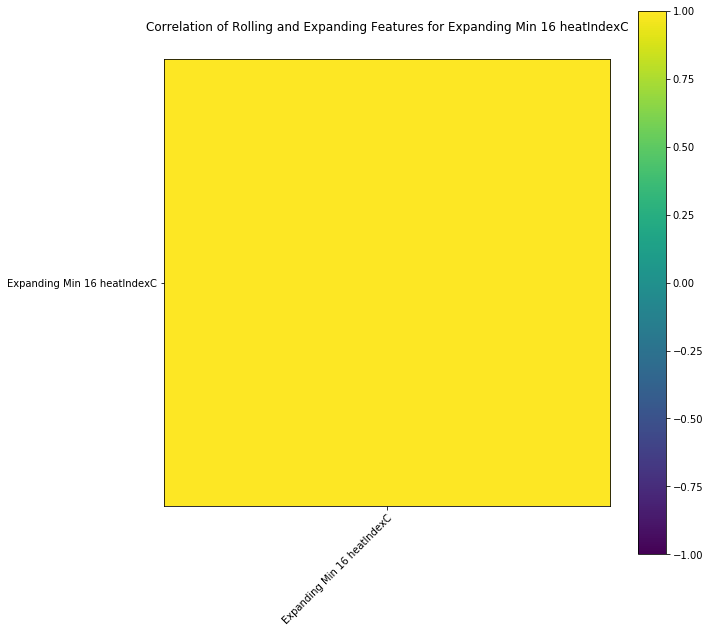

Expanding Max 16 heatIndexC
Rolling W Done
Expanding Done


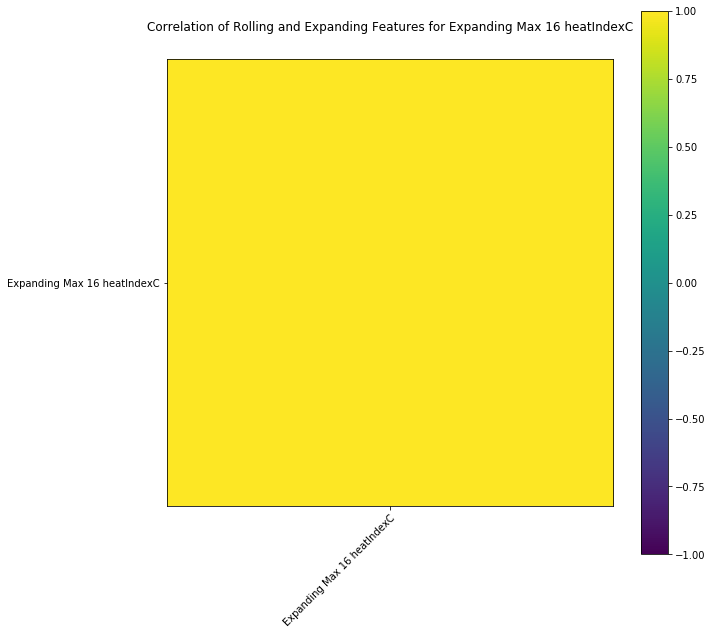

Expanding Sum 16 heatIndexC
Rolling W Done
Expanding Done


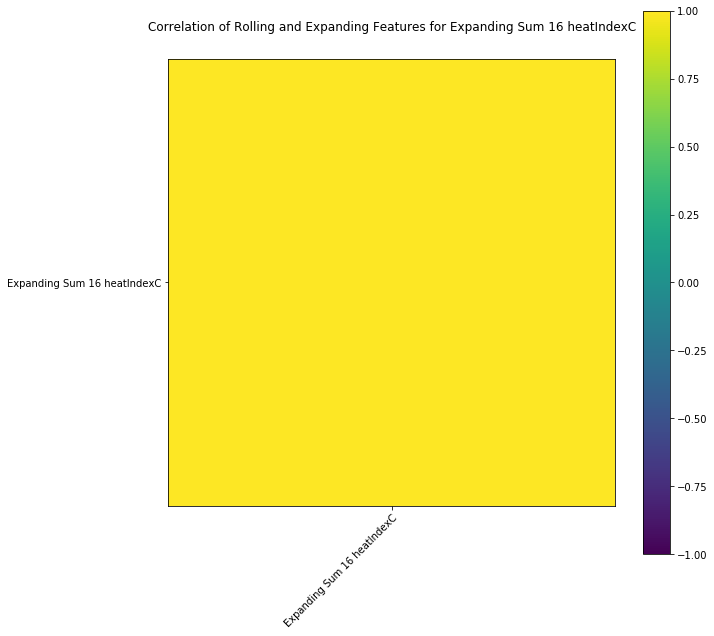

Expanding Mean 16 heatIndexC
Rolling W Done
Expanding Done


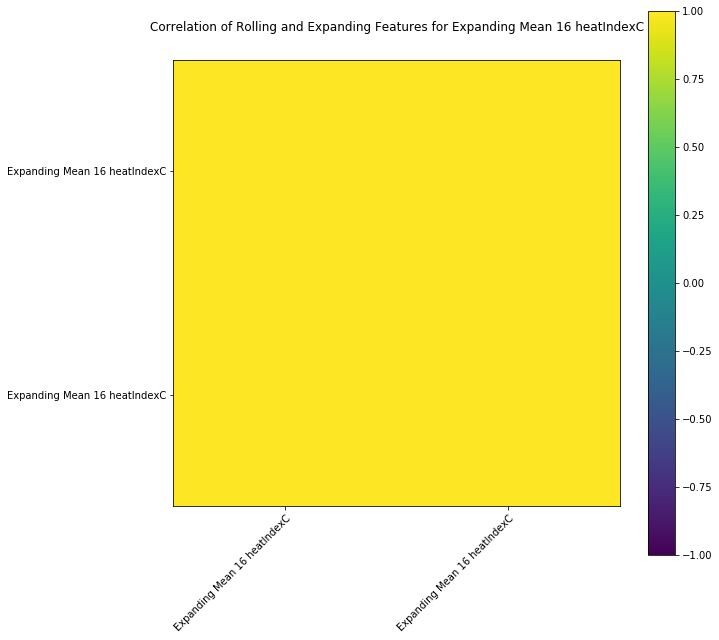

Expanding Min 24 heatIndexC
Rolling W Done
Expanding Done


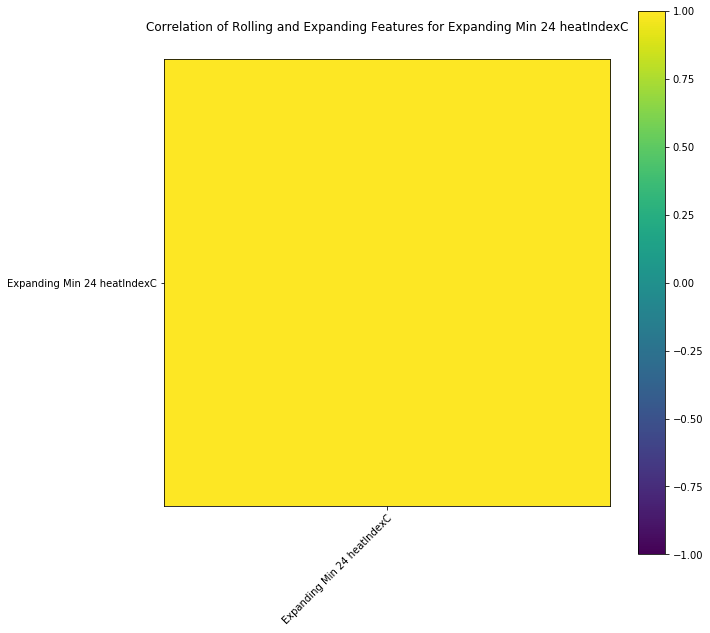

Expanding Max 24 heatIndexC
Rolling W Done
Expanding Done


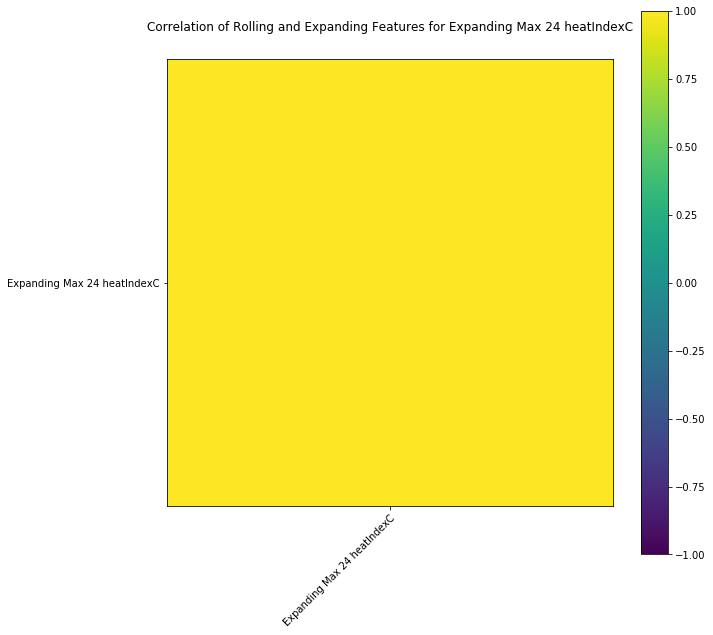

Expanding Sum 24 heatIndexC
Rolling W Done
Expanding Done


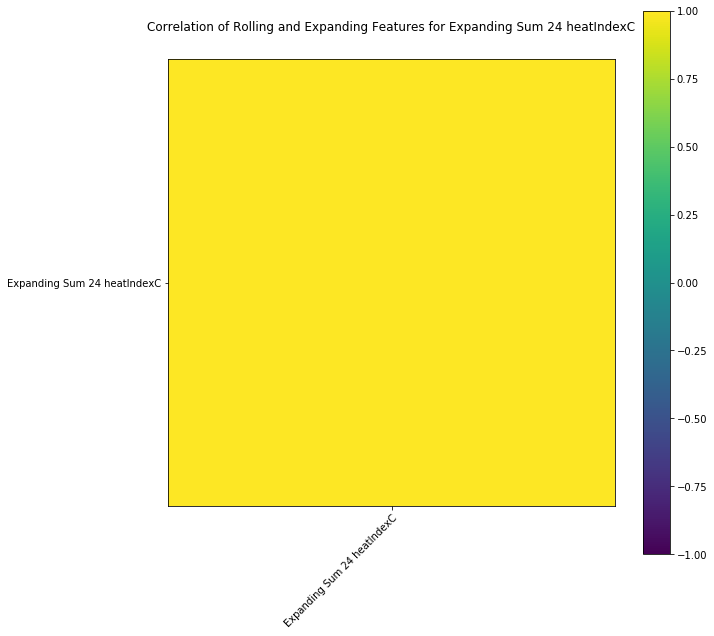

Expanding Mean 24 heatIndexC
Rolling W Done
Expanding Done


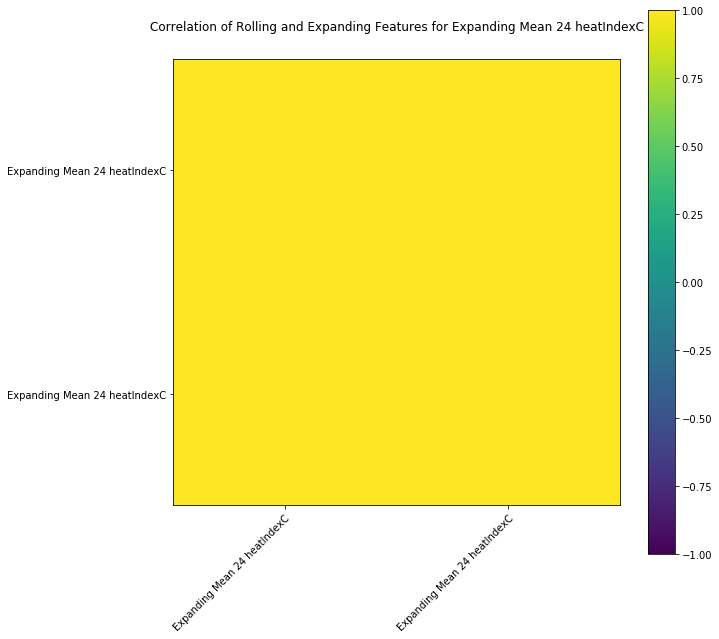

Expanding Min 48 heatIndexC
Rolling W Done
Expanding Done


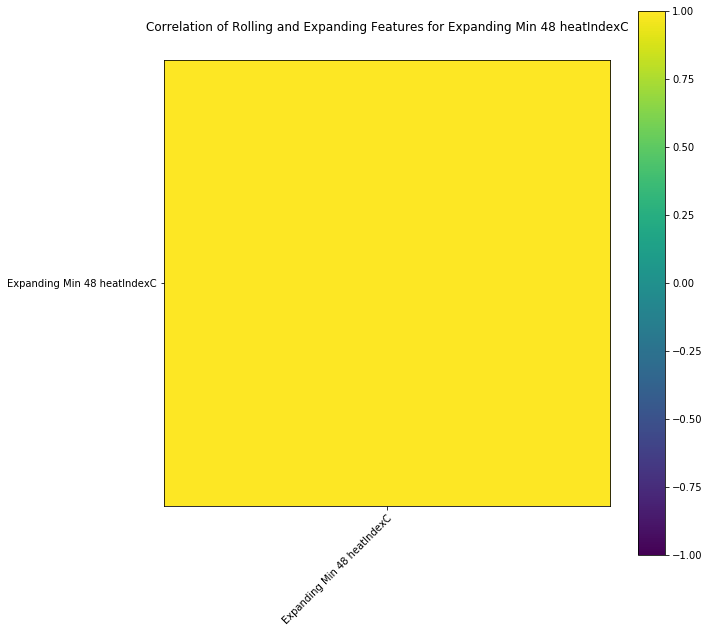

Expanding Max 48 heatIndexC
Rolling W Done
Expanding Done


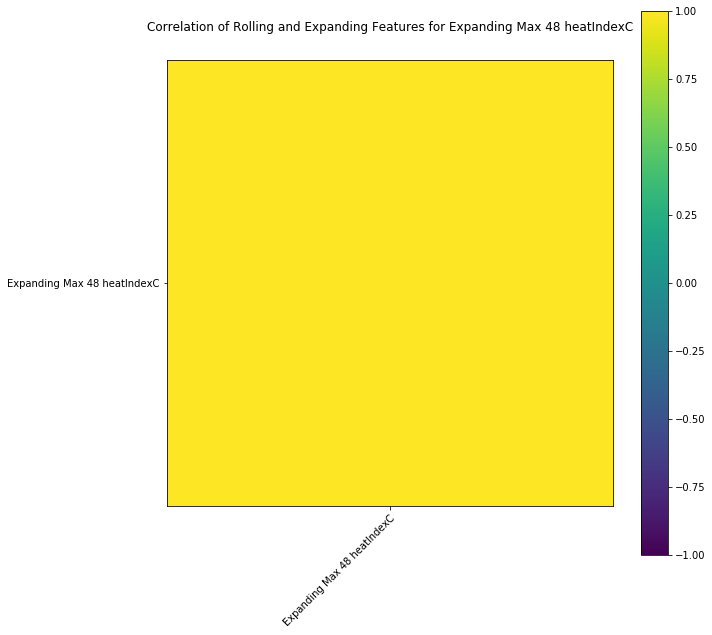

Expanding Sum 48 heatIndexC
Rolling W Done
Expanding Done


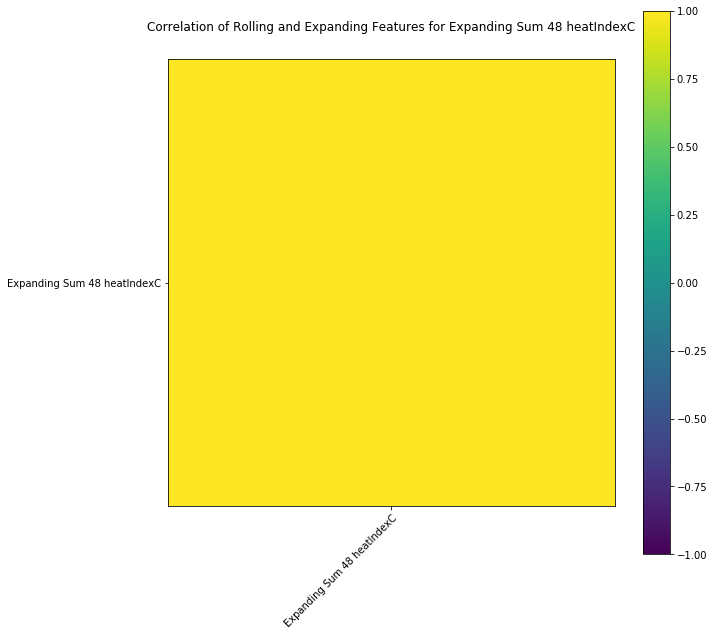

Expanding Mean 48 heatIndexC
Rolling W Done
Expanding Done


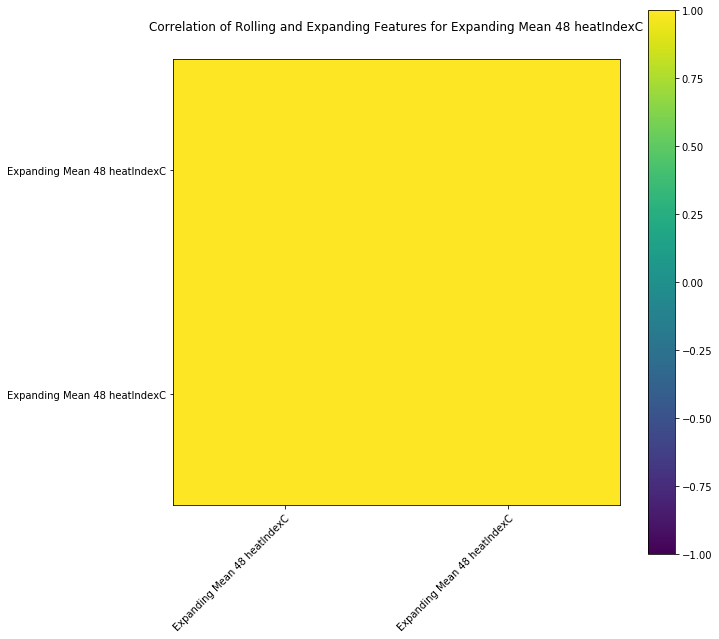

Expanding Min 96 heatIndexC
Rolling W Done
Expanding Done


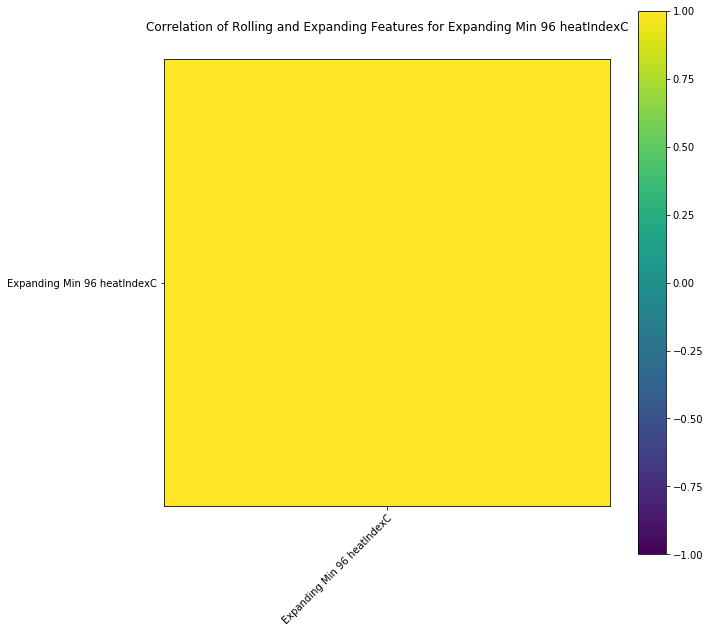

Expanding Max 96 heatIndexC
Rolling W Done
Expanding Done


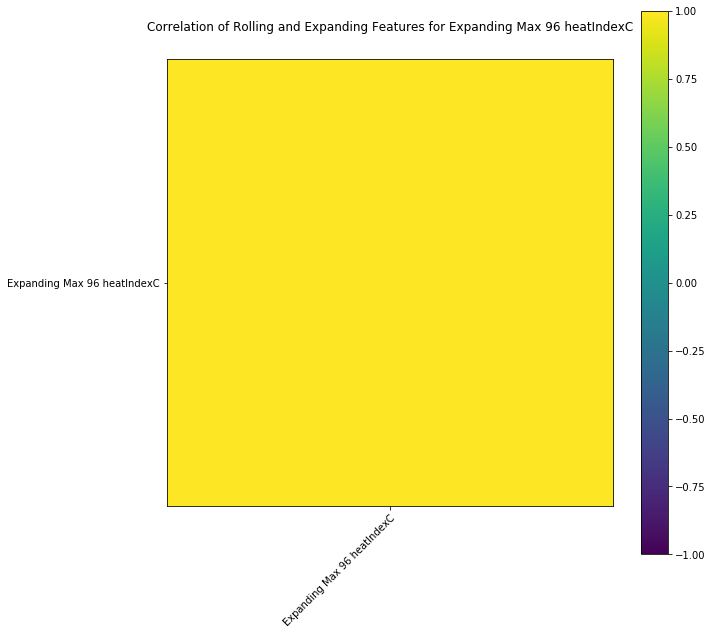

Expanding Sum 96 heatIndexC
Rolling W Done
Expanding Done


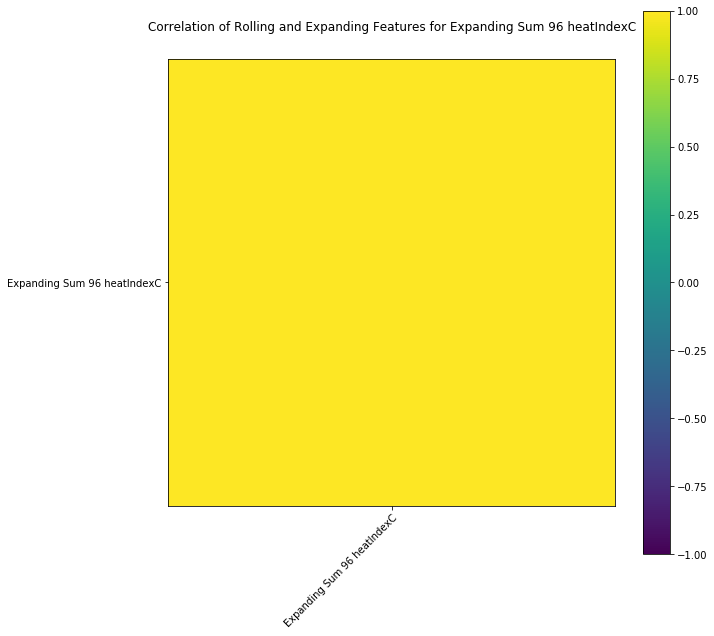

Expanding Mean 96 heatIndexC
Rolling W Done
Expanding Done


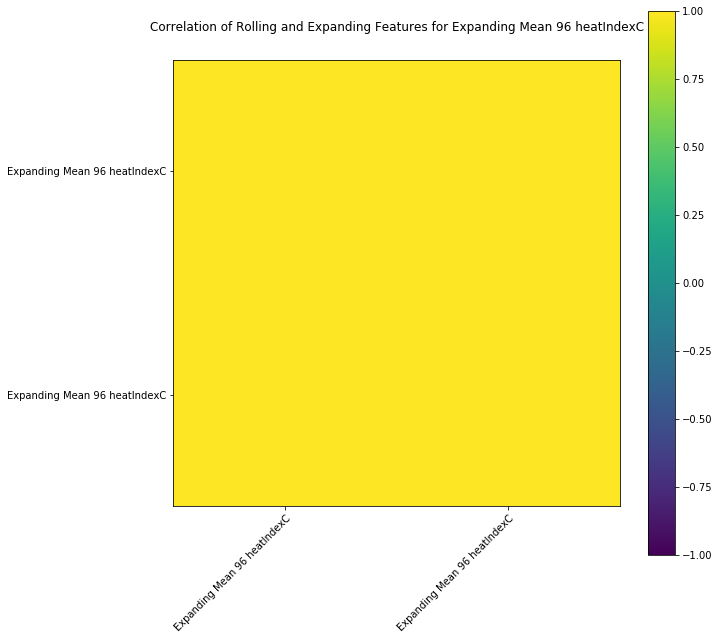

Expanding Min 2 dewPointC
Rolling W Done
Expanding Done


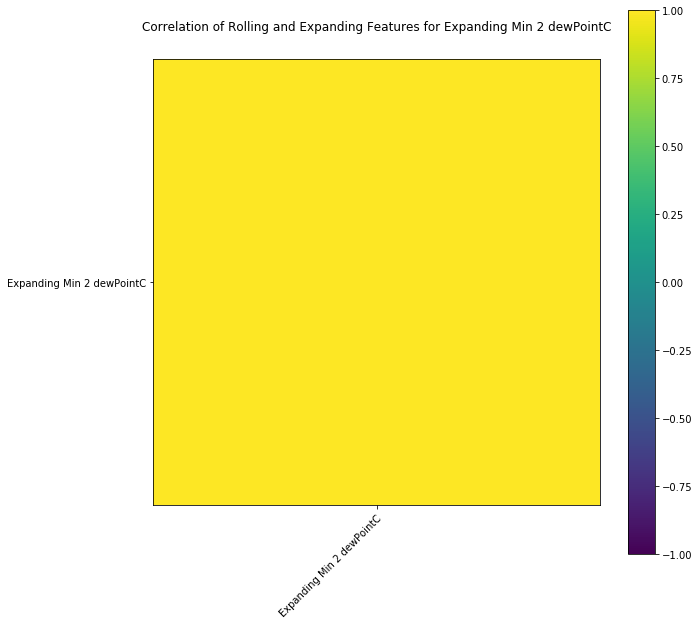

Expanding Max 2 dewPointC
Rolling W Done
Expanding Done


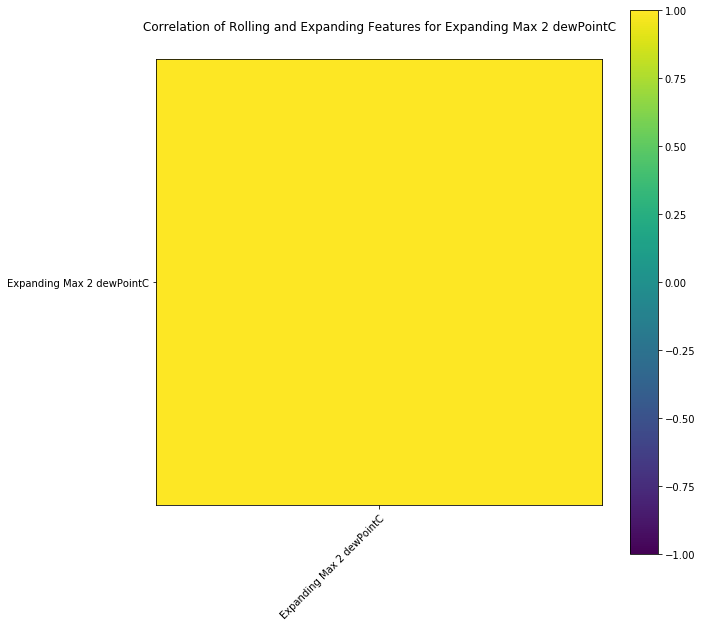

Expanding Sum 2 dewPointC
Rolling W Done
Expanding Done


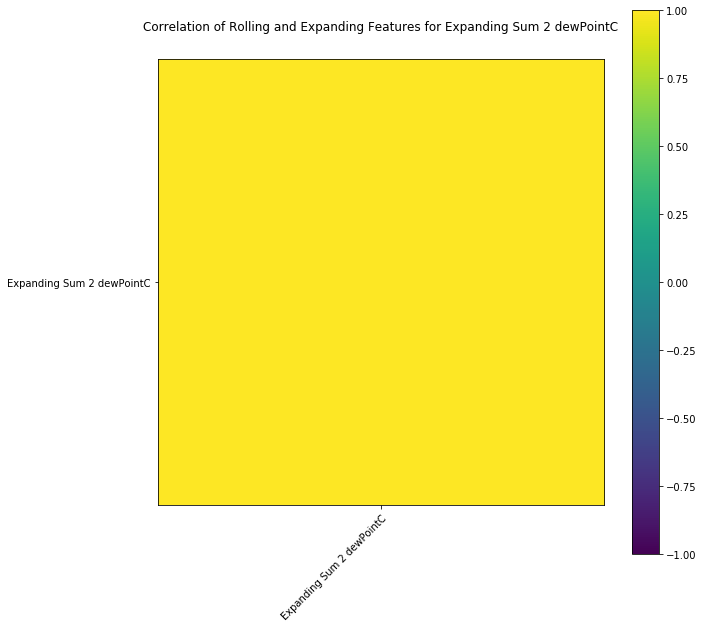

Expanding Mean 2 dewPointC
Rolling W Done
Expanding Done


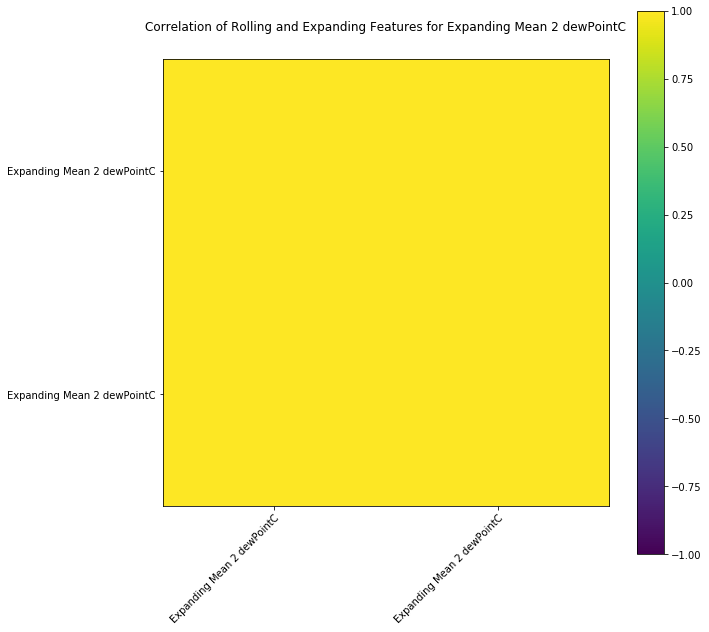

Expanding Min 3 dewPointC
Rolling W Done
Expanding Done


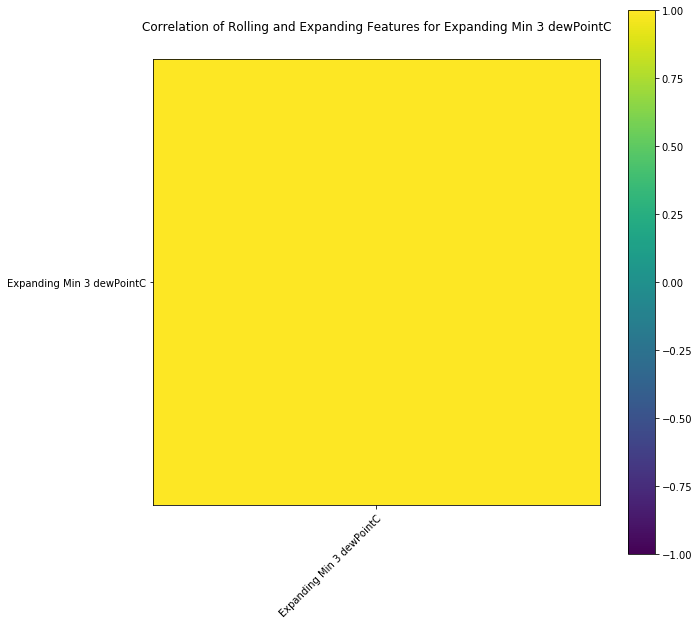

Expanding Max 3 dewPointC
Rolling W Done
Expanding Done


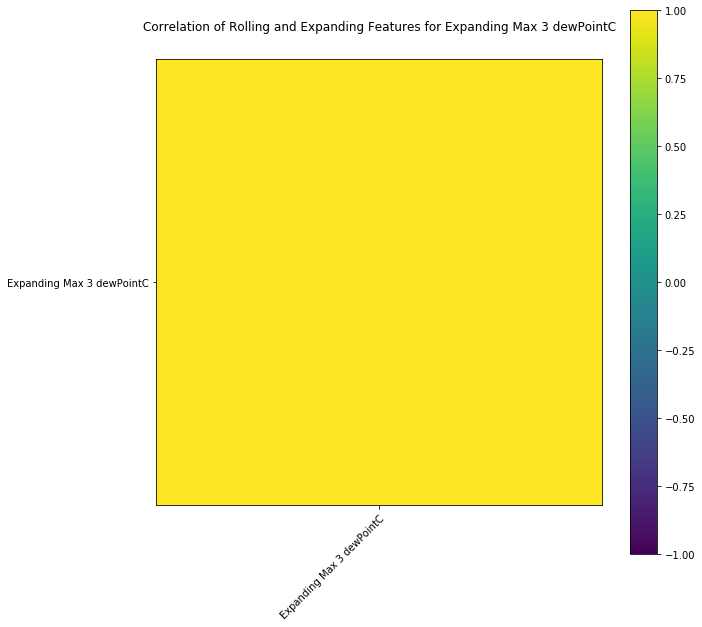

Expanding Sum 3 dewPointC
Rolling W Done
Expanding Done


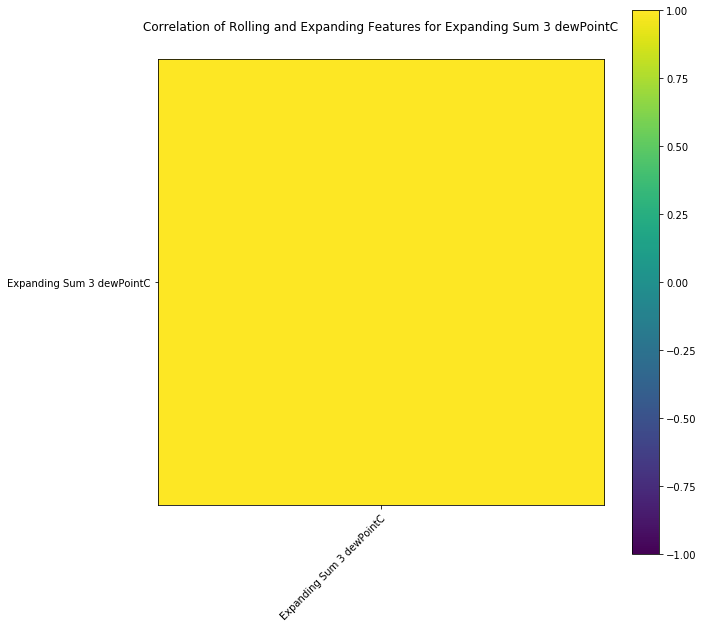

Expanding Mean 3 dewPointC
Rolling W Done
Expanding Done


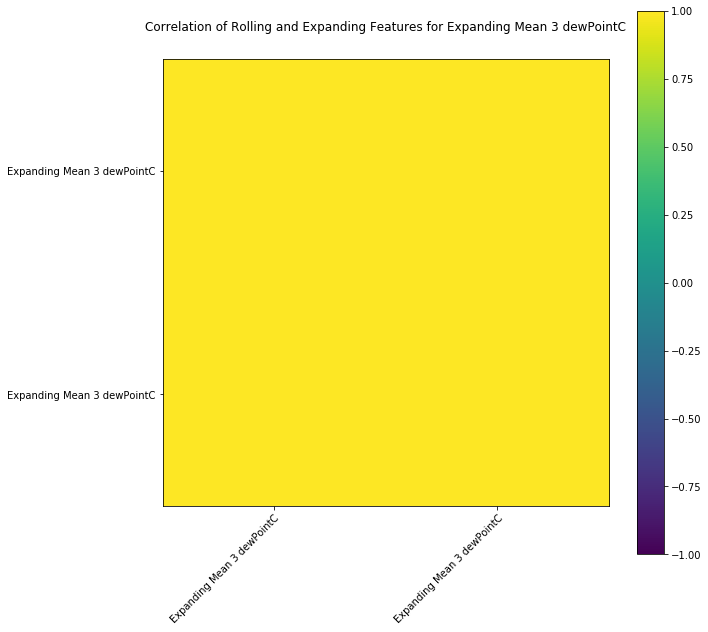

Expanding Min 4 dewPointC
Rolling W Done
Expanding Done


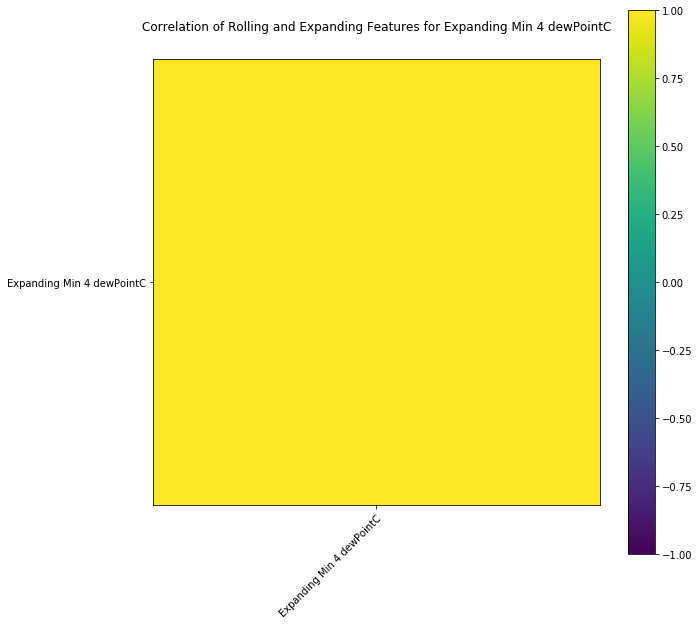

Expanding Max 4 dewPointC
Rolling W Done
Expanding Done


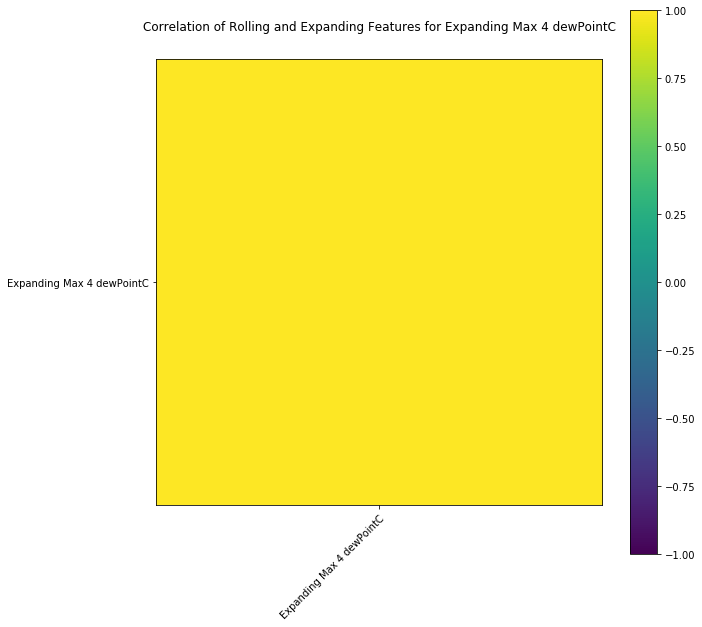

Expanding Sum 4 dewPointC
Rolling W Done
Expanding Done


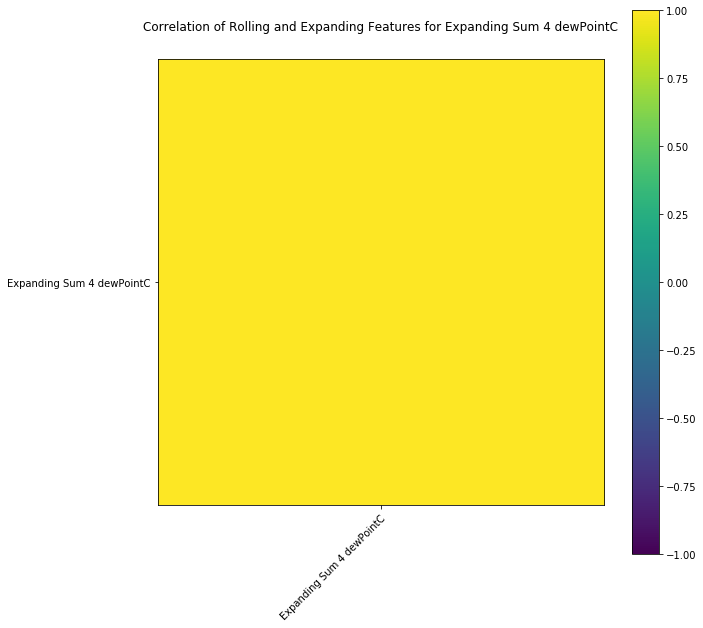

Expanding Mean 4 dewPointC
Rolling W Done
Expanding Done


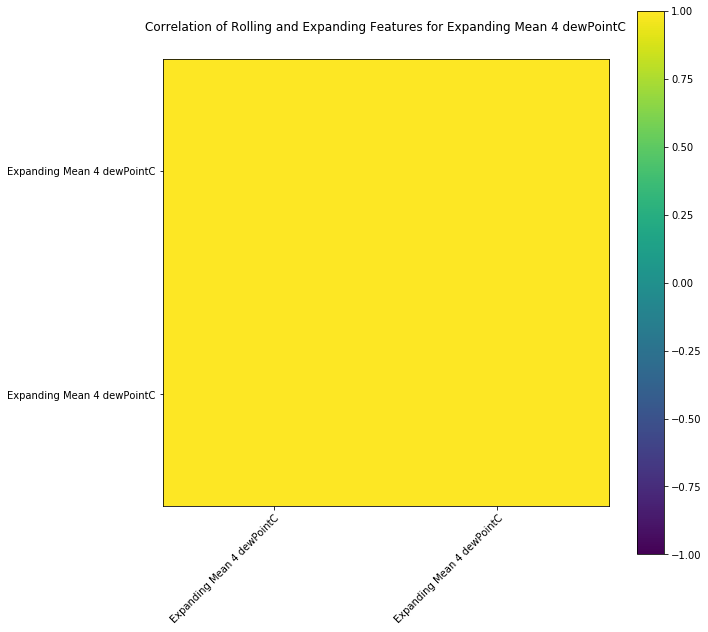

Expanding Min 8 dewPointC
Rolling W Done
Expanding Done


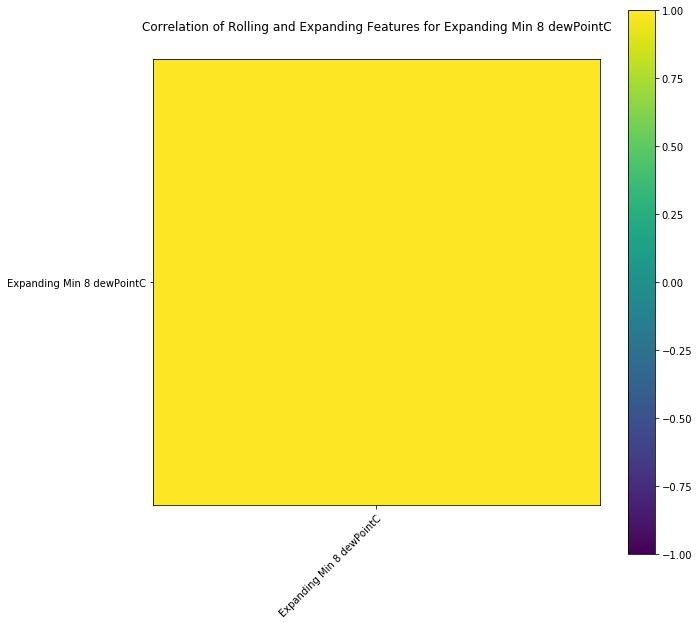

Expanding Max 8 dewPointC
Rolling W Done
Expanding Done


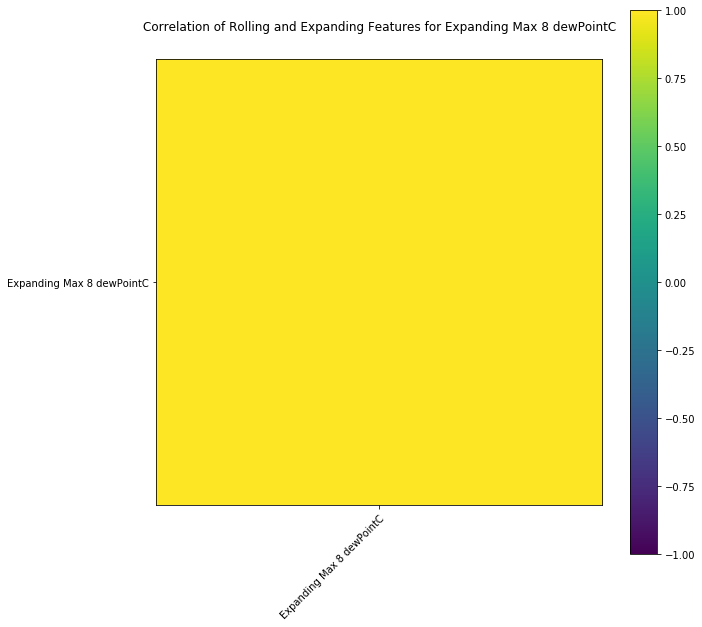

Expanding Sum 8 dewPointC
Rolling W Done
Expanding Done


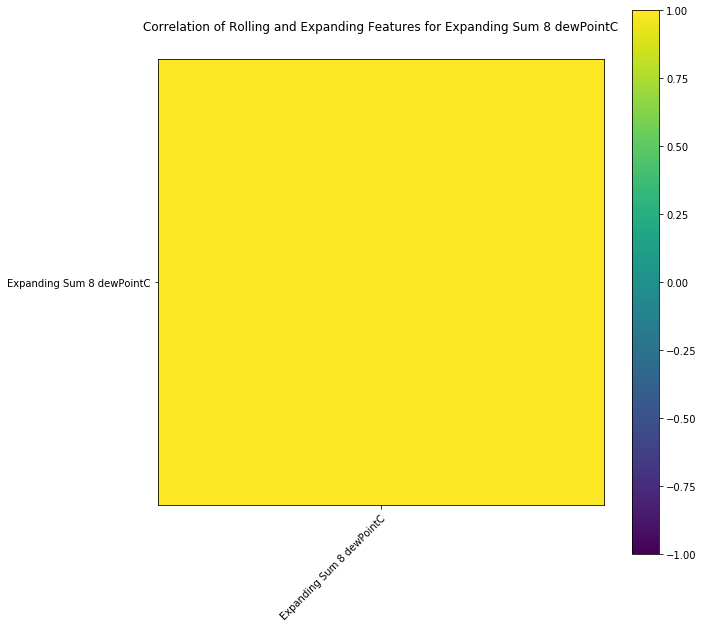

Expanding Mean 8 dewPointC
Rolling W Done
Expanding Done


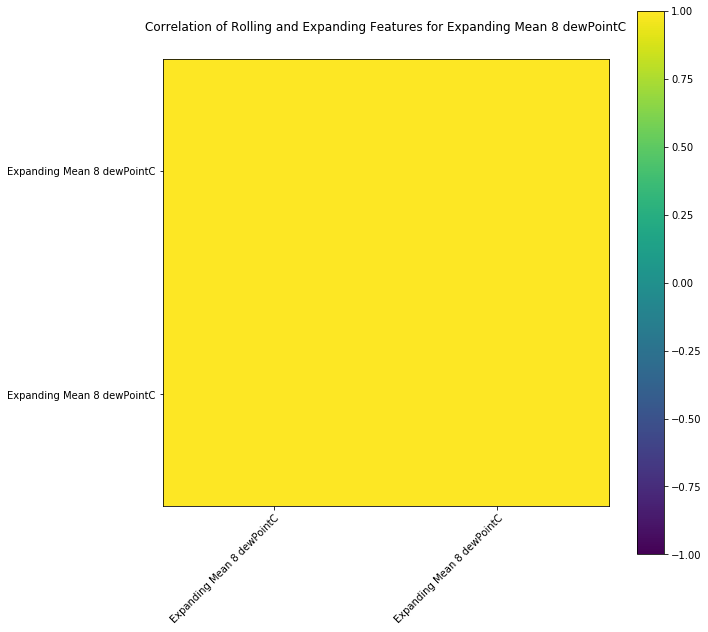

Expanding Min 12 dewPointC
Rolling W Done
Expanding Done


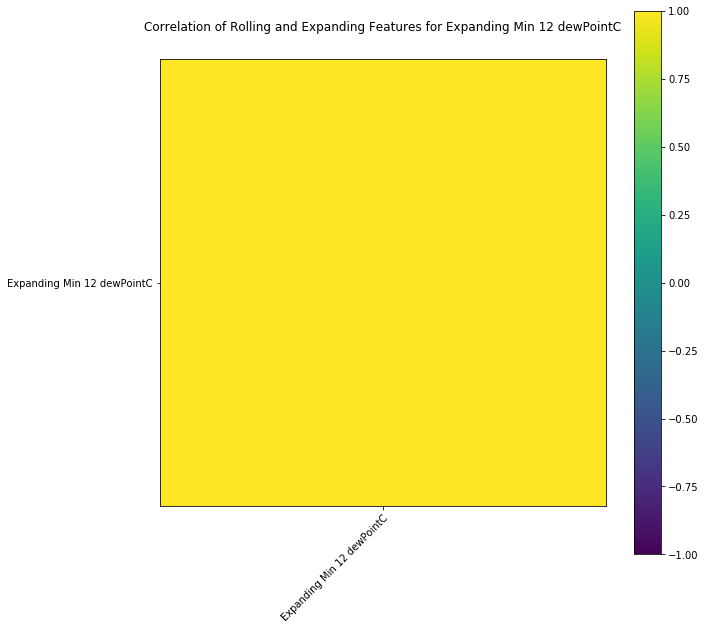

Expanding Max 12 dewPointC
Rolling W Done
Expanding Done


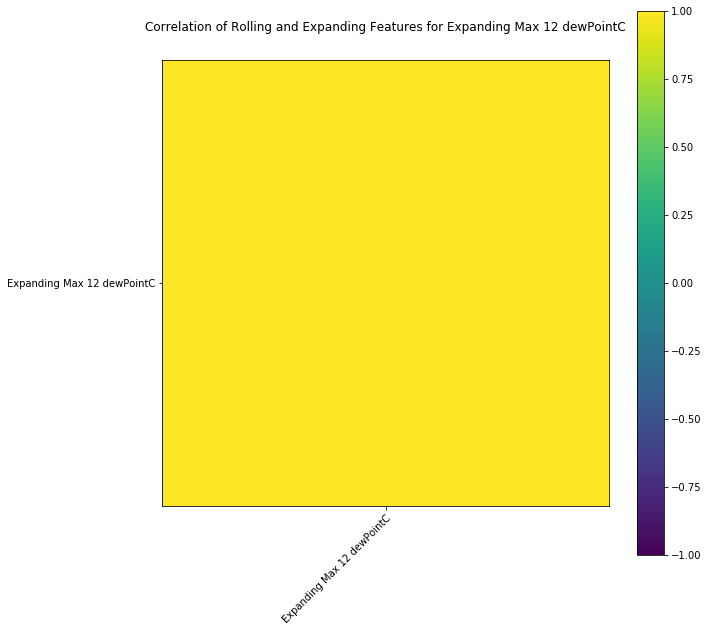

Expanding Sum 12 dewPointC
Rolling W Done
Expanding Done


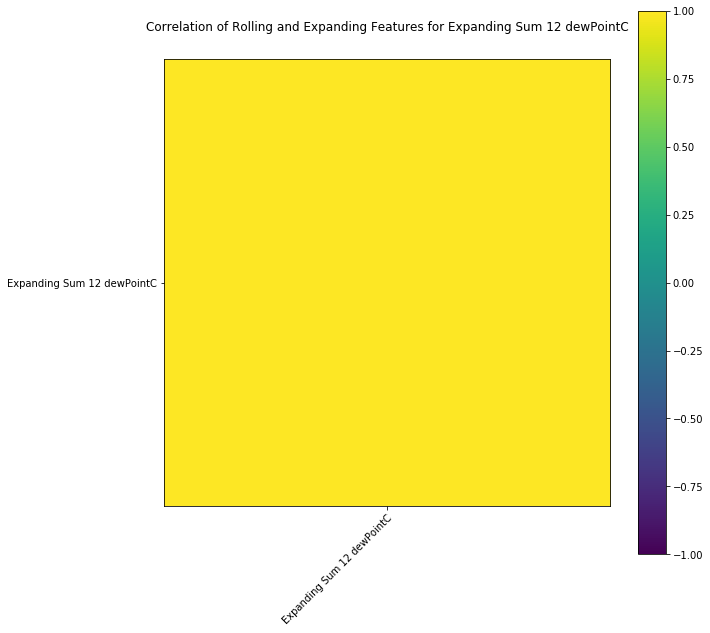

Expanding Mean 12 dewPointC
Rolling W Done
Expanding Done


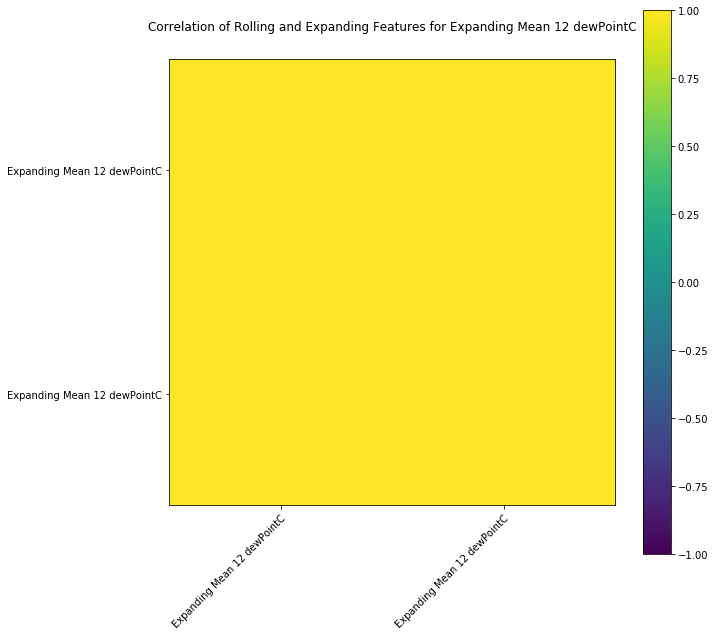

Expanding Min 16 dewPointC
Rolling W Done
Expanding Done


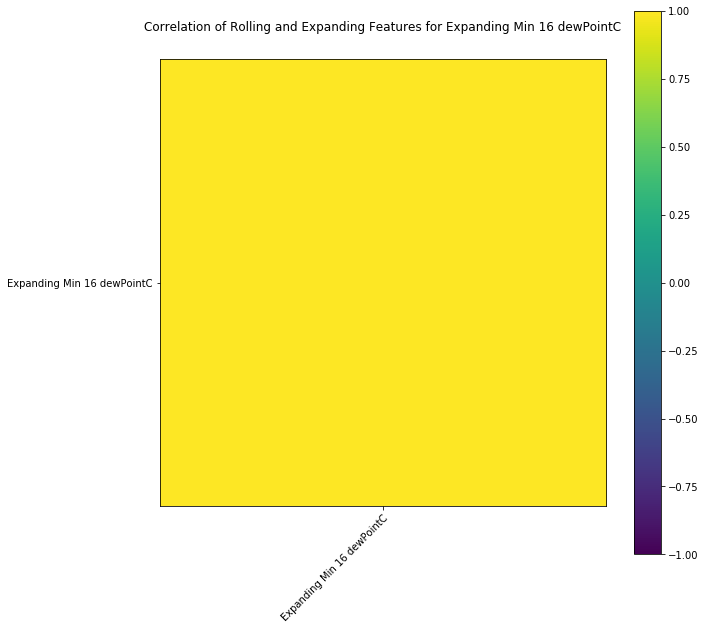

Expanding Max 16 dewPointC
Rolling W Done
Expanding Done


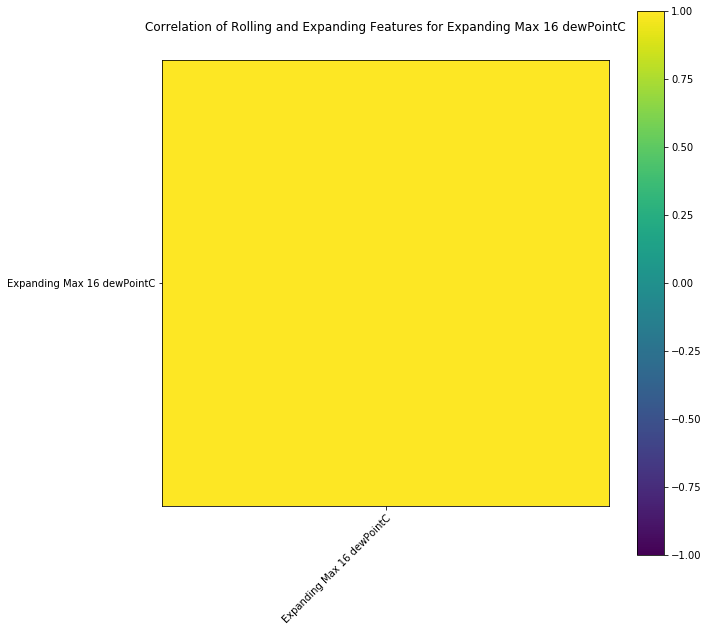

Expanding Sum 16 dewPointC
Rolling W Done
Expanding Done


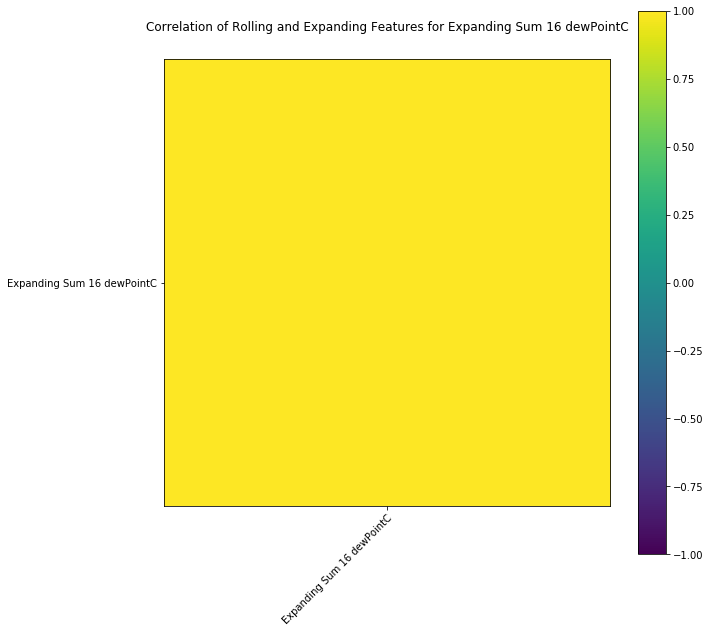

Expanding Mean 16 dewPointC
Rolling W Done
Expanding Done


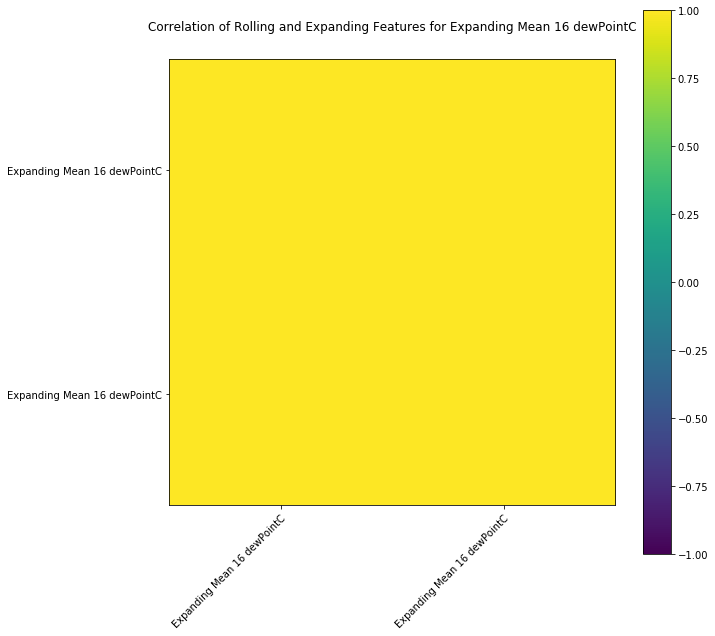

Expanding Min 24 dewPointC
Rolling W Done
Expanding Done


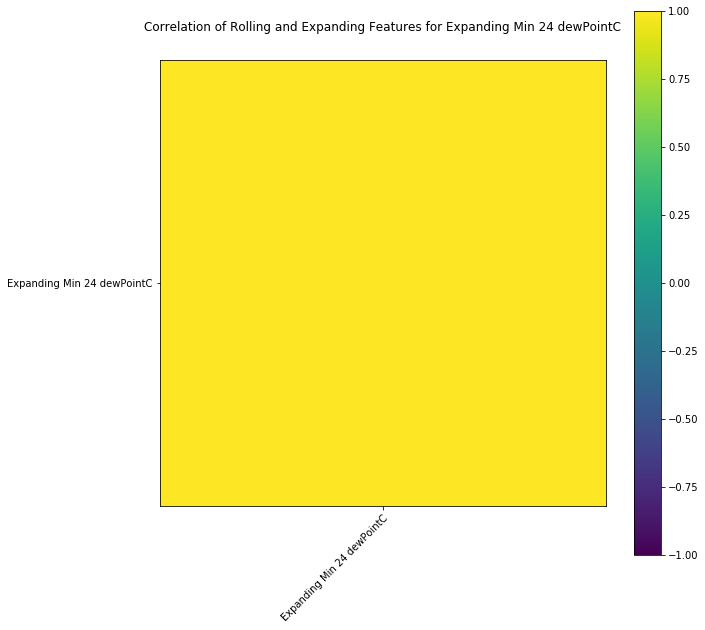

Expanding Max 24 dewPointC
Rolling W Done
Expanding Done


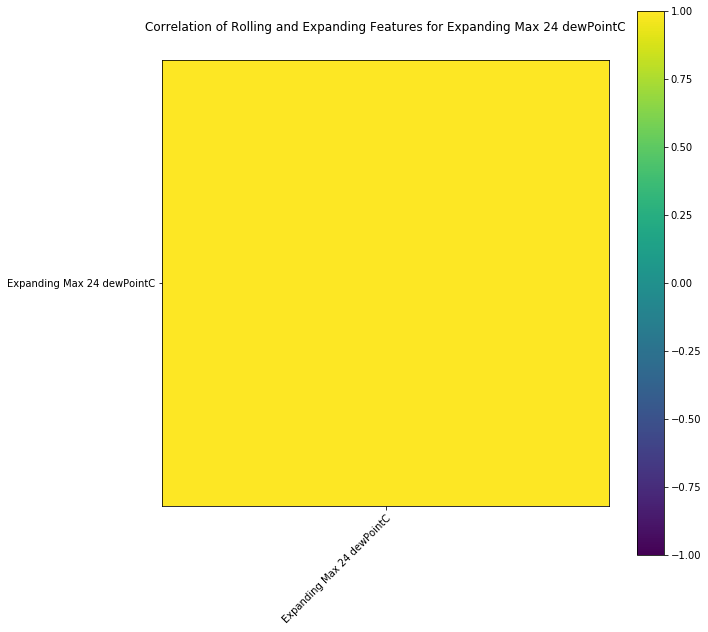

Expanding Sum 24 dewPointC
Rolling W Done
Expanding Done


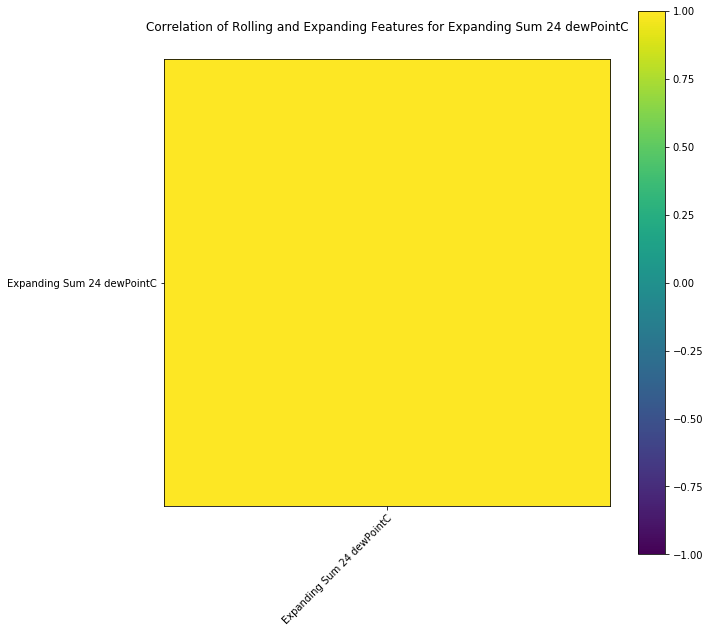

Expanding Mean 24 dewPointC
Rolling W Done
Expanding Done


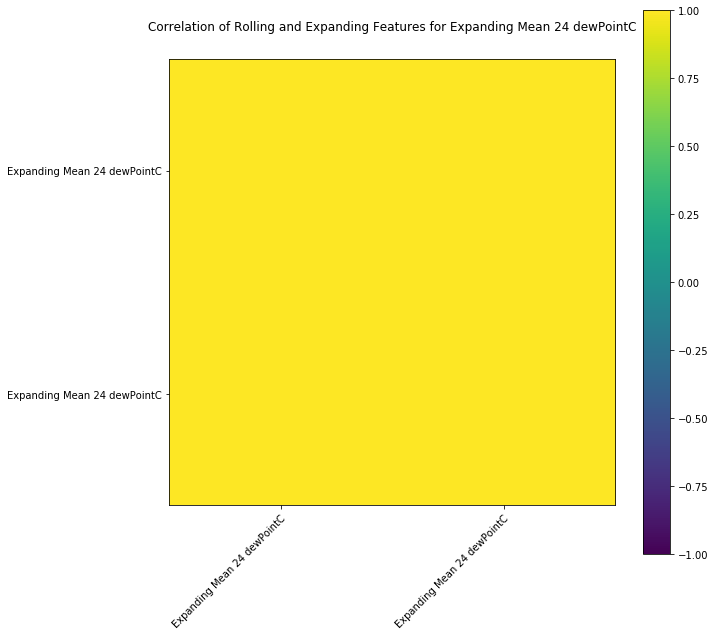

Expanding Min 48 dewPointC
Rolling W Done
Expanding Done


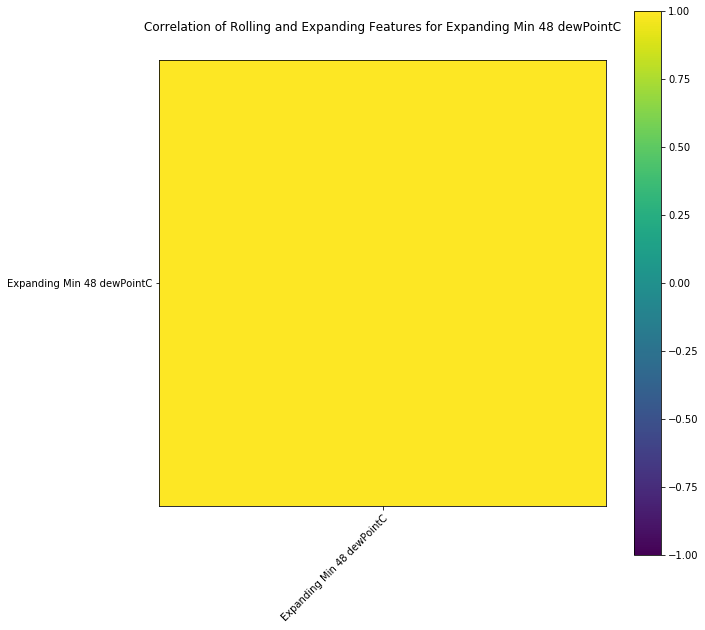

Expanding Max 48 dewPointC
Rolling W Done
Expanding Done


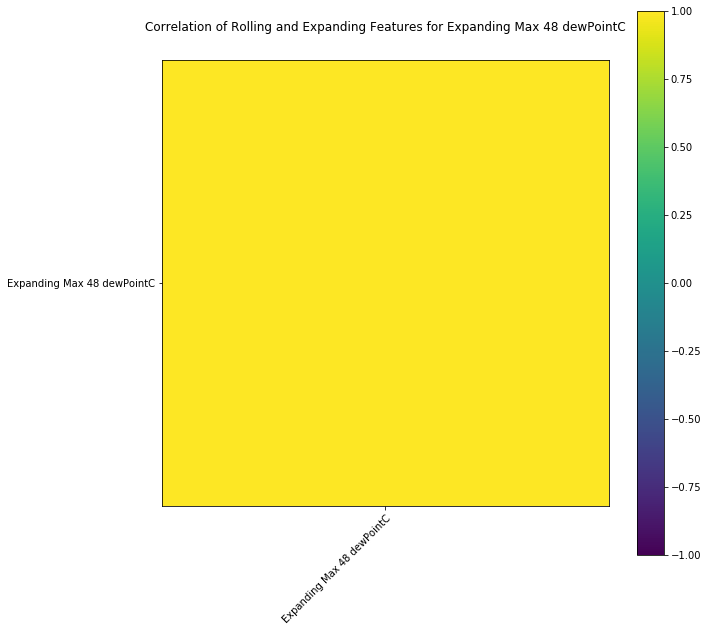

Expanding Sum 48 dewPointC
Rolling W Done
Expanding Done


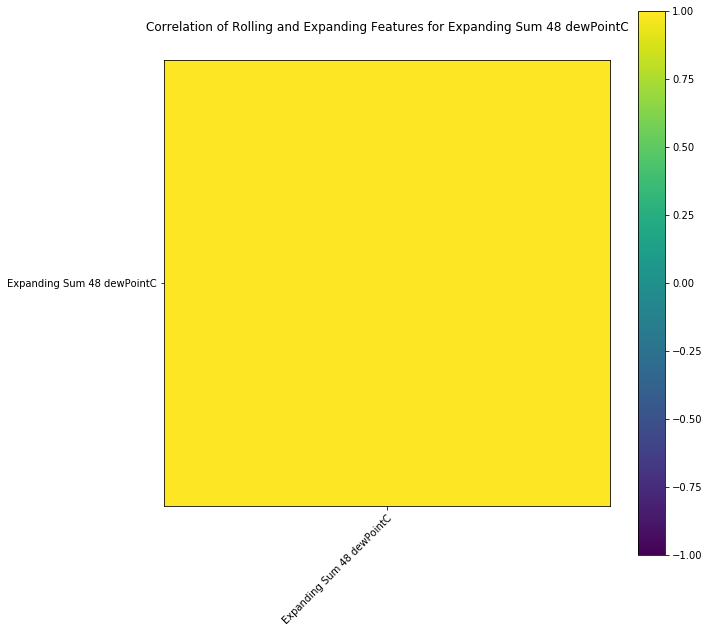

Expanding Mean 48 dewPointC
Rolling W Done
Expanding Done


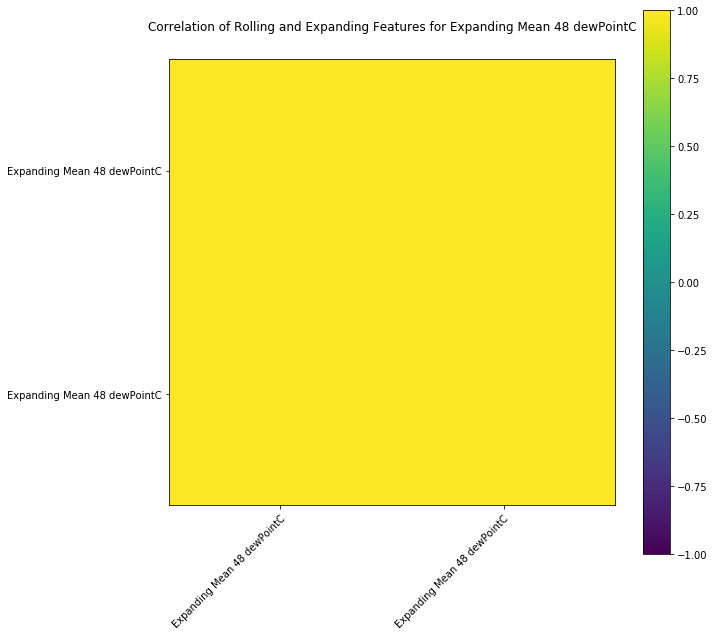

Expanding Min 96 dewPointC
Rolling W Done
Expanding Done


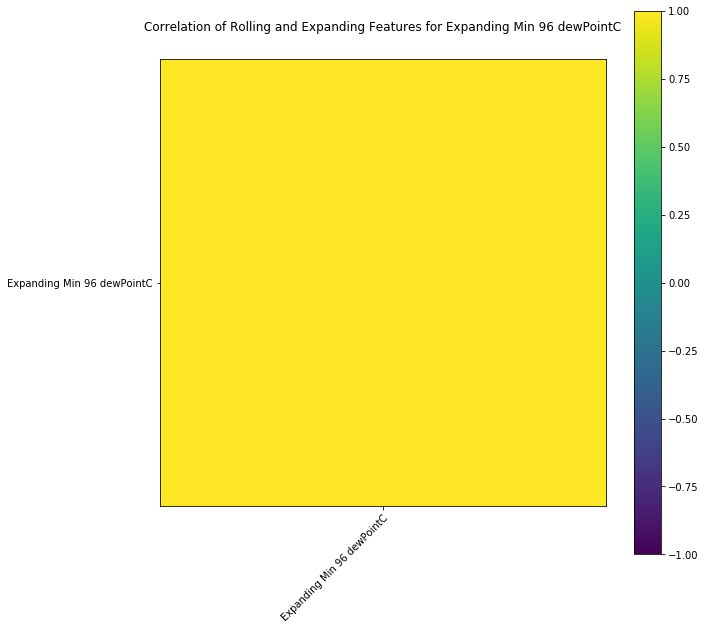

Expanding Max 96 dewPointC
Rolling W Done
Expanding Done


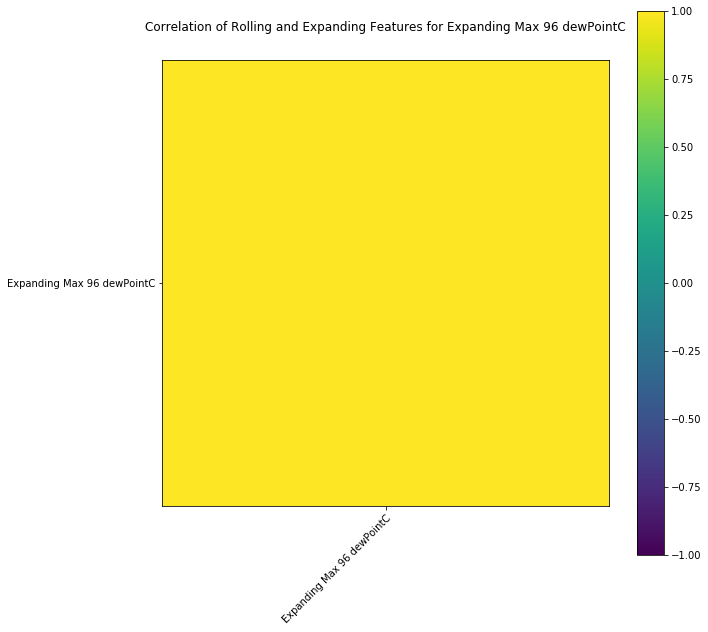

Expanding Sum 96 dewPointC
Rolling W Done
Expanding Done


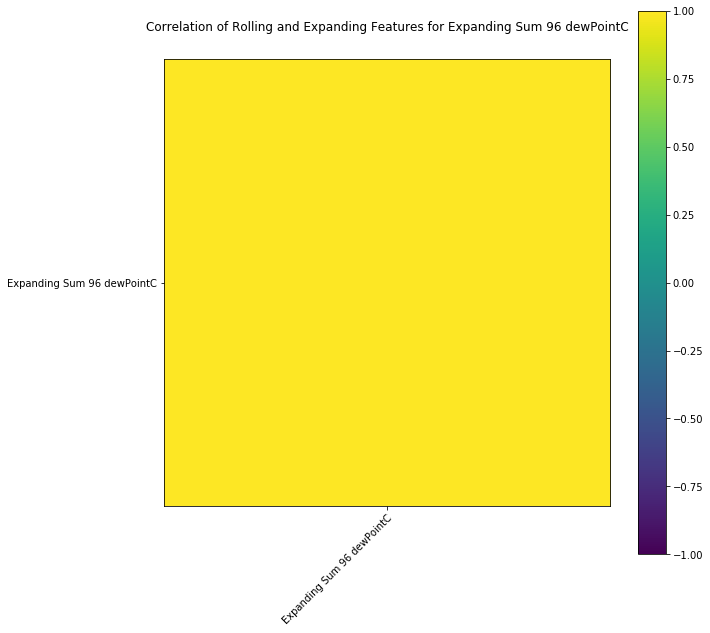

Expanding Mean 96 dewPointC
Rolling W Done
Expanding Done


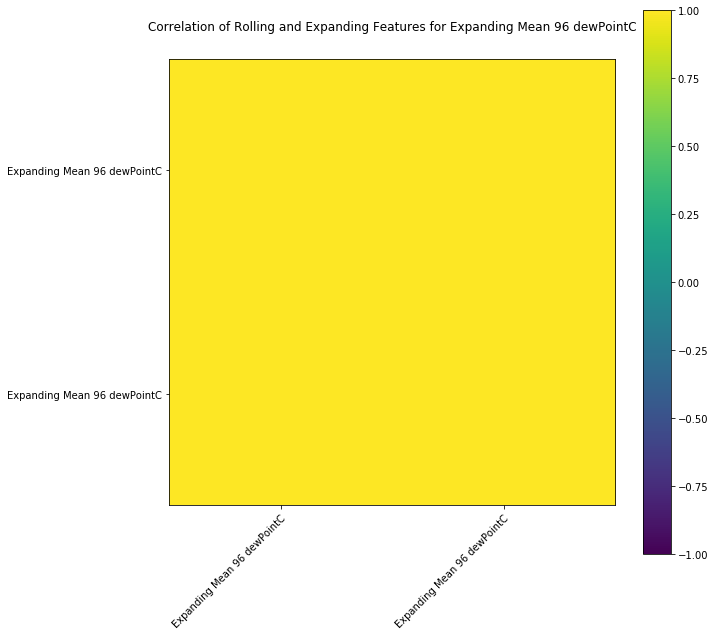

Expanding Min 2 windChillC
Rolling W Done
Expanding Done


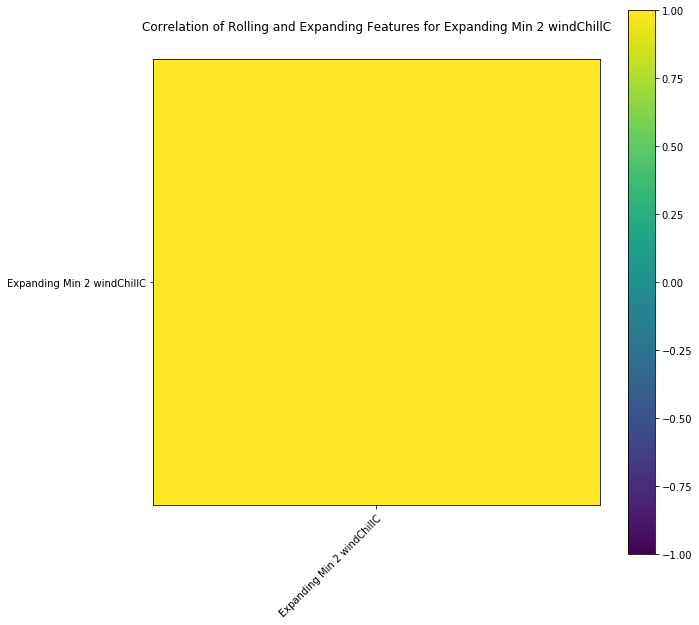

Expanding Max 2 windChillC
Rolling W Done
Expanding Done


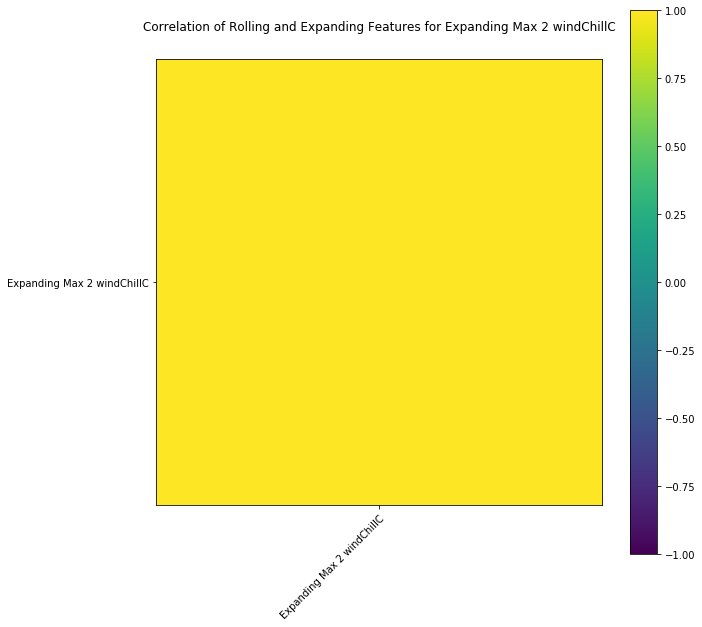

Expanding Sum 2 windChillC
Rolling W Done
Expanding Done


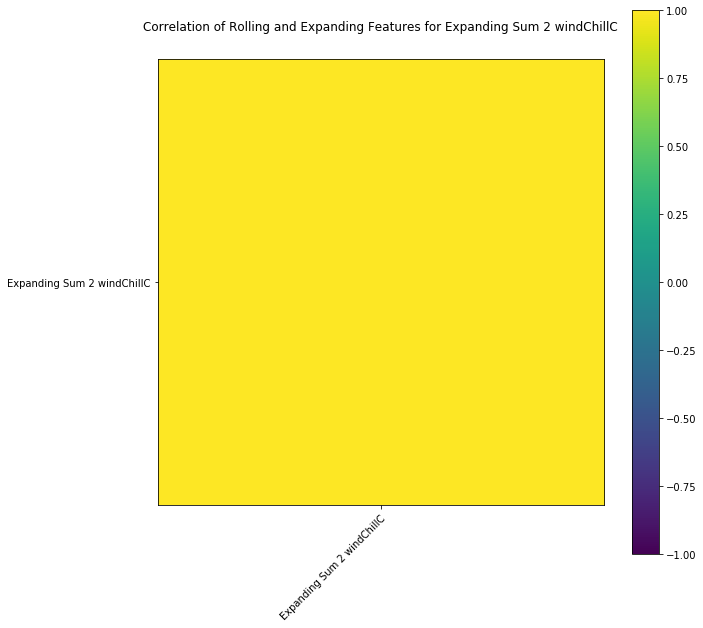

Expanding Mean 2 windChillC
Rolling W Done
Expanding Done


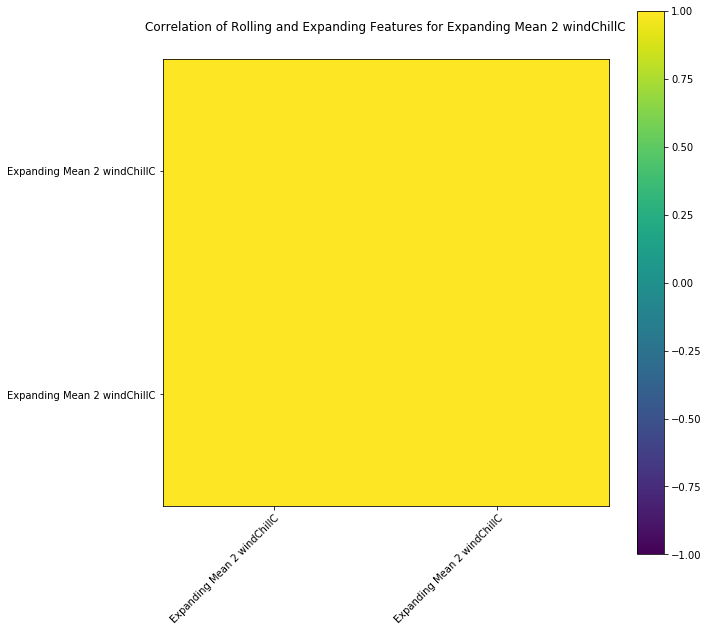

Expanding Min 3 windChillC
Rolling W Done
Expanding Done


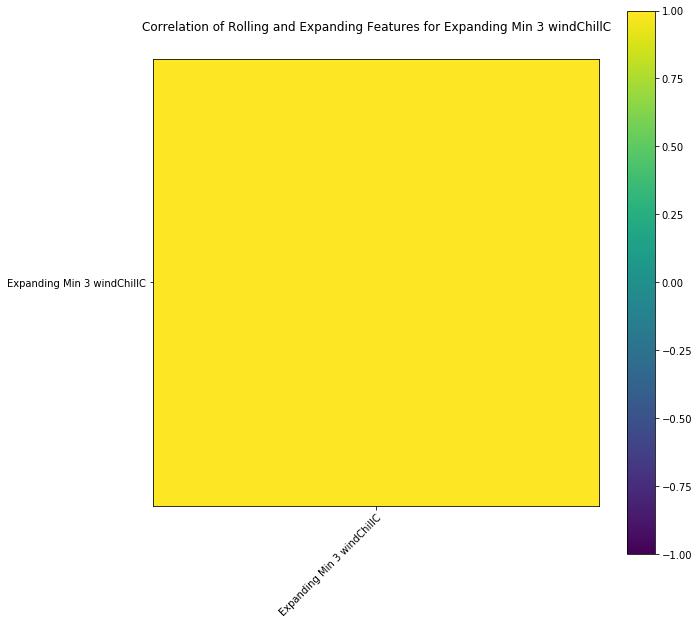

Expanding Max 3 windChillC
Rolling W Done
Expanding Done


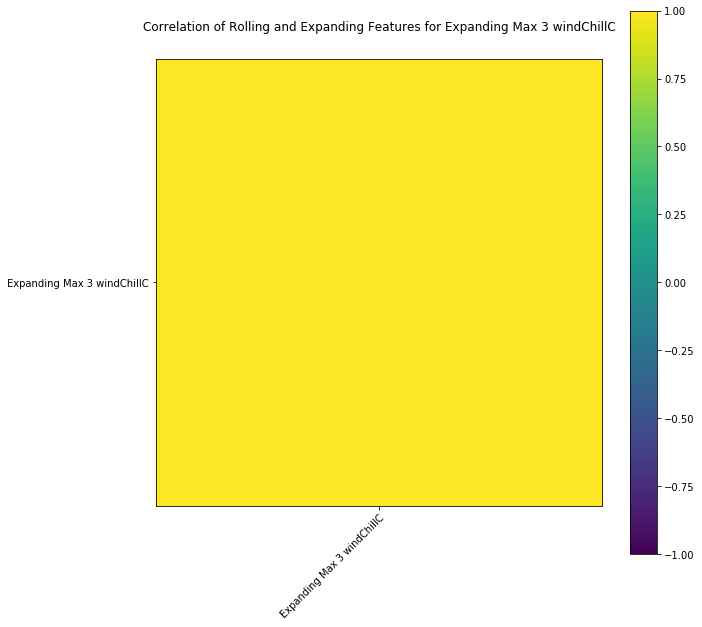

Expanding Sum 3 windChillC
Rolling W Done
Expanding Done


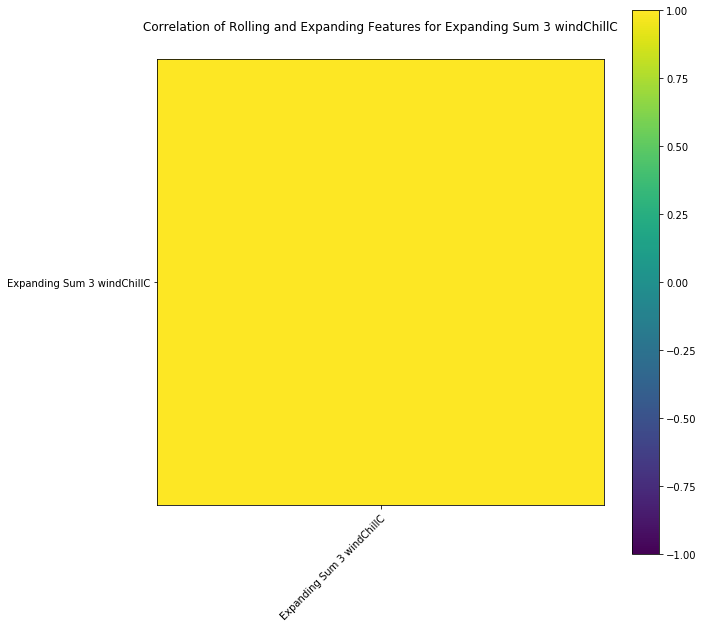

Expanding Mean 3 windChillC
Rolling W Done
Expanding Done


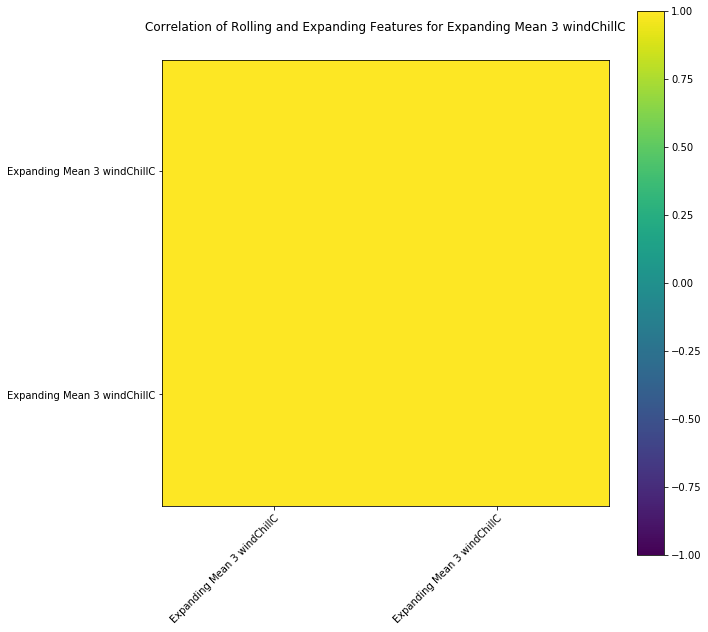

Expanding Min 4 windChillC
Rolling W Done
Expanding Done


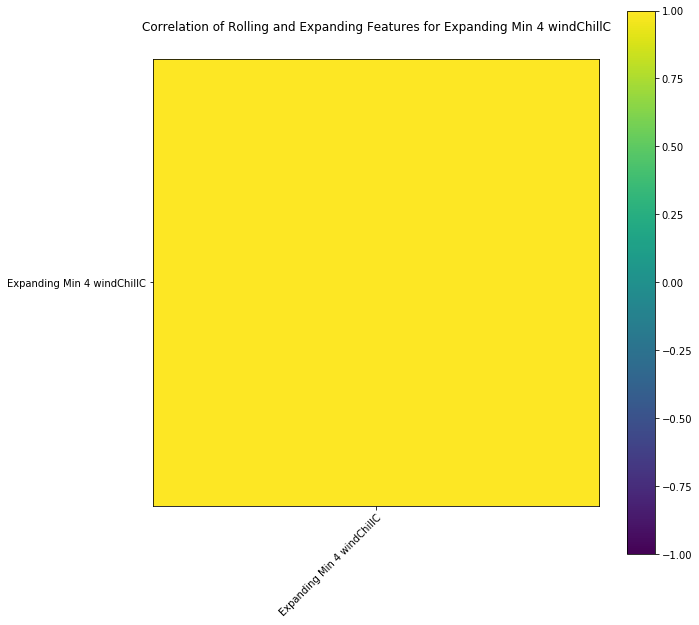

Expanding Max 4 windChillC
Rolling W Done
Expanding Done


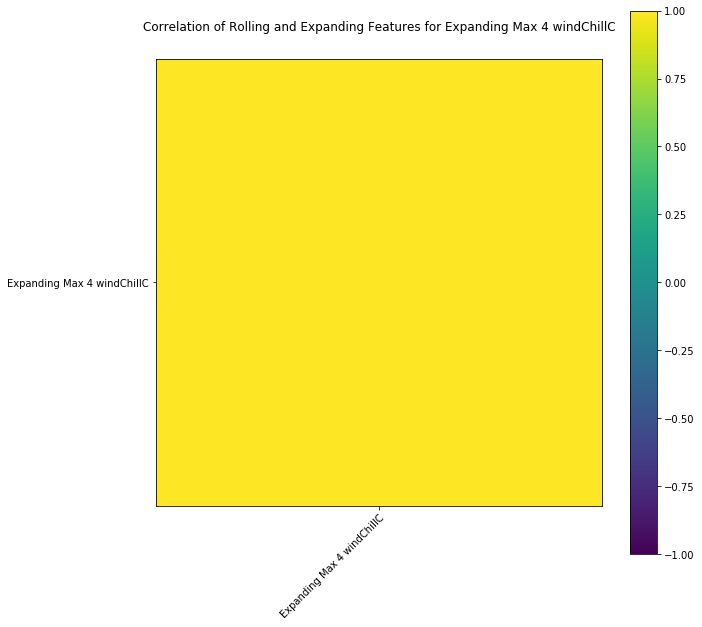

Expanding Sum 4 windChillC
Rolling W Done
Expanding Done


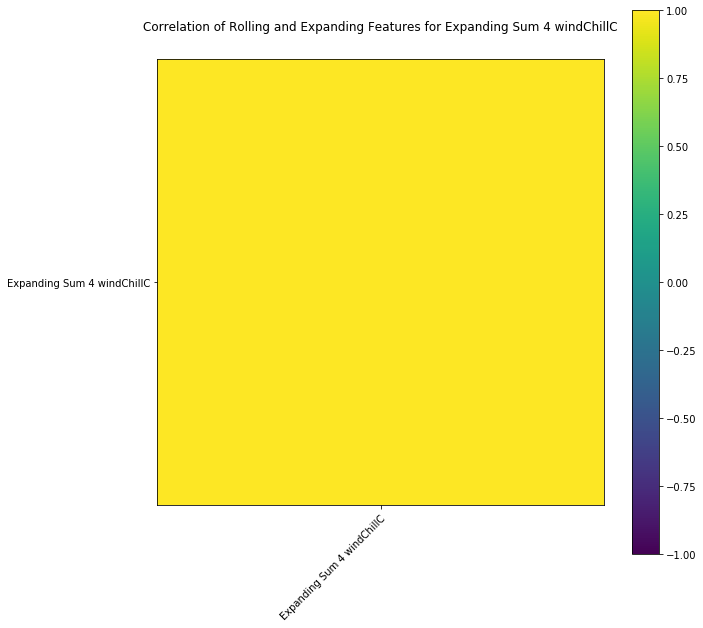

Expanding Mean 4 windChillC
Rolling W Done
Expanding Done


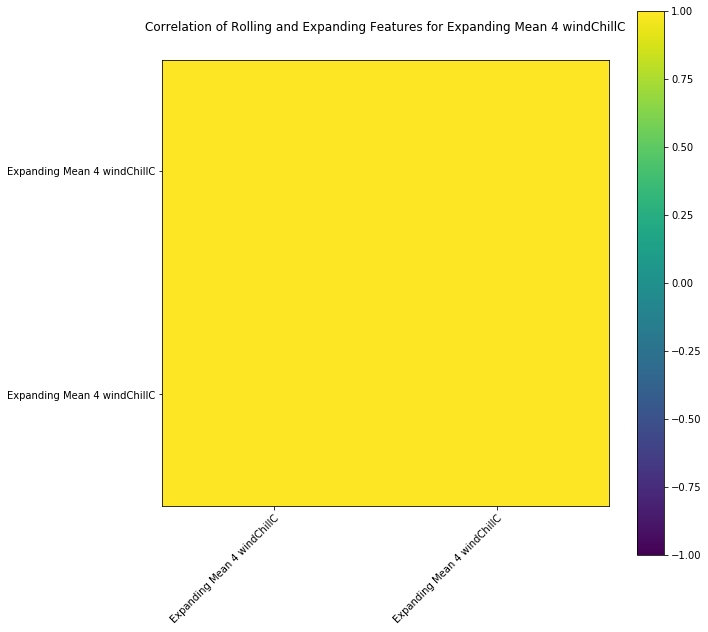

Expanding Min 8 windChillC
Rolling W Done
Expanding Done


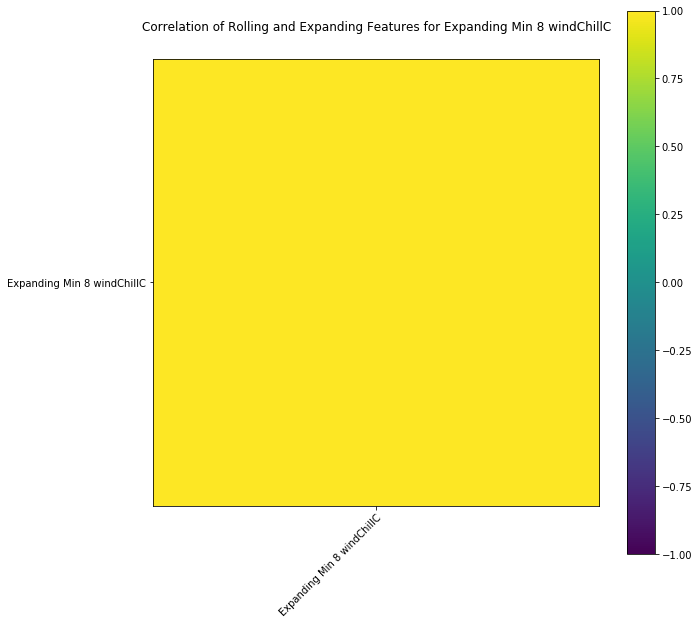

Expanding Max 8 windChillC
Rolling W Done
Expanding Done


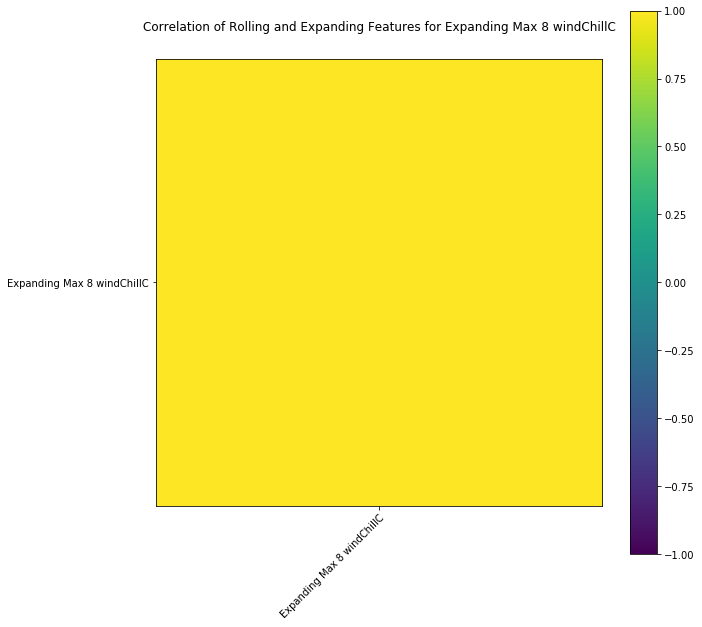

Expanding Sum 8 windChillC
Rolling W Done
Expanding Done


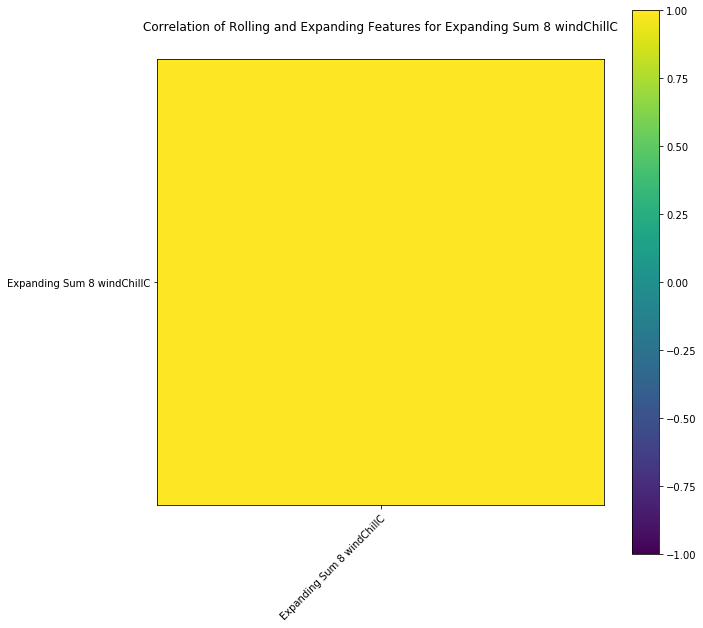

Expanding Mean 8 windChillC
Rolling W Done
Expanding Done


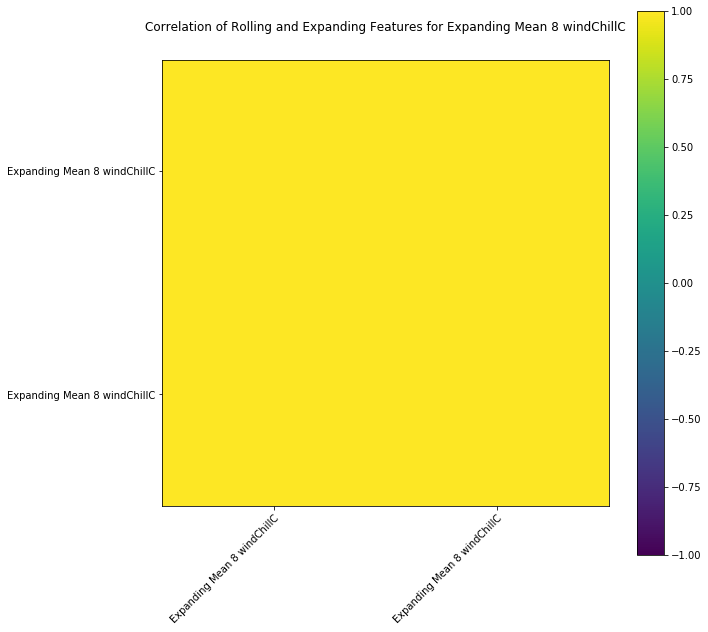

Expanding Min 12 windChillC
Rolling W Done
Expanding Done


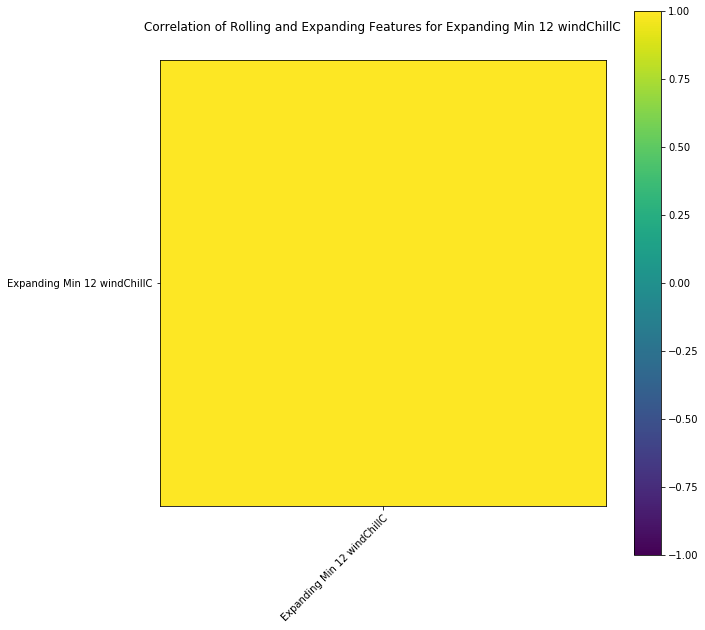

Expanding Max 12 windChillC
Rolling W Done
Expanding Done


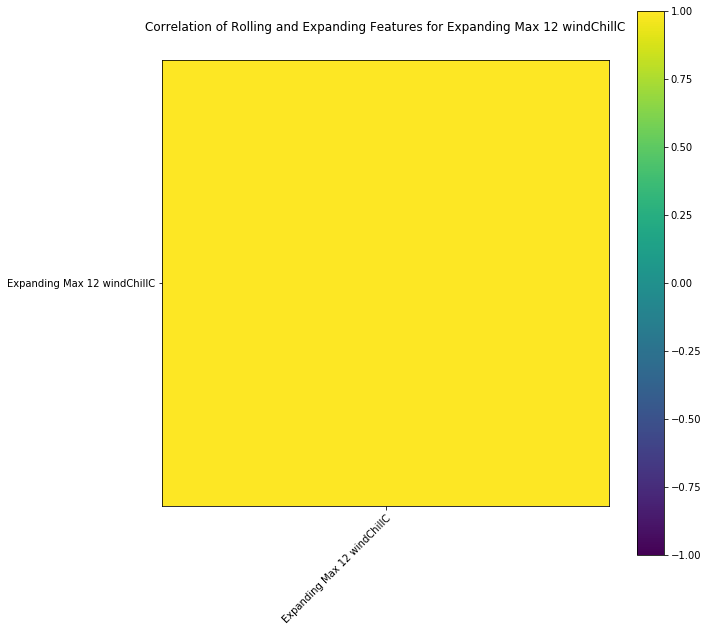

Expanding Sum 12 windChillC
Rolling W Done
Expanding Done


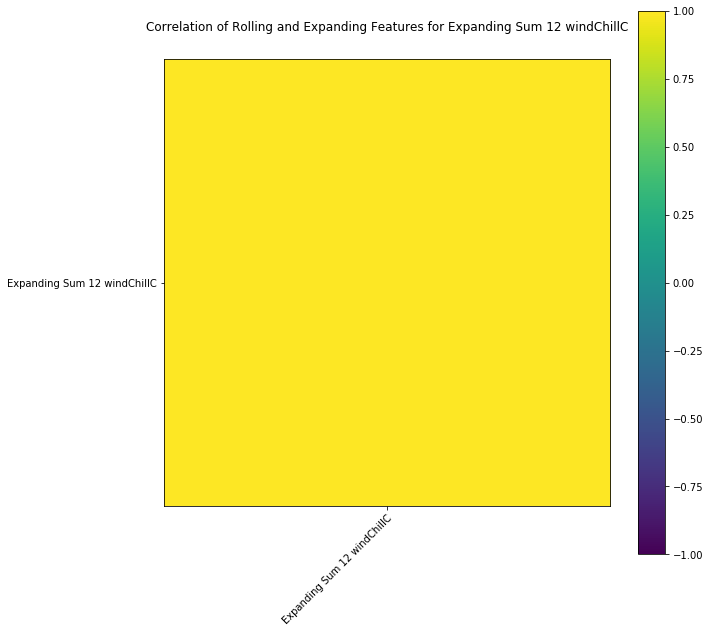

Expanding Mean 12 windChillC
Rolling W Done
Expanding Done


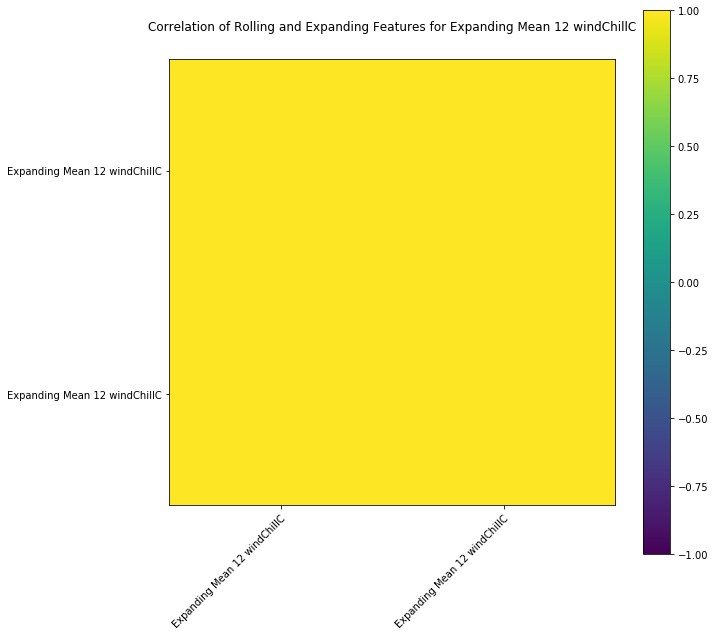

Expanding Min 16 windChillC
Rolling W Done
Expanding Done


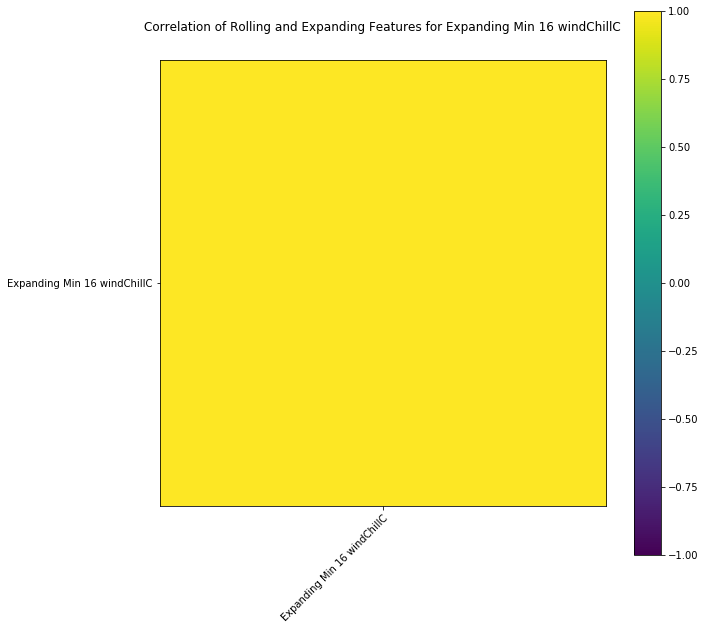

Expanding Max 16 windChillC
Rolling W Done
Expanding Done


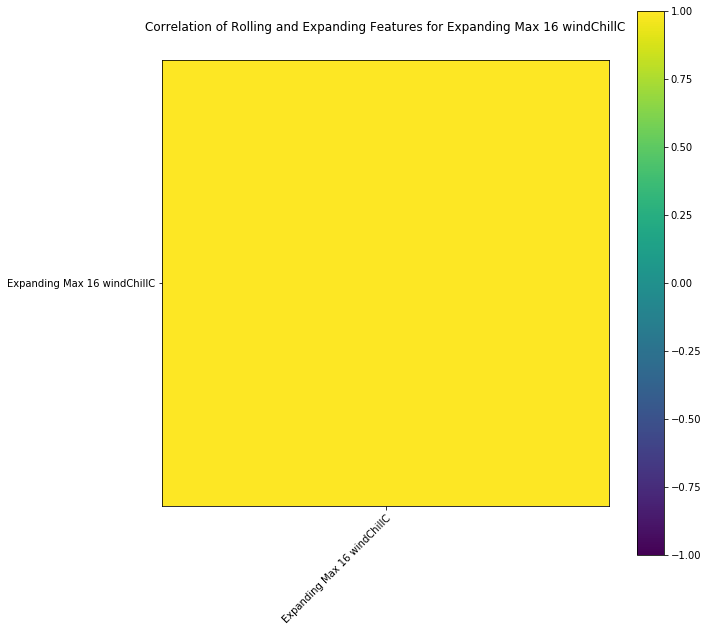

Expanding Sum 16 windChillC
Rolling W Done
Expanding Done


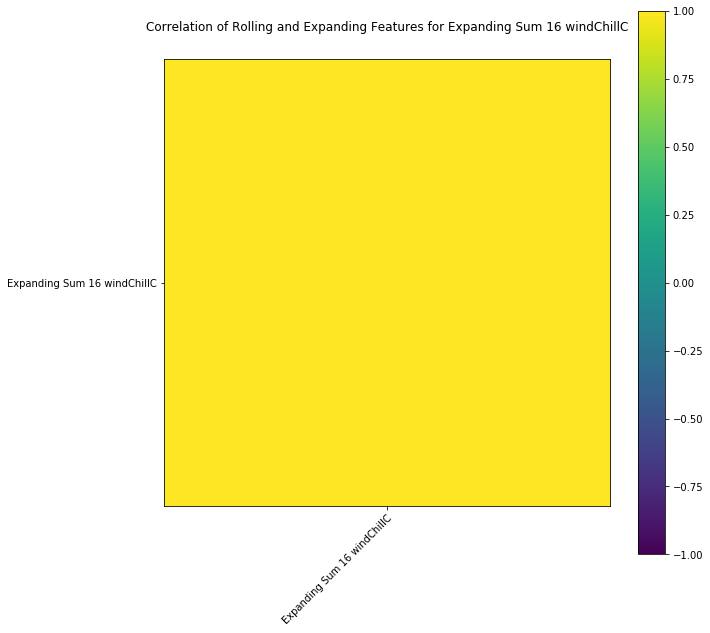

Expanding Mean 16 windChillC
Rolling W Done
Expanding Done


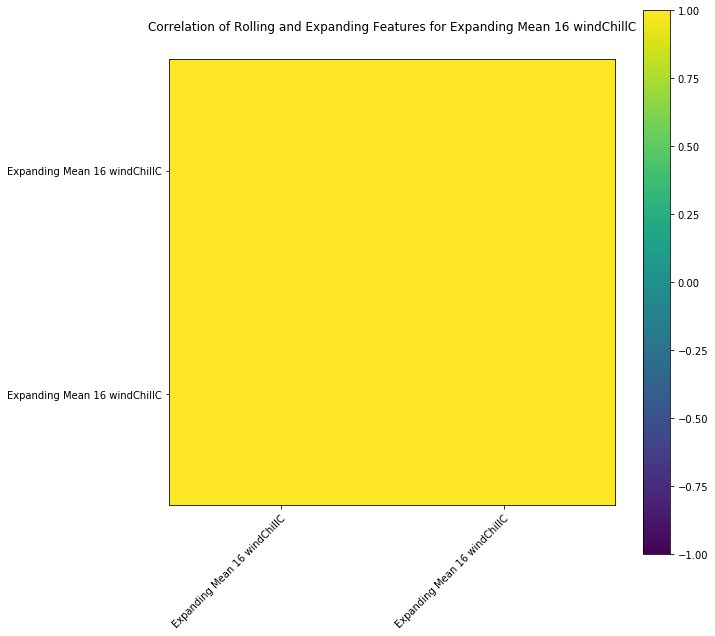

Expanding Min 24 windChillC
Rolling W Done
Expanding Done


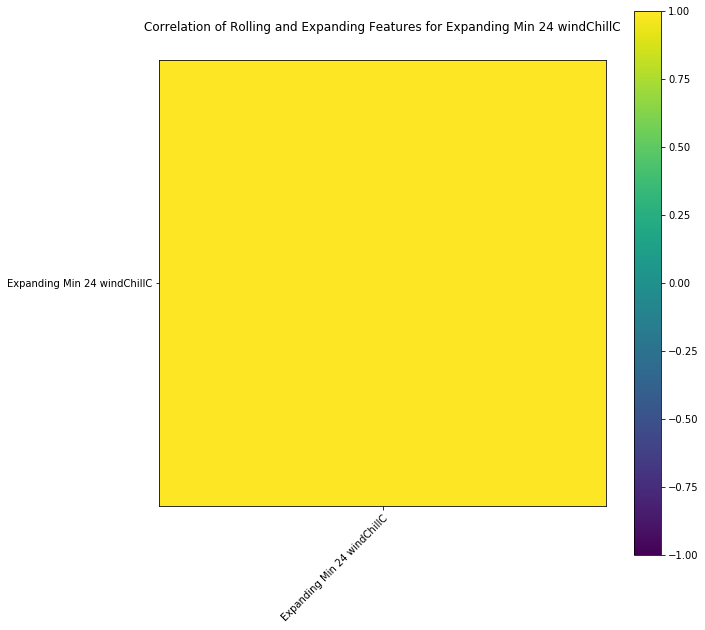

Expanding Max 24 windChillC
Rolling W Done
Expanding Done


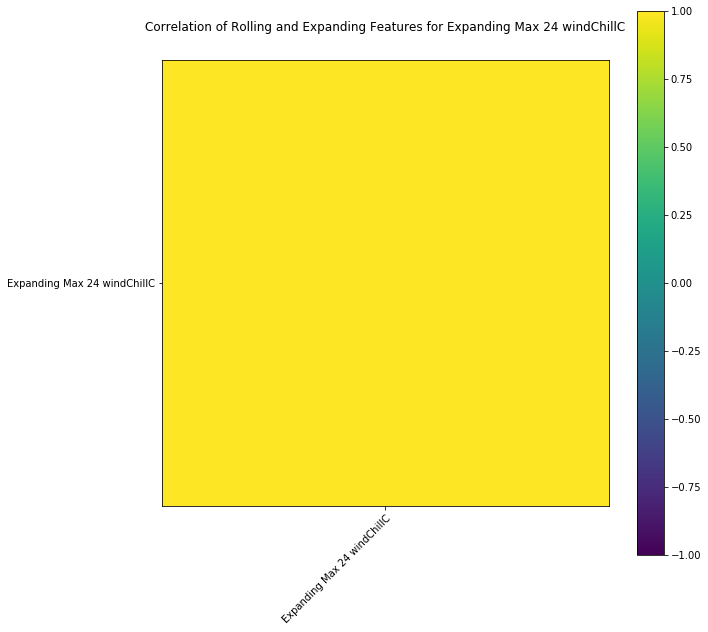

Expanding Sum 24 windChillC
Rolling W Done
Expanding Done


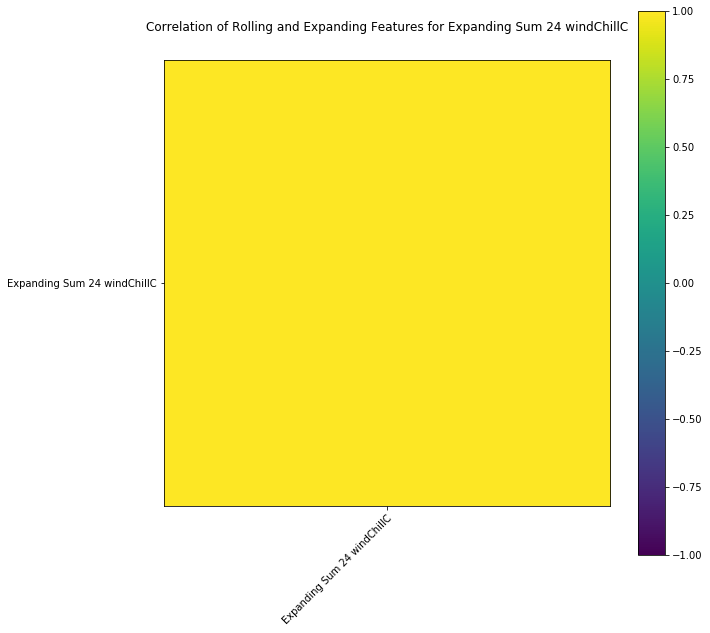

Expanding Mean 24 windChillC
Rolling W Done
Expanding Done


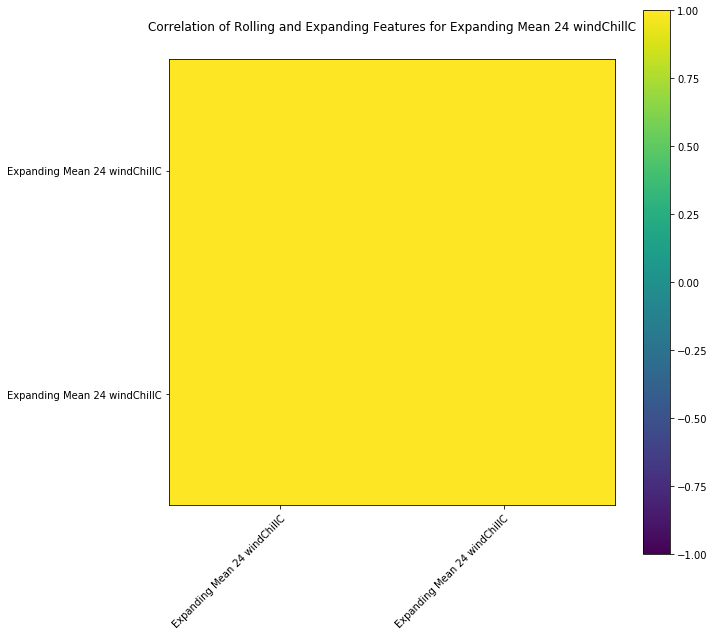

Expanding Min 48 windChillC
Rolling W Done
Expanding Done


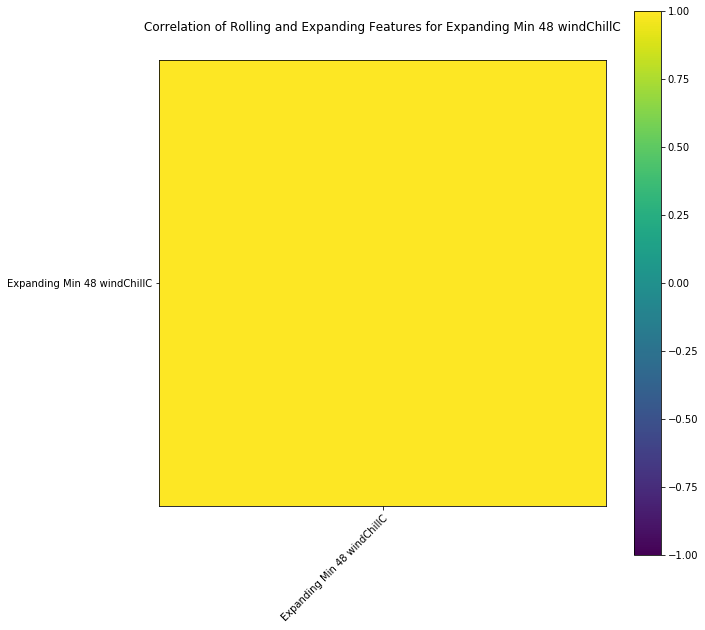

Expanding Max 48 windChillC
Rolling W Done
Expanding Done


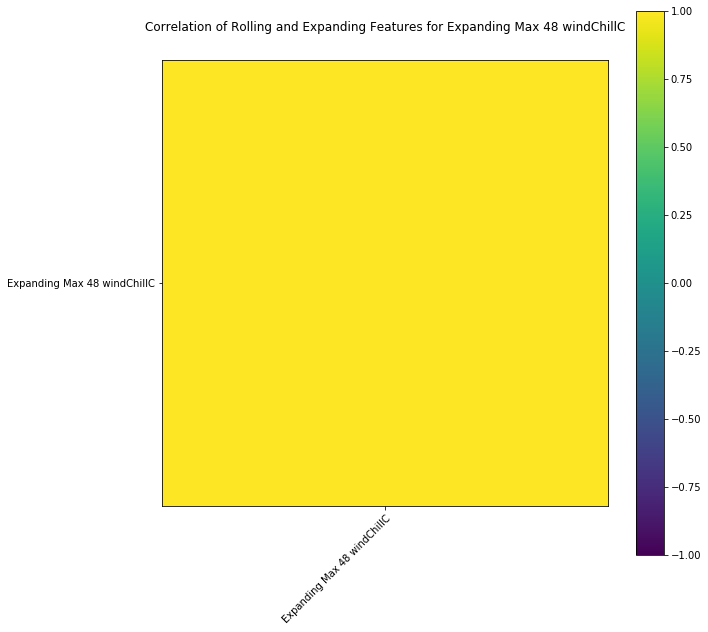

Expanding Sum 48 windChillC
Rolling W Done
Expanding Done


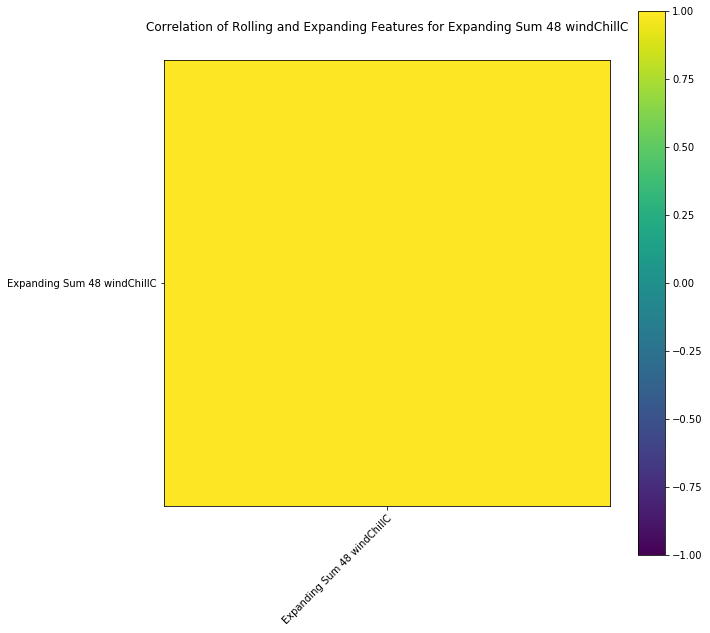

Expanding Mean 48 windChillC
Rolling W Done
Expanding Done


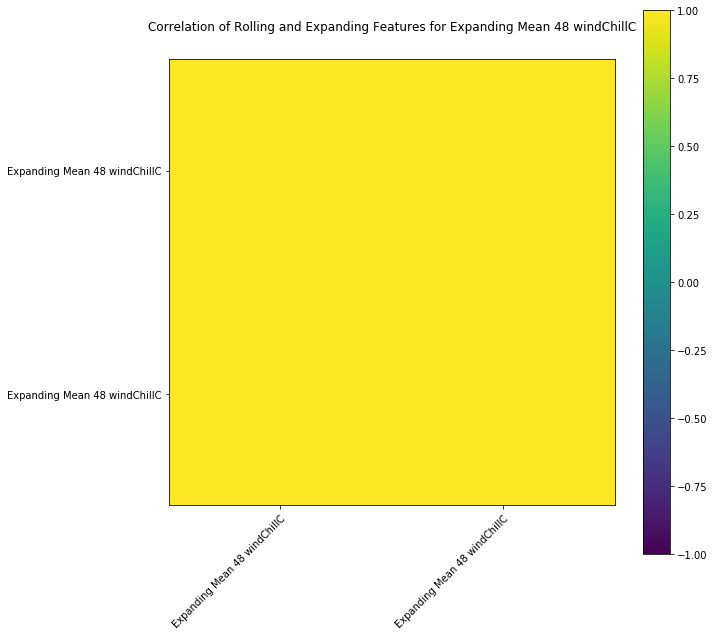

Expanding Min 96 windChillC
Rolling W Done
Expanding Done


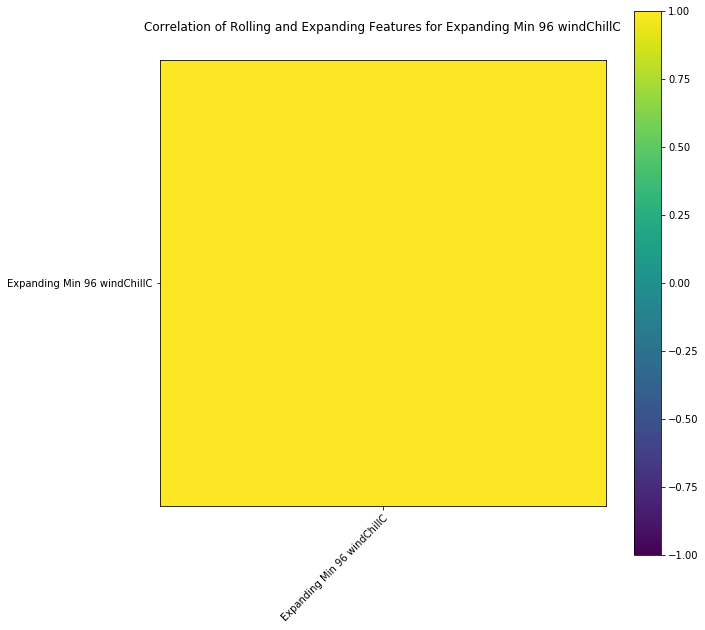

Expanding Max 96 windChillC
Rolling W Done
Expanding Done


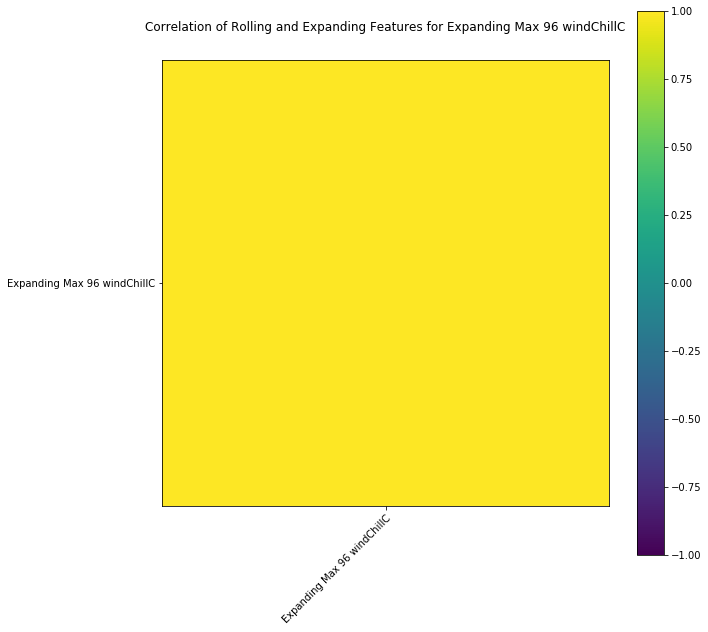

Expanding Sum 96 windChillC
Rolling W Done
Expanding Done


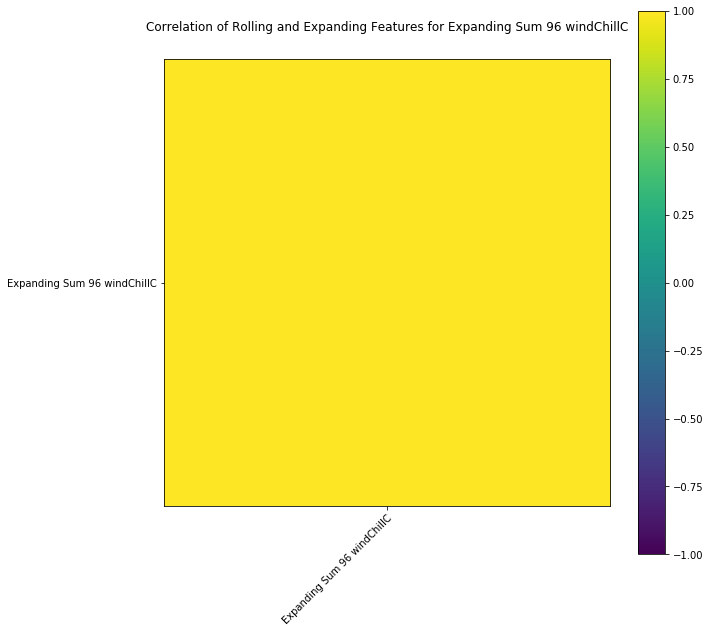

Expanding Mean 96 windChillC
Rolling W Done
Expanding Done


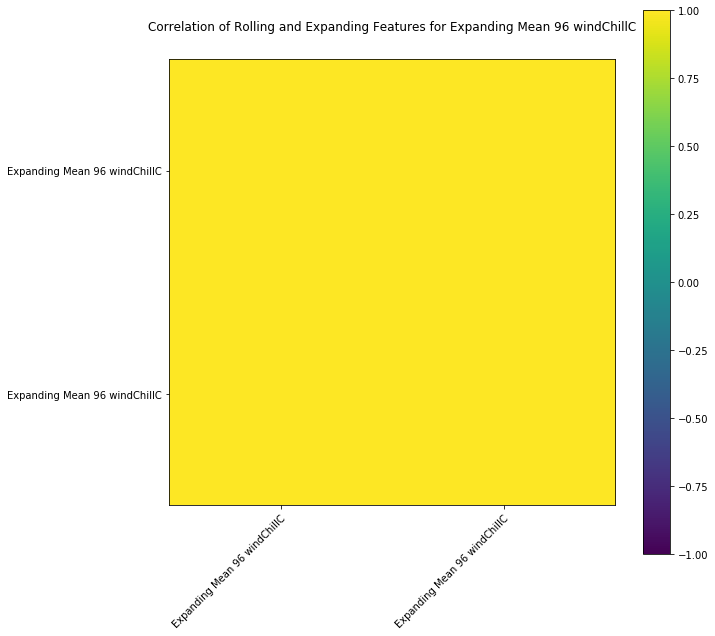

Expanding Min 2 windGustMiles
Rolling W Done
Expanding Done


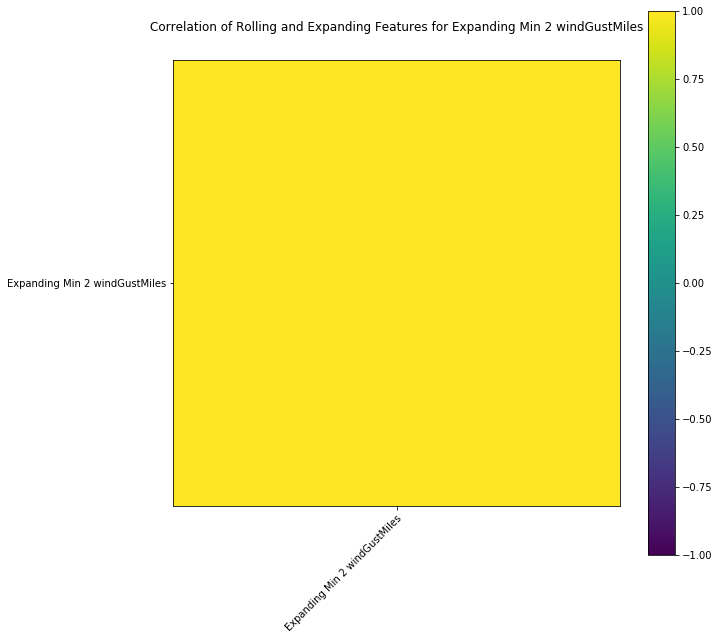

Expanding Max 2 windGustMiles
Rolling W Done
Expanding Done


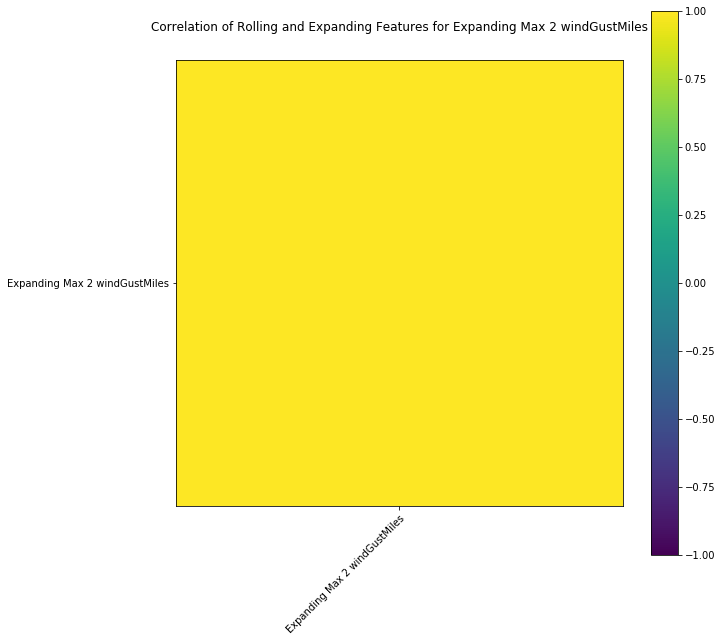

Expanding Sum 2 windGustMiles
Rolling W Done
Expanding Done


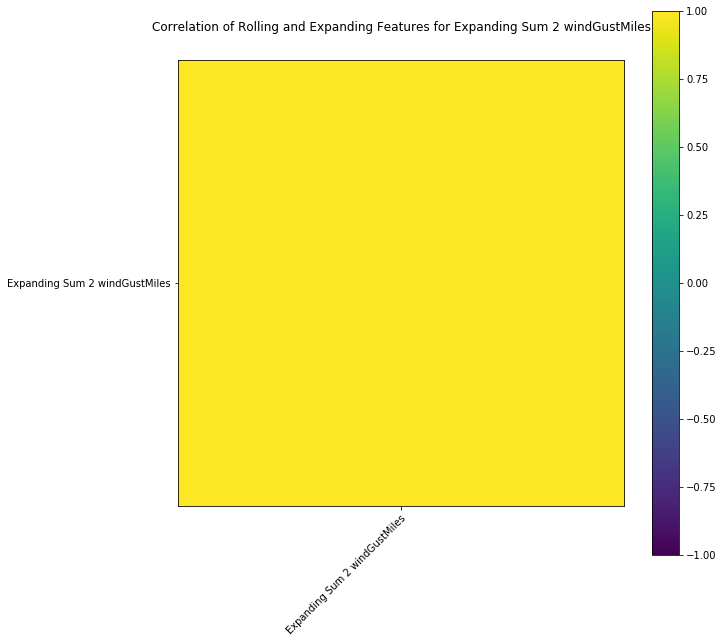

Expanding Mean 2 windGustMiles
Rolling W Done
Expanding Done


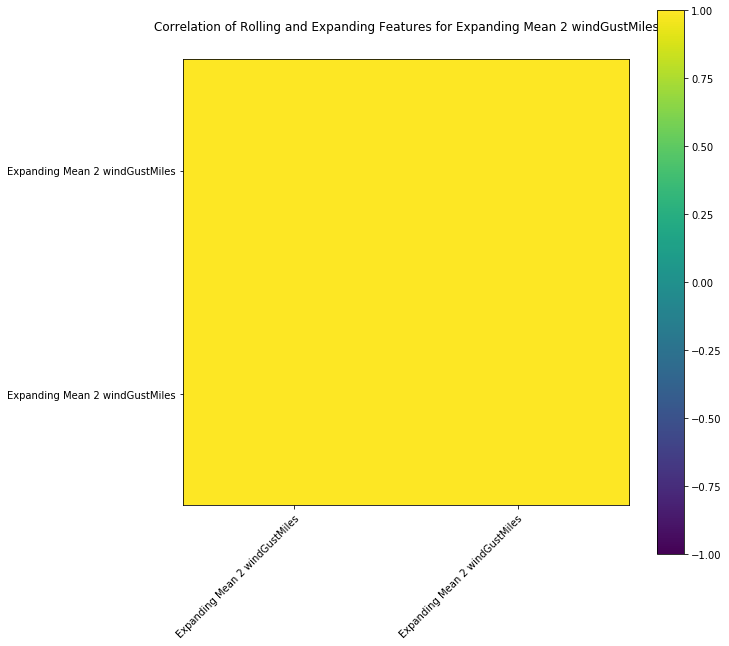

Expanding Min 3 windGustMiles
Rolling W Done
Expanding Done


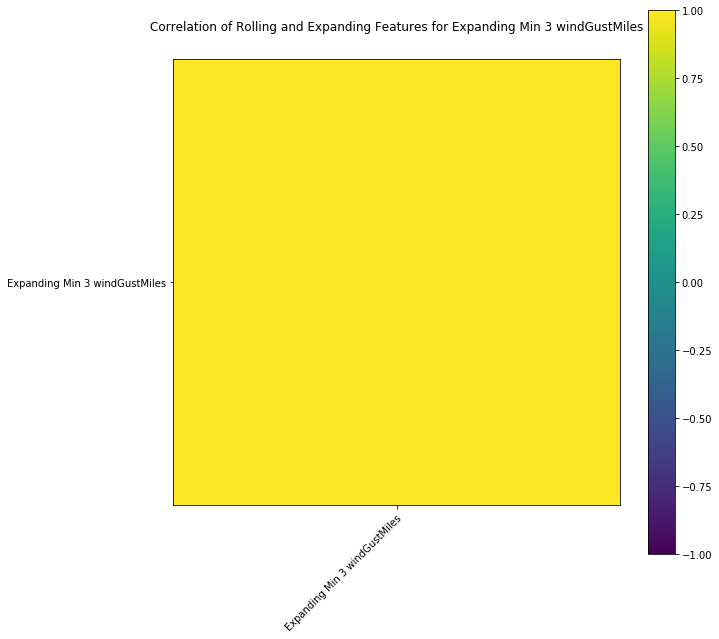

Expanding Max 3 windGustMiles
Rolling W Done
Expanding Done


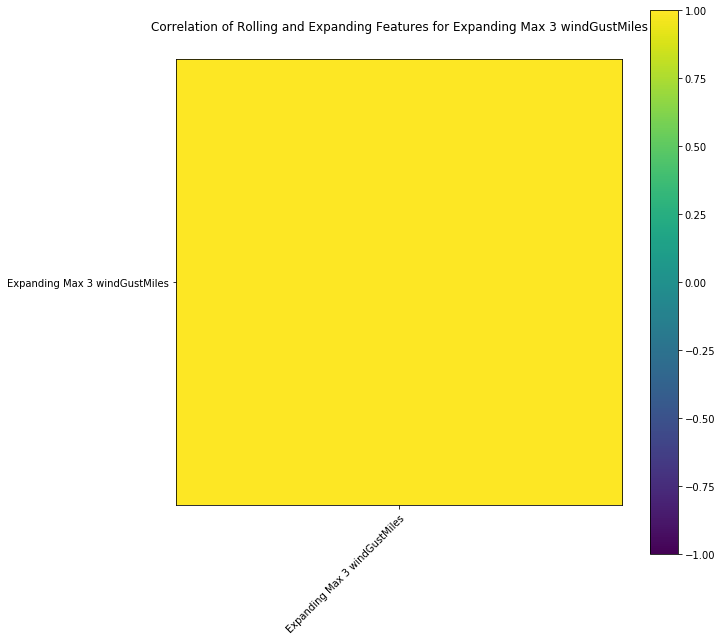

Expanding Sum 3 windGustMiles
Rolling W Done
Expanding Done


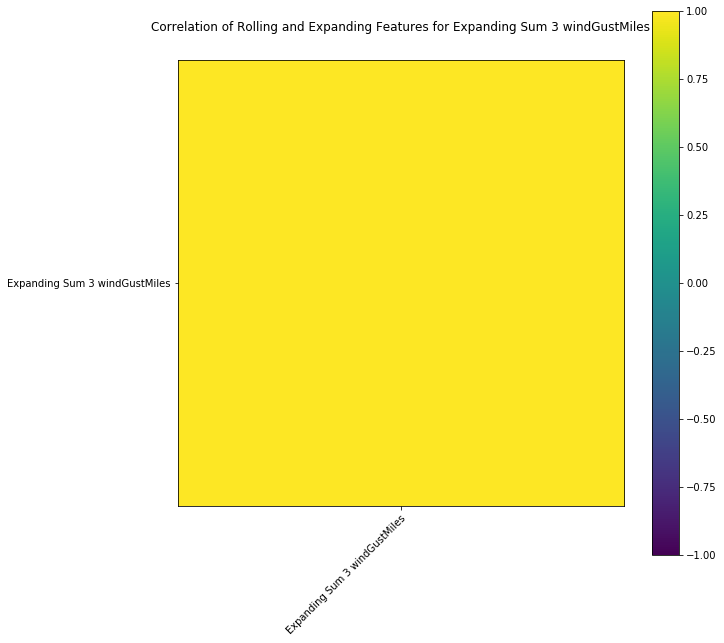

Expanding Mean 3 windGustMiles
Rolling W Done
Expanding Done


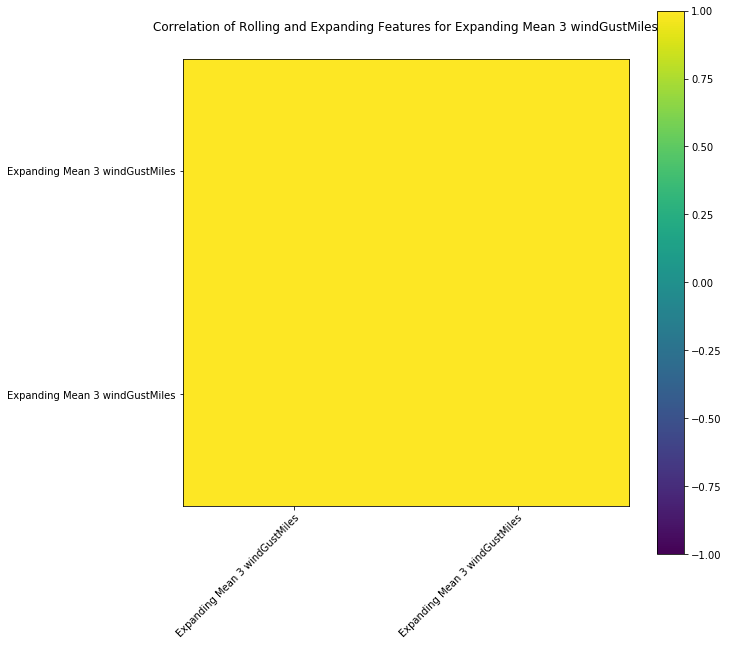

Expanding Min 4 windGustMiles
Rolling W Done
Expanding Done


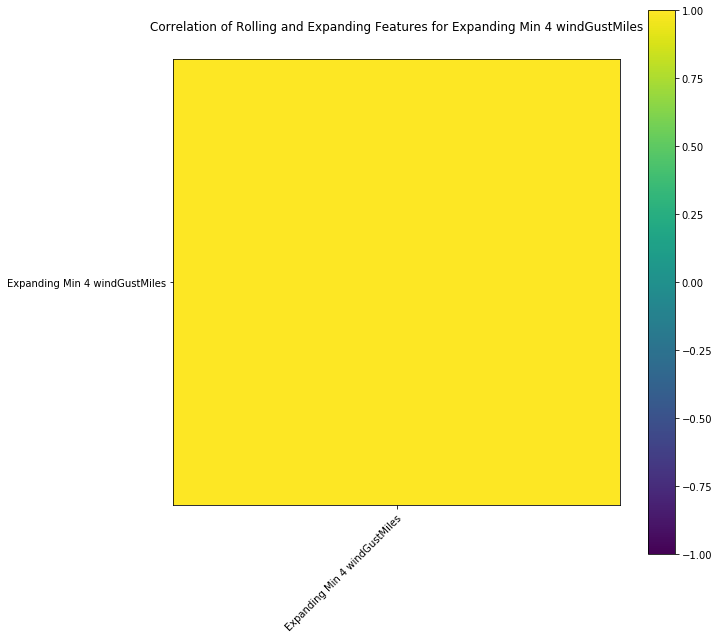

Expanding Max 4 windGustMiles
Rolling W Done
Expanding Done


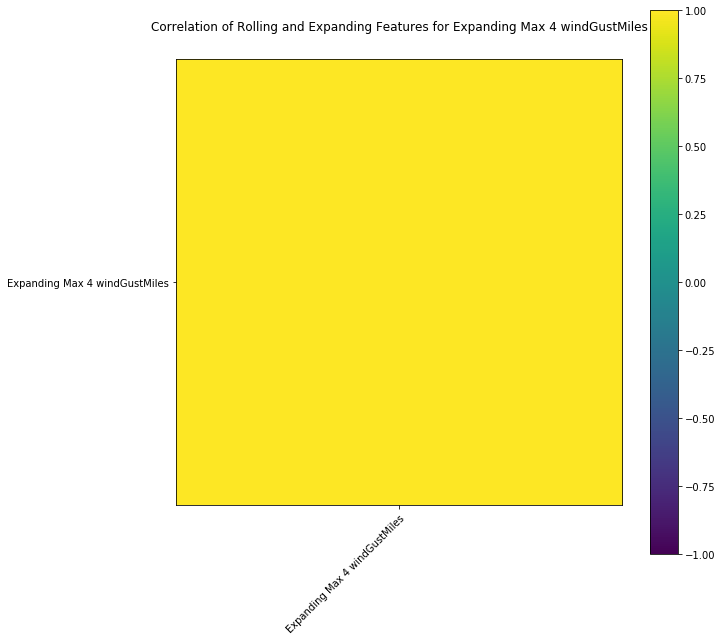

Expanding Sum 4 windGustMiles
Rolling W Done
Expanding Done


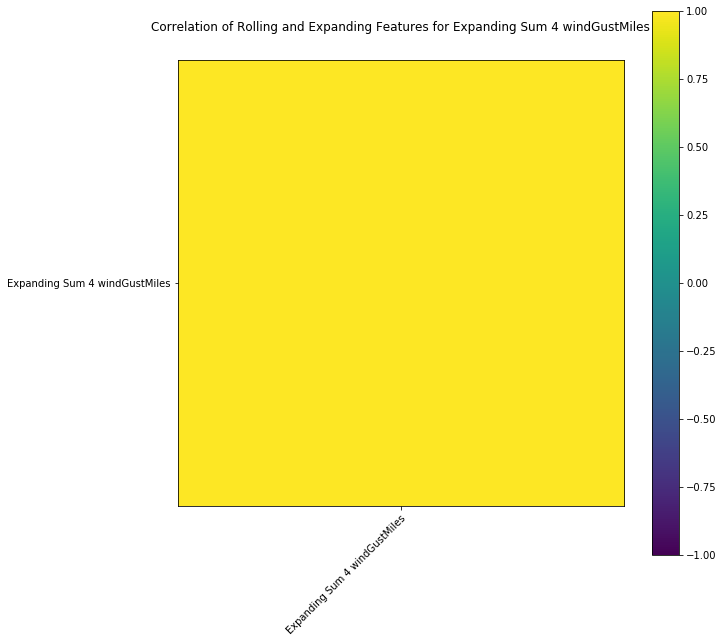

Expanding Mean 4 windGustMiles
Rolling W Done
Expanding Done


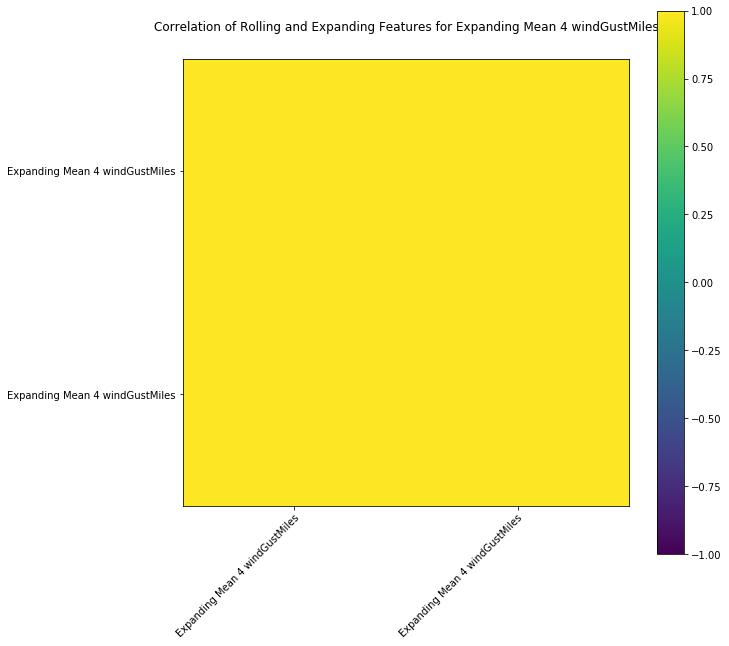

Expanding Min 8 windGustMiles
Rolling W Done
Expanding Done


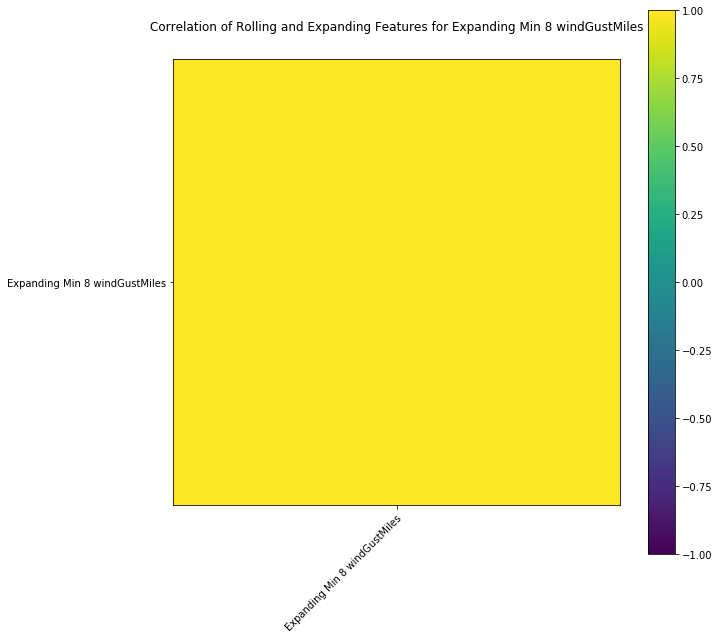

Expanding Max 8 windGustMiles
Rolling W Done
Expanding Done


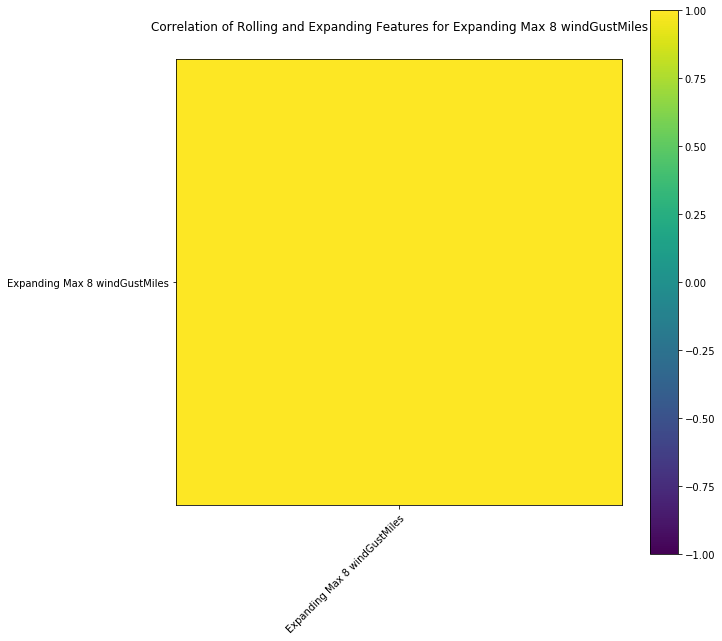

Expanding Sum 8 windGustMiles
Rolling W Done
Expanding Done


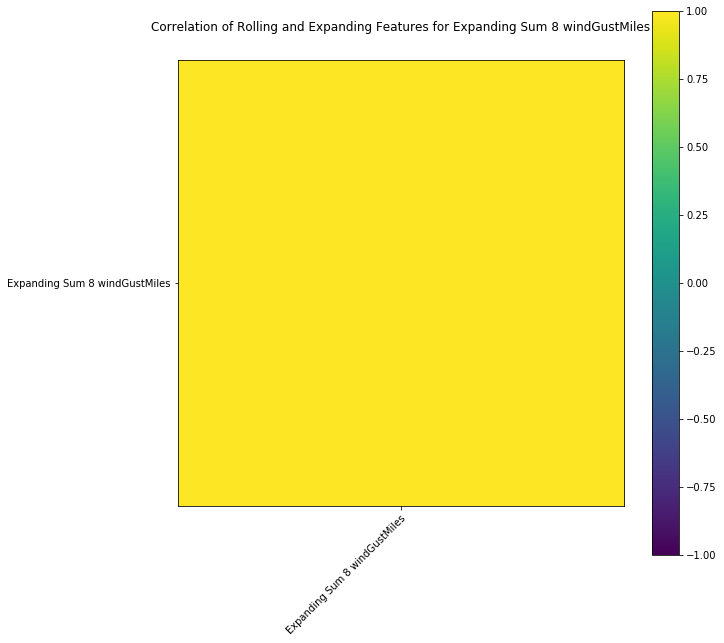

Expanding Mean 8 windGustMiles
Rolling W Done
Expanding Done


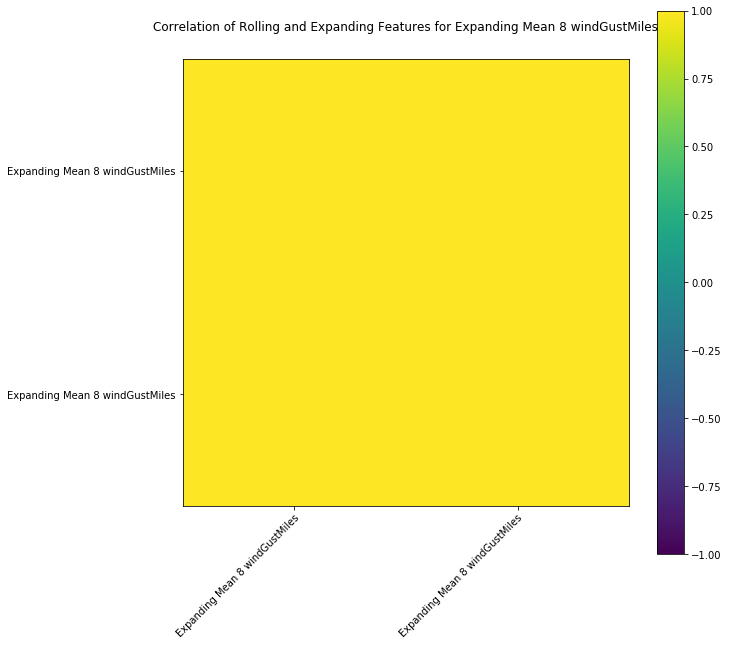

Expanding Min 12 windGustMiles
Rolling W Done
Expanding Done


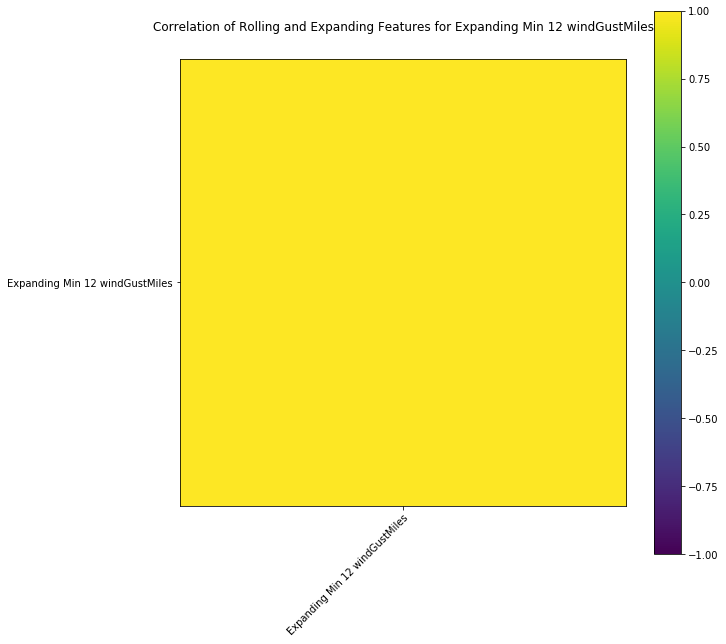

Expanding Max 12 windGustMiles
Rolling W Done
Expanding Done


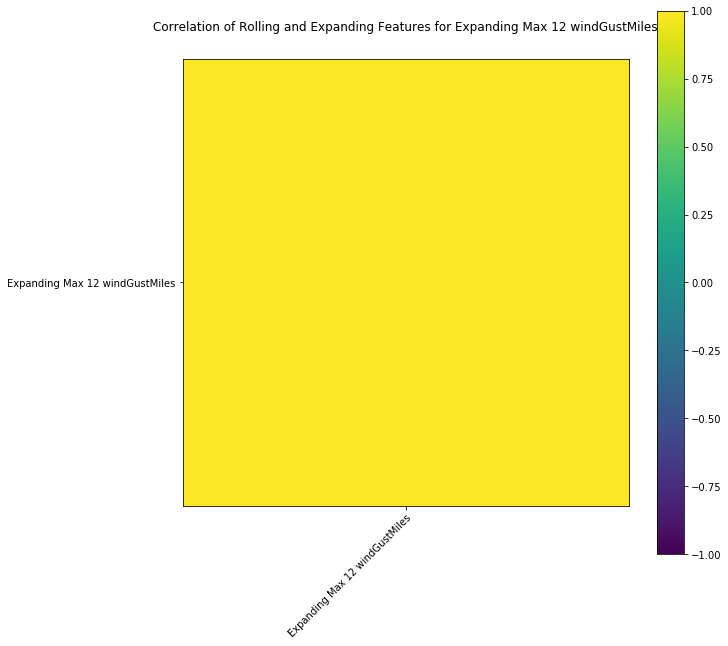

Expanding Sum 12 windGustMiles
Rolling W Done
Expanding Done


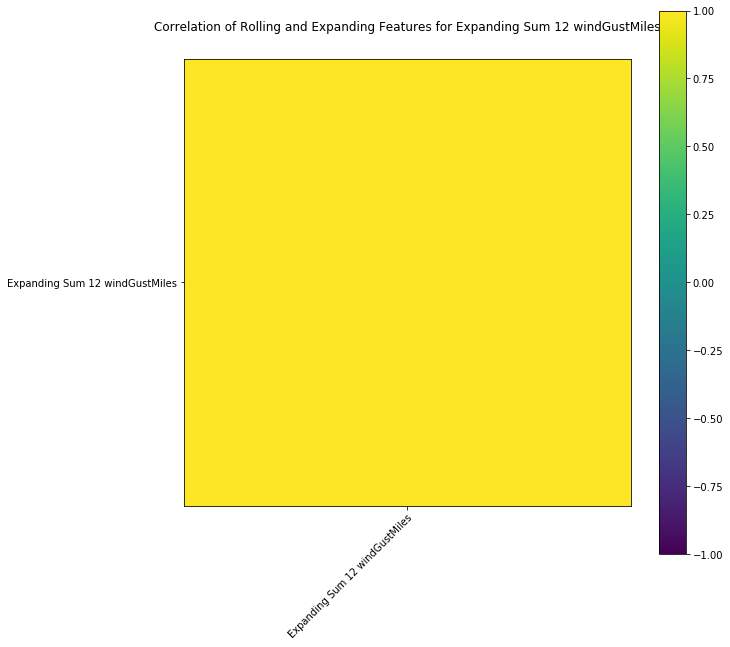

Expanding Mean 12 windGustMiles
Rolling W Done
Expanding Done


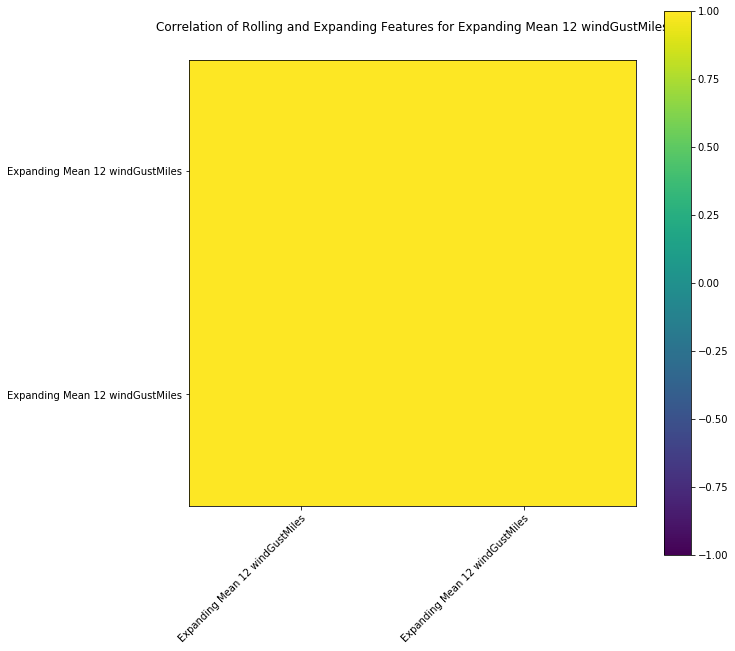

Expanding Min 16 windGustMiles
Rolling W Done
Expanding Done


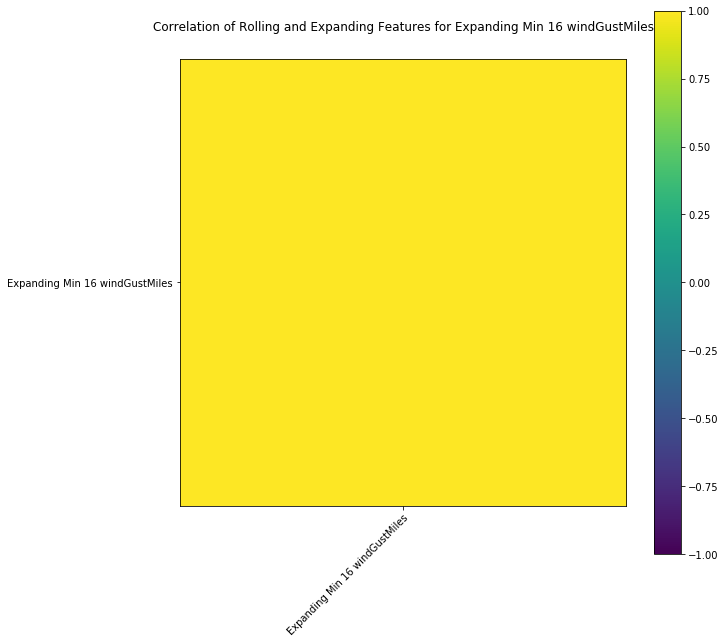

Expanding Max 16 windGustMiles
Rolling W Done
Expanding Done


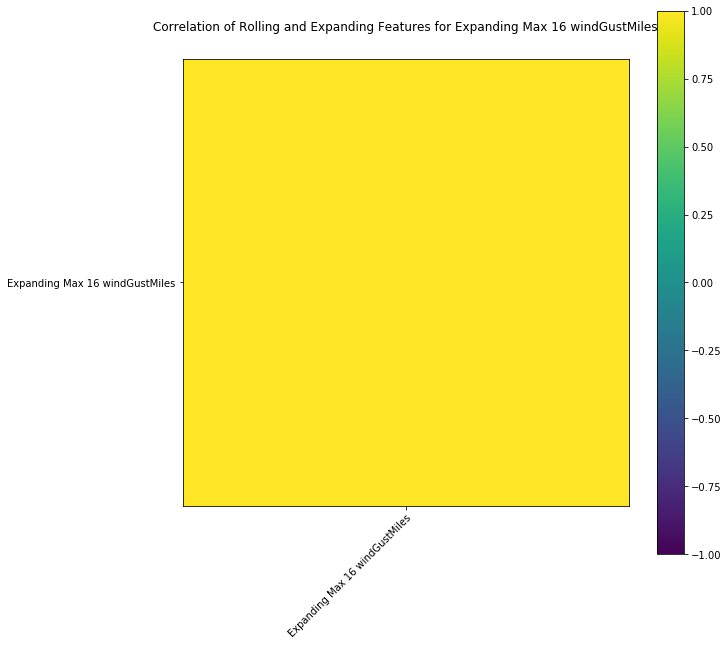

Expanding Sum 16 windGustMiles
Rolling W Done
Expanding Done


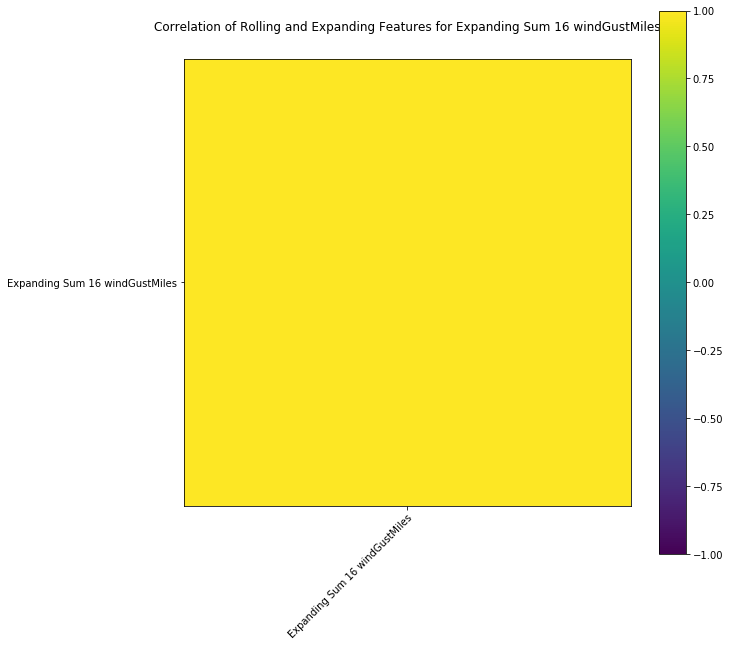

Expanding Mean 16 windGustMiles
Rolling W Done
Expanding Done


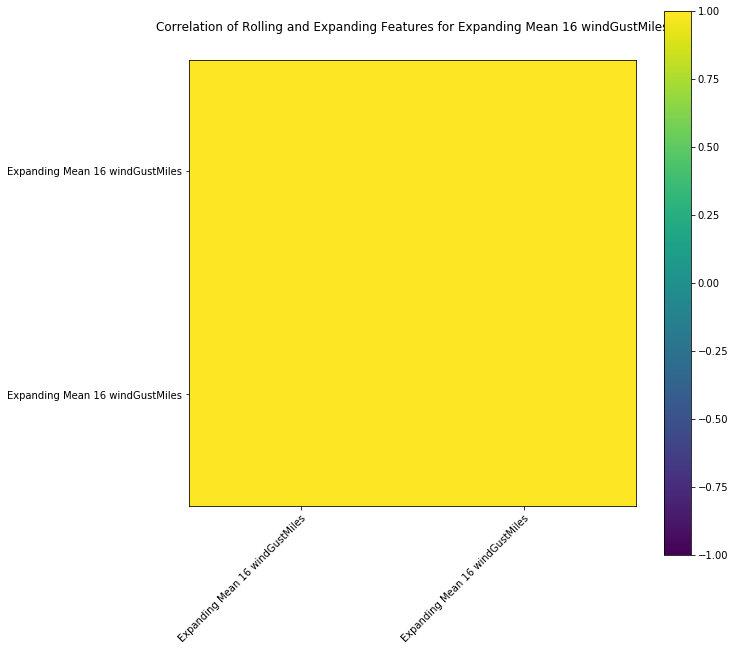

Expanding Min 24 windGustMiles
Rolling W Done
Expanding Done


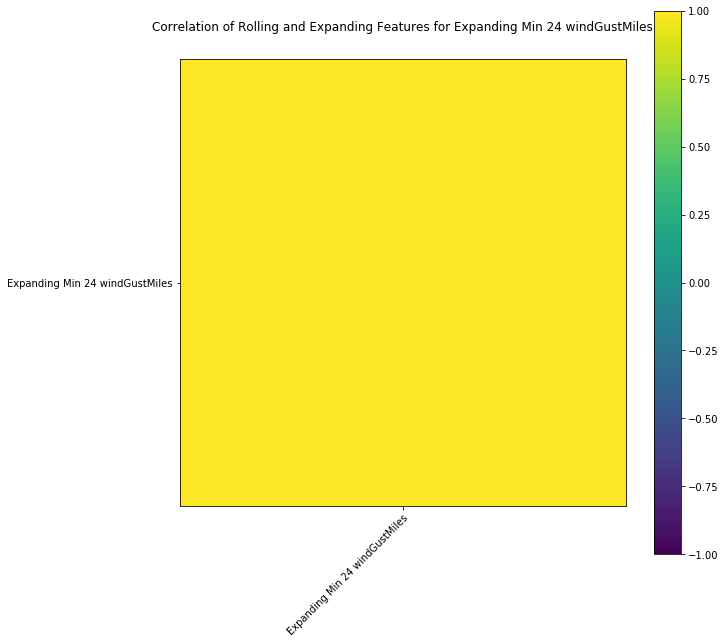

Expanding Max 24 windGustMiles
Rolling W Done
Expanding Done


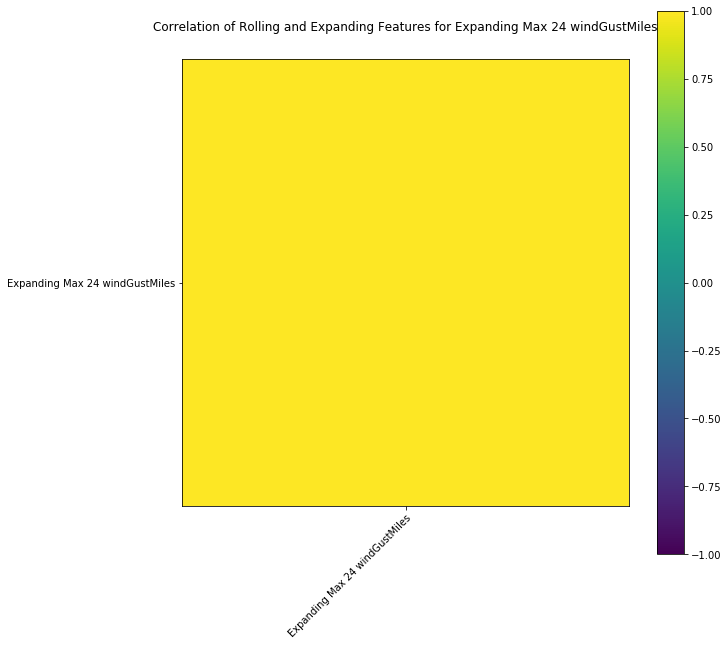

Expanding Sum 24 windGustMiles
Rolling W Done
Expanding Done


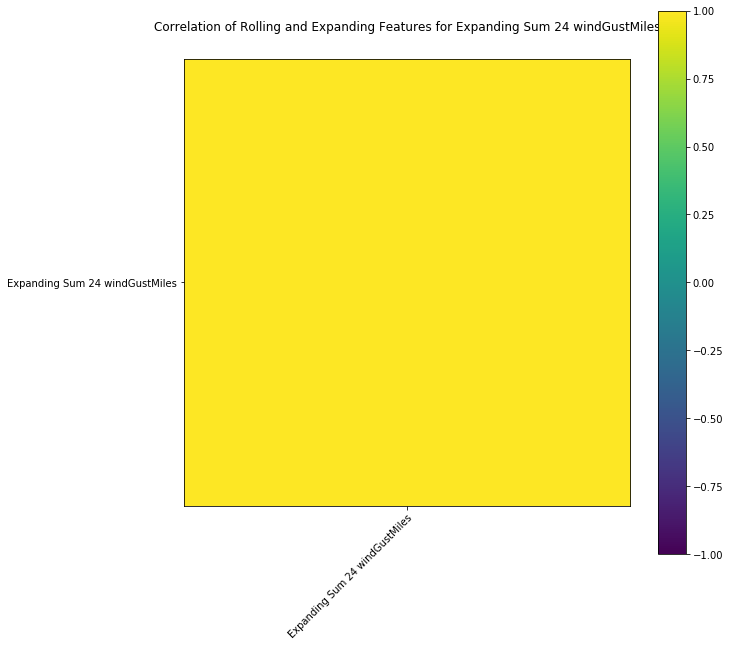

Expanding Mean 24 windGustMiles
Rolling W Done
Expanding Done


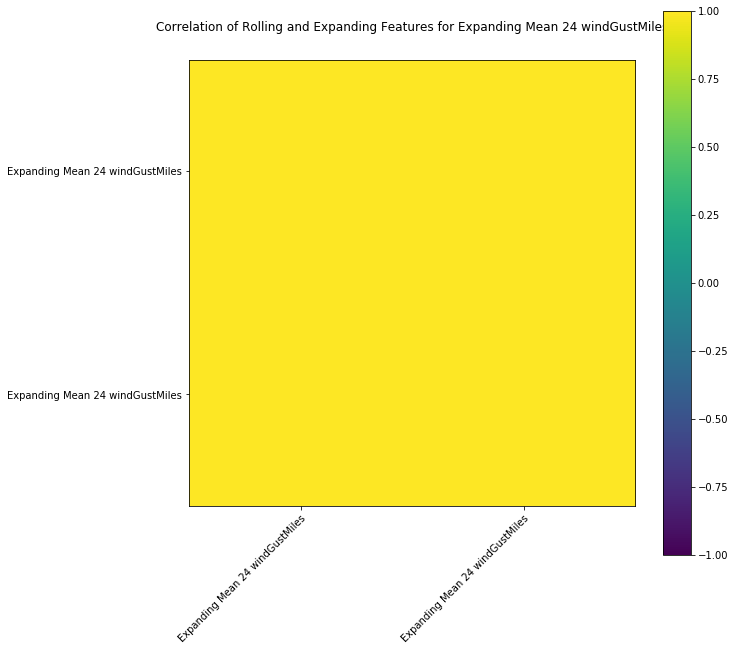

Expanding Min 48 windGustMiles
Rolling W Done
Expanding Done


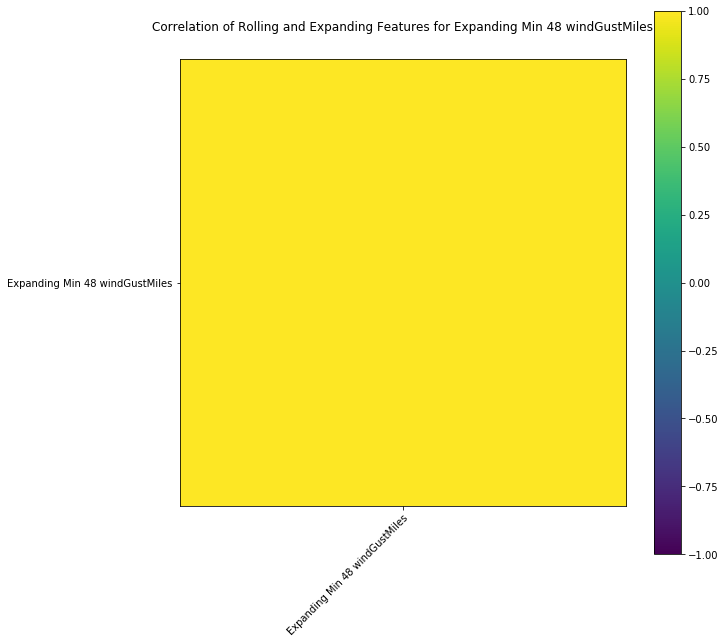

Expanding Max 48 windGustMiles
Rolling W Done
Expanding Done


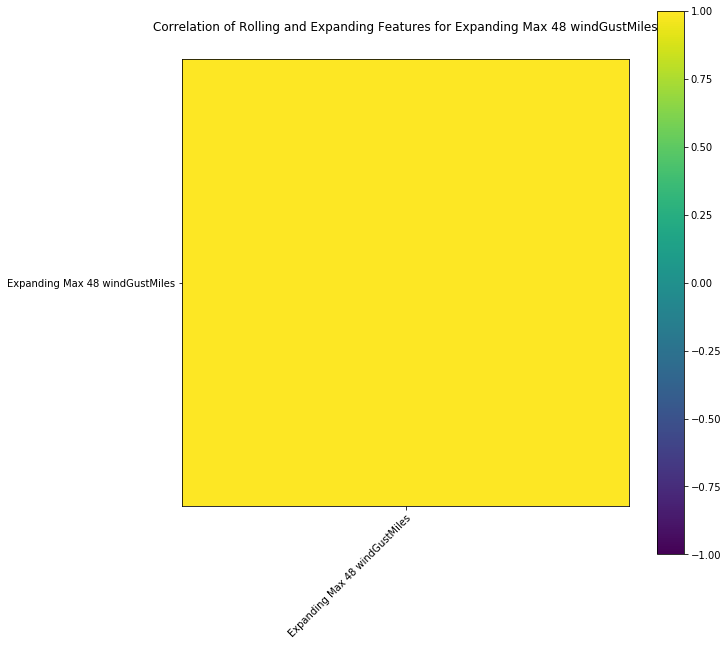

Expanding Sum 48 windGustMiles
Rolling W Done
Expanding Done


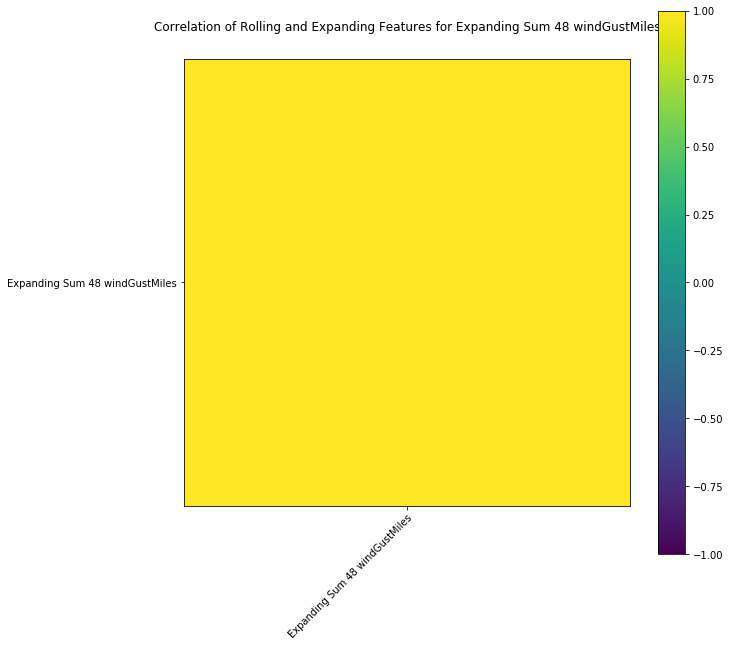

Expanding Mean 48 windGustMiles
Rolling W Done
Expanding Done


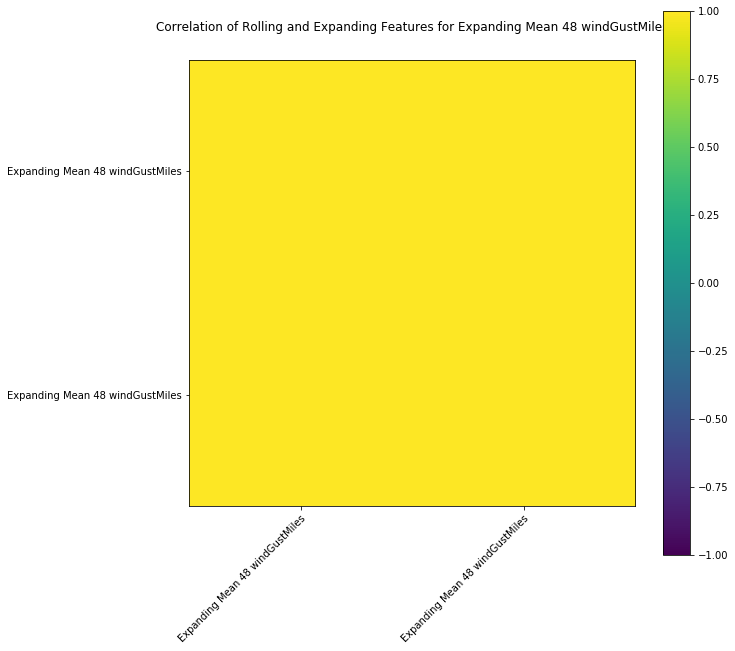

Expanding Min 96 windGustMiles
Rolling W Done
Expanding Done


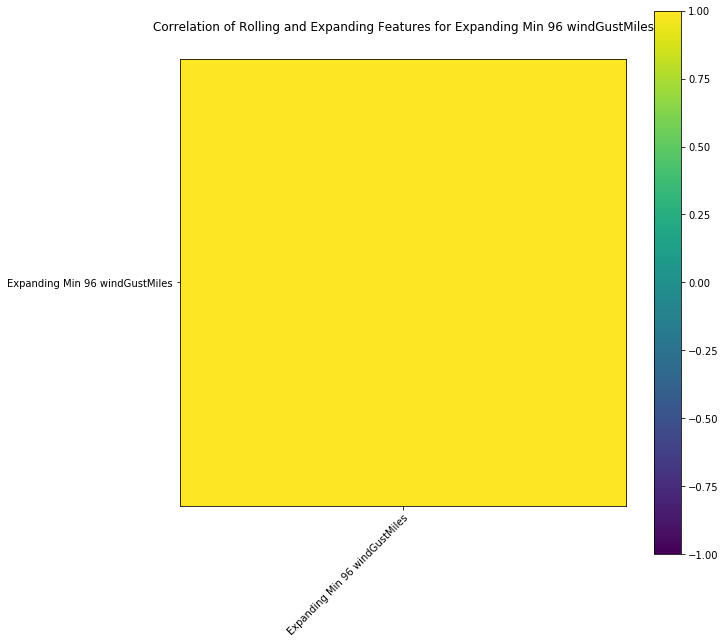

Expanding Max 96 windGustMiles
Rolling W Done
Expanding Done


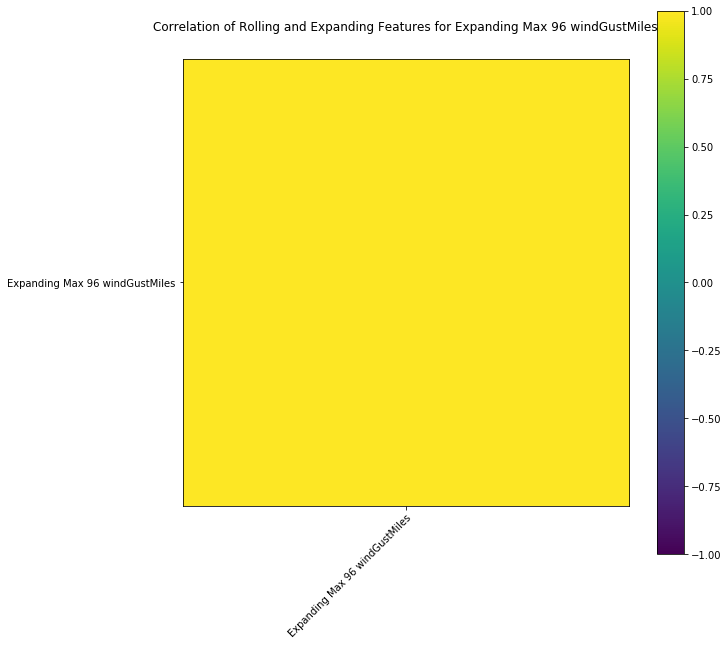

Expanding Sum 96 windGustMiles
Rolling W Done
Expanding Done


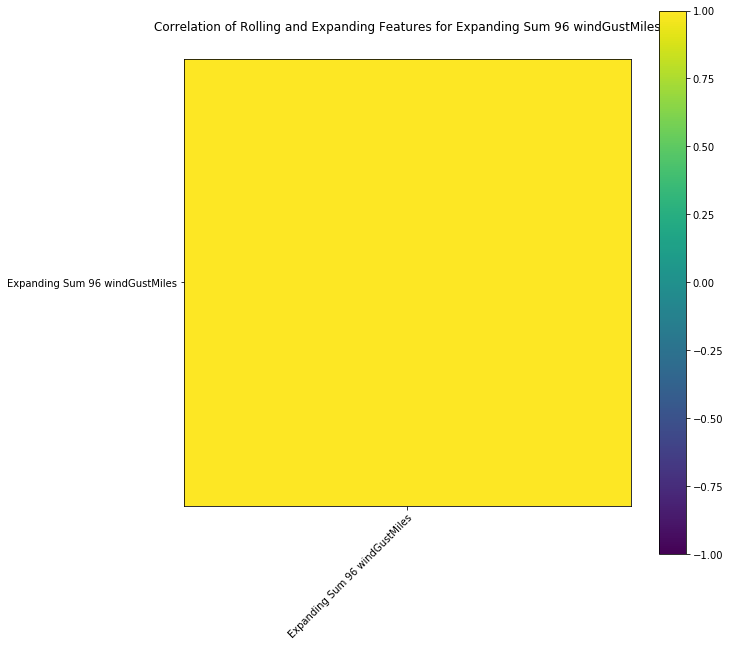

Expanding Mean 96 windGustMiles
Rolling W Done
Expanding Done


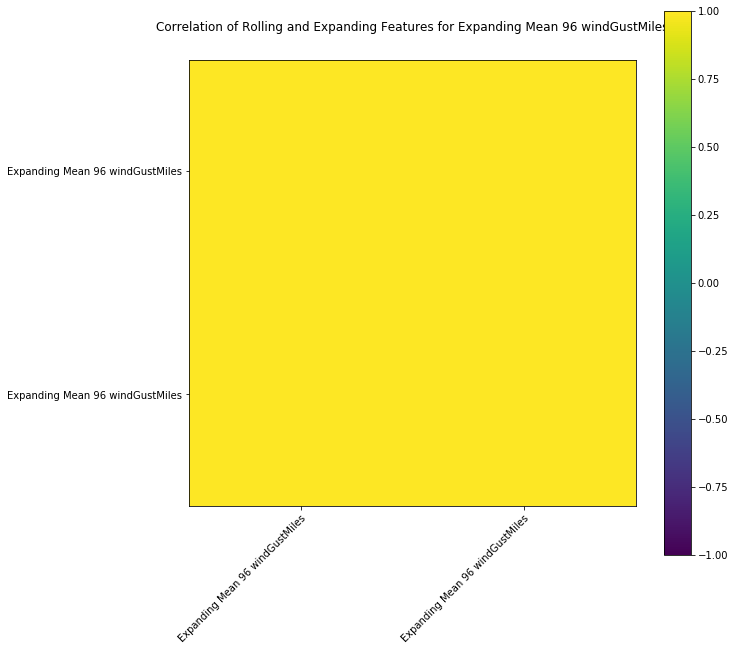

Expanding Min 2 feelsLikeC
Rolling W Done
Expanding Done


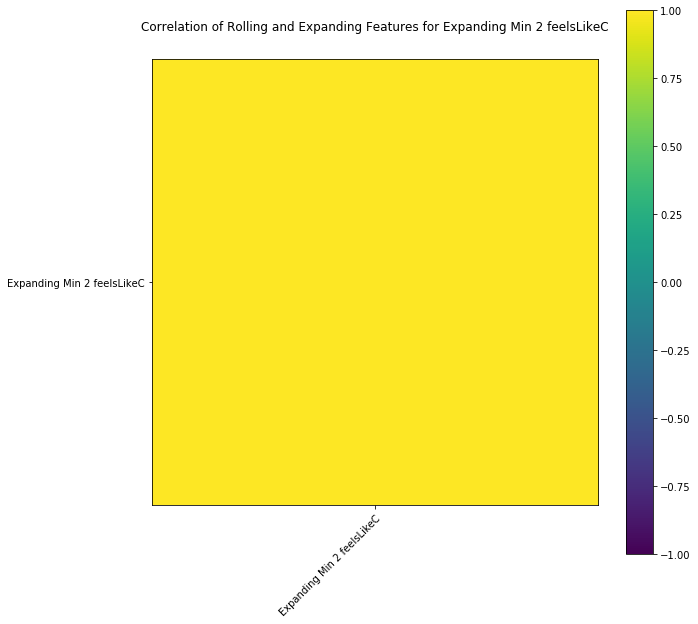

Expanding Max 2 feelsLikeC
Rolling W Done
Expanding Done


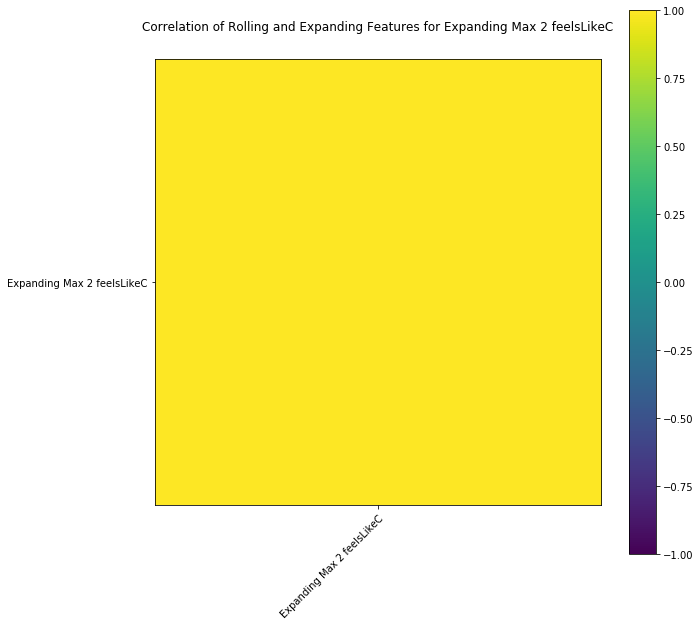

Expanding Sum 2 feelsLikeC
Rolling W Done
Expanding Done


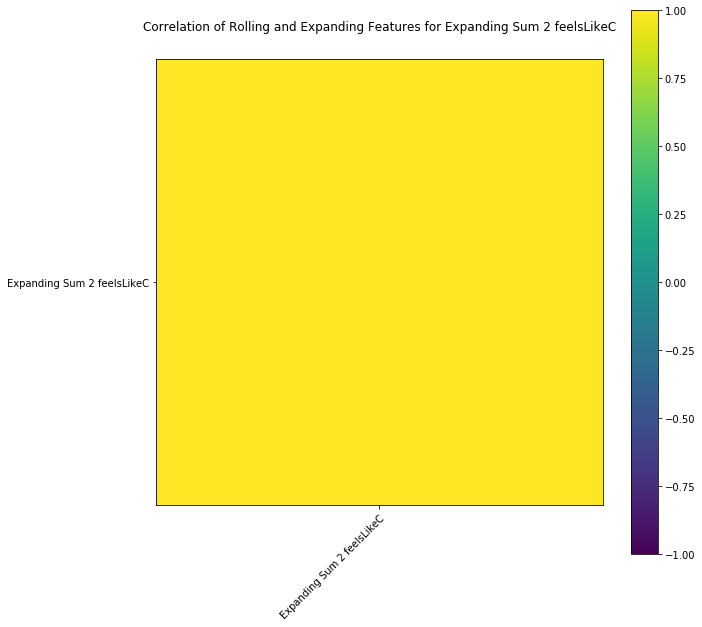

Expanding Mean 2 feelsLikeC
Rolling W Done
Expanding Done


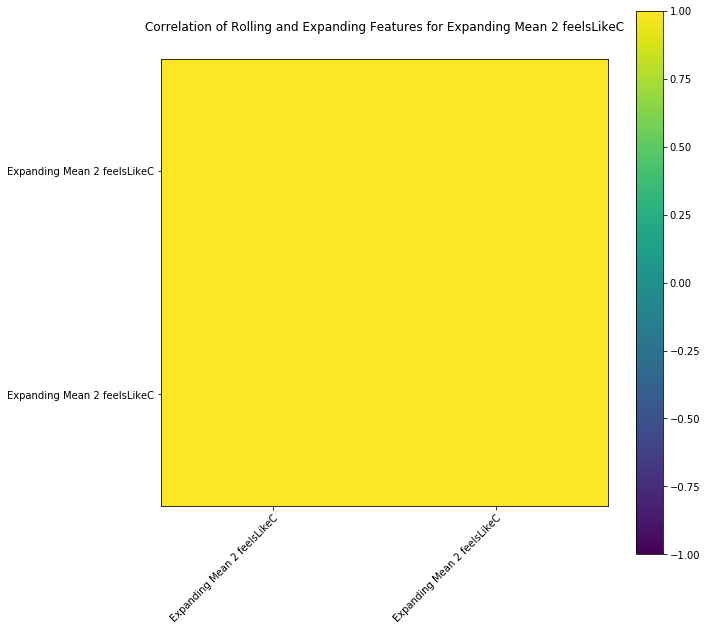

Expanding Min 3 feelsLikeC
Rolling W Done
Expanding Done


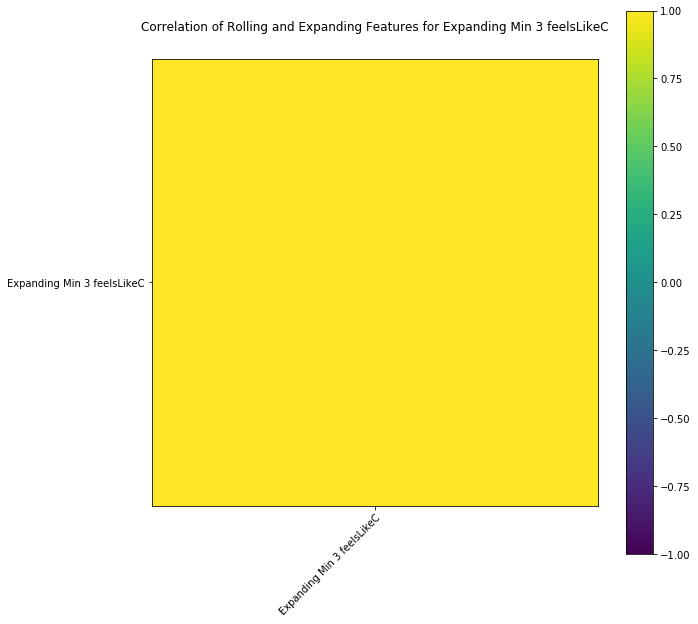

Expanding Max 3 feelsLikeC
Rolling W Done
Expanding Done


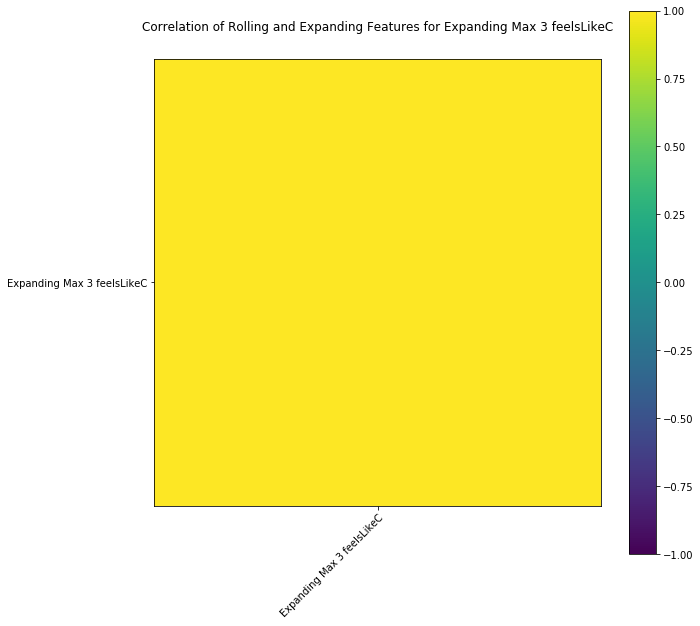

Expanding Sum 3 feelsLikeC
Rolling W Done
Expanding Done


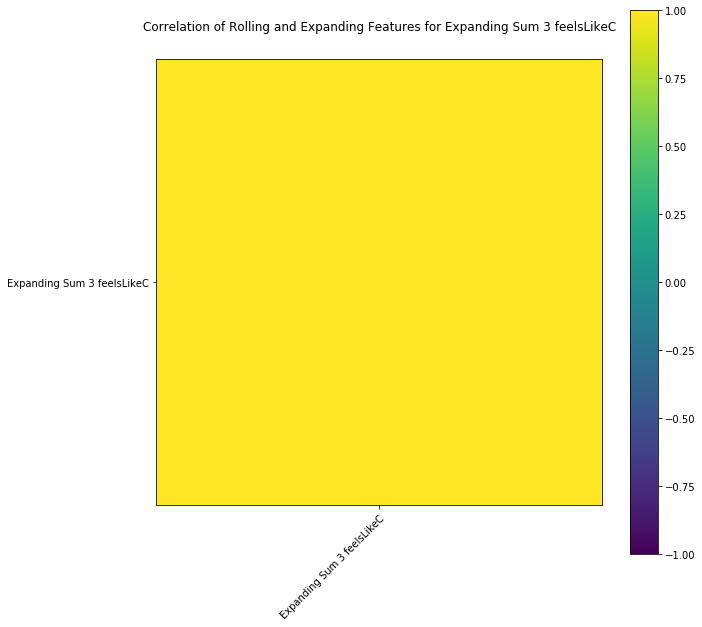

Expanding Mean 3 feelsLikeC
Rolling W Done
Expanding Done


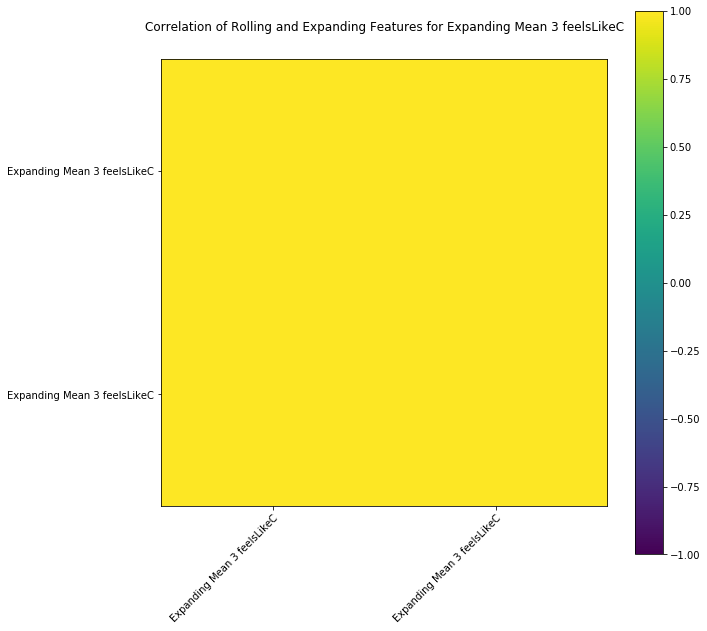

Expanding Min 4 feelsLikeC
Rolling W Done
Expanding Done


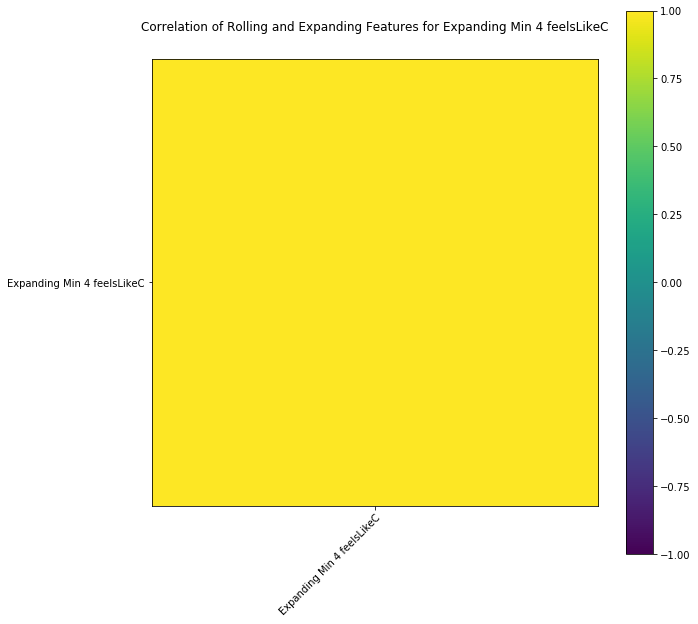

Expanding Max 4 feelsLikeC
Rolling W Done
Expanding Done


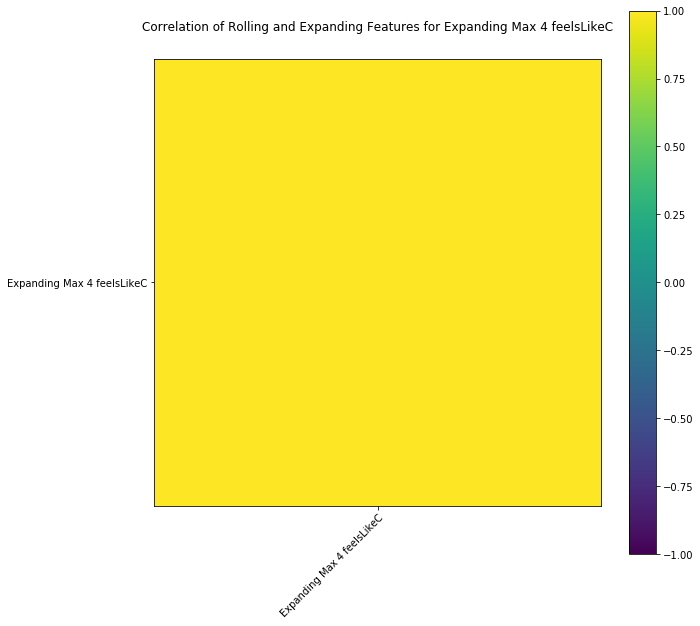

Expanding Sum 4 feelsLikeC
Rolling W Done
Expanding Done


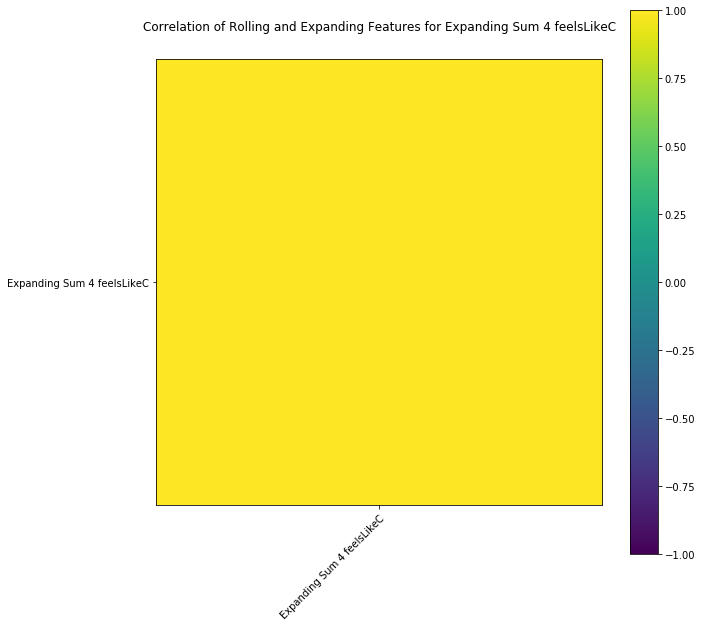

Expanding Mean 4 feelsLikeC
Rolling W Done
Expanding Done


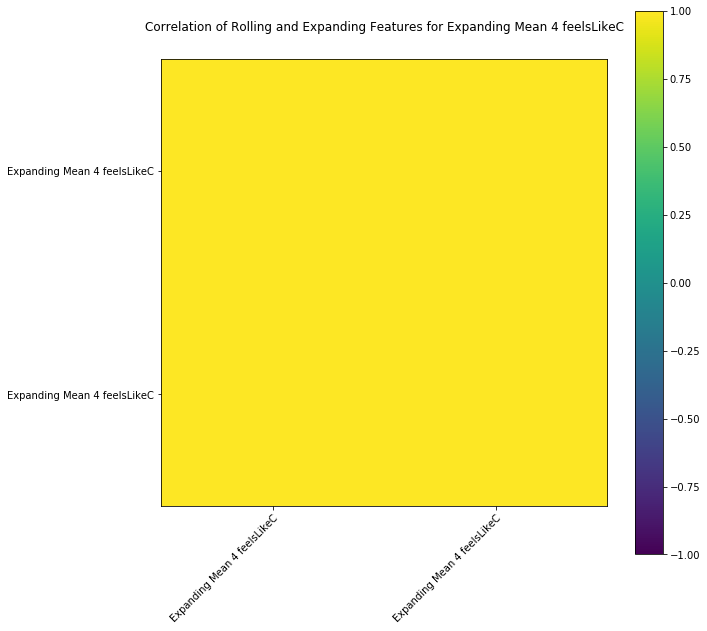

Expanding Min 8 feelsLikeC
Rolling W Done
Expanding Done


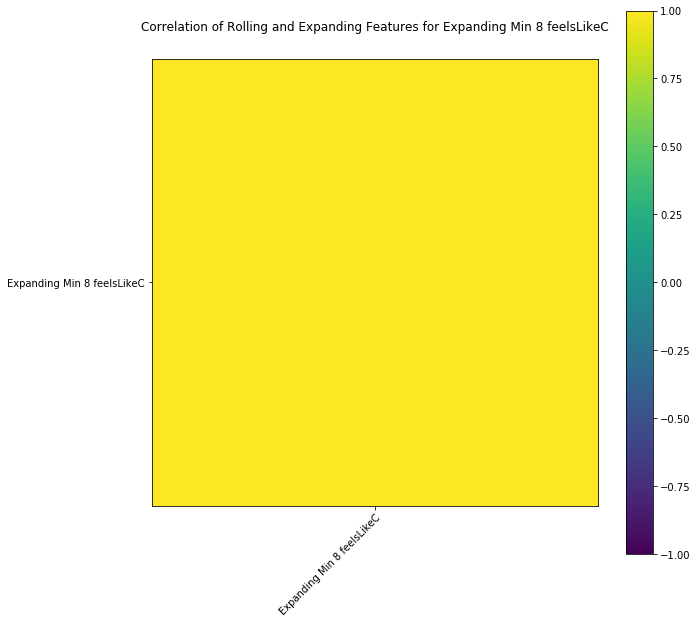

Expanding Max 8 feelsLikeC
Rolling W Done
Expanding Done


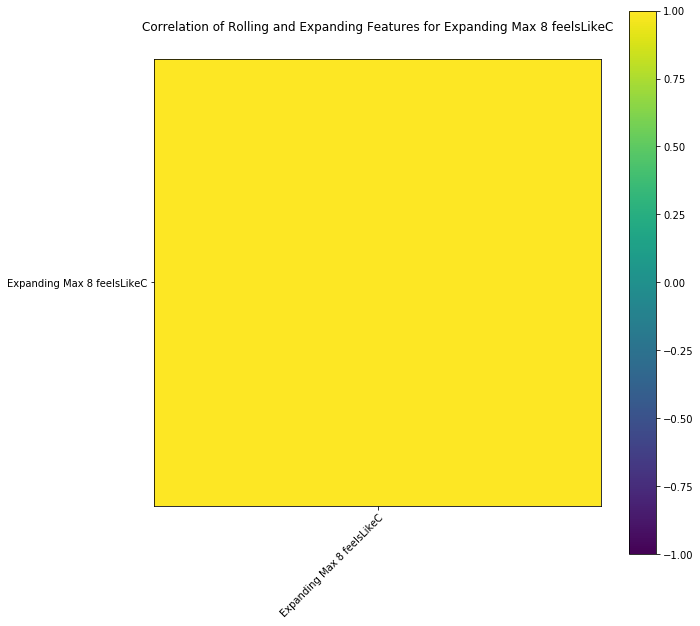

Expanding Sum 8 feelsLikeC
Rolling W Done
Expanding Done


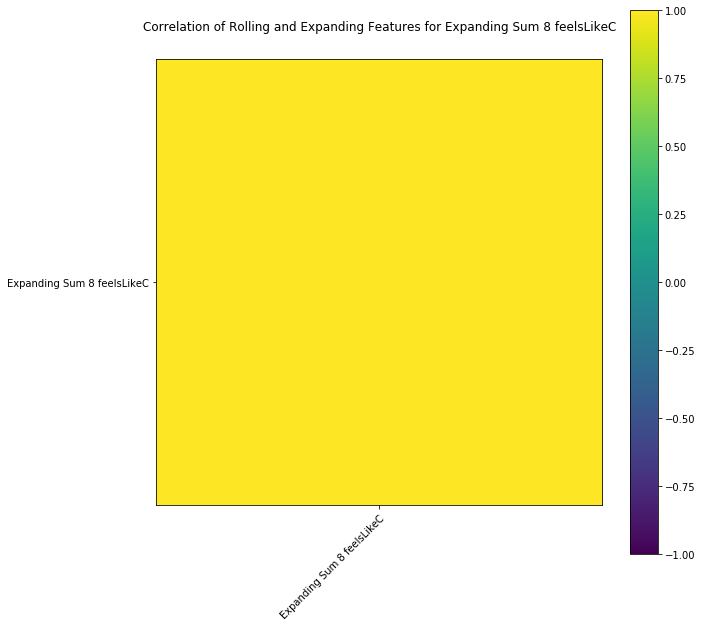

Expanding Mean 8 feelsLikeC
Rolling W Done
Expanding Done


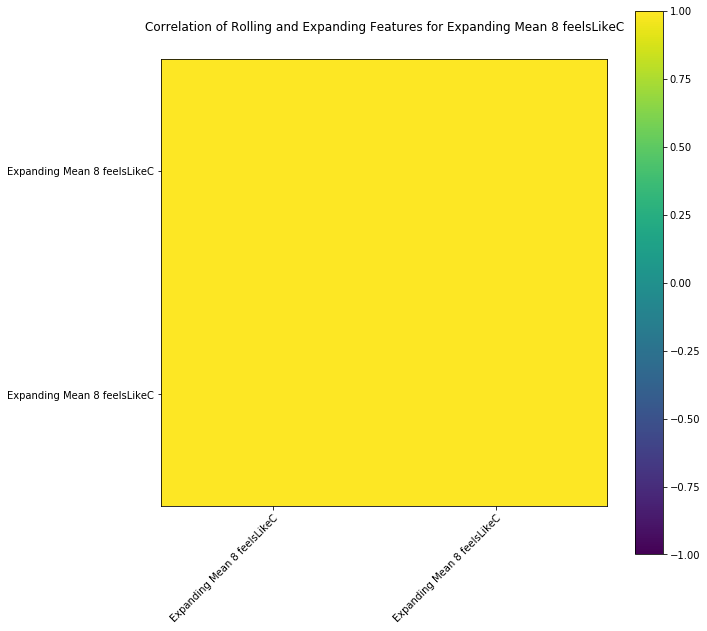

Expanding Min 12 feelsLikeC
Rolling W Done
Expanding Done


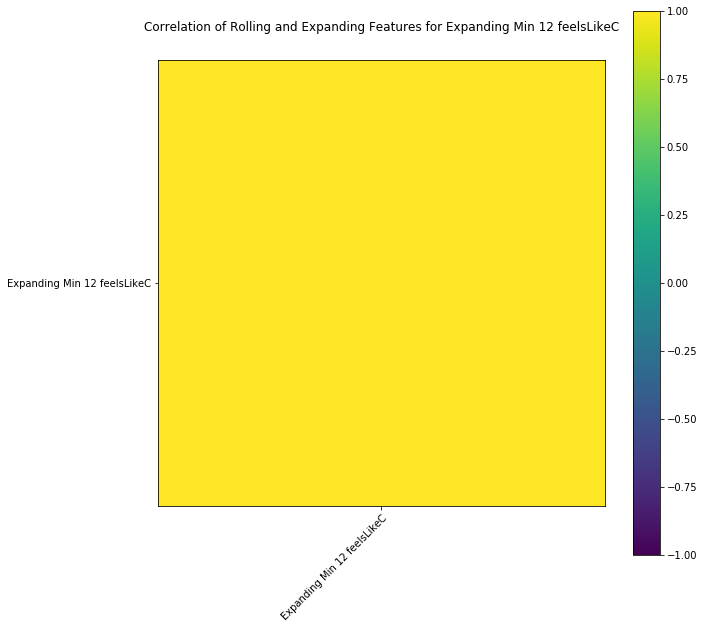

Expanding Max 12 feelsLikeC
Rolling W Done
Expanding Done


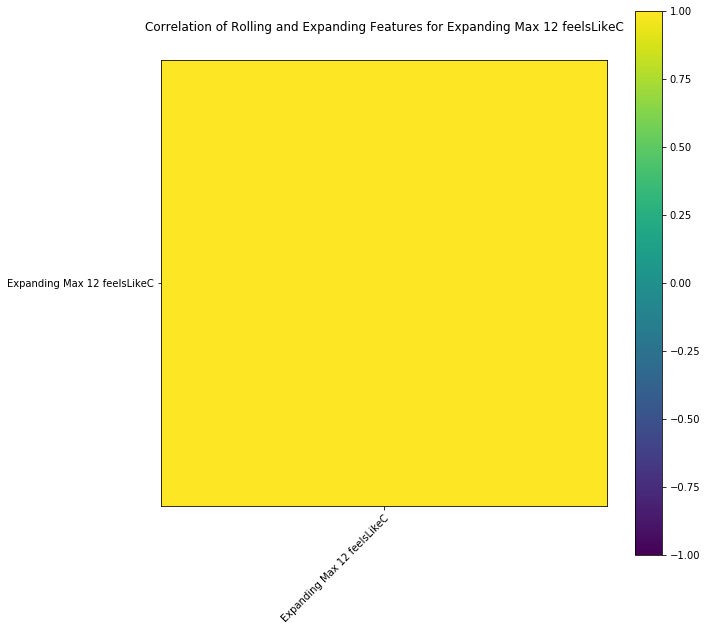

Expanding Sum 12 feelsLikeC
Rolling W Done
Expanding Done


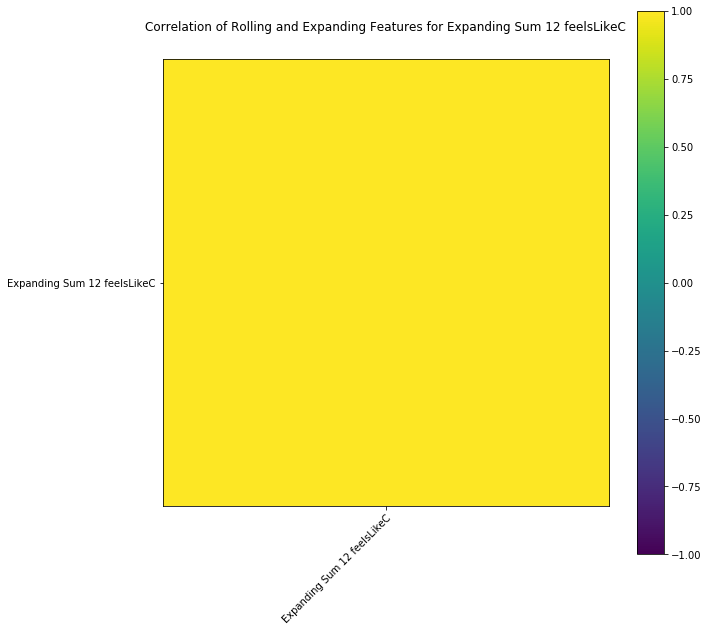

Expanding Mean 12 feelsLikeC
Rolling W Done
Expanding Done


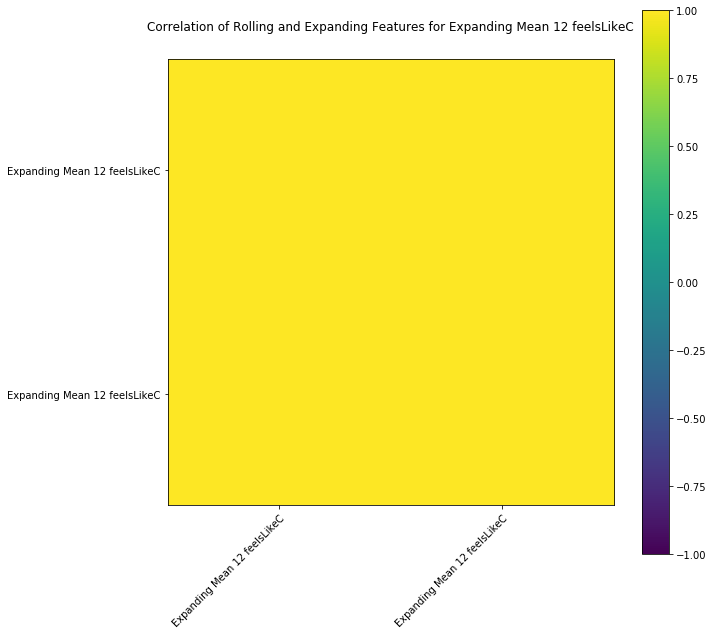

Expanding Min 16 feelsLikeC
Rolling W Done
Expanding Done


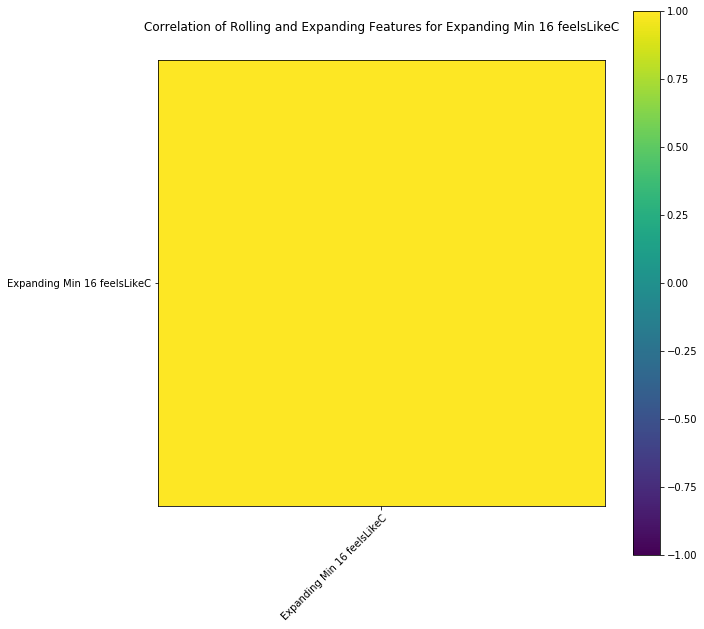

Expanding Max 16 feelsLikeC
Rolling W Done
Expanding Done


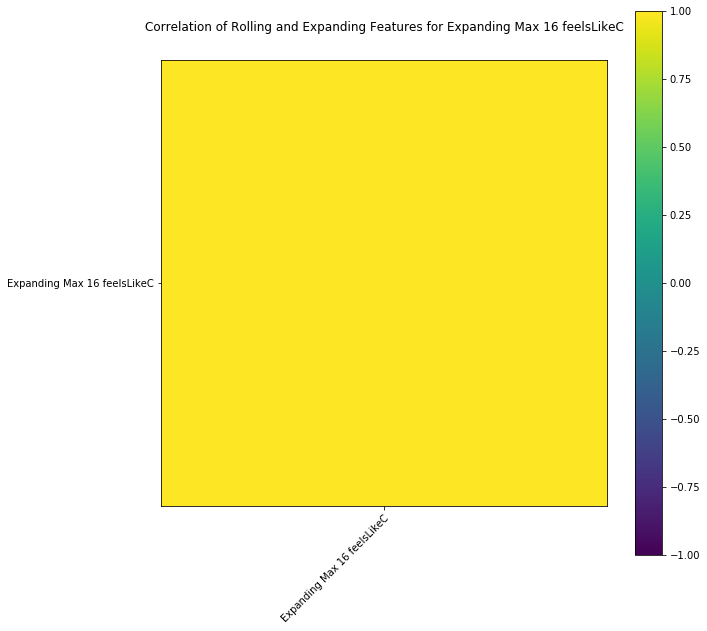

Expanding Sum 16 feelsLikeC
Rolling W Done
Expanding Done


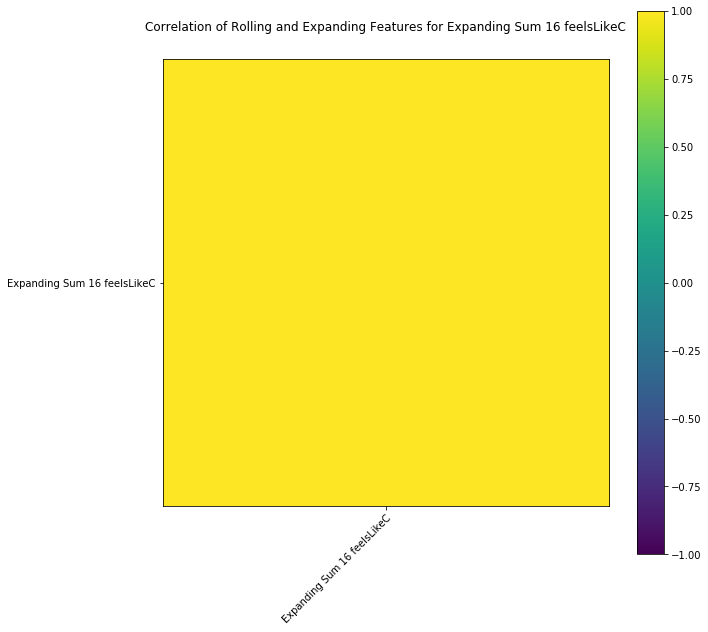

Expanding Mean 16 feelsLikeC
Rolling W Done
Expanding Done


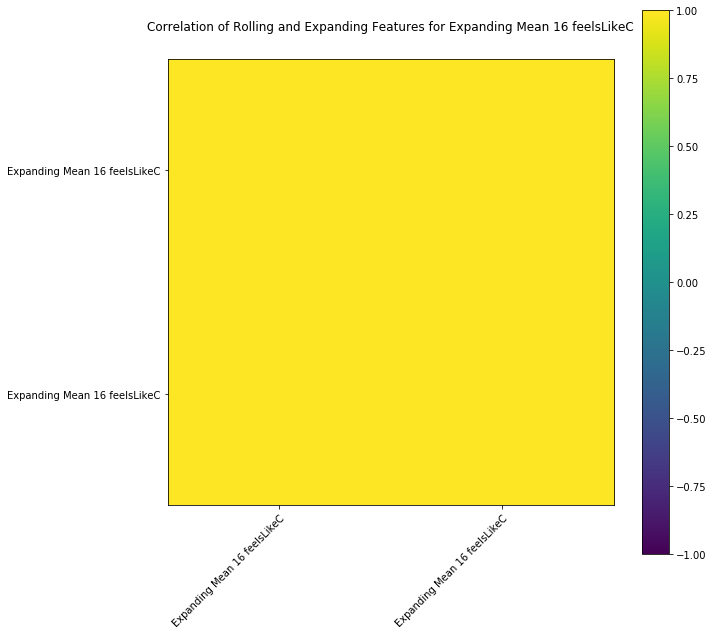

Expanding Min 24 feelsLikeC
Rolling W Done
Expanding Done


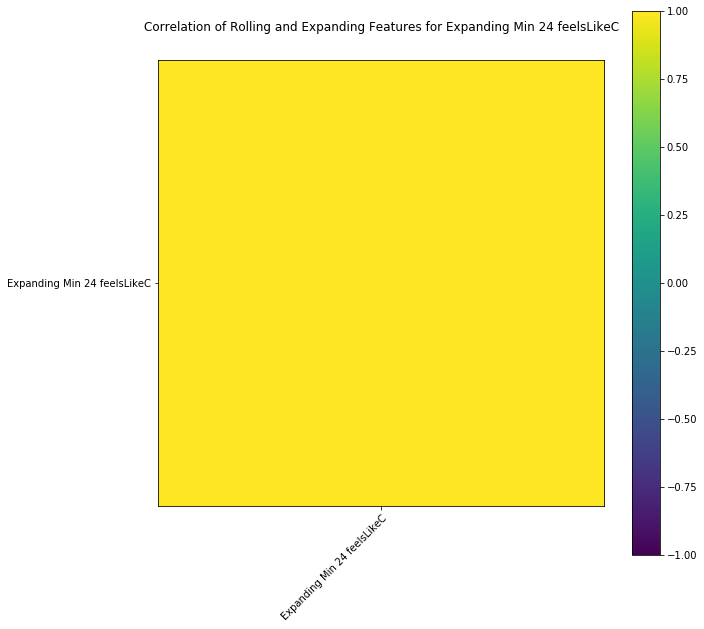

Expanding Max 24 feelsLikeC
Rolling W Done
Expanding Done


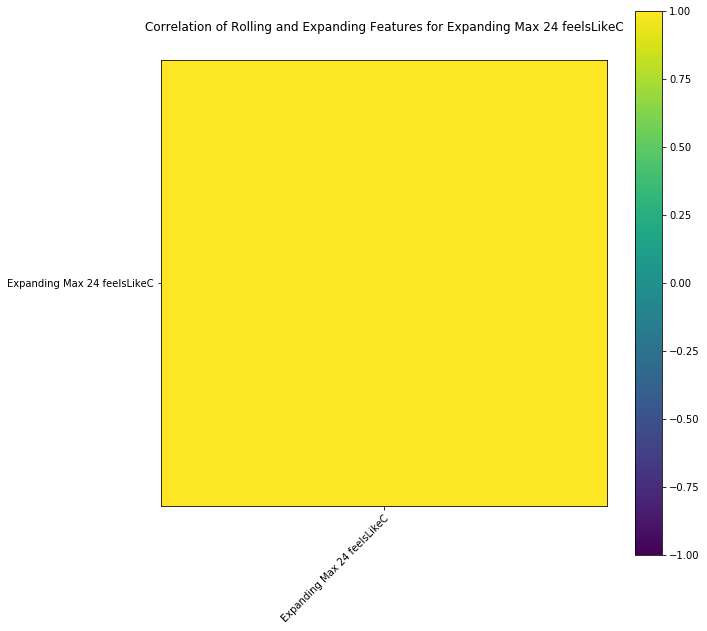

Expanding Sum 24 feelsLikeC
Rolling W Done
Expanding Done


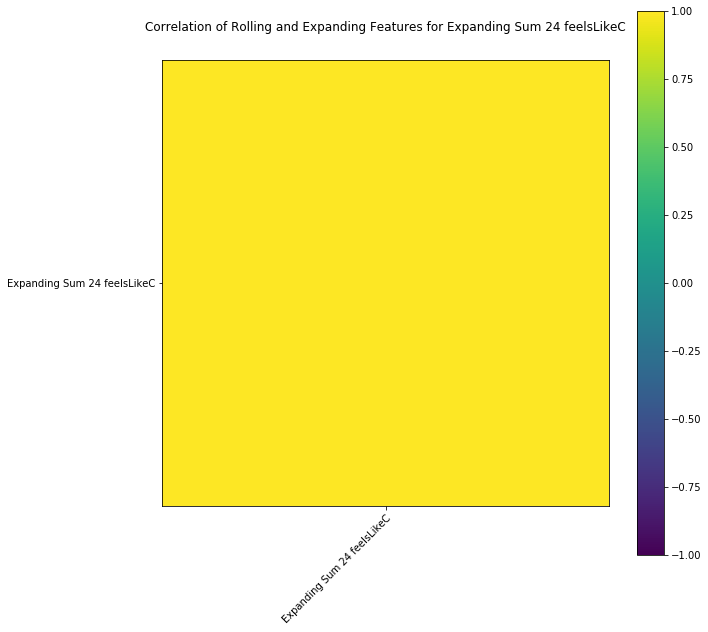

Expanding Mean 24 feelsLikeC
Rolling W Done
Expanding Done


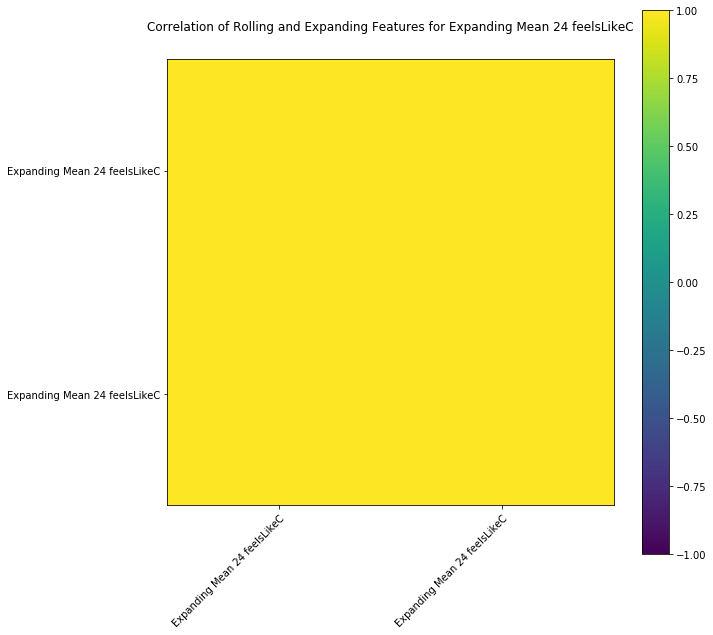

Expanding Min 48 feelsLikeC
Rolling W Done
Expanding Done


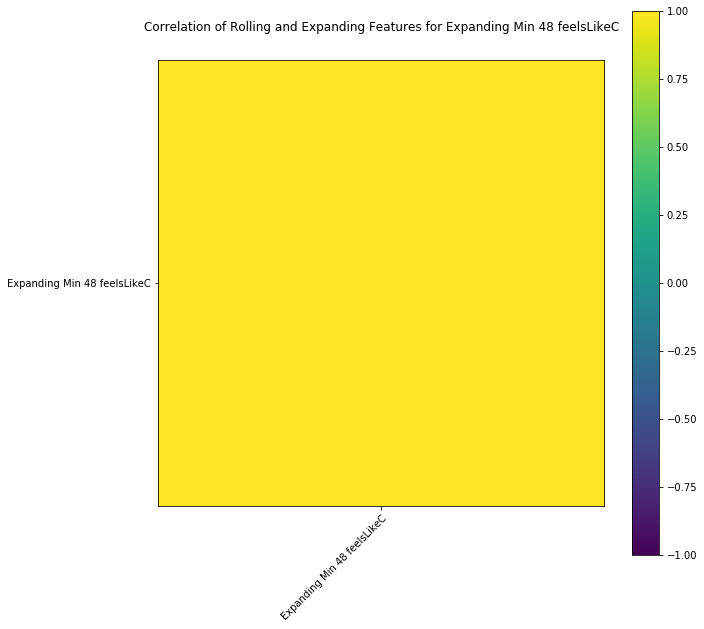

Expanding Max 48 feelsLikeC
Rolling W Done
Expanding Done


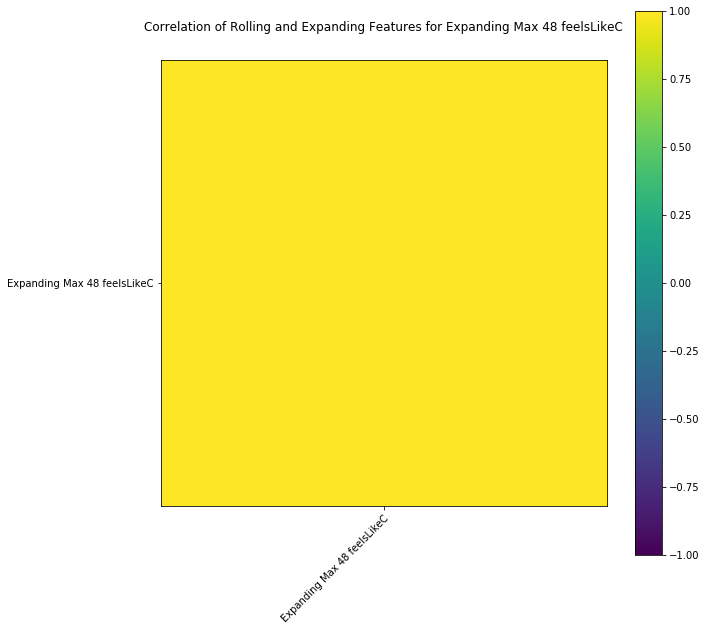

Expanding Sum 48 feelsLikeC
Rolling W Done
Expanding Done


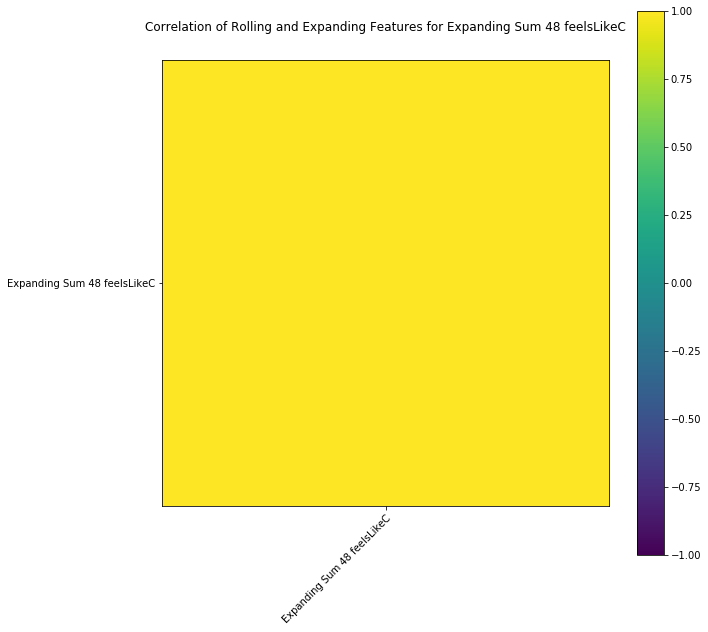

Expanding Mean 48 feelsLikeC
Rolling W Done
Expanding Done


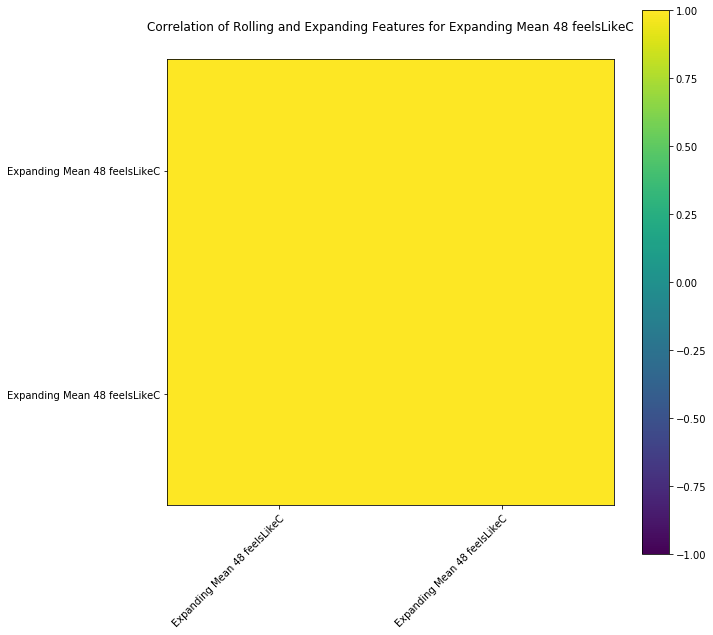

Expanding Min 96 feelsLikeC
Rolling W Done
Expanding Done


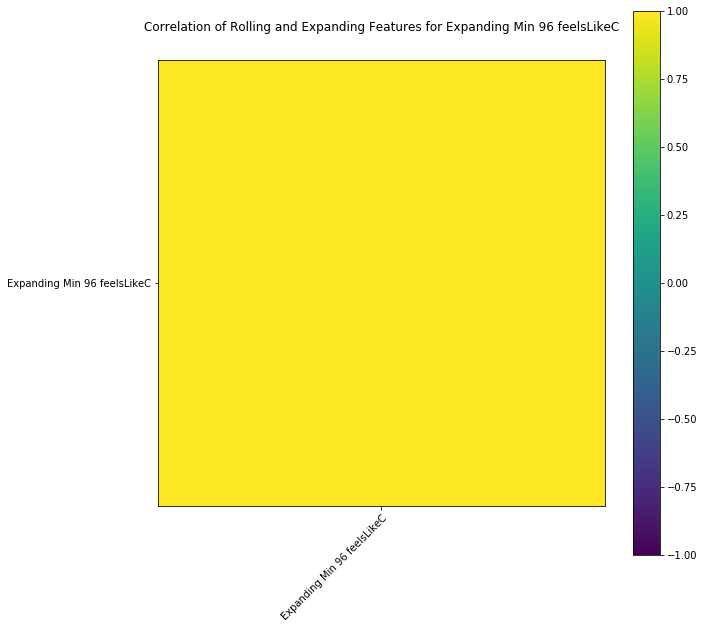

Expanding Max 96 feelsLikeC
Rolling W Done
Expanding Done


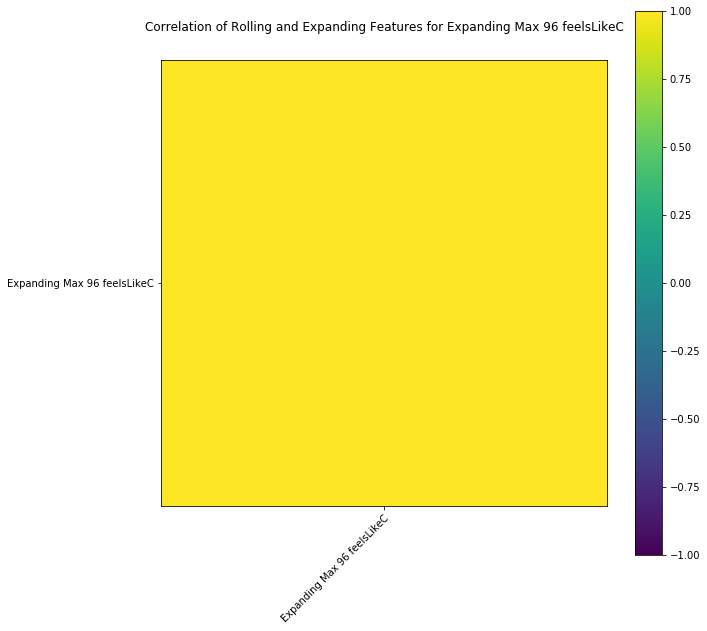

Expanding Sum 96 feelsLikeC
Rolling W Done
Expanding Done


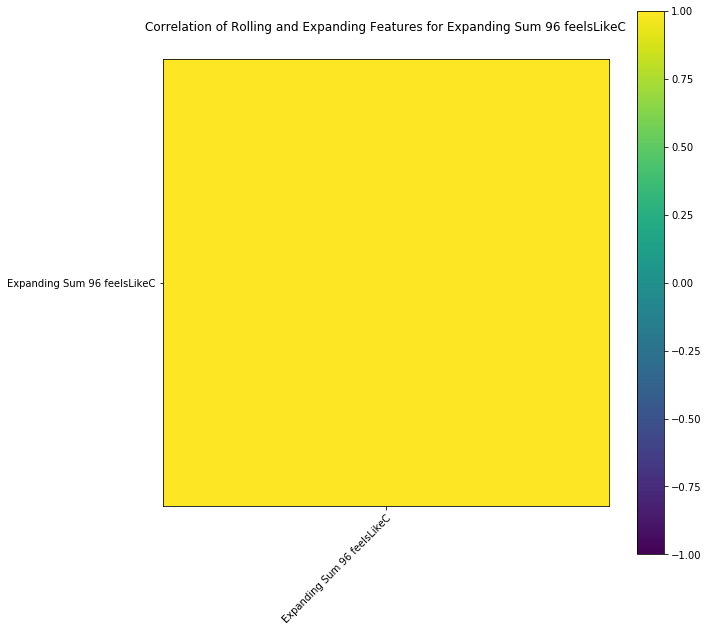

Expanding Mean 96 feelsLikeC
Rolling W Done
Expanding Done


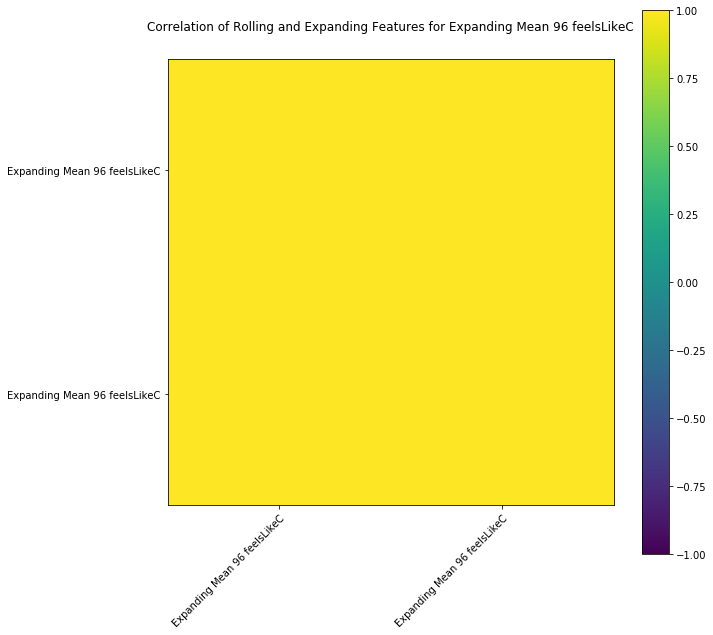

DONE


In [28]:
variables = FEATURES
for variable in variables:
    merge = pd.DataFrame(expanding_merged[variable])
    print(variable)
    features = rolling_weather.columns
    for n in range(3,len(features)):
        if ("mean") in features[n]:
            if variable in features[n]:
                merge = pd.concat([merge, rolling_weather[features[n]]], axis = 1)

    print("Rolling W Done")

    features = expanding_merged.columns
    for n in range(1,len(features)):
        if "Mean" in features[n]:
            if variable in features[n]:
                merge = pd.concat([merge, expanding_merged[features[n]]], axis = 1)

                
#Edited
#     merge = pd.concat([expanding_merged['statusN'], merge], axis = 1)
#     merge = pd.concat([expanding_merged['statusS'], merge], axis = 1)
#######################################################
    print("Expanding Done")
    correlation = merge.corr(method='spearman')
    correlation.to_csv(PATH + "Expanding and Rolling Result\\Correlated_" + variable + "_with_FE.csv", encoding='utf-8', index=False)

    getHeatMap(correlation, "Correlation of Rolling and Expanding Features for " + variable, 10,10, correlation.columns, correlation.columns)
    
#     # plot it
#     fig = plt.figure()
#     ax = fig.add_subplot(111)
#     cax = ax.matshow(correlation, vmin=-1, vmax=1)
#     fig.colorbar(cax)
#     ticks = np.arange(0,len(correlation.columns),1)
#     ax.set_yticks(ticks)
#     ticks = np.arange(0,len(correlation.columns),1)
#     ax.set_xticks(ticks)
#     ax.set_yticklabels(correlation.columns)
#     plt.rcParams["figure.figsize"] = 15,15
#     plt.show()


# WINDOWS = [2,3,4,8,12,24,32,96]


# OG = np.array(correlation["statusN"][1])
# plt.subplot(211)
# plt.legend()
# plt.plot(OG, color='red', linewidth=2, label = "Original Feature", marker='^', markersize=12)
# plt.plot( WINDOWS, correlation["statusN"][2:10], color='blue', linewidth=2, label = "Rolling", marker='o')
# plt.xticks(np.arange(0, 96, step= 4))
# plt.legend()
# plt.title("Correlation of Rolling and Expanding Temperature with Respect to Traffic")

# plt.subplot(212)
# plt.plot(OG, color='red', linewidth=2, label = "Original Feature", marker='^', markersize=12)
# plt.plot( WINDOWS, correlation["statusN"][11:19], color='olive', linewidth=2, label = "Expanding", marker='o')
# plt.xticks(np.arange(0, 96, step= 4))
# plt.legend()


# plt.show()


# # multiple line plot
# plt.plot(OG, color='red', linewidth=2, label = "Original Feature", marker='^', markersize=12)
# plt.plot( WINDOWS, correlation["statusN"][2:10], color='blue', linewidth=2, label = "Rolling", marker='o')
# plt.plot( WINDOWS, correlation["statusN"][11:19], color='olive', linewidth=2, label = "Expanding", marker='o')
# plt.xticks(np.arange(0, 96, step= 4))
# plt.legend()
# plt.title(variable)
# plt.show()


print('DONE')

#### Per Variable - Expanding

## Corr

OG Done
Rolling W Done
Expanding Done


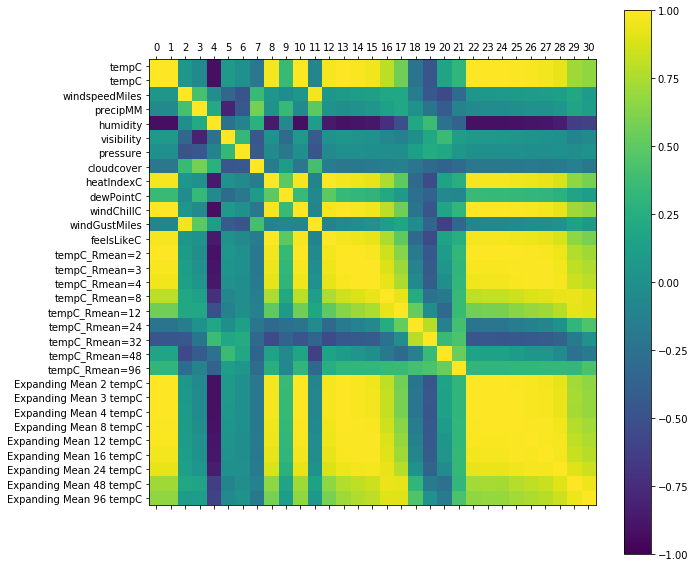

DONE


In [6]:
FEATURES = expanding_merged.columns[1:15]
merged_dataset = pd.DataFrame(expanding_merged[FEATURES[2]])
variable = "tempC"
for n in range(2,len(FEATURES)):
    merged_dataset = pd.concat([merged_dataset, expanding_merged[FEATURES[n]]], axis = 1)
print("OG Done")

FEATURES = rolling_weather.columns
for n in range(3,len(FEATURES)):
    if ("mean") in FEATURES[n]:
        if variable in FEATURES[n]:
            merged_dataset = pd.concat([merged_dataset, rolling_weather[FEATURES[n]]], axis = 1)
        
print("Rolling W Done")
        
FEATURES = expanding_merged.columns
for n in range(1,len(FEATURES)):
    if "Mean" in FEATURES[n]:
        if variable in FEATURES[n]:
            merged_dataset = pd.concat([merged_dataset, expanding_merged[FEATURES[n]]], axis = 1)
        
print("Expanding Done")

correlation = merged_dataset.corr(method='spearman')

# correlation = pd.concat([correlation,FEATURES], axis = 1)
correlation.to_csv(PATH + "Expanding and Rolling Result\\Correlated_tempC_only.csv", encoding='utf-8', index=False)


# plot it
fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(correlation, vmin=-1, vmax=1)
fig.colorbar(cax)
ticks = np.arange(0,len(correlation.columns),1)
ax.set_yticks(ticks)
ticks = np.arange(0,len(correlation.columns),1)
ax.set_xticks(ticks)
ax.set_yticklabels(correlation.columns)
plt.rcParams["figure.figsize"] = 10,10
plt.show()



print('DONE')

Rolling W Done
Expanding Done


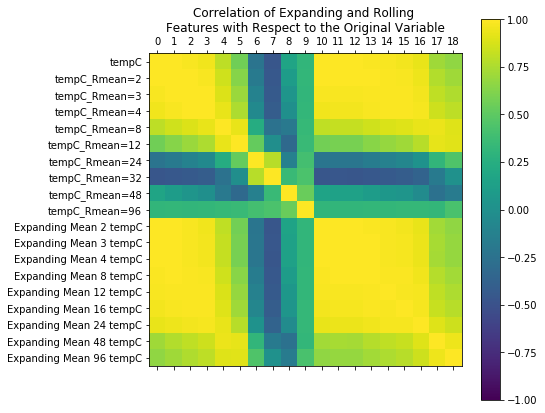

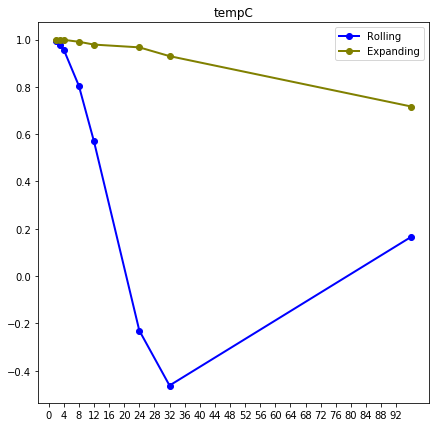

DONE


In [73]:
FEATURES = expanding_merged.columns[1:15]
variable = "tempC"
merged_dataset = pd.DataFrame(expanding_merged[variable])

# for n in range(2,len(FEATURES)):
#     merged_dataset = pd.concat([merged_dataset, expanding_merged[FEATURES[n]]], axis = 1)
# print("OG Done")

FEATURES = rolling_weather.columns
for n in range(3,len(FEATURES)):
    if ("mean") in FEATURES[n]:
        if variable in FEATURES[n]:
            merged_dataset = pd.concat([merged_dataset, rolling_weather[FEATURES[n]]], axis = 1)
        
print("Rolling W Done")
        
FEATURES = expanding_merged.columns
for n in range(1,len(FEATURES)):
    if "Mean" in FEATURES[n]:
        if variable in FEATURES[n]:
            merged_dataset = pd.concat([merged_dataset, expanding_merged[FEATURES[n]]], axis = 1)
        
print("Expanding Done")

correlation = merged_dataset.corr(method='spearman')

# correlation = pd.concat([correlation,FEATURES], axis = 1)
correlation.to_csv(PATH + "Expanding and Rolling Result\\Correlated_" + variable + "_only.csv", encoding='utf-8', index=False)


# plot it
fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(correlation, vmin=-1, vmax=1)
fig.colorbar(cax)
ticks = np.arange(0,len(correlation.columns),1)
ax.set_yticks(ticks)
ticks = np.arange(0,len(correlation.columns),1)
ax.set_xticks(ticks)
ax.set_yticklabels(correlation.columns)
plt.rcParams["figure.figsize"] = 7,7
plt.title("Correlation of Expanding and Rolling \nFeatures with Respect to the Original Variable")
plt.show()


WINDOWS = [2,3,4,8,12,24,32,96]

# multiple line plot
plt.plot( WINDOWS, correlation[variable][1:9], color='blue', linewidth=2, label = "Rolling", marker='o')
plt.plot( WINDOWS, correlation[variable][10:18], color='olive', linewidth=2, label = "Expanding", marker='o')
plt.xticks(np.arange(0, 96, step= 4))
plt.legend()
plt.title(variable)
plt.show()


print('DONE')

## Traffic Only

Rolling W Done
Expanding Done


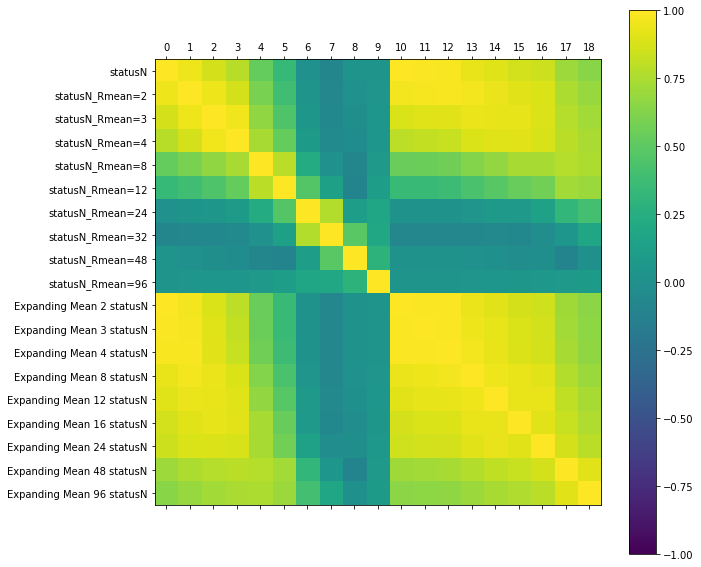

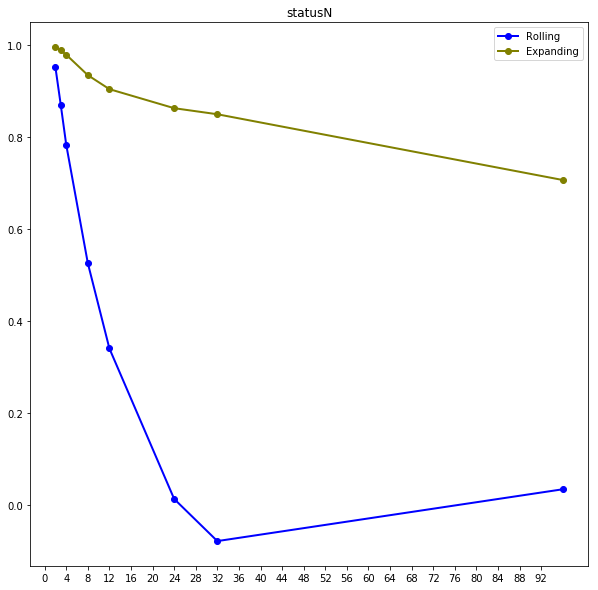

DONE


In [36]:
FEATURES = expanding_merged.columns[1:15]
variable = "statusN"
merged_dataset = pd.DataFrame(expanding_merged[variable])

# for n in range(2,len(FEATURES)):
#     merged_dataset = pd.concat([merged_dataset, expanding_merged[FEATURES[n]]], axis = 1)
# print("OG Done")

FEATURES = rolling_traffic.columns
for n in range(3,len(FEATURES)):
    if ("mean") in FEATURES[n]:
        if variable in FEATURES[n]:
            merged_dataset = pd.concat([merged_dataset, rolling_traffic[FEATURES[n]]], axis = 1)
        
print("Rolling W Done")
        
FEATURES = expanding_merged.columns
for n in range(1,len(FEATURES)):
    if "Mean" in FEATURES[n]:
        if variable in FEATURES[n]:
            merged_dataset = pd.concat([merged_dataset, expanding_merged[FEATURES[n]]], axis = 1)
        
print("Expanding Done")

correlation = merged_dataset.corr(method='spearman')

# correlation = pd.concat([correlation,FEATURES], axis = 1)
correlation.to_csv(PATH + "Expanding and Rolling Result\\Correlated_" + variable + "_only.csv", encoding='utf-8', index=False)


# plot it
fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(correlation, vmin=-1, vmax=1)
fig.colorbar(cax)
ticks = np.arange(0,len(correlation.columns),1)
ax.set_yticks(ticks)
ticks = np.arange(0,len(correlation.columns),1)
ax.set_xticks(ticks)
ax.set_yticklabels(correlation.columns)
plt.rcParams["figure.figsize"] = 10,10
plt.show()


WINDOWS = [2,3,4,8,12,24,32,96]

# multiple line plot
plt.plot( WINDOWS, correlation[variable][1:9], color='blue', linewidth=2, label = "Rolling", marker='o')
plt.plot( WINDOWS, correlation[variable][10:18], color='olive', linewidth=2, label = "Expanding", marker='o')
plt.xticks(np.arange(0, 96, step= 4))
plt.legend()
plt.title(variable)
plt.show()


print('DONE')

## Rolling Only. tempC and windSpeed

Rolling W Done


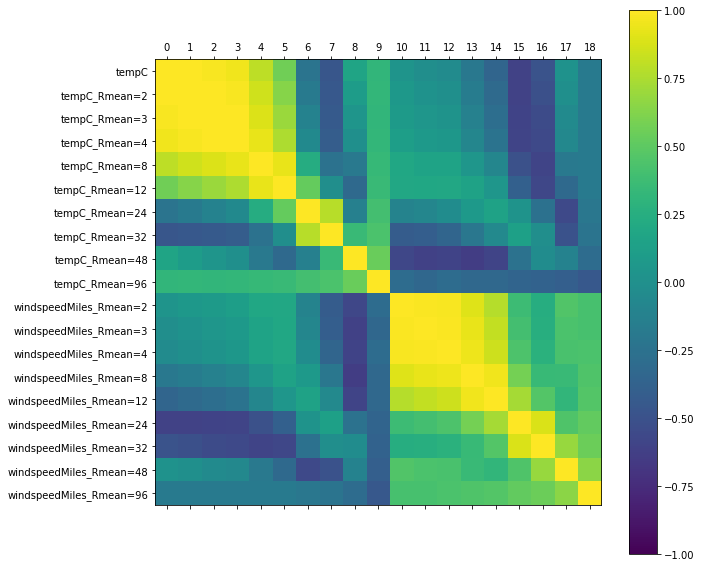

DONE


In [81]:
variable = "windspeedMiles"
# for n in range(2,len(FEATURES)):
#     merged_dataset = pd.concat([merged_dataset, expanding_merged[FEATURES[n]]], axis = 1)
# print("OG Done")

FEATURES = rolling_weather.columns
for n in range(3,len(FEATURES)):
    if ("mean") in FEATURES[n]:
        if variable in FEATURES[n]:
            merged_dataset = pd.concat([merged_dataset, rolling_weather[FEATURES[n]]], axis = 1)
        
print("Rolling W Done")
        
# FEATURES = expanding_merged.columns
# for n in range(1,len(FEATURES)):
#     if "Mean" in FEATURES[n]:
#         if variable in FEATURES[n]:
#             merged_dataset = pd.concat([merged_dataset, expanding_merged[FEATURES[n]]], axis = 1)
        
# print("Expanding Done")

correlation = merged_dataset.corr(method='spearman')

# correlation = pd.concat([correlation,FEATURES], axis = 1)
correlation.to_csv(PATH + "Expanding and Rolling Result\\Correlated_tempC_only.csv", encoding='utf-8', index=False)


# plot it
fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(correlation, vmin=-1, vmax=1)
fig.colorbar(cax)
ticks = np.arange(0,len(correlation.columns),1)
ax.set_yticks(ticks)
ticks = np.arange(0,len(correlation.columns),1)
ax.set_xticks(ticks)
ax.set_yticklabels(correlation.columns)
plt.rcParams["figure.figsize"] = 10,10
plt.show()



print('DONE')

## TempC to dewPointC

Rolling W Done


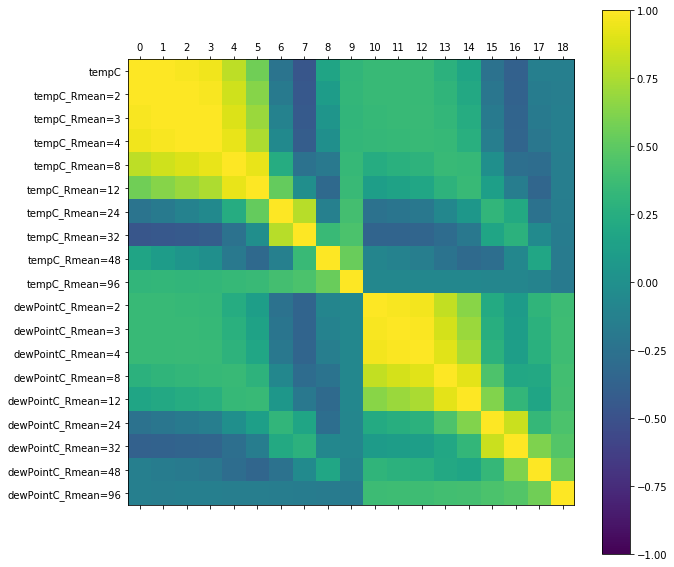

DONE


In [83]:
variable = "dewPointC"
# for n in range(2,len(FEATURES)):
#     merged_dataset = pd.concat([merged_dataset, expanding_merged[FEATURES[n]]], axis = 1)
# print("OG Done")

FEATURES = rolling_weather.columns
for n in range(3,len(FEATURES)):
    if ("mean") in FEATURES[n]:
        if variable in FEATURES[n]:
            merged_dataset = pd.concat([merged_dataset, rolling_weather[FEATURES[n]]], axis = 1)
        
print("Rolling W Done")
        
# FEATURES = expanding_merged.columns
# for n in range(1,len(FEATURES)):
#     if "Mean" in FEATURES[n]:
#         if variable in FEATURES[n]:
#             merged_dataset = pd.concat([merged_dataset, expanding_merged[FEATURES[n]]], axis = 1)
        
# print("Expanding Done")

correlation = merged_dataset.corr(method='spearman')

# correlation = pd.concat([correlation,FEATURES], axis = 1)
correlation.to_csv(PATH + "Expanding and Rolling Result\\Correlated_tempC_only.csv", encoding='utf-8', index=False)


# plot it
fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(correlation, vmin=-1, vmax=1)
fig.colorbar(cax)
ticks = np.arange(0,len(correlation.columns),1)
ax.set_yticks(ticks)
ticks = np.arange(0,len(correlation.columns),1)
ax.set_xticks(ticks)
ax.set_yticklabels(correlation.columns)
plt.rcParams["figure.figsize"] = 10,10
plt.show()



print('DONE')

## dewPointC to windSpeedMiles

In [ ]:
FEATURES = expanding_merged.columns[1:15]
merged_dataset = pd.DataFrame(expanding_merged[FEATURES[2]])
variable = "windspeedMiles"
# for n in range(2,len(FEATURES)):
#     merged_dataset = pd.concat([merged_dataset, expanding_merged[FEATURES[n]]], axis = 1)
# print("OG Done")

FEATURES = rolling_weather.columns
for n in range(3,len(FEATURES)):
    if ("mean") in FEATURES[n]:
        if variable in FEATURES[n]:
            merged_dataset = pd.concat([merged_dataset, rolling_weather[FEATURES[n]]], axis = 1)
        
print("Rolling W Done")
        
# FEATURES = expanding_merged.columns
# for n in range(1,len(FEATURES)):
#     if "Mean" in FEATURES[n]:
#         if variable in FEATURES[n]:
#             merged_dataset = pd.concat([merged_dataset, expanding_merged[FEATURES[n]]], axis = 1)
        
# print("Expanding Done")

correlation = merged_dataset.corr(method='spearman')

# correlation = pd.concat([correlation,FEATURES], axis = 1)
correlation.to_csv(PATH + "Expanding and Rolling Result\\Correlated_tempC_only.csv", encoding='utf-8', index=False)


variable = "dewPointC"
# for n in range(2,len(FEATURES)):
#     merged_dataset = pd.concat([merged_dataset, expanding_merged[FEATURES[n]]], axis = 1)
# print("OG Done")

FEATURES = rolling_weather.columns
for n in range(3,len(FEATURES)):
    if ("mean") in FEATURES[n]:
        if variable in FEATURES[n]:
            merged_dataset = pd.concat([merged_dataset, rolling_weather[FEATURES[n]]], axis = 1)
        
print("Rolling W Done")
        
# FEATURES = expanding_merged.columns
# for n in range(1,len(FEATURES)):
#     if "Mean" in FEATURES[n]:
#         if variable in FEATURES[n]:
#             merged_dataset = pd.concat([merged_dataset, expanding_merged[FEATURES[n]]], axis = 1)
        
# print("Expanding Done")

correlation = merged_dataset.corr(method='spearman')

# correlation = pd.concat([correlation,FEATURES], axis = 1)
correlation.to_csv(PATH + "Expanding and Rolling Result\\Correlated_tempC_only.csv", encoding='utf-8', index=False)


# plot it
fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(correlation, vmin=-1, vmax=1)
fig.colorbar(cax)
ticks = np.arange(0,len(correlation.columns),1)
ax.set_yticks(ticks)
ticks = np.arange(0,len(correlation.columns),1)
ax.set_xticks(ticks)
ax.set_yticklabels(correlation.columns)
plt.rcParams["figure.figsize"] = 10,10
plt.show()



print('DONE')



print('DONE')

## Relationship of Traffic to Orig and FE per Variable


Rolling W Done
Expanding Done


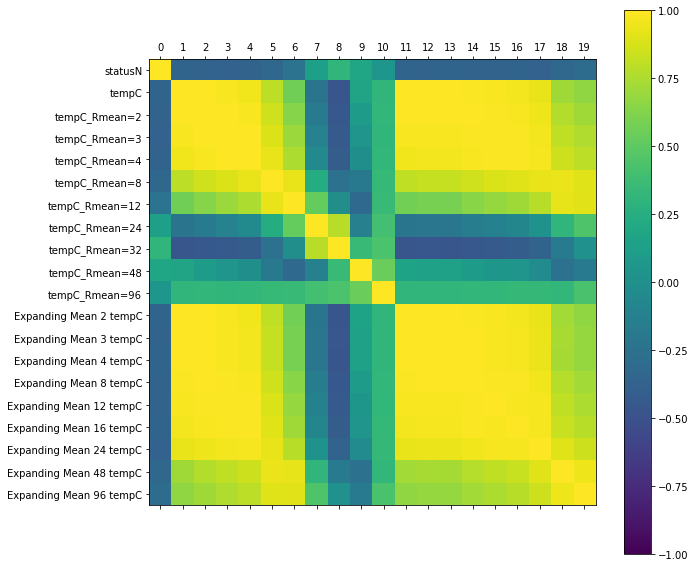

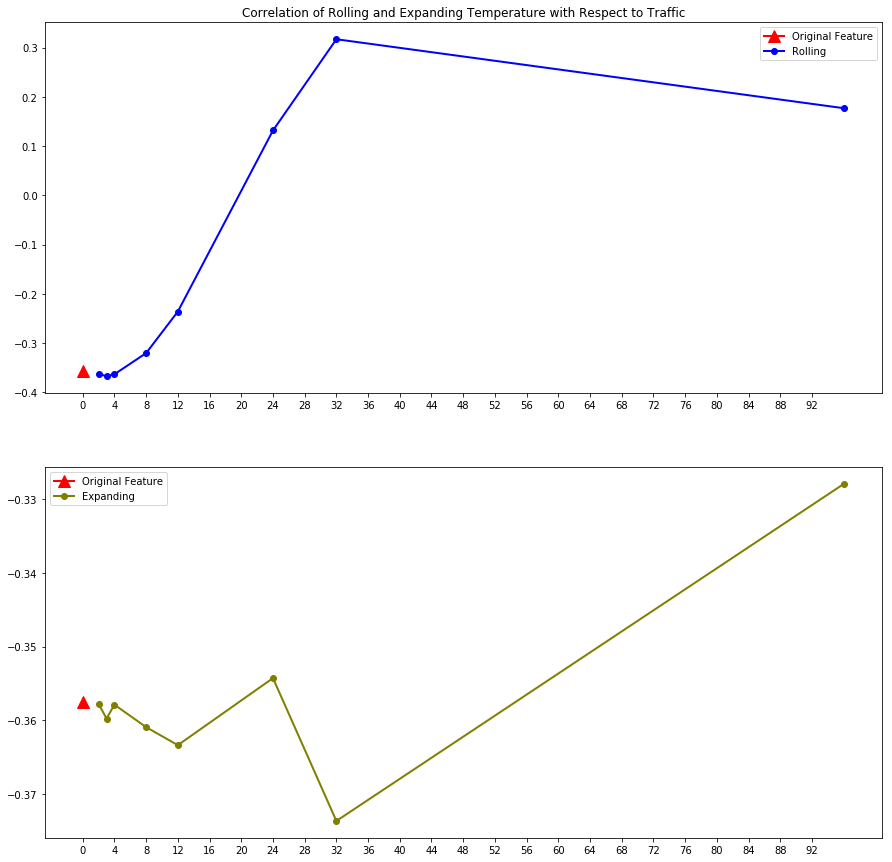

DONE


In [68]:
FEATURES = expanding_merged.columns[1:15]
variable = "tempC"
merged_dataset = pd.DataFrame(expanding_merged["statusN"])
merged_dataset = pd.concat([merged_dataset, expanding_merged[variable]], axis = 1)
# for n in range(2,len(FEATURES)):
#     merged_dataset = pd.concat([merged_dataset, expanding_merged[FEATURES[n]]], axis = 1)
# print("OG Done")

FEATURES = rolling_weather.columns
for n in range(3,len(FEATURES)):
    if ("mean") in FEATURES[n]:
        if variable in FEATURES[n]:
            merged_dataset = pd.concat([merged_dataset, rolling_weather[FEATURES[n]]], axis = 1)
        
print("Rolling W Done")
        
FEATURES = expanding_merged.columns
for n in range(1,len(FEATURES)):
    if "Mean" in FEATURES[n]:
        if variable in FEATURES[n]:
            merged_dataset = pd.concat([merged_dataset, expanding_merged[FEATURES[n]]], axis = 1)
        
print("Expanding Done")

correlation = merged_dataset.corr(method='spearman')

# correlation = pd.concat([correlation,FEATURES], axis = 1)
correlation.to_csv(PATH + "Expanding and Rolling Result\\Correlated_" + variable + "_with_Traffic.csv", encoding='utf-8', index=False)


# plot it
fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(correlation, vmin=-1, vmax=1)
fig.colorbar(cax)
ticks = np.arange(0,len(correlation.columns),1)
ax.set_yticks(ticks)
ticks = np.arange(0,len(correlation.columns),1)
ax.set_xticks(ticks)
ax.set_yticklabels(correlation.columns)
plt.rcParams["figure.figsize"] = 15,15
plt.show()


WINDOWS = [2,3,4,8,12,24,32,96]


OG = np.array(correlation["statusN"][1])
plt.subplot(211)
plt.legend()
plt.plot(OG, color='red', linewidth=2, label = "Original Feature", marker='^', markersize=12)
plt.plot( WINDOWS, correlation["statusN"][2:10], color='blue', linewidth=2, label = "Rolling", marker='o')
plt.xticks(np.arange(0, 96, step= 4))
plt.legend()
plt.title("Correlation of Rolling and Expanding Temperature with Respect to Traffic")

plt.subplot(212)
plt.plot(OG, color='red', linewidth=2, label = "Original Feature", marker='^', markersize=12)
plt.plot( WINDOWS, correlation["statusN"][11:19], color='olive', linewidth=2, label = "Expanding", marker='o')
plt.xticks(np.arange(0, 96, step= 4))
plt.legend()


plt.show()


# # multiple line plot
# plt.plot(OG, color='red', linewidth=2, label = "Original Feature", marker='^', markersize=12)
# plt.plot( WINDOWS, correlation["statusN"][2:10], color='blue', linewidth=2, label = "Rolling", marker='o')
# plt.plot( WINDOWS, correlation["statusN"][11:19], color='olive', linewidth=2, label = "Expanding", marker='o')
# plt.xticks(np.arange(0, 96, step= 4))
# plt.legend()
# plt.title(variable)
# plt.show()


print('DONE')

### OG Traffic to Rolling Expanding Traffic

Rolling W Done
Expanding Done


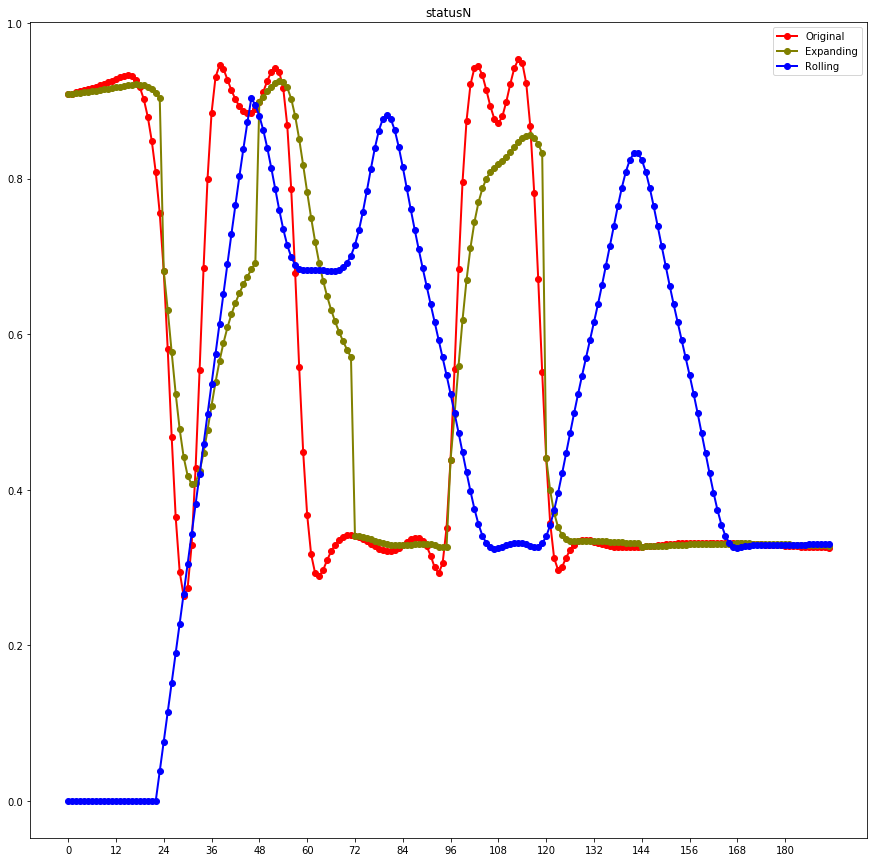

DONE


In [22]:
FEATURES = expanding_merged.columns[1:15]
variable = "statusN"
merged_dataset = pd.DataFrame(expanding_merged["statusN"])
# merged_dataset = pd.concat([merged_dataset, expanding_merged[variable]], axis = 1)
# for n in range(2,len(FEATURES)):
#     merged_dataset = pd.concat([merged_dataset, expanding_merged[FEATURES[n]]], axis = 1)
# print("OG Done")

FEATURES = rolling_traffic.columns
for n in range(3,len(FEATURES)):
    if ("mean") in FEATURES[n]:
        if variable in FEATURES[n]:
            merged_dataset = pd.concat([merged_dataset, rolling_traffic[FEATURES[n]]], axis = 1)
        
print("Rolling W Done")
        
FEATURES = expanding_merged.columns
for n in range(1,len(FEATURES)):
    if "Mean" in FEATURES[n]:
        if variable in FEATURES[n]:
            merged_dataset = pd.concat([merged_dataset, expanding_merged[FEATURES[n]]], axis = 1)
        
print("Expanding Done")

correlation = merged_dataset.corr(method='spearman')
# print(correlation.head())
# correlation = pd.concat([correlation,FEATURES], axis = 1)
correlation.to_csv(PATH + "Expanding and Rolling Result\\Correlated_" + variable + "_with_Traffic.csv", encoding='utf-8', index=False)


# # plot it
# fig = plt.figure()
# ax = fig.add_subplot(111)
# cax = ax.matshow(correlation, vmin=-1, vmax=1)
# fig.colorbar(cax)
# ticks = np.arange(0,len(correlation.columns),1)
# ax.set_yticks(ticks)
# ticks = np.arange(0,len(correlation.columns),1)
# ax.set_xticks(ticks)
# ax.set_yticklabels(correlation.columns)
# plt.rcParams["figure.figsize"] = 15,15
# plt.show()


WINDOWS = [2,3,4,8,12,24,32,96]


OG = np.array(correlation["statusN"][1])

# plt.subplot(211)
# plt.legend()
# plt.plot(OG, color='red', linewidth=2, label = "Original Feature", marker='^', markersize=12)
# plt.plot( WINDOWS, correlation["statusN"][2:10], color='blue', linewidth=2, label = "Rolling", marker='o')
# plt.xticks(np.arange(0, 96, step= 4))
# plt.legend()
# plt.title("Correlation of Rolling and Expanding StatusN with Respect to StatusN")

# plt.subplot(212)
# plt.plot(OG, color='red', linewidth=2, label = "Original Feature", marker='^', markersize=12)
# plt.plot( WINDOWS, correlation["statusN"][11:19], color='olive', linewidth=2, label = "Expanding", marker='o')
# plt.xticks(np.arange(0, 96, step= 4))
# plt.legend()


# plt.show()


# multiple line plot
plt.plot( merged_dataset["statusN"][0:192], color='red', linewidth=2, label = "Original", marker='o')
plt.plot( merged_dataset["Expanding Mean 24 statusN"][0:192], color='olive', linewidth=2, label = "Expanding", marker='o')
plt.plot( merged_dataset["statusN_Rmean=24"][0:192], color='blue', linewidth=2, label = "Rolling", marker='o')
plt.xticks(np.arange(0, 192, step= 12))
plt.legend()
plt.title(variable)
plt.show()


# # multiple line plot
# plt.plot(OG, color='red', linewidth=2, label = "Original Feature", marker='^', markersize=12)
# plt.plot( WINDOWS, correlation["statusN"][2:10], color='blue', linewidth=2, label = "Rolling", marker='o')
# plt.plot( WINDOWS, correlation["statusN"][11:19], color='olive', linewidth=2, label = "Expanding", marker='o')
# plt.xticks(np.arange(0, 96, step= 4))
# plt.legend()
# plt.title(variable)
# plt.show()


print('DONE')